In [ ]:
from google.colab import drive

# Mount your Google Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import torch
import torch.nn as n
import torch.nn.functional as f
import numpy as np
import os
from torchsummary import summary
import torch.optim as optim
from tqdm import tqdm
from torchvision import models
import cv2
from matplotlib import pyplot as plt
from PIL import Image

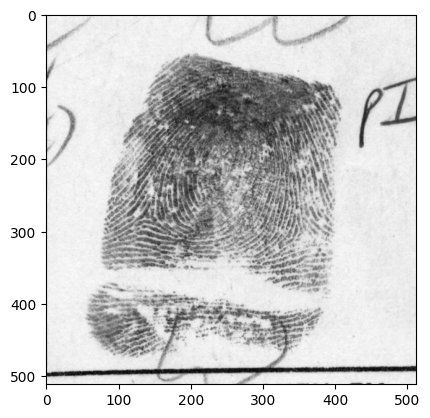

In [ ]:
import cv2
import os
datadir = '/content/drive/MyDrive/Roll_folder_512_final'
# iterating over just one element
for img in os.listdir(datadir):
        img_array = cv2.imread(os.path.join(datadir,img) ,cv2.IMREAD_GRAYSCALE)  # convert to array
        plt.imshow(img_array, cmap='gray')  # graph it
        plt.show()  # display!

        break  # we just want one for now so break

In [ ]:
#generalising this technique for all other images
array = []
array_small =[]
from tqdm import tqdm
high_img_path='/content/drive/MyDrive/Roll_folder_512_final'
low_img_path='/content/drive/MyDrive/Roll_256_damage_final'

def create_training_data():
        for img in tqdm(list(os.listdir(high_img_path)[:1000])):  # iterate over each image per dogs and cats
            try:
                img_high_array = cv2.imread(high_img_path+'/'+img ,cv2.IMREAD_COLOR)  # convert to array
                img_high_array = cv2.resize(img_high_array, (256, 256))
                img_low_array = cv2.imread(low_img_path+'/'+img ,cv2.IMREAD_COLOR)  # resize to normalize data size
                array.append([img_high_array])
                img_low_array = cv2.resize(img_low_array, (128,128))
                # Combine the folder and file name to get the full path
                save_path = os.path.join('/content/drive/MyDrive/Testing_Without_THR_SRGAN/128SizeImage/', img)

                # Save the resized image
                cv2.imwrite(save_path, img_low_array)
                array_small.append([img_low_array]) # add this to our training_data

            except Exception as e:  # in the interest in keeping the output clean...
                pass
create_training_data()

100%|██████████| 1000/1000 [47:01<00:00,  2.82s/it]


In [ ]:
len(array)

1000

In [ ]:
files=list(os.listdir(high_img_path)[:1000])

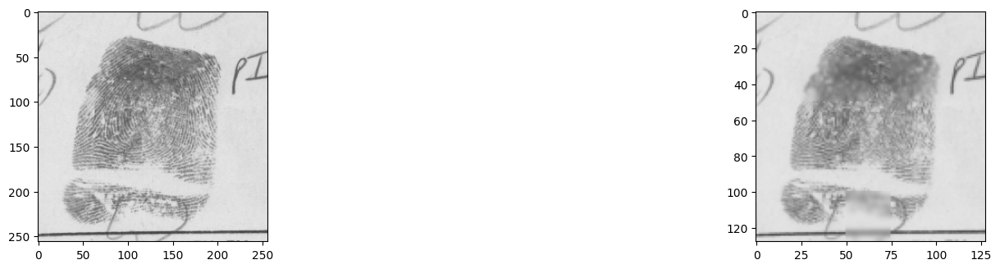

In [ ]:
X =  []
Xs = []
for features in array:
    X.append(features)
for features in array_small:
    Xs.append(features)
plt.figure(figsize=(16, 8))
X = np.array(X).reshape(-1, 256, 256, 3)
Xs = np.array(Xs).reshape(-1, 128, 128, 3)
plt.subplot(231)
plt.imshow(X[0], cmap = 'gray')
plt.subplot(233)
plt.imshow(Xs[0], cmap = 'gray')
plt.show()

In [ ]:
X_train

NameError: ignored

In [ ]:

X_train = Xs[0:800]
y_train = X[0:800]

X_valid = Xs[800:900]
y_valid =  X[800:900]


X_test = Xs[900:]
y_test = X[900:]



In [ ]:
X_train.shape

(800, 128, 128, 3)

In [ ]:
import tensorflow as tf
import cv2
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras import layers, Model
from sklearn.model_selection import train_test_split

import numpy as np
from keras import Model
from keras.layers import Conv2D, PReLU,BatchNormalization, Flatten
from keras.layers import UpSampling2D, LeakyReLU, Dense, Input, add
from tqdm import tqdm


#code for building generator


def res_block(input_dim):
    model = Conv2D(64, (3,3), padding = 'same' )(input_dim)
    model = BatchNormalization()(model)
    model = PReLU(shared_axes = [1,2])(model)
    model = Conv2D(64, (3,3), padding = 'same' )(model)
    model = BatchNormalization()(model)
    return add([input_dim, model])
def upscale_block(input_dim):
    model = Conv2D(256,(3,3), strides=1, padding = 'same')(input_dim)
    model = UpSampling2D(size = (2,2))(model)
    model = PReLU(shared_axes=[1, 2])(model)
    return model
def generator(input, res_range = 1,upscale_range=1):
    model = Conv2D(64,(9,9), strides=1, padding = 'same')(input)
    model = PReLU(shared_axes = [1,2])(model)
    model1 = model
    for i in range(res_range):
        model = res_block(model)
    model = Conv2D(64, (3,3), padding = 'same' )(model)
    model = BatchNormalization()(model)
    model = add([model,model1])
    for i in range(upscale_range):
        model  =upscale_block(model)
    output = Conv2D(3, (9,9),  padding='same')(model)
    return Model(input, output)


#code for building discriminator
def discrim_block(input_dim, fmaps = 64, strides = 1):
    model = Conv2D(fmaps, (3,3), padding = 'same', strides  = strides)(input_dim)
    model = BatchNormalization()(model)
    model = LeakyReLU()(model)
    return model
def discriminator(input):
    model = Conv2D(64,(3,3),padding='same')(input)
    model = LeakyReLU()(model)
    model = discrim_block(model, strides = 2)
    model = discrim_block(model, fmaps  = 128)
    model = discrim_block(model, fmaps = 128, strides = 2)
    model = discrim_block(model, fmaps=256)
    model = discrim_block(model, fmaps=256, strides=2)
    model = discrim_block(model, fmaps=512)
    model = discrim_block(model, fmaps=512, strides=2)
    model = Flatten()(model)
    model = Dense(1024)(model)
    model = LeakyReLU(alpha = 0.2)(model)
    out = Dense(1, activation='sigmoid')(model)
    return Model(input, out)

#introducing vgg19 layer
from tensorflow.keras.applications.vgg19 import VGG19
def build_vgg(hr_shape):
    vgg = VGG19(weights="imagenet", include_top=False, input_shape=hr_shape)

    return Model(inputs=vgg.inputs, outputs=vgg.layers[10].output)


# Combined model
def create_comb(gen_model, disc_model, vgg, lr_ip, hr_ip):
    gen_img = gen_model(lr_ip)

    gen_features = vgg(gen_img)

    disc_model.trainable = False
    validity = disc_model(gen_img)

    return Model(inputs=[lr_ip, hr_ip], outputs=[validity, gen_features])


In [ ]:
from keras.layers import Input, Conv2D, BatchNormalization, PReLU, add, UpSampling2D, LeakyReLU, Flatten, Dense
from keras.models import Model
from tensorflow.keras.applications.vgg19 import VGG19

import numpy as np
from keras.layers import Input, Conv2D, BatchNormalization, PReLU, add, UpSampling2D, LeakyReLU, Flatten, Dense
from keras.models import Model
from tensorflow.keras.applications.vgg19 import VGG19
from keras.optimizers import Adam
from keras.losses import binary_crossentropy, mean_squared_error

In [ ]:
hr_shape = (y_train.shape[1], y_train.shape[2], y_train.shape[3])
lr_shape = (X_train.shape[1], X_train.shape[2], X_train.shape[3])

print("hr_shape",hr_shape)
print("lr_shape",lr_shape)

lr_ip = Input(shape=lr_shape)
hr_ip = Input(shape=hr_shape)

generator = generator(lr_ip, res_range = 16, upscale_range=1)
generator.summary()

discriminator = discriminator(hr_ip)
discriminator.compile(loss="binary_crossentropy", optimizer="adam", metrics=['accuracy'])
discriminator.summary()

vgg = build_vgg((256,256,3))
print(vgg.summary())
vgg.trainable = False

gan_model = create_comb(generator, discriminator, vgg, lr_ip, hr_ip)

hr_shape (256, 256, 3)
lr_shape (128, 128, 3)
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 128, 128, 64)         15616     ['input_1[0][0]']             
                                                                                                  
 p_re_lu (PReLU)             (None, 128, 128, 64)         64        ['conv2d[0][0]']              
                                                                                                  
 conv2d_1 (Conv2D)           (None, 128, 128, 64)         36928     ['p_re_lu[0][0]']             
                                                

In [ ]:
gan_model.compile(loss=["binary_crossentropy", "mse"], loss_weights=[1e-3, 1], optimizer="adam")
gan_model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 model (Functional)          (None, 256, 256, 3)          1453955   ['input_1[0][0]']             
                                                                                                  
 input_2 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 model_1 (Functional)        (None, 1)                    1389125   ['model[0][0]']               
                                                          77                                

In [ ]:
batch_size = 1
train_lr_batches = []
train_hr_batches = []
for it in range(int(y_train.shape[0] / batch_size)):
    start_idx = it * batch_size
    end_idx = start_idx + batch_size
    train_hr_batches.append(y_train[start_idx:end_idx])
    train_lr_batches.append(X_train[start_idx:end_idx])

In [ ]:
def data_generator(train_lr_batches, train_hr_batches, batch_size):
    while True:
        for b in range(len(train_lr_batches)):
            lr_imgs = train_lr_batches[b]
            hr_imgs = train_hr_batches[b]
            yield (lr_imgs, hr_imgs)

In [ ]:
epochs = 10

In [ ]:

#Enumerate training over epochs
for e in range(epochs):

    fake_label = np.zeros((batch_size, 1)) # Assign a label of 0 to all fake (generated images)
    real_label = np.ones((batch_size,1)) # Assign a label of 1 to all real images.

    #Create empty lists to populate gen and disc losses.
    g_losses = []
    d_losses = []

    #Enumerate training over batches.
    for b in tqdm(range(len(train_hr_batches))):
        lr_imgs = train_lr_batches[b] #Fetch a batch of LR images for training
        hr_imgs = train_hr_batches[b] #Fetch a batch of HR images for training

        fake_imgs = generator.predict_on_batch(lr_imgs) #Fake images

        #First, train the discriminator on fake and real HR images.
        discriminator.trainable = True
        d_loss_gen = discriminator.train_on_batch(fake_imgs, fake_label)
        d_loss_real = discriminator.train_on_batch(hr_imgs, real_label)

        #Now, train the generator by fixing discriminator as non-trainable
        discriminator.trainable = False

        #Average the discriminator loss, just for reporting purposes.
        d_loss = 0.5 * np.add(d_loss_gen, d_loss_real)

        #Extract VGG features, to be used towards calculating loss
        image_features = vgg.predict(hr_imgs)

        #Train the generator via GAN.
        #Remember that we have 2 losses, adversarial loss and content (VGG) loss
        g_loss, _, _ = gan_model.train_on_batch([lr_imgs, hr_imgs], [real_label, image_features])

        #Save losses to a list so we can average and report.
        d_losses.append(d_loss)
        g_losses.append(g_loss)

    #Convert the list of losses to an array to make it easy to average
    g_losses = np.array(g_losses)
    d_losses = np.array(d_losses)

    #Calculate the average losses for generator and discriminator
    g_loss = np.sum(g_losses, axis=0) / len(g_losses)
    d_loss = np.sum(d_losses, axis=0) / len(d_losses)

    #Report the progress during training.
    print("epoch:", e+1 ,"g_loss:", g_loss, "d_loss:", d_loss)

    if (e+1) % 10 == 0: #Change the frequency for model saving, if needed
        #Save the generator after every n epochs (Usually 10 epochs)
        generator.save("gen_e_"+ str(e+1) +".h5")


  0%|          | 0/800 [00:00<?, ?it/s]

1/1 [==============================] - 0s 374ms/step


  0%|          | 1/800 [00:39<8:49:33, 39.77s/it]

1/1 [==============================] - 0s 19ms/step


  0%|          | 2/800 [00:40<3:40:55, 16.61s/it]

1/1 [==============================] - 0s 19ms/step


  0%|          | 3/800 [00:40<2:01:58,  9.18s/it]

1/1 [==============================] - 0s 18ms/step


  0%|          | 4/800 [00:40<1:15:29,  5.69s/it]

1/1 [==============================] - 0s 17ms/step


  1%|          | 5/800 [00:41<49:49,  3.76s/it]  

1/1 [==============================] - 0s 19ms/step


  1%|          | 6/800 [00:41<34:21,  2.60s/it]

1/1 [==============================] - 0s 18ms/step


  1%|          | 7/800 [00:41<24:33,  1.86s/it]

1/1 [==============================] - 0s 18ms/step


  1%|          | 8/800 [00:42<18:05,  1.37s/it]

1/1 [==============================] - 0s 18ms/step


  1%|          | 9/800 [00:42<13:47,  1.05s/it]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 10/800 [00:42<10:52,  1.21it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 11/800 [00:43<08:53,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 12/800 [00:43<07:30,  1.75it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 13/800 [00:43<06:34,  1.99it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 14/800 [00:44<05:55,  2.21it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 15/800 [00:44<05:27,  2.40it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 16/800 [00:44<05:07,  2.55it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 17/800 [00:45<04:53,  2.67it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 18/800 [00:45<04:44,  2.75it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 19/800 [00:45<04:38,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▎         | 20/800 [00:46<04:32,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 21/800 [00:46<04:29,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 22/800 [00:46<04:28,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 23/800 [00:47<04:27,  2.90it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 24/800 [00:47<04:28,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 25/800 [00:47<04:26,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 26/800 [00:48<04:25,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 27/800 [00:48<04:24,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 28/800 [00:48<04:28,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 29/800 [00:49<04:26,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 30/800 [00:49<04:24,  2.91it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 31/800 [00:49<04:24,  2.91it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 32/800 [00:50<04:22,  2.92it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 33/800 [00:50<04:20,  2.94it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 34/800 [00:51<04:19,  2.95it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 35/800 [00:51<04:18,  2.96it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 36/800 [00:51<04:19,  2.94it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 37/800 [00:52<04:18,  2.95it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 38/800 [00:52<04:19,  2.94it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 39/800 [00:52<04:17,  2.96it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 40/800 [00:53<04:16,  2.96it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 41/800 [00:53<04:19,  2.92it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 42/800 [00:53<04:20,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 43/800 [00:54<04:19,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 44/800 [00:54<04:17,  2.94it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 45/800 [00:54<04:17,  2.94it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 46/800 [00:55<04:16,  2.94it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 47/800 [00:55<04:15,  2.94it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 48/800 [00:55<04:15,  2.95it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 49/800 [00:56<04:15,  2.94it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 50/800 [00:56<04:15,  2.94it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 51/800 [00:56<04:14,  2.94it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 52/800 [00:57<04:14,  2.94it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 53/800 [00:57<04:12,  2.95it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 54/800 [00:57<04:12,  2.96it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 55/800 [00:58<04:11,  2.97it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 56/800 [00:58<04:10,  2.97it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 57/800 [00:58<04:09,  2.98it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 58/800 [00:59<04:10,  2.97it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 59/800 [00:59<04:11,  2.95it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 60/800 [00:59<04:11,  2.95it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 61/800 [01:00<04:10,  2.94it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 62/800 [01:00<04:10,  2.94it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 63/800 [01:00<04:10,  2.94it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 64/800 [01:01<04:09,  2.95it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 65/800 [01:01<04:09,  2.94it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 66/800 [01:01<04:09,  2.94it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 67/800 [01:02<04:09,  2.93it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 68/800 [01:02<04:10,  2.92it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 69/800 [01:02<04:10,  2.92it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 70/800 [01:03<04:10,  2.92it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 71/800 [01:03<04:11,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 72/800 [01:03<04:10,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 73/800 [01:04<04:09,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 74/800 [01:04<04:08,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 75/800 [01:04<04:07,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 76/800 [01:05<04:06,  2.93it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 77/800 [01:05<04:07,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 78/800 [01:05<04:06,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 79/800 [01:06<04:06,  2.93it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 80/800 [01:06<04:04,  2.94it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 81/800 [01:07<04:05,  2.93it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 82/800 [01:07<04:04,  2.93it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 83/800 [01:07<04:05,  2.93it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 84/800 [01:08<04:04,  2.93it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 85/800 [01:08<04:02,  2.94it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 86/800 [01:08<04:02,  2.94it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 87/800 [01:09<04:01,  2.95it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 88/800 [01:09<04:00,  2.96it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 89/800 [01:09<04:00,  2.95it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█▏        | 90/800 [01:10<04:00,  2.95it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█▏        | 91/800 [01:10<03:59,  2.95it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 92/800 [01:10<03:59,  2.96it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 93/800 [01:11<03:58,  2.96it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 94/800 [01:11<03:58,  2.96it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 95/800 [01:11<03:59,  2.95it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 96/800 [01:12<03:59,  2.94it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 97/800 [01:12<03:58,  2.95it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 98/800 [01:12<03:58,  2.95it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 99/800 [01:13<03:57,  2.95it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▎        | 100/800 [01:13<03:57,  2.94it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 101/800 [01:13<03:58,  2.93it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 102/800 [01:14<03:59,  2.92it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 103/800 [01:14<04:00,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 104/800 [01:14<04:01,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 105/800 [01:15<03:59,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 106/800 [01:15<03:58,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 107/800 [01:15<03:57,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▎        | 108/800 [01:16<03:56,  2.92it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 109/800 [01:16<03:56,  2.92it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 110/800 [01:16<03:56,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 111/800 [01:17<03:57,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 112/800 [01:17<03:57,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 113/800 [01:17<03:57,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 114/800 [01:18<03:56,  2.90it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 115/800 [01:18<03:56,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 116/800 [01:18<03:55,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 117/800 [01:19<03:54,  2.92it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 118/800 [01:19<03:54,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 119/800 [01:19<03:54,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 120/800 [01:20<03:54,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 121/800 [01:20<03:53,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 122/800 [01:21<03:52,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 123/800 [01:21<03:52,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 124/800 [01:21<03:52,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 125/800 [01:22<03:51,  2.92it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 126/800 [01:22<03:51,  2.92it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 127/800 [01:22<03:50,  2.92it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 128/800 [01:23<03:50,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 129/800 [01:23<03:49,  2.92it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 130/800 [01:23<03:50,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 131/800 [01:24<03:49,  2.91it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 132/800 [01:24<03:49,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 133/800 [01:24<03:48,  2.92it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 134/800 [01:25<03:44,  2.96it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 135/800 [01:25<03:44,  2.96it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 136/800 [01:25<03:45,  2.95it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 137/800 [01:26<03:46,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 138/800 [01:26<03:46,  2.93it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 139/800 [01:26<03:47,  2.91it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 140/800 [01:27<03:47,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 141/800 [01:27<03:47,  2.90it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 142/800 [01:27<03:47,  2.90it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 143/800 [01:28<03:47,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 144/800 [01:28<03:46,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 145/800 [01:28<03:46,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 146/800 [01:29<03:46,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 147/800 [01:29<03:46,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 148/800 [01:29<03:48,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 149/800 [01:30<03:47,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 150/800 [01:30<03:47,  2.86it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 151/800 [01:31<03:48,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 152/800 [01:31<03:47,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 153/800 [01:31<03:46,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 154/800 [01:32<03:45,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 155/800 [01:32<03:43,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 156/800 [01:32<03:43,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 157/800 [01:33<03:43,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 158/800 [01:33<03:42,  2.89it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 159/800 [01:33<03:42,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 160/800 [01:34<03:41,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 161/800 [01:34<03:41,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 162/800 [01:34<03:41,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 163/800 [01:35<03:41,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 164/800 [01:35<03:39,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 165/800 [01:35<03:39,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 166/800 [01:36<03:41,  2.86it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 167/800 [01:36<03:41,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 168/800 [01:36<03:41,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 169/800 [01:37<03:40,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 170/800 [01:37<03:39,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 171/800 [01:37<03:38,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 172/800 [01:38<03:37,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 173/800 [01:38<03:36,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 174/800 [01:39<03:37,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 175/800 [01:39<03:37,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 176/800 [01:39<03:37,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 177/800 [01:40<03:36,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 178/800 [01:40<03:35,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 179/800 [01:40<03:35,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▎       | 180/800 [01:41<03:34,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 181/800 [01:41<03:35,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 182/800 [01:41<03:35,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 183/800 [01:42<03:34,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 184/800 [01:42<03:34,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 185/800 [01:42<03:34,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 186/800 [01:43<03:34,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 187/800 [01:43<03:33,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 188/800 [01:43<03:34,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 189/800 [01:44<03:33,  2.86it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 190/800 [01:44<03:34,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 191/800 [01:44<03:32,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 192/800 [01:45<03:30,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 193/800 [01:45<03:31,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 194/800 [01:45<03:31,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 195/800 [01:46<03:30,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 196/800 [01:46<03:29,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 197/800 [01:47<03:29,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 198/800 [01:47<03:29,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 199/800 [01:47<03:29,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 200/800 [01:48<03:28,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 201/800 [01:48<03:26,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 202/800 [01:48<03:27,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 203/800 [01:49<03:26,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 204/800 [01:49<03:25,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 205/800 [01:49<03:26,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 206/800 [01:50<03:25,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 207/800 [01:50<03:24,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 208/800 [01:50<03:23,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 209/800 [01:51<03:23,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 210/800 [01:51<03:23,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 211/800 [01:51<03:23,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 212/800 [01:52<03:23,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 213/800 [01:52<03:22,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 214/800 [01:52<03:22,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 215/800 [01:53<03:21,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 216/800 [01:53<03:21,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 217/800 [01:53<03:21,  2.90it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 218/800 [01:54<03:22,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 219/800 [01:54<03:22,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 220/800 [01:54<03:22,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 221/800 [01:55<03:22,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 222/800 [01:55<03:23,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 223/800 [01:56<03:23,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 224/800 [01:56<03:22,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 225/800 [01:56<03:22,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 226/800 [01:57<03:21,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 227/800 [01:57<03:21,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 228/800 [01:57<03:23,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 229/800 [01:58<03:22,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 230/800 [01:58<03:21,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 231/800 [01:58<03:21,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 232/800 [01:59<03:20,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 233/800 [01:59<03:19,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 234/800 [01:59<03:18,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 235/800 [02:00<03:17,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 236/800 [02:00<03:18,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 237/800 [02:00<03:18,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 238/800 [02:01<03:18,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 239/800 [02:01<03:17,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 240/800 [02:02<03:17,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 241/800 [02:02<03:16,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 242/800 [02:02<03:16,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 243/800 [02:03<03:15,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 244/800 [02:03<03:14,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 245/800 [02:03<03:13,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 246/800 [02:04<03:13,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 247/800 [02:04<03:13,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 248/800 [02:04<03:12,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 249/800 [02:05<03:11,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 250/800 [02:05<03:10,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 251/800 [02:05<03:10,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 252/800 [02:06<03:10,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 253/800 [02:06<03:09,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 254/800 [02:06<03:08,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 255/800 [02:07<03:08,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 256/800 [02:07<03:08,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 257/800 [02:07<03:08,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 258/800 [02:08<03:07,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 259/800 [02:08<03:06,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▎      | 260/800 [02:08<03:07,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 261/800 [02:09<03:07,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 262/800 [02:09<03:07,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 263/800 [02:10<03:06,  2.88it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 264/800 [02:10<03:07,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 265/800 [02:10<03:06,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 266/800 [02:11<03:06,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 267/800 [02:11<03:06,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 268/800 [02:11<03:07,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 269/800 [02:12<03:06,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 270/800 [02:12<03:05,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 271/800 [02:12<03:05,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 272/800 [02:13<03:04,  2.86it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 273/800 [02:13<03:05,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 274/800 [02:13<03:05,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 275/800 [02:14<03:03,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 276/800 [02:14<03:03,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 277/800 [02:14<03:03,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 278/800 [02:15<03:02,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 279/800 [02:15<03:02,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 280/800 [02:15<03:01,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 281/800 [02:16<03:00,  2.87it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 282/800 [02:16<03:01,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 283/800 [02:17<03:01,  2.85it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 284/800 [02:17<02:59,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 285/800 [02:17<02:59,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 286/800 [02:18<02:58,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 287/800 [02:18<02:58,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 288/800 [02:18<02:57,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 289/800 [02:19<02:57,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 290/800 [02:19<02:56,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 291/800 [02:19<02:58,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▋      | 292/800 [02:20<02:57,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 293/800 [02:20<02:57,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 294/800 [02:20<02:56,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 295/800 [02:21<02:56,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 296/800 [02:21<02:56,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 297/800 [02:21<02:54,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 298/800 [02:22<02:54,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 299/800 [02:22<02:53,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 300/800 [02:22<02:54,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 301/800 [02:23<02:54,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 302/800 [02:23<02:54,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 303/800 [02:24<02:53,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 304/800 [02:24<02:53,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 305/800 [02:24<02:53,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 306/800 [02:25<02:53,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 307/800 [02:25<02:52,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 308/800 [02:25<02:52,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 309/800 [02:26<02:52,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 310/800 [02:26<02:52,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 311/800 [02:26<02:52,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 312/800 [02:27<02:51,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 313/800 [02:27<02:49,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 314/800 [02:27<02:49,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 315/800 [02:28<02:49,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 316/800 [02:28<02:48,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 317/800 [02:28<02:48,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 318/800 [02:29<02:47,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 319/800 [02:29<02:47,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 320/800 [02:29<02:46,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 321/800 [02:30<02:46,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 322/800 [02:30<02:46,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 323/800 [02:30<02:45,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 324/800 [02:31<02:45,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 325/800 [02:31<02:45,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 326/800 [02:32<02:45,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 327/800 [02:32<02:44,  2.87it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 328/800 [02:32<02:44,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 329/800 [02:33<02:43,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 330/800 [02:33<02:43,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 331/800 [02:33<02:42,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 332/800 [02:34<02:42,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 333/800 [02:34<02:42,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 334/800 [02:34<02:41,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 335/800 [02:35<02:42,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 336/800 [02:35<02:41,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 337/800 [02:35<02:40,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 338/800 [02:36<02:40,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 339/800 [02:36<02:39,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▎     | 340/800 [02:36<02:39,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 341/800 [02:37<02:39,  2.88it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 342/800 [02:37<02:39,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 343/800 [02:37<02:39,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 344/800 [02:38<02:40,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 345/800 [02:38<02:39,  2.86it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 346/800 [02:39<02:39,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 347/800 [02:39<02:39,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 348/800 [02:39<02:39,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 349/800 [02:40<02:38,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 350/800 [02:40<02:38,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 351/800 [02:40<02:37,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 352/800 [02:41<02:36,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 353/800 [02:41<02:36,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 354/800 [02:41<02:36,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 355/800 [02:42<02:35,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 356/800 [02:42<02:34,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 357/800 [02:42<02:33,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 358/800 [02:43<02:34,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 359/800 [02:43<02:34,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 360/800 [02:43<02:34,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 361/800 [02:44<02:33,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 362/800 [02:44<02:33,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 363/800 [02:44<02:32,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 364/800 [02:45<02:31,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 365/800 [02:45<02:30,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 366/800 [02:45<02:30,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 367/800 [02:46<02:29,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 368/800 [02:46<02:29,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 369/800 [02:47<02:29,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 370/800 [02:47<02:29,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 371/800 [02:47<02:29,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 372/800 [02:48<02:28,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 373/800 [02:48<02:27,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 374/800 [02:48<02:27,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 375/800 [02:49<02:27,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 376/800 [02:49<02:27,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 377/800 [02:49<02:26,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 378/800 [02:50<02:26,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 379/800 [02:50<02:26,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 380/800 [02:50<02:27,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 381/800 [02:51<02:26,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 382/800 [02:51<02:26,  2.86it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 383/800 [02:51<02:26,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 384/800 [02:52<02:25,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 385/800 [02:52<02:25,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 386/800 [02:52<02:24,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 387/800 [02:53<02:25,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 388/800 [02:53<02:26,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 389/800 [02:54<02:25,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 390/800 [02:54<02:24,  2.84it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 391/800 [02:54<02:24,  2.83it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 392/800 [02:55<02:23,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 393/800 [02:55<02:22,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 394/800 [02:55<02:22,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 395/800 [02:56<02:21,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 396/800 [02:56<02:20,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 397/800 [02:56<02:19,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 398/800 [02:57<02:19,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 399/800 [02:57<02:18,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 400/800 [02:57<02:19,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 401/800 [02:58<02:18,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 402/800 [02:58<02:17,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 403/800 [02:58<02:17,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 404/800 [02:59<02:17,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 405/800 [02:59<02:17,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 406/800 [02:59<02:16,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 407/800 [03:00<02:15,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 408/800 [03:00<02:15,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 409/800 [03:00<02:14,  2.90it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 410/800 [03:01<02:15,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 411/800 [03:01<02:15,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 412/800 [03:02<02:14,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 413/800 [03:02<02:14,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 414/800 [03:02<02:13,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 415/800 [03:03<02:13,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 416/800 [03:03<02:12,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 417/800 [03:03<02:13,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 418/800 [03:04<02:12,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 419/800 [03:04<02:13,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▎    | 420/800 [03:04<02:13,  2.85it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 421/800 [03:05<02:12,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 422/800 [03:05<02:11,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 423/800 [03:05<02:11,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 424/800 [03:06<02:11,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 425/800 [03:06<02:12,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 426/800 [03:06<02:11,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 427/800 [03:07<02:10,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 428/800 [03:07<02:10,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 429/800 [03:07<02:10,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 430/800 [03:08<02:08,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 431/800 [03:08<02:09,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 432/800 [03:08<02:08,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 433/800 [03:09<02:08,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 434/800 [03:09<02:07,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 435/800 [03:10<02:07,  2.87it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 436/800 [03:10<02:07,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 437/800 [03:10<02:07,  2.84it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 438/800 [03:11<02:07,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 439/800 [03:11<02:07,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 440/800 [03:11<02:07,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 441/800 [03:12<02:07,  2.81it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 442/800 [03:12<02:15,  2.64it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 443/800 [03:12<02:12,  2.70it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 444/800 [03:13<02:09,  2.74it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 445/800 [03:13<02:07,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 446/800 [03:14<02:06,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 447/800 [03:14<02:05,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 448/800 [03:14<02:04,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 449/800 [03:15<02:03,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 450/800 [03:15<02:03,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 451/800 [03:15<02:03,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 452/800 [03:16<02:02,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 453/800 [03:16<02:01,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 454/800 [03:16<02:00,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 455/800 [03:17<01:59,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 456/800 [03:17<01:59,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 457/800 [03:17<01:59,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 458/800 [03:18<02:00,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 459/800 [03:18<02:00,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▊    | 460/800 [03:18<02:00,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 461/800 [03:19<02:00,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 462/800 [03:19<02:01,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 463/800 [03:19<02:00,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 464/800 [03:20<01:59,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 465/800 [03:20<01:59,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 466/800 [03:21<01:59,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 467/800 [03:21<01:58,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 468/800 [03:21<01:58,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 469/800 [03:22<01:57,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 470/800 [03:22<01:56,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 471/800 [03:22<01:56,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 472/800 [03:23<01:55,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 473/800 [03:23<01:55,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 474/800 [03:23<01:54,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 475/800 [03:24<01:54,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 476/800 [03:24<01:54,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 477/800 [03:24<01:54,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 478/800 [03:25<01:53,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 479/800 [03:25<01:53,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 480/800 [03:26<01:52,  2.85it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 481/800 [03:26<01:51,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 482/800 [03:26<01:51,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 483/800 [03:27<01:51,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 484/800 [03:27<01:50,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 485/800 [03:27<01:50,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 486/800 [03:28<01:50,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 487/800 [03:28<01:50,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 488/800 [03:28<01:50,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 489/800 [03:29<01:49,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 490/800 [03:29<01:49,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 491/800 [03:29<01:48,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 492/800 [03:30<01:48,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 493/800 [03:30<01:47,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 494/800 [03:30<01:47,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 495/800 [03:31<01:47,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 496/800 [03:31<01:47,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 497/800 [03:31<01:46,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 498/800 [03:32<01:46,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 499/800 [03:32<01:45,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▎   | 500/800 [03:33<01:45,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 501/800 [03:33<01:45,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 502/800 [03:33<01:45,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 503/800 [03:34<01:44,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 504/800 [03:34<01:45,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 505/800 [03:34<01:45,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 506/800 [03:35<01:44,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 507/800 [03:35<01:44,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 508/800 [03:35<01:43,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 509/800 [03:36<01:43,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 510/800 [03:36<01:42,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 511/800 [03:36<01:41,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 512/800 [03:37<01:41,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 513/800 [03:37<01:41,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 514/800 [03:38<01:40,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 515/800 [03:38<01:40,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 516/800 [03:38<01:39,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 517/800 [03:39<01:39,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 518/800 [03:39<01:39,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 519/800 [03:39<01:38,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 520/800 [03:40<01:38,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 521/800 [03:40<01:37,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 522/800 [03:40<01:38,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 523/800 [03:41<01:37,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 524/800 [03:41<01:36,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 525/800 [03:41<01:36,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 526/800 [03:42<01:36,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 527/800 [03:42<01:36,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 528/800 [03:42<01:35,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 529/800 [03:43<01:35,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 530/800 [03:43<01:35,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 531/800 [03:43<01:35,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 532/800 [03:44<01:34,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 533/800 [03:44<01:33,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 534/800 [03:45<01:32,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 535/800 [03:45<01:32,  2.86it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 536/800 [03:45<01:33,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 537/800 [03:46<01:32,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 538/800 [03:46<01:32,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 539/800 [03:46<01:32,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 540/800 [03:47<01:32,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 541/800 [03:47<01:32,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 542/800 [03:47<01:31,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 543/800 [03:48<01:31,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 544/800 [03:48<01:31,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 545/800 [03:48<01:30,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 546/800 [03:49<01:30,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 547/800 [03:49<01:29,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 548/800 [03:50<01:29,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 549/800 [03:50<01:29,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 550/800 [03:50<01:28,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 551/800 [03:51<01:28,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 552/800 [03:51<01:27,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 553/800 [03:51<01:27,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 554/800 [03:52<01:27,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 555/800 [03:52<01:26,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 556/800 [03:52<01:25,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 557/800 [03:53<01:25,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 558/800 [03:53<01:25,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 559/800 [03:53<01:25,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 560/800 [03:54<01:24,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 561/800 [03:54<01:23,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 562/800 [03:54<01:23,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 563/800 [03:55<01:22,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 564/800 [03:55<01:22,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 565/800 [03:55<01:21,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 566/800 [03:56<01:22,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 567/800 [03:56<01:22,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 568/800 [03:57<01:21,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 569/800 [03:57<01:21,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 570/800 [03:57<01:21,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████▏  | 571/800 [03:58<01:20,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 572/800 [03:58<01:19,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 573/800 [03:58<01:19,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 574/800 [03:59<01:19,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 575/800 [03:59<01:19,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 576/800 [03:59<01:19,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 577/800 [04:00<01:18,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 578/800 [04:00<01:18,  2.85it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 579/800 [04:00<01:17,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▎  | 580/800 [04:01<01:16,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 581/800 [04:01<01:16,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 582/800 [04:01<01:16,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 583/800 [04:02<01:16,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 584/800 [04:02<01:16,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 585/800 [04:03<01:16,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 586/800 [04:03<01:16,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 587/800 [04:03<01:15,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▎  | 588/800 [04:04<01:14,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 589/800 [04:04<01:14,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 590/800 [04:04<01:13,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 591/800 [04:05<01:12,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 592/800 [04:05<01:13,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 593/800 [04:05<01:12,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 594/800 [04:06<01:12,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 595/800 [04:06<01:11,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 596/800 [04:06<01:11,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 597/800 [04:07<01:11,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 598/800 [04:07<01:11,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 599/800 [04:07<01:10,  2.83it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 600/800 [04:08<01:10,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 601/800 [04:08<01:10,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 602/800 [04:09<01:33,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 603/800 [04:09<01:25,  2.29it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 604/800 [04:10<01:20,  2.43it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 605/800 [04:10<01:16,  2.54it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 606/800 [04:10<01:13,  2.63it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 607/800 [04:11<01:11,  2.69it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 608/800 [04:11<01:10,  2.72it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 609/800 [04:11<01:09,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 610/800 [04:12<01:08,  2.76it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 611/800 [04:12<01:08,  2.75it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 612/800 [04:12<01:07,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 613/800 [04:13<01:07,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 614/800 [04:13<01:06,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 615/800 [04:14<01:06,  2.80it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 616/800 [04:14<01:06,  2.77it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 617/800 [04:14<01:06,  2.77it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 618/800 [04:15<01:05,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 619/800 [04:15<01:05,  2.77it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 620/800 [04:15<01:04,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 621/800 [04:16<01:04,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 622/800 [04:16<01:03,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 623/800 [04:16<01:03,  2.81it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 624/800 [04:17<01:02,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 625/800 [04:17<01:02,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 626/800 [04:17<01:01,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 627/800 [04:18<01:00,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 628/800 [04:18<01:01,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 629/800 [04:19<01:00,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 630/800 [04:19<01:00,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 631/800 [04:19<00:59,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 632/800 [04:20<00:59,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 633/800 [04:20<00:58,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 634/800 [04:20<00:58,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 635/800 [04:21<00:57,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 636/800 [04:21<00:57,  2.84it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 637/800 [04:21<00:57,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 638/800 [04:22<00:57,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 639/800 [04:22<00:56,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 640/800 [04:22<00:56,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 641/800 [04:23<00:56,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 642/800 [04:23<00:55,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 643/800 [04:23<00:55,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 644/800 [04:24<00:54,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 645/800 [04:24<00:54,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 646/800 [04:25<00:54,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 647/800 [04:25<00:53,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 648/800 [04:25<00:53,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 649/800 [04:26<00:52,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 650/800 [04:26<00:52,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 651/800 [04:26<00:52,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 652/800 [04:27<00:52,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 653/800 [04:27<00:51,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 654/800 [04:27<00:51,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 655/800 [04:28<00:51,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 656/800 [04:28<00:51,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 657/800 [04:28<00:50,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 658/800 [04:29<00:50,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 659/800 [04:29<00:49,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▎ | 660/800 [04:29<00:49,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 661/800 [04:30<00:48,  2.84it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 662/800 [04:30<00:49,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 663/800 [04:31<00:49,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 664/800 [04:31<00:48,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 665/800 [04:31<00:48,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 666/800 [04:32<00:47,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 667/800 [04:32<00:47,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 668/800 [04:32<00:46,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 669/800 [04:33<00:46,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 670/800 [04:33<00:45,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 671/800 [04:33<00:45,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 672/800 [04:34<00:45,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 673/800 [04:34<00:44,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 674/800 [04:34<00:44,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 675/800 [04:35<00:43,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 676/800 [04:35<00:43,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 677/800 [04:35<00:42,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 678/800 [04:36<00:42,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 679/800 [04:36<00:41,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 680/800 [04:36<00:41,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 681/800 [04:37<00:41,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 682/800 [04:37<00:41,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 683/800 [04:38<00:40,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 684/800 [04:38<00:40,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 685/800 [04:38<00:39,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 686/800 [04:39<00:39,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 687/800 [04:39<00:38,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 688/800 [04:39<00:38,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 689/800 [04:40<00:38,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 690/800 [04:40<00:38,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 691/800 [04:40<00:37,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▋ | 692/800 [04:41<00:37,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 693/800 [04:41<00:37,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 694/800 [04:41<00:36,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 695/800 [04:42<00:36,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 696/800 [04:42<00:36,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 697/800 [04:42<00:36,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 698/800 [04:43<00:36,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 699/800 [04:43<00:35,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 700/800 [04:43<00:35,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 701/800 [04:44<00:34,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 702/800 [04:44<00:34,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 703/800 [04:45<00:33,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 704/800 [04:45<00:33,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 705/800 [04:45<00:33,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 706/800 [04:46<00:32,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 707/800 [04:46<00:32,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 708/800 [04:46<00:31,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▊ | 709/800 [04:47<00:31,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 710/800 [04:47<00:31,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 711/800 [04:47<00:30,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 712/800 [04:48<00:30,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 713/800 [04:48<00:30,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 714/800 [04:48<00:29,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 715/800 [04:49<00:29,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 716/800 [04:49<00:29,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 717/800 [04:49<00:29,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 718/800 [04:50<00:28,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 719/800 [04:50<00:28,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 720/800 [04:50<00:28,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 721/800 [04:51<00:27,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 722/800 [04:51<00:27,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 723/800 [04:51<00:26,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 724/800 [04:52<00:26,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 725/800 [04:52<00:26,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 726/800 [04:53<00:25,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 727/800 [04:53<00:25,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 728/800 [04:53<00:25,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 729/800 [04:54<00:24,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 730/800 [04:54<00:24,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████▏| 731/800 [04:54<00:24,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 732/800 [04:55<00:23,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 733/800 [04:55<00:23,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 734/800 [04:55<00:23,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 735/800 [04:56<00:23,  2.82it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 736/800 [04:56<00:22,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 737/800 [04:56<00:22,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 738/800 [04:57<00:21,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 739/800 [04:57<00:21,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▎| 740/800 [04:57<00:21,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 741/800 [04:58<00:20,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 742/800 [04:58<00:20,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 743/800 [04:59<00:20,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 744/800 [04:59<00:19,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 745/800 [04:59<00:19,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 746/800 [05:00<00:19,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 747/800 [05:00<00:18,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▎| 748/800 [05:00<00:18,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▎| 749/800 [05:01<00:17,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 750/800 [05:01<00:17,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 751/800 [05:01<00:17,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 752/800 [05:02<00:16,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 753/800 [05:02<00:16,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 754/800 [05:02<00:16,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 755/800 [05:03<00:15,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 756/800 [05:03<00:15,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 757/800 [05:03<00:15,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 758/800 [05:04<00:14,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 759/800 [05:04<00:14,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 760/800 [05:05<00:14,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 761/800 [05:05<00:13,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 762/800 [05:05<00:13,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 763/800 [05:06<00:13,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 764/800 [05:06<00:12,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 765/800 [05:06<00:12,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 766/800 [05:07<00:11,  2.87it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 767/800 [05:07<00:11,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 768/800 [05:07<00:11,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 769/800 [05:08<00:10,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 770/800 [05:08<00:10,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 771/800 [05:08<00:10,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 772/800 [05:09<00:09,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 773/800 [05:09<00:09,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 774/800 [05:09<00:09,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 775/800 [05:10<00:08,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 776/800 [05:10<00:08,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 777/800 [05:10<00:08,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 778/800 [05:11<00:07,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 779/800 [05:11<00:07,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 780/800 [05:12<00:07,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 781/800 [05:12<00:06,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 782/800 [05:12<00:06,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 783/800 [05:13<00:05,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 784/800 [05:13<00:05,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 785/800 [05:13<00:05,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 786/800 [05:14<00:04,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 787/800 [05:14<00:04,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 788/800 [05:14<00:04,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 789/800 [05:15<00:03,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 790/800 [05:15<00:03,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 791/800 [05:15<00:03,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 792/800 [05:16<00:02,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 793/800 [05:16<00:02,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 794/800 [05:16<00:02,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 795/800 [05:17<00:01,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 796/800 [05:17<00:01,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 797/800 [05:17<00:01,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 798/800 [05:18<00:00,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 799/800 [05:18<00:00,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 800/800 [05:19<00:00,  2.51it/s]


epoch: 1 g_loss: 156887.6930810547 d_loss: [9.53986607 0.845625  ]


  0%|          | 0/800 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 1/800 [00:00<04:36,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 2/800 [00:00<04:36,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 3/800 [00:01<04:35,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 4/800 [00:01<04:35,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 5/800 [00:01<04:39,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 6/800 [00:02<04:39,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 7/800 [00:02<04:39,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 8/800 [00:02<04:38,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 9/800 [00:03<04:37,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 10/800 [00:03<04:35,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 11/800 [00:03<04:35,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 12/800 [00:04<04:36,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 13/800 [00:04<04:36,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 14/800 [00:04<04:38,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 15/800 [00:05<04:37,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 16/800 [00:05<04:37,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 17/800 [00:05<04:37,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 18/800 [00:06<04:36,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 19/800 [00:06<04:34,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▎         | 20/800 [00:07<04:34,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 21/800 [00:07<04:34,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 22/800 [00:07<04:32,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 23/800 [00:08<04:33,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 24/800 [00:08<04:33,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 25/800 [00:08<04:32,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 26/800 [00:09<04:31,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 27/800 [00:09<04:29,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 28/800 [00:09<04:29,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 29/800 [00:10<04:29,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 30/800 [00:10<04:28,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 31/800 [00:10<04:28,  2.87it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 32/800 [00:11<04:30,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 33/800 [00:11<04:30,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 34/800 [00:11<04:30,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 35/800 [00:12<04:28,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 36/800 [00:12<04:27,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 37/800 [00:12<04:27,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 38/800 [00:13<04:27,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 39/800 [00:13<04:27,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 40/800 [00:14<04:26,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 41/800 [00:14<04:27,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 42/800 [00:14<04:26,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 43/800 [00:15<04:26,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 44/800 [00:15<04:25,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 45/800 [00:15<04:24,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 46/800 [00:16<04:23,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 47/800 [00:16<04:23,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 48/800 [00:16<04:23,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 49/800 [00:17<04:24,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 50/800 [00:17<04:25,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 51/800 [00:17<04:25,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 52/800 [00:18<04:23,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 53/800 [00:18<04:25,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 54/800 [00:18<04:24,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 55/800 [00:19<04:25,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 56/800 [00:19<04:24,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 57/800 [00:20<04:22,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 58/800 [00:20<04:21,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 59/800 [00:20<04:23,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 60/800 [00:21<04:23,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 61/800 [00:21<04:20,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 62/800 [00:21<04:18,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 63/800 [00:22<04:17,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 64/800 [00:22<04:17,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 65/800 [00:22<04:17,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 66/800 [00:23<04:17,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 67/800 [00:23<04:15,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 68/800 [00:23<04:15,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 69/800 [00:24<04:15,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 70/800 [00:24<04:14,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 71/800 [00:24<04:14,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 72/800 [00:25<04:13,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 73/800 [00:25<04:13,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 74/800 [00:25<04:12,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 75/800 [00:26<04:11,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 76/800 [00:26<04:12,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 77/800 [00:27<04:11,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 78/800 [00:27<04:12,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 79/800 [00:27<04:12,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 80/800 [00:28<04:11,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 81/800 [00:28<04:11,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 82/800 [00:28<04:10,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 83/800 [00:29<04:09,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 84/800 [00:29<04:08,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 85/800 [00:29<04:09,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 86/800 [00:30<04:08,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 87/800 [00:30<04:07,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 88/800 [00:30<04:07,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 89/800 [00:31<04:06,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 90/800 [00:31<04:07,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 91/800 [00:31<04:06,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 92/800 [00:32<04:05,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 93/800 [00:32<04:06,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 94/800 [00:32<04:07,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 95/800 [00:33<04:06,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 96/800 [00:33<04:08,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 97/800 [00:34<04:07,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 98/800 [00:34<04:05,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 99/800 [00:34<04:05,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▎        | 100/800 [00:35<04:05,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 101/800 [00:35<04:04,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 102/800 [00:35<04:03,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 103/800 [00:36<04:04,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 104/800 [00:36<04:04,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 105/800 [00:36<04:03,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 106/800 [00:37<04:02,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 107/800 [00:37<04:02,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 108/800 [00:37<04:02,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▎        | 109/800 [00:38<04:01,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 110/800 [00:38<04:01,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 111/800 [00:38<04:00,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 112/800 [00:39<04:00,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 113/800 [00:39<04:01,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 114/800 [00:39<04:00,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 115/800 [00:40<03:59,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 116/800 [00:40<03:58,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 117/800 [00:41<03:57,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 118/800 [00:41<03:56,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 119/800 [00:41<03:56,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 120/800 [00:42<03:57,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 121/800 [00:42<03:57,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 122/800 [00:42<03:56,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 123/800 [00:43<03:56,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 124/800 [00:43<03:56,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 125/800 [00:43<03:55,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 126/800 [00:44<03:55,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 127/800 [00:44<03:53,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 128/800 [00:44<03:53,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 129/800 [00:45<03:52,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 130/800 [00:45<03:54,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 131/800 [00:45<03:53,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 132/800 [00:46<03:54,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 133/800 [00:46<03:53,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 134/800 [00:46<03:53,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 135/800 [00:47<03:52,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 136/800 [00:47<03:52,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 137/800 [00:47<03:52,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 138/800 [00:48<03:50,  2.87it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 139/800 [00:48<03:52,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 140/800 [00:49<03:51,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 141/800 [00:49<03:51,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 142/800 [00:49<03:50,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 143/800 [00:50<03:49,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 144/800 [00:50<03:48,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 145/800 [00:50<03:48,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 146/800 [00:51<03:47,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 147/800 [00:51<03:46,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 148/800 [00:51<03:47,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 149/800 [00:52<03:46,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 150/800 [00:52<03:46,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 151/800 [00:52<03:46,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 152/800 [00:53<03:46,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 153/800 [00:53<03:45,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 154/800 [00:53<03:44,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 155/800 [00:54<03:44,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 156/800 [00:54<03:43,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 157/800 [00:54<03:43,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 158/800 [00:55<03:43,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 159/800 [00:55<03:42,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 160/800 [00:56<03:42,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 161/800 [00:56<03:42,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 162/800 [00:56<03:41,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 163/800 [00:57<03:40,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 164/800 [00:57<03:40,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 165/800 [00:57<03:42,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 166/800 [00:58<03:41,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 167/800 [00:58<03:41,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 168/800 [00:58<03:40,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 169/800 [00:59<03:40,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 170/800 [00:59<03:39,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 171/800 [00:59<03:38,  2.88it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 172/800 [01:00<03:38,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 173/800 [01:00<03:39,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 174/800 [01:00<03:39,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 175/800 [01:01<03:40,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 176/800 [01:01<03:39,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 177/800 [01:01<03:38,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 178/800 [01:02<03:38,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 179/800 [01:02<03:38,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▎       | 180/800 [01:03<03:38,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 181/800 [01:03<03:37,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 182/800 [01:03<03:36,  2.86it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 183/800 [01:04<03:37,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 184/800 [01:04<03:36,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 185/800 [01:04<03:35,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 186/800 [01:05<03:34,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 187/800 [01:05<03:33,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 188/800 [01:05<03:34,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 189/800 [01:06<03:33,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 190/800 [01:06<03:32,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 191/800 [01:06<03:32,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 192/800 [01:07<03:33,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 193/800 [01:07<03:34,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 194/800 [01:07<03:33,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 195/800 [01:08<03:32,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 196/800 [01:08<03:31,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 197/800 [01:08<03:30,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 198/800 [01:09<03:30,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 199/800 [01:09<03:29,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 200/800 [01:10<03:29,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 201/800 [01:10<03:29,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 202/800 [01:10<03:28,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 203/800 [01:11<03:28,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 204/800 [01:11<03:27,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 205/800 [01:11<03:28,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 206/800 [01:12<03:27,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 207/800 [01:12<03:27,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 208/800 [01:12<03:26,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 209/800 [01:13<03:27,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 210/800 [01:13<03:28,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 211/800 [01:13<03:28,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 212/800 [01:14<03:28,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 213/800 [01:14<03:28,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 214/800 [01:14<03:28,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 215/800 [01:15<03:27,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 216/800 [01:15<03:26,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 217/800 [01:15<03:26,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 218/800 [01:16<03:26,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 219/800 [01:16<03:26,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 220/800 [01:17<03:25,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 221/800 [01:17<03:24,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 222/800 [01:17<03:23,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 223/800 [01:18<03:22,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 224/800 [01:18<03:21,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 225/800 [01:18<03:20,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 226/800 [01:19<03:20,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 227/800 [01:19<03:19,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 228/800 [01:19<03:19,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 229/800 [01:20<03:18,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 230/800 [01:20<03:19,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 231/800 [01:20<03:18,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 232/800 [01:21<03:18,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 233/800 [01:21<03:18,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 234/800 [01:21<03:17,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 235/800 [01:22<03:17,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 236/800 [01:22<03:18,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 237/800 [01:23<03:18,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 238/800 [01:23<03:17,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 239/800 [01:23<03:16,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 240/800 [01:24<03:15,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 241/800 [01:24<03:15,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 242/800 [01:24<03:15,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 243/800 [01:25<03:14,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 244/800 [01:25<03:13,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 245/800 [01:25<03:14,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 246/800 [01:26<03:14,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 247/800 [01:26<03:14,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 248/800 [01:26<03:15,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 249/800 [01:27<03:15,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 250/800 [01:27<03:15,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 251/800 [01:27<03:14,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 252/800 [01:28<03:13,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 253/800 [01:28<03:13,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 254/800 [01:28<03:13,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 255/800 [01:29<03:12,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 256/800 [01:29<03:11,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 257/800 [01:30<03:12,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 258/800 [01:30<03:12,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 259/800 [01:30<03:10,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▎      | 260/800 [01:31<03:09,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 261/800 [01:31<03:09,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 262/800 [01:31<03:08,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 263/800 [01:32<03:09,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 264/800 [01:32<03:09,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 265/800 [01:32<03:08,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 266/800 [01:33<03:08,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 267/800 [01:33<03:07,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 268/800 [01:33<03:06,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 269/800 [01:34<03:05,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 270/800 [01:34<03:05,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 271/800 [01:34<03:04,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 272/800 [01:35<03:05,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 273/800 [01:35<03:05,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 274/800 [01:36<03:04,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 275/800 [01:36<03:03,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 276/800 [01:36<03:03,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 277/800 [01:37<03:03,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 278/800 [01:37<03:03,  2.85it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 279/800 [01:37<03:02,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 280/800 [01:38<03:01,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 281/800 [01:38<03:02,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 282/800 [01:38<03:01,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 283/800 [01:39<03:01,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 284/800 [01:39<03:00,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 285/800 [01:39<03:01,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 286/800 [01:40<03:00,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 287/800 [01:40<03:01,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 288/800 [01:40<03:00,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 289/800 [01:41<03:01,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 290/800 [01:41<03:02,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 291/800 [01:42<03:01,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 292/800 [01:42<03:02,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 293/800 [01:42<03:01,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 294/800 [01:43<03:00,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 295/800 [01:43<02:59,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 296/800 [01:43<02:58,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 297/800 [01:44<02:58,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 298/800 [01:44<02:57,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 299/800 [01:44<02:57,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 300/800 [01:45<02:57,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 301/800 [01:45<02:56,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 302/800 [01:45<02:56,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 303/800 [01:46<02:55,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 304/800 [01:46<02:54,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 305/800 [01:46<02:54,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 306/800 [01:47<02:53,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 307/800 [01:47<02:52,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 308/800 [01:48<02:52,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▊      | 309/800 [01:48<02:52,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 310/800 [01:48<02:51,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 311/800 [01:49<02:51,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 312/800 [01:49<02:51,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 313/800 [01:49<02:50,  2.86it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 314/800 [01:50<02:50,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 315/800 [01:50<02:49,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 316/800 [01:50<02:50,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 317/800 [01:51<02:50,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 318/800 [01:51<02:50,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 319/800 [01:51<02:49,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 320/800 [01:52<02:48,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 321/800 [01:52<02:48,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 322/800 [01:52<02:48,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 323/800 [01:53<02:48,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 324/800 [01:53<02:48,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 325/800 [01:54<02:48,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 326/800 [01:54<02:48,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 327/800 [01:54<02:47,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 328/800 [01:55<02:47,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 329/800 [01:55<02:47,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 330/800 [01:55<02:47,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 331/800 [01:56<02:46,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 332/800 [01:56<02:45,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 333/800 [01:56<02:46,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 334/800 [01:57<02:46,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 335/800 [01:57<02:45,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 336/800 [01:57<02:45,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 337/800 [01:58<02:44,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 338/800 [01:58<02:43,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 339/800 [01:58<02:43,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▎     | 340/800 [01:59<02:42,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 341/800 [01:59<02:42,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 342/800 [02:00<02:41,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 343/800 [02:00<02:41,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 344/800 [02:00<02:40,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 345/800 [02:01<02:40,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 346/800 [02:01<02:40,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 347/800 [02:01<02:39,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 348/800 [02:02<02:38,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 349/800 [02:02<02:39,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 350/800 [02:02<02:38,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 351/800 [02:03<02:38,  2.83it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 352/800 [02:03<02:40,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 353/800 [02:03<02:40,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 354/800 [02:04<02:40,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 355/800 [02:04<02:39,  2.79it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 356/800 [02:05<02:38,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 357/800 [02:05<02:37,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 358/800 [02:05<02:36,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 359/800 [02:06<02:36,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 360/800 [02:06<02:35,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 361/800 [02:06<02:35,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 362/800 [02:07<02:34,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 363/800 [02:07<02:34,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 364/800 [02:07<02:34,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 365/800 [02:08<02:33,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 366/800 [02:08<02:33,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 367/800 [02:08<02:33,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 368/800 [02:09<02:32,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 369/800 [02:09<02:32,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 370/800 [02:09<02:31,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 371/800 [02:10<02:31,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 372/800 [02:10<02:30,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 373/800 [02:11<02:30,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 374/800 [02:11<02:29,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 375/800 [02:11<02:29,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 376/800 [02:12<02:28,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 377/800 [02:12<02:28,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 378/800 [02:12<02:28,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 379/800 [02:13<02:27,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 380/800 [02:13<02:27,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 381/800 [02:13<02:26,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 382/800 [02:14<02:25,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 383/800 [02:14<02:24,  2.89it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 384/800 [02:14<02:24,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 385/800 [02:15<02:24,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 386/800 [02:15<02:24,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 387/800 [02:15<02:24,  2.86it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 388/800 [02:16<02:24,  2.85it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 389/800 [02:16<02:24,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 390/800 [02:16<02:24,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 391/800 [02:17<02:23,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 392/800 [02:17<02:23,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 393/800 [02:18<02:22,  2.86it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 394/800 [02:18<02:22,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 395/800 [02:18<02:21,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 396/800 [02:19<02:22,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 397/800 [02:19<02:22,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 398/800 [02:19<02:21,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 399/800 [02:20<02:21,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 400/800 [02:20<02:20,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 401/800 [02:20<02:20,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 402/800 [02:21<02:19,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 403/800 [02:21<02:19,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 404/800 [02:21<02:19,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 405/800 [02:22<02:19,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 406/800 [02:22<02:18,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 407/800 [02:22<02:18,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 408/800 [02:23<02:18,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 409/800 [02:23<02:17,  2.84it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 410/800 [02:24<02:18,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 411/800 [02:24<02:18,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 412/800 [02:24<02:18,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 413/800 [02:25<02:17,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 414/800 [02:25<02:18,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 415/800 [02:25<02:17,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 416/800 [02:26<02:16,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 417/800 [02:26<02:16,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 418/800 [02:26<02:16,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 419/800 [02:27<02:14,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▎    | 420/800 [02:27<02:14,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 421/800 [02:27<02:14,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 422/800 [02:28<02:12,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 423/800 [02:28<02:13,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 424/800 [02:28<02:12,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 425/800 [02:29<02:11,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 426/800 [02:29<02:11,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 427/800 [02:30<02:10,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 428/800 [02:30<02:10,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 429/800 [02:30<02:10,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 430/800 [02:31<02:09,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 431/800 [02:31<02:08,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 432/800 [02:31<02:08,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 433/800 [02:32<02:08,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 434/800 [02:32<02:07,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 435/800 [02:32<02:07,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 436/800 [02:33<02:07,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 437/800 [02:33<02:06,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 438/800 [02:33<02:07,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▍    | 439/800 [02:34<02:06,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 440/800 [02:34<02:05,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 441/800 [02:34<02:05,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 442/800 [02:35<02:04,  2.87it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 443/800 [02:35<02:05,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 444/800 [02:35<02:04,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 445/800 [02:36<02:03,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 446/800 [02:36<02:03,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 447/800 [02:37<02:03,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 448/800 [02:37<02:03,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 449/800 [02:37<02:03,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 450/800 [02:38<02:03,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 451/800 [02:38<02:02,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 452/800 [02:38<02:02,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 453/800 [02:39<02:02,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 454/800 [02:39<02:02,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 455/800 [02:39<02:01,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 456/800 [02:40<02:00,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 457/800 [02:40<02:00,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 458/800 [02:40<02:00,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 459/800 [02:41<01:59,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▊    | 460/800 [02:41<01:59,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 461/800 [02:41<01:59,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 462/800 [02:42<01:58,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 463/800 [02:42<01:58,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 464/800 [02:43<01:58,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 465/800 [02:43<01:58,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 466/800 [02:43<01:58,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 467/800 [02:44<01:58,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 468/800 [02:44<01:58,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 469/800 [02:44<01:58,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 470/800 [02:45<01:57,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 471/800 [02:45<01:57,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 472/800 [02:45<01:56,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 473/800 [02:46<01:56,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 474/800 [02:46<01:55,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 475/800 [02:46<01:55,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 476/800 [02:47<01:54,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 477/800 [02:47<01:54,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 478/800 [02:47<01:54,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 479/800 [02:48<01:54,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 480/800 [02:48<01:54,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 481/800 [02:49<01:53,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 482/800 [02:49<01:53,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 483/800 [02:49<01:52,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 484/800 [02:50<01:52,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 485/800 [02:50<01:52,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 486/800 [02:50<01:51,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 487/800 [02:51<01:50,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 488/800 [02:51<01:50,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 489/800 [02:51<01:50,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████▏   | 490/800 [02:52<01:50,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 491/800 [02:52<01:49,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 492/800 [02:52<01:49,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 493/800 [02:53<01:49,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 494/800 [02:53<01:50,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 495/800 [02:54<01:49,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 496/800 [02:54<01:49,  2.78it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 497/800 [02:54<01:48,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 498/800 [02:55<01:47,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 499/800 [02:55<01:47,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▎   | 500/800 [02:55<01:46,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 501/800 [02:56<01:45,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 502/800 [02:56<01:44,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 503/800 [02:56<01:44,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 504/800 [02:57<01:44,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 505/800 [02:57<01:43,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 506/800 [02:57<01:43,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 507/800 [02:58<01:42,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 508/800 [02:58<01:42,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▎   | 509/800 [02:58<01:42,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 510/800 [02:59<01:41,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 511/800 [02:59<01:41,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 512/800 [03:00<01:41,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 513/800 [03:00<01:41,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 514/800 [03:00<01:41,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 515/800 [03:01<01:41,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 516/800 [03:01<01:40,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 517/800 [03:01<01:40,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 518/800 [03:02<01:39,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 519/800 [03:02<01:38,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 520/800 [03:02<01:39,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 521/800 [03:03<01:38,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 522/800 [03:03<01:38,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 523/800 [03:03<01:38,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 524/800 [03:04<01:37,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 525/800 [03:04<01:37,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 526/800 [03:04<01:36,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 527/800 [03:05<01:36,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 528/800 [03:05<01:36,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 529/800 [03:06<01:36,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 530/800 [03:06<01:36,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 531/800 [03:06<01:36,  2.80it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 532/800 [03:07<01:35,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 533/800 [03:07<01:35,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 534/800 [03:07<01:34,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 535/800 [03:08<01:33,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 536/800 [03:08<01:33,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 537/800 [03:08<01:33,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 538/800 [03:09<01:33,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 539/800 [03:09<01:32,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 540/800 [03:09<01:32,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 541/800 [03:10<01:31,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 542/800 [03:10<01:31,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 543/800 [03:11<01:30,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 544/800 [03:11<01:30,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 545/800 [03:11<01:29,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 546/800 [03:12<01:29,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 547/800 [03:12<01:29,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 548/800 [03:12<01:29,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 549/800 [03:13<01:28,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 550/800 [03:13<01:28,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 551/800 [03:13<01:28,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 552/800 [03:14<01:27,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 553/800 [03:14<01:27,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 554/800 [03:14<01:26,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 555/800 [03:15<01:26,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 556/800 [03:15<01:26,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 557/800 [03:16<01:26,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 558/800 [03:16<01:26,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 559/800 [03:16<01:25,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 560/800 [03:17<01:25,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 561/800 [03:17<01:24,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 562/800 [03:17<01:24,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 563/800 [03:18<01:24,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 564/800 [03:18<01:23,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 565/800 [03:18<01:23,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 566/800 [03:19<01:23,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 567/800 [03:19<01:22,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 568/800 [03:19<01:22,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 569/800 [03:20<01:22,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 570/800 [03:20<01:21,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 571/800 [03:20<01:21,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 572/800 [03:21<01:21,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 573/800 [03:21<01:21,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 574/800 [03:22<01:20,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 575/800 [03:22<01:20,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 576/800 [03:22<01:19,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 577/800 [03:23<01:19,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 578/800 [03:23<01:18,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 579/800 [03:23<01:17,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▎  | 580/800 [03:24<01:16,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 581/800 [03:24<01:16,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 582/800 [03:24<01:16,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 583/800 [03:25<01:16,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 584/800 [03:25<01:15,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 585/800 [03:25<01:15,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 586/800 [03:26<01:14,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 587/800 [03:26<01:14,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▎  | 588/800 [03:26<01:14,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▎  | 589/800 [03:27<01:13,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 590/800 [03:27<01:13,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 591/800 [03:27<01:12,  2.87it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 592/800 [03:28<01:13,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 593/800 [03:28<01:12,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 594/800 [03:29<01:12,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 595/800 [03:29<01:11,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 596/800 [03:29<01:11,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 597/800 [03:30<01:11,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 598/800 [03:30<01:11,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 599/800 [03:30<01:10,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 600/800 [03:31<01:10,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 601/800 [03:31<01:09,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 602/800 [03:31<01:09,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 603/800 [03:32<01:09,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 604/800 [03:32<01:09,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 605/800 [03:32<01:08,  2.85it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 606/800 [03:33<01:08,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 607/800 [03:33<01:08,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 608/800 [03:33<01:08,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 609/800 [03:34<01:08,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 610/800 [03:34<01:08,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 611/800 [03:35<01:07,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 612/800 [03:35<01:07,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 613/800 [03:35<01:06,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 614/800 [03:36<01:05,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 615/800 [03:36<01:04,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 616/800 [03:36<01:04,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 617/800 [03:37<01:03,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 618/800 [03:37<01:03,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 619/800 [03:37<01:03,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 620/800 [03:38<01:02,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 621/800 [03:38<01:02,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 622/800 [03:38<01:01,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 623/800 [03:39<01:01,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 624/800 [03:39<01:00,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 625/800 [03:39<01:00,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 626/800 [03:40<01:00,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 627/800 [03:40<01:00,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 628/800 [03:40<00:59,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▊  | 629/800 [03:41<00:59,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 630/800 [03:41<00:59,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 631/800 [03:42<00:58,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 632/800 [03:42<00:58,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 633/800 [03:42<00:58,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 634/800 [03:43<00:58,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 635/800 [03:43<00:57,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 636/800 [03:43<00:58,  2.82it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 637/800 [03:44<00:58,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 638/800 [03:44<00:57,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 639/800 [03:44<00:57,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 640/800 [03:45<00:56,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 641/800 [03:45<00:56,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 642/800 [03:45<00:55,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 643/800 [03:46<00:55,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 644/800 [03:46<00:55,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 645/800 [03:46<00:54,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 646/800 [03:47<00:54,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 647/800 [03:47<00:53,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 648/800 [03:48<00:53,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 649/800 [03:48<00:53,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 650/800 [03:48<00:52,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 651/800 [03:49<00:52,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 652/800 [03:49<00:52,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 653/800 [03:49<00:52,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 654/800 [03:50<00:51,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 655/800 [03:50<00:51,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 656/800 [03:50<00:50,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 657/800 [03:51<00:50,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 658/800 [03:51<00:49,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 659/800 [03:51<00:49,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▎ | 660/800 [03:52<00:48,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 661/800 [03:52<00:48,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 662/800 [03:52<00:48,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 663/800 [03:53<00:47,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 664/800 [03:53<00:47,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 665/800 [03:53<00:47,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 666/800 [03:54<00:46,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 667/800 [03:54<00:46,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 668/800 [03:55<00:46,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 669/800 [03:55<00:46,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 670/800 [03:55<00:45,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 671/800 [03:56<00:45,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 672/800 [03:56<00:44,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 673/800 [03:56<00:44,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 674/800 [03:57<00:43,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 675/800 [03:57<00:43,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 676/800 [03:57<00:42,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 677/800 [03:58<00:42,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 678/800 [03:58<00:42,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 679/800 [03:58<00:41,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 680/800 [03:59<00:41,  2.88it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 681/800 [03:59<00:41,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 682/800 [03:59<00:41,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 683/800 [04:00<00:40,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 684/800 [04:00<00:40,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 685/800 [04:00<00:40,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 686/800 [04:01<00:39,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 687/800 [04:01<00:39,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 688/800 [04:02<00:39,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 689/800 [04:02<00:38,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 690/800 [04:02<00:38,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 691/800 [04:03<00:38,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 692/800 [04:03<00:38,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 693/800 [04:03<00:37,  2.85it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 694/800 [04:04<00:37,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 695/800 [04:04<00:36,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 696/800 [04:04<00:36,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 697/800 [04:05<00:35,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 698/800 [04:05<00:35,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 699/800 [04:05<00:35,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 700/800 [04:06<00:35,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 701/800 [04:06<00:35,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 702/800 [04:06<00:34,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 703/800 [04:07<00:34,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 704/800 [04:07<00:33,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 705/800 [04:08<00:33,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 706/800 [04:08<00:33,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 707/800 [04:08<00:32,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 708/800 [04:09<00:32,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▊ | 709/800 [04:09<00:32,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 710/800 [04:09<00:31,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 711/800 [04:10<00:31,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 712/800 [04:10<00:31,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 713/800 [04:10<00:30,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 714/800 [04:11<00:30,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 715/800 [04:11<00:29,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 716/800 [04:11<00:29,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 717/800 [04:12<00:29,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 718/800 [04:12<00:28,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 719/800 [04:12<00:28,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 720/800 [04:13<00:28,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 721/800 [04:13<00:27,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 722/800 [04:13<00:27,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 723/800 [04:14<00:27,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 724/800 [04:14<00:26,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 725/800 [04:15<00:26,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 726/800 [04:15<00:26,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 727/800 [04:15<00:25,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 728/800 [04:16<00:25,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 729/800 [04:16<00:25,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████▏| 730/800 [04:16<00:24,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████▏| 731/800 [04:17<00:24,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 732/800 [04:17<00:23,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 733/800 [04:17<00:23,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 734/800 [04:18<00:23,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 735/800 [04:18<00:22,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 736/800 [04:18<00:22,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 737/800 [04:19<00:22,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 738/800 [04:19<00:21,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 739/800 [04:19<00:21,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▎| 740/800 [04:20<00:21,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 741/800 [04:20<00:20,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 742/800 [04:21<00:20,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 743/800 [04:21<00:19,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 744/800 [04:21<00:19,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 745/800 [04:22<00:19,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 746/800 [04:22<00:18,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 747/800 [04:22<00:18,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▎| 748/800 [04:23<00:18,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▎| 749/800 [04:23<00:17,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 750/800 [04:23<00:17,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 751/800 [04:24<00:17,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 752/800 [04:24<00:16,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 753/800 [04:24<00:16,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 754/800 [04:25<00:15,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 755/800 [04:25<00:15,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 756/800 [04:25<00:15,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 757/800 [04:26<00:14,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 758/800 [04:26<00:14,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 759/800 [04:26<00:14,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 760/800 [04:27<00:14,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 761/800 [04:27<00:13,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 762/800 [04:28<00:13,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 763/800 [04:28<00:13,  2.85it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 764/800 [04:28<00:12,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 765/800 [04:29<00:12,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 766/800 [04:29<00:11,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 767/800 [04:29<00:11,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 768/800 [04:30<00:11,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 769/800 [04:30<00:10,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 770/800 [04:30<00:10,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 771/800 [04:31<00:10,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 772/800 [04:31<00:09,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 773/800 [04:31<00:09,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 774/800 [04:32<00:09,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 775/800 [04:32<00:08,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 776/800 [04:32<00:08,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 777/800 [04:33<00:08,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 778/800 [04:33<00:07,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 779/800 [04:33<00:07,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 780/800 [04:34<00:06,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 781/800 [04:34<00:06,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 782/800 [04:35<00:06,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 783/800 [04:35<00:05,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 784/800 [04:35<00:05,  2.89it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 785/800 [04:36<00:05,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 786/800 [04:36<00:04,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 787/800 [04:36<00:04,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 788/800 [04:37<00:04,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 789/800 [04:37<00:03,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 790/800 [04:37<00:03,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 791/800 [04:38<00:03,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 792/800 [04:38<00:02,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 793/800 [04:38<00:02,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 794/800 [04:39<00:02,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 795/800 [04:39<00:01,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 796/800 [04:39<00:01,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 797/800 [04:40<00:01,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 798/800 [04:40<00:00,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 799/800 [04:40<00:00,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 800/800 [04:41<00:00,  2.84it/s]


epoch: 2 g_loss: 78400.68011352539 d_loss: [6.26379466 0.9075    ]


  0%|          | 0/800 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 1/800 [00:00<04:45,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 2/800 [00:00<04:42,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 3/800 [00:01<04:42,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 4/800 [00:01<04:45,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 5/800 [00:01<04:44,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 6/800 [00:02<04:43,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 7/800 [00:02<04:41,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 8/800 [00:02<04:39,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 9/800 [00:03<04:39,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 10/800 [00:03<04:38,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 11/800 [00:03<04:38,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 12/800 [00:04<04:36,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 13/800 [00:04<04:38,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 14/800 [00:04<04:36,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 15/800 [00:05<04:35,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 16/800 [00:05<04:34,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 17/800 [00:05<04:32,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 18/800 [00:06<04:30,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 19/800 [00:06<04:30,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▎         | 20/800 [00:07<04:29,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 21/800 [00:07<04:28,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 22/800 [00:07<04:30,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 23/800 [00:08<04:30,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 24/800 [00:08<04:30,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 25/800 [00:08<04:28,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 26/800 [00:09<04:27,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 27/800 [00:09<04:27,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 28/800 [00:09<04:26,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 29/800 [00:10<04:26,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 30/800 [00:10<04:25,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 31/800 [00:10<04:26,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 32/800 [00:11<04:27,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 33/800 [00:11<04:27,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 34/800 [00:11<04:27,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 35/800 [00:12<04:27,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 36/800 [00:12<04:27,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 37/800 [00:12<04:26,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 38/800 [00:13<04:26,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 39/800 [00:13<04:26,  2.85it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 40/800 [00:14<04:28,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 41/800 [00:14<04:27,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 42/800 [00:14<04:27,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 43/800 [00:15<04:27,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 44/800 [00:15<04:26,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 45/800 [00:15<04:25,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 46/800 [00:16<04:24,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 47/800 [00:16<04:23,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 48/800 [00:16<04:21,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 49/800 [00:17<04:23,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 50/800 [00:17<04:23,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 51/800 [00:17<04:23,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 52/800 [00:18<04:22,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 53/800 [00:18<04:20,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 54/800 [00:18<04:19,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 55/800 [00:19<04:19,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 56/800 [00:19<04:19,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 57/800 [00:19<04:19,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 58/800 [00:20<04:20,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 59/800 [00:20<04:18,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 60/800 [00:21<04:18,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 61/800 [00:21<04:18,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 62/800 [00:21<04:17,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 63/800 [00:22<04:16,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 64/800 [00:22<04:16,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 65/800 [00:22<04:15,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 66/800 [00:23<04:16,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 67/800 [00:23<04:17,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 68/800 [00:23<04:18,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▊         | 69/800 [00:24<04:16,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 70/800 [00:24<04:14,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 71/800 [00:24<04:13,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 72/800 [00:25<04:12,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 73/800 [00:25<04:12,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 74/800 [00:25<04:13,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 75/800 [00:26<04:13,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 76/800 [00:26<04:15,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 77/800 [00:26<04:13,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 78/800 [00:27<04:14,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 79/800 [00:27<04:13,  2.84it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 80/800 [00:28<04:12,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 81/800 [00:28<04:13,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 82/800 [00:28<04:11,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 83/800 [00:29<04:10,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 84/800 [00:29<04:11,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 85/800 [00:29<04:10,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 86/800 [00:30<04:09,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 87/800 [00:30<04:08,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 88/800 [00:30<04:10,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 89/800 [00:31<04:08,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 90/800 [00:31<04:10,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 91/800 [00:31<04:10,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 92/800 [00:32<04:09,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 93/800 [00:32<04:11,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 94/800 [00:32<04:10,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 95/800 [00:33<04:08,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 96/800 [00:33<04:06,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 97/800 [00:33<04:06,  2.85it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 98/800 [00:34<04:07,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 99/800 [00:34<04:06,  2.84it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▎        | 100/800 [00:35<04:04,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 101/800 [00:35<04:04,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 102/800 [00:35<04:04,  2.86it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 103/800 [00:36<04:05,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 104/800 [00:36<04:02,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 105/800 [00:36<04:01,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 106/800 [00:37<04:01,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 107/800 [00:37<04:02,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 108/800 [00:37<04:02,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▎        | 109/800 [00:38<04:01,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 110/800 [00:38<04:00,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 111/800 [00:38<04:01,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 112/800 [00:39<04:00,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 113/800 [00:39<03:58,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 114/800 [00:39<03:57,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 115/800 [00:40<03:56,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 116/800 [00:40<03:56,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 117/800 [00:40<03:56,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 118/800 [00:41<03:56,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 119/800 [00:41<03:55,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 120/800 [00:41<03:55,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 121/800 [00:42<03:55,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 122/800 [00:42<03:54,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 123/800 [00:43<03:54,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 124/800 [00:43<03:55,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 125/800 [00:43<03:55,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 126/800 [00:44<03:55,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 127/800 [00:44<03:56,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 128/800 [00:44<03:55,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 129/800 [00:45<03:54,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 130/800 [00:45<03:54,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 131/800 [00:45<03:52,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 132/800 [00:46<03:52,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 133/800 [00:46<03:51,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 134/800 [00:46<03:50,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 135/800 [00:47<03:49,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 136/800 [00:47<03:50,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 137/800 [00:47<03:49,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 138/800 [00:48<03:49,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 139/800 [00:48<03:48,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 140/800 [00:48<03:48,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 141/800 [00:49<03:48,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 142/800 [00:49<03:48,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 143/800 [00:49<03:47,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 144/800 [00:50<03:46,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 145/800 [00:50<03:48,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 146/800 [00:51<03:47,  2.87it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 147/800 [00:51<03:49,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 148/800 [00:51<03:48,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 149/800 [00:52<03:46,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 150/800 [00:52<03:45,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 151/800 [00:52<03:44,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 152/800 [00:53<03:43,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 153/800 [00:53<03:43,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 154/800 [00:53<03:42,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 155/800 [00:54<03:42,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 156/800 [00:54<03:43,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 157/800 [00:54<03:43,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 158/800 [00:55<03:42,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 159/800 [00:55<03:42,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 160/800 [00:55<03:41,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 161/800 [00:56<03:42,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 162/800 [00:56<03:42,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 163/800 [00:56<03:40,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 164/800 [00:57<03:39,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 165/800 [00:57<03:41,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 166/800 [00:57<03:41,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 167/800 [00:58<03:40,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 168/800 [00:58<03:39,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 169/800 [00:59<03:38,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 170/800 [00:59<03:38,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 171/800 [00:59<03:37,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 172/800 [01:00<03:37,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 173/800 [01:00<03:37,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 174/800 [01:00<03:38,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 175/800 [01:01<03:38,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 176/800 [01:01<03:38,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 177/800 [01:01<03:37,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 178/800 [01:02<03:36,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 179/800 [01:02<03:35,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▎       | 180/800 [01:02<03:33,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 181/800 [01:03<03:33,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 182/800 [01:03<03:33,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 183/800 [01:03<03:33,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 184/800 [01:04<03:34,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 185/800 [01:04<03:34,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 186/800 [01:04<03:33,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 187/800 [01:05<03:32,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 188/800 [01:05<03:32,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▎       | 189/800 [01:05<03:32,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 190/800 [01:06<03:31,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 191/800 [01:06<03:32,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 192/800 [01:07<03:31,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 193/800 [01:07<03:31,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 194/800 [01:07<03:30,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 195/800 [01:08<03:28,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 196/800 [01:08<03:28,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 197/800 [01:08<03:29,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 198/800 [01:09<03:29,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 199/800 [01:09<03:29,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 200/800 [01:09<03:31,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 201/800 [01:10<03:31,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 202/800 [01:10<03:29,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 203/800 [01:10<03:29,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 204/800 [01:11<03:27,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 205/800 [01:11<03:27,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 206/800 [01:11<03:26,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 207/800 [01:12<03:27,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 208/800 [01:12<03:25,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 209/800 [01:12<03:26,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 210/800 [01:13<03:24,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 211/800 [01:13<03:24,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 212/800 [01:13<03:23,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 213/800 [01:14<03:22,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 214/800 [01:14<03:21,  2.91it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 215/800 [01:14<03:20,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 216/800 [01:15<03:19,  2.93it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 217/800 [01:15<03:19,  2.92it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 218/800 [01:16<03:19,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 219/800 [01:16<03:19,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 220/800 [01:16<03:20,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 221/800 [01:17<03:19,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 222/800 [01:17<03:20,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 223/800 [01:17<03:19,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 224/800 [01:18<03:19,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 225/800 [01:18<03:18,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 226/800 [01:18<03:17,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 227/800 [01:19<03:18,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 228/800 [01:19<03:17,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 229/800 [01:19<03:17,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 230/800 [01:20<03:15,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 231/800 [01:20<03:15,  2.92it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 232/800 [01:20<03:14,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 233/800 [01:21<03:14,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 234/800 [01:21<03:14,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 235/800 [01:21<03:14,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 236/800 [01:22<03:14,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 237/800 [01:22<03:15,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 238/800 [01:22<03:15,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 239/800 [01:23<03:16,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 240/800 [01:23<03:16,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 241/800 [01:23<03:15,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 242/800 [01:24<03:14,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 243/800 [01:24<03:14,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 244/800 [01:25<03:14,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 245/800 [01:25<03:14,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 246/800 [01:25<03:14,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 247/800 [01:26<03:13,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 248/800 [01:26<03:11,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 249/800 [01:26<03:10,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 250/800 [01:27<03:09,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 251/800 [01:27<03:08,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 252/800 [01:27<03:08,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 253/800 [01:28<03:09,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 254/800 [01:28<03:08,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 255/800 [01:28<03:08,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 256/800 [01:29<03:08,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 257/800 [01:29<03:07,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 258/800 [01:29<03:07,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 259/800 [01:30<03:06,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▎      | 260/800 [01:30<03:05,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 261/800 [01:30<03:04,  2.93it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 262/800 [01:31<03:04,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 263/800 [01:31<03:04,  2.91it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 264/800 [01:31<03:03,  2.92it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 265/800 [01:32<03:04,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 266/800 [01:32<03:03,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 267/800 [01:32<03:03,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 268/800 [01:33<03:03,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 269/800 [01:33<03:03,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 270/800 [01:34<03:03,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 271/800 [01:34<03:03,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 272/800 [01:34<03:03,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 273/800 [01:35<03:02,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 274/800 [01:35<03:02,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 275/800 [01:35<03:02,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 276/800 [01:36<03:00,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 277/800 [01:36<03:01,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 278/800 [01:36<03:00,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 279/800 [01:37<03:00,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 280/800 [01:37<02:59,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 281/800 [01:37<03:00,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 282/800 [01:38<03:00,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 283/800 [01:38<02:59,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 284/800 [01:38<02:58,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 285/800 [01:39<02:57,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 286/800 [01:39<02:57,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 287/800 [01:39<02:58,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 288/800 [01:40<02:57,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 289/800 [01:40<02:58,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 290/800 [01:40<02:56,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▋      | 291/800 [01:41<02:56,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 292/800 [01:41<02:55,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 293/800 [01:41<02:54,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 294/800 [01:42<02:53,  2.91it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 295/800 [01:42<02:53,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 296/800 [01:42<02:52,  2.93it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 297/800 [01:43<02:53,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 298/800 [01:43<02:54,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 299/800 [01:44<02:53,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 300/800 [01:44<02:54,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 301/800 [01:44<02:54,  2.85it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 302/800 [01:45<02:53,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 303/800 [01:45<02:53,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 304/800 [01:45<02:52,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 305/800 [01:46<02:52,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 306/800 [01:46<02:52,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 307/800 [01:46<02:53,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 308/800 [01:47<02:53,  2.84it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 309/800 [01:47<02:51,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 310/800 [01:47<02:50,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 311/800 [01:48<02:50,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 312/800 [01:48<02:49,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 313/800 [01:48<02:47,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 314/800 [01:49<02:47,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 315/800 [01:49<02:47,  2.90it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 316/800 [01:49<02:48,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 317/800 [01:50<02:48,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 318/800 [01:50<02:48,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 319/800 [01:51<02:47,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 320/800 [01:51<02:47,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 321/800 [01:51<02:46,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 322/800 [01:52<02:45,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 323/800 [01:52<02:45,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 324/800 [01:52<02:44,  2.90it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 325/800 [01:53<02:46,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 326/800 [01:53<02:46,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 327/800 [01:53<02:46,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 328/800 [01:54<02:46,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 329/800 [01:54<02:45,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 330/800 [01:54<02:44,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████▏     | 331/800 [01:55<02:43,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 332/800 [01:55<02:43,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 333/800 [01:55<02:41,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 334/800 [01:56<02:41,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 335/800 [01:56<02:40,  2.90it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 336/800 [01:56<02:41,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 337/800 [01:57<02:41,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 338/800 [01:57<02:40,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 339/800 [01:57<02:39,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▎     | 340/800 [01:58<02:40,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 341/800 [01:58<02:39,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 342/800 [01:59<02:38,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 343/800 [01:59<02:39,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 344/800 [01:59<02:38,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 345/800 [02:00<02:37,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 346/800 [02:00<02:36,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 347/800 [02:00<02:36,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 348/800 [02:01<02:35,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 349/800 [02:01<02:35,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 350/800 [02:01<02:36,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 351/800 [02:02<02:35,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 352/800 [02:02<02:35,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 353/800 [02:02<02:34,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 354/800 [02:03<02:34,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 355/800 [02:03<02:34,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 356/800 [02:03<02:35,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 357/800 [02:04<02:34,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 358/800 [02:04<02:33,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 359/800 [02:04<02:32,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 360/800 [02:05<02:33,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 361/800 [02:05<02:34,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 362/800 [02:05<02:33,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 363/800 [02:06<02:33,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 364/800 [02:06<02:33,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 365/800 [02:07<02:33,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 366/800 [02:07<02:32,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 367/800 [02:07<02:31,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 368/800 [02:08<02:31,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 369/800 [02:08<02:32,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 370/800 [02:08<02:32,  2.82it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 371/800 [02:09<02:32,  2.81it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 372/800 [02:09<02:30,  2.83it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 373/800 [02:09<02:29,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 374/800 [02:10<02:28,  2.87it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 375/800 [02:10<02:35,  2.73it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 376/800 [02:10<02:33,  2.76it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 377/800 [02:11<02:31,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 378/800 [02:11<02:31,  2.79it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 379/800 [02:12<02:29,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 380/800 [02:12<02:28,  2.84it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 381/800 [02:12<02:29,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 382/800 [02:13<02:27,  2.83it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 383/800 [02:13<02:26,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 384/800 [02:13<02:25,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 385/800 [02:14<02:25,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 386/800 [02:14<02:23,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 387/800 [02:14<02:23,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 388/800 [02:15<02:23,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 389/800 [02:15<02:23,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 390/800 [02:15<02:22,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 391/800 [02:16<02:21,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 392/800 [02:16<02:21,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 393/800 [02:16<02:21,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 394/800 [02:17<02:21,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 395/800 [02:17<02:22,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 396/800 [02:17<02:21,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 397/800 [02:18<02:21,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 398/800 [02:18<02:21,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 399/800 [02:18<02:20,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 400/800 [02:19<02:20,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 401/800 [02:19<02:19,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 402/800 [02:20<02:19,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 403/800 [02:20<02:19,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 404/800 [02:20<02:19,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 405/800 [02:21<02:20,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 406/800 [02:21<02:19,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 407/800 [02:21<02:18,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 408/800 [02:22<02:17,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 409/800 [02:22<02:16,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 410/800 [02:22<02:16,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 411/800 [02:23<02:15,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 412/800 [02:23<02:14,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 413/800 [02:23<02:14,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 414/800 [02:24<02:15,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 415/800 [02:24<02:14,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 416/800 [02:24<02:13,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 417/800 [02:25<02:13,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 418/800 [02:25<02:12,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 419/800 [02:25<02:12,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▎    | 420/800 [02:26<02:12,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 421/800 [02:26<02:11,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 422/800 [02:27<02:11,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 423/800 [02:27<02:11,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 424/800 [02:27<02:11,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 425/800 [02:28<02:10,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 426/800 [02:28<02:10,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 427/800 [02:28<02:10,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 428/800 [02:29<02:09,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 429/800 [02:29<02:08,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 430/800 [02:29<02:08,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 431/800 [02:30<02:08,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 432/800 [02:31<03:04,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 433/800 [02:31<02:48,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 434/800 [02:31<02:37,  2.33it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 435/800 [02:32<02:29,  2.44it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 436/800 [02:32<02:24,  2.53it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 437/800 [02:32<02:20,  2.59it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 438/800 [02:33<02:16,  2.65it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 439/800 [02:33<02:14,  2.68it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 440/800 [02:33<02:13,  2.69it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 441/800 [02:34<02:12,  2.72it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 442/800 [02:34<02:10,  2.74it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 443/800 [02:35<02:10,  2.74it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 444/800 [02:35<02:09,  2.74it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 445/800 [02:35<02:09,  2.75it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 446/800 [02:36<02:08,  2.75it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 447/800 [02:36<02:07,  2.76it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 448/800 [02:36<02:06,  2.77it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 449/800 [02:37<02:07,  2.76it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 450/800 [02:37<02:06,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 451/800 [02:37<02:05,  2.78it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 452/800 [02:38<02:05,  2.78it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 453/800 [02:38<02:04,  2.78it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 454/800 [02:38<02:04,  2.78it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 455/800 [02:39<02:04,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 456/800 [02:39<02:03,  2.79it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 457/800 [02:40<02:03,  2.77it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 458/800 [02:40<02:03,  2.77it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 459/800 [02:40<02:02,  2.79it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▊    | 460/800 [02:41<02:01,  2.80it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 461/800 [02:41<02:01,  2.80it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 462/800 [02:41<02:00,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 463/800 [02:42<02:00,  2.80it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 464/800 [02:42<01:59,  2.81it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 465/800 [02:42<01:59,  2.80it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 466/800 [02:43<02:00,  2.78it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 467/800 [02:43<02:00,  2.77it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 468/800 [02:43<01:59,  2.78it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▊    | 469/800 [02:44<01:58,  2.79it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 470/800 [02:44<01:58,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 471/800 [02:45<01:57,  2.79it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 472/800 [02:45<01:58,  2.77it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 473/800 [02:45<01:57,  2.77it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 474/800 [02:46<01:57,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 475/800 [02:46<01:57,  2.77it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 476/800 [02:46<01:56,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 477/800 [02:47<01:55,  2.78it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 478/800 [02:47<01:55,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 479/800 [02:47<01:54,  2.79it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 480/800 [02:48<01:55,  2.78it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 481/800 [02:48<01:55,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 482/800 [02:49<01:54,  2.77it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 483/800 [02:49<01:54,  2.77it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 484/800 [02:49<01:53,  2.79it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 485/800 [02:50<01:52,  2.80it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 486/800 [02:50<01:51,  2.81it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 487/800 [02:50<01:51,  2.82it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 488/800 [02:51<01:50,  2.82it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 489/800 [02:51<01:50,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 490/800 [02:51<01:49,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 491/800 [02:52<01:49,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 492/800 [02:52<01:49,  2.81it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 493/800 [02:52<01:48,  2.82it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 494/800 [02:53<01:48,  2.81it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 495/800 [02:53<01:48,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 496/800 [02:54<01:47,  2.82it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 497/800 [02:54<01:47,  2.81it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 498/800 [02:54<01:47,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 499/800 [02:55<01:46,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▎   | 500/800 [02:55<01:46,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 501/800 [02:55<01:46,  2.80it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 502/800 [02:56<01:46,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 503/800 [02:56<01:45,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 504/800 [02:56<01:44,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 505/800 [02:57<01:43,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 506/800 [02:57<01:42,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 507/800 [02:57<01:42,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 508/800 [02:58<01:41,  2.88it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 509/800 [02:58<01:41,  2.88it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 510/800 [02:58<01:41,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 511/800 [02:59<01:41,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 512/800 [02:59<01:42,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 513/800 [03:00<01:42,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 514/800 [03:00<01:41,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 515/800 [03:00<01:41,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 516/800 [03:01<01:40,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 517/800 [03:01<01:40,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 518/800 [03:01<01:40,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 519/800 [03:02<01:40,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 520/800 [03:02<01:40,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 521/800 [03:02<01:39,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 522/800 [03:03<01:38,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 523/800 [03:03<01:38,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 524/800 [03:03<01:37,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 525/800 [03:04<01:36,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 526/800 [03:04<01:35,  2.86it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 527/800 [03:04<01:35,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 528/800 [03:05<01:35,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 529/800 [03:05<01:35,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 530/800 [03:06<01:34,  2.86it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 531/800 [03:06<01:34,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 532/800 [03:06<01:34,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 533/800 [03:07<01:33,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 534/800 [03:07<01:33,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 535/800 [03:07<01:32,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 536/800 [03:08<01:32,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 537/800 [03:08<01:32,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 538/800 [03:08<01:32,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 539/800 [03:09<01:31,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 540/800 [03:09<01:31,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 541/800 [03:09<01:31,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 542/800 [03:10<01:30,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 543/800 [03:10<01:29,  2.86it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 544/800 [03:10<01:29,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 545/800 [03:11<01:29,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 546/800 [03:11<01:29,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 547/800 [03:11<01:28,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 548/800 [03:12<01:28,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 549/800 [03:12<01:27,  2.87it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 550/800 [03:13<01:27,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 551/800 [03:13<01:27,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 552/800 [03:13<01:26,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 553/800 [03:14<01:26,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 554/800 [03:14<01:27,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 555/800 [03:14<01:26,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 556/800 [03:15<01:25,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 557/800 [03:15<01:26,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 558/800 [03:15<01:25,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 559/800 [03:16<01:25,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 560/800 [03:16<01:25,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 561/800 [03:16<01:23,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 562/800 [03:17<01:23,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 563/800 [03:17<01:23,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 564/800 [03:17<01:23,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 565/800 [03:18<01:22,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 566/800 [03:18<01:21,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 567/800 [03:19<01:21,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 568/800 [03:19<01:20,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 569/800 [03:19<01:20,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 570/800 [03:20<01:19,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 571/800 [03:20<01:19,  2.89it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 572/800 [03:20<01:19,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 573/800 [03:21<01:18,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 574/800 [03:21<01:18,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 575/800 [03:21<01:18,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 576/800 [03:22<01:18,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 577/800 [03:22<01:17,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 578/800 [03:22<01:17,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 579/800 [03:23<01:16,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▎  | 580/800 [03:23<01:16,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 581/800 [03:23<01:16,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 582/800 [03:24<01:16,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 583/800 [03:24<01:15,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 584/800 [03:24<01:14,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 585/800 [03:25<01:14,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 586/800 [03:25<01:14,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 587/800 [03:25<01:14,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 588/800 [03:26<01:13,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▎  | 589/800 [03:26<01:13,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 590/800 [03:27<01:13,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 591/800 [03:27<01:13,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 592/800 [03:27<01:13,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 593/800 [03:28<01:12,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 594/800 [03:28<01:11,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 595/800 [03:28<01:11,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 596/800 [03:29<01:11,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 597/800 [03:29<01:11,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 598/800 [03:29<01:10,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 599/800 [03:30<01:10,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 600/800 [03:30<01:10,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 601/800 [03:30<01:09,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 602/800 [03:31<01:09,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 603/800 [03:31<01:08,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 604/800 [03:31<01:08,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 605/800 [03:32<01:07,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 606/800 [03:32<01:07,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 607/800 [03:32<01:07,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 608/800 [03:33<01:07,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 609/800 [03:33<01:06,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 610/800 [03:34<01:06,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 611/800 [03:34<01:05,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 612/800 [03:34<01:04,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 613/800 [03:35<01:04,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 614/800 [03:35<01:04,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 615/800 [03:35<01:03,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 616/800 [03:36<01:03,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 617/800 [03:36<01:03,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 618/800 [03:36<01:03,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 619/800 [03:37<01:03,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 620/800 [03:37<01:02,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 621/800 [03:37<01:02,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 622/800 [03:38<01:01,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 623/800 [03:38<01:01,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 624/800 [03:38<01:00,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 625/800 [03:39<01:00,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 626/800 [03:39<00:59,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 627/800 [03:39<00:59,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 628/800 [03:40<00:59,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 629/800 [03:40<00:59,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 630/800 [03:40<00:59,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 631/800 [03:41<00:59,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 632/800 [03:41<00:58,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 633/800 [03:41<00:58,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 634/800 [03:42<00:57,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 635/800 [03:42<00:57,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 636/800 [03:43<00:57,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 637/800 [03:43<00:56,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 638/800 [03:43<00:56,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 639/800 [03:44<00:56,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 640/800 [03:44<00:55,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 641/800 [03:44<00:55,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 642/800 [03:45<00:54,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 643/800 [03:45<00:54,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 644/800 [03:45<00:54,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 645/800 [03:46<00:53,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 646/800 [03:46<00:53,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 647/800 [03:46<00:52,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 648/800 [03:47<00:52,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 649/800 [03:47<00:52,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 650/800 [03:47<00:52,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 651/800 [03:48<00:52,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 652/800 [03:48<00:51,  2.85it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 653/800 [03:48<00:51,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 654/800 [03:49<00:50,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 655/800 [03:49<00:50,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 656/800 [03:49<00:49,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 657/800 [03:50<00:49,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 658/800 [03:50<00:48,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 659/800 [03:50<00:48,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▎ | 660/800 [03:51<00:48,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 661/800 [03:51<00:48,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 662/800 [03:52<00:47,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 663/800 [03:52<00:47,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 664/800 [03:52<00:46,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 665/800 [03:53<00:46,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 666/800 [03:53<00:46,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 667/800 [03:53<00:46,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 668/800 [03:54<00:45,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 669/800 [03:54<00:45,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 670/800 [03:54<00:45,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 671/800 [03:55<00:44,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 672/800 [03:55<00:44,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 673/800 [03:55<00:44,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 674/800 [03:56<00:43,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 675/800 [03:56<00:43,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 676/800 [03:56<00:42,  2.89it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 677/800 [03:57<00:42,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 678/800 [03:57<00:42,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 679/800 [03:57<00:42,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 680/800 [03:58<00:41,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 681/800 [03:58<00:41,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 682/800 [03:58<00:40,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 683/800 [03:59<00:40,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 684/800 [03:59<00:40,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 685/800 [04:00<00:39,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 686/800 [04:00<00:39,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 687/800 [04:00<00:38,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 688/800 [04:01<00:38,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 689/800 [04:01<00:38,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 690/800 [04:01<00:37,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 691/800 [04:02<00:37,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▋ | 692/800 [04:02<00:37,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 693/800 [04:02<00:36,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 694/800 [04:03<00:36,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 695/800 [04:03<00:36,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 696/800 [04:03<00:36,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 697/800 [04:04<00:35,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 698/800 [04:04<00:35,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 699/800 [04:04<00:34,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 700/800 [04:05<00:34,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 701/800 [04:05<00:34,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 702/800 [04:05<00:34,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 703/800 [04:06<00:33,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 704/800 [04:06<00:33,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 705/800 [04:06<00:32,  2.91it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 706/800 [04:07<00:32,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 707/800 [04:07<00:32,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 708/800 [04:07<00:32,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 709/800 [04:08<00:31,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 710/800 [04:08<00:31,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 711/800 [04:09<00:31,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 712/800 [04:09<00:30,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 713/800 [04:09<00:30,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 714/800 [04:10<00:30,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 715/800 [04:10<00:29,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 716/800 [04:10<00:29,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 717/800 [04:11<00:29,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 718/800 [04:11<00:28,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 719/800 [04:11<00:28,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 720/800 [04:12<00:27,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 721/800 [04:12<00:27,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 722/800 [04:12<00:27,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 723/800 [04:13<00:26,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 724/800 [04:13<00:26,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 725/800 [04:13<00:25,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 726/800 [04:14<00:25,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 727/800 [04:14<00:25,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 728/800 [04:14<00:24,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 729/800 [04:15<00:24,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 730/800 [04:15<00:24,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████▏| 731/800 [04:16<00:24,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 732/800 [04:16<00:23,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 733/800 [04:16<00:23,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 734/800 [04:17<00:22,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 735/800 [04:17<00:22,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 736/800 [04:17<00:22,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 737/800 [04:18<00:21,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 738/800 [04:18<00:21,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 739/800 [04:18<00:21,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▎| 740/800 [04:19<00:20,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 741/800 [04:19<00:20,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 742/800 [04:19<00:20,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 743/800 [04:20<00:19,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 744/800 [04:20<00:19,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 745/800 [04:20<00:19,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 746/800 [04:21<00:18,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 747/800 [04:21<00:18,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 748/800 [04:21<00:17,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▎| 749/800 [04:22<00:17,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 750/800 [04:22<00:17,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 751/800 [04:22<00:17,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 752/800 [04:23<00:16,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 753/800 [04:23<00:16,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 754/800 [04:23<00:15,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 755/800 [04:24<00:15,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 756/800 [04:24<00:15,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 757/800 [04:25<00:14,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 758/800 [04:25<00:14,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 759/800 [04:25<00:14,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 760/800 [04:26<00:14,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 761/800 [04:26<00:13,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 762/800 [04:26<00:13,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 763/800 [04:27<00:12,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 764/800 [04:27<00:12,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 765/800 [04:27<00:12,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 766/800 [04:28<00:11,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 767/800 [04:28<00:11,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 768/800 [04:28<00:11,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 769/800 [04:29<00:10,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 770/800 [04:29<00:10,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 771/800 [04:29<00:10,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 772/800 [04:30<00:09,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 773/800 [04:30<00:09,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 774/800 [04:30<00:08,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 775/800 [04:31<00:08,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 776/800 [04:31<00:08,  2.91it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 777/800 [04:31<00:07,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 778/800 [04:32<00:07,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 779/800 [04:32<00:07,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 780/800 [04:33<00:06,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 781/800 [04:33<00:06,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 782/800 [04:33<00:06,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 783/800 [04:34<00:05,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 784/800 [04:34<00:05,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 785/800 [04:34<00:05,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 786/800 [04:35<00:04,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 787/800 [04:35<00:04,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 788/800 [04:35<00:04,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 789/800 [04:36<00:03,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 790/800 [04:36<00:03,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 791/800 [04:36<00:03,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 792/800 [04:37<00:02,  2.89it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 793/800 [04:37<00:02,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 794/800 [04:37<00:02,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 795/800 [04:38<00:01,  2.83it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 796/800 [04:38<00:01,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 797/800 [04:38<00:01,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 798/800 [04:39<00:00,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 799/800 [04:39<00:00,  2.84it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 800/800 [04:40<00:00,  2.86it/s]


epoch: 3 g_loss: 61105.766508789064 d_loss: [3.46800494 0.94625   ]


  0%|          | 0/800 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 1/800 [00:00<04:35,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 2/800 [00:00<04:33,  2.91it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 3/800 [00:01<04:32,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 4/800 [00:01<04:33,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 5/800 [00:01<04:32,  2.91it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 6/800 [00:02<04:32,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 7/800 [00:02<04:32,  2.91it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 8/800 [00:02<04:32,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 9/800 [00:03<04:32,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 10/800 [00:03<04:32,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 11/800 [00:03<04:31,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 12/800 [00:04<04:31,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 13/800 [00:04<04:32,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 14/800 [00:04<04:31,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 15/800 [00:05<04:29,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 16/800 [00:05<04:29,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 17/800 [00:05<04:29,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 18/800 [00:06<04:28,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 19/800 [00:06<04:29,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▎         | 20/800 [00:06<04:28,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 21/800 [00:07<04:27,  2.92it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 22/800 [00:07<04:27,  2.90it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 23/800 [00:07<04:29,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 24/800 [00:08<04:30,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 25/800 [00:08<04:29,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 26/800 [00:08<04:29,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 27/800 [00:09<04:28,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 28/800 [00:09<04:28,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 29/800 [00:10<04:28,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 30/800 [00:10<04:28,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 31/800 [00:10<04:27,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 32/800 [00:11<04:26,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 33/800 [00:11<04:25,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 34/800 [00:11<04:24,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 35/800 [00:12<04:24,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 36/800 [00:12<04:23,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 37/800 [00:12<04:25,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 38/800 [00:13<04:25,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 39/800 [00:13<04:24,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 40/800 [00:13<04:23,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 41/800 [00:14<04:23,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 42/800 [00:14<04:22,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 43/800 [00:14<04:23,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 44/800 [00:15<04:21,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 45/800 [00:15<04:23,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 46/800 [00:15<04:23,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 47/800 [00:16<04:22,  2.87it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 48/800 [00:16<04:23,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 49/800 [00:16<04:22,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 50/800 [00:17<04:21,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 51/800 [00:17<04:21,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 52/800 [00:18<04:19,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 53/800 [00:18<04:18,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 54/800 [00:18<04:17,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 55/800 [00:19<04:15,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 56/800 [00:19<04:15,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 57/800 [00:19<04:17,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 58/800 [00:20<04:17,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 59/800 [00:20<04:16,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 60/800 [00:20<04:16,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 61/800 [00:21<04:18,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 62/800 [00:21<04:17,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 63/800 [00:21<04:16,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 64/800 [00:22<04:14,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 65/800 [00:22<04:12,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 66/800 [00:22<04:12,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 67/800 [00:23<04:13,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 68/800 [00:23<04:15,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 69/800 [00:23<04:15,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 70/800 [00:24<04:19,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 71/800 [00:24<04:15,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 72/800 [00:24<04:16,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 73/800 [00:25<04:13,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 74/800 [00:25<04:13,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 75/800 [00:26<04:14,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 76/800 [00:26<04:13,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 77/800 [00:26<04:13,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 78/800 [00:27<04:13,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 79/800 [00:27<04:12,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 80/800 [00:27<04:09,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 81/800 [00:28<04:09,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 82/800 [00:28<04:07,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 83/800 [00:28<04:07,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 84/800 [00:29<04:08,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 85/800 [00:29<04:08,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 86/800 [00:29<04:07,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 87/800 [00:30<04:07,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 88/800 [00:30<04:07,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 89/800 [00:30<04:06,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█▏        | 90/800 [00:31<04:05,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█▏        | 91/800 [00:31<04:04,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 92/800 [00:31<04:03,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 93/800 [00:32<04:04,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 94/800 [00:32<04:04,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 95/800 [00:32<04:04,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 96/800 [00:33<04:04,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 97/800 [00:33<04:03,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 98/800 [00:33<04:01,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 99/800 [00:34<04:00,  2.91it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▎        | 100/800 [00:34<03:59,  2.92it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 101/800 [00:34<03:59,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 102/800 [00:35<04:00,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 103/800 [00:35<04:00,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 104/800 [00:36<03:59,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 105/800 [00:36<03:58,  2.91it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 106/800 [00:36<03:58,  2.92it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 107/800 [00:37<03:57,  2.92it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 108/800 [00:37<03:57,  2.91it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 109/800 [00:37<03:58,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 110/800 [00:38<04:01,  2.86it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 111/800 [00:38<04:03,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 112/800 [00:38<04:03,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 113/800 [00:39<04:02,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 114/800 [00:39<04:02,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 115/800 [00:39<04:01,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 116/800 [00:40<03:59,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 117/800 [00:40<03:58,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 118/800 [00:40<04:00,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 119/800 [00:41<04:01,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 120/800 [00:41<03:59,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 121/800 [00:41<03:57,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 122/800 [00:42<03:57,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 123/800 [00:42<03:55,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 124/800 [00:43<03:54,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 125/800 [00:43<03:53,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 126/800 [00:43<03:53,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 127/800 [00:44<03:53,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 128/800 [00:44<03:53,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 129/800 [00:44<03:54,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 130/800 [00:45<03:52,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 131/800 [00:45<03:53,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 132/800 [00:45<03:51,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 133/800 [00:46<03:50,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 134/800 [00:46<03:50,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 135/800 [00:46<03:49,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 136/800 [00:47<03:49,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 137/800 [00:47<03:51,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 138/800 [00:47<03:50,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 139/800 [00:48<03:50,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 140/800 [00:48<03:48,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 141/800 [00:48<03:47,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 142/800 [00:49<03:48,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 143/800 [00:49<03:48,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 144/800 [00:49<03:47,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 145/800 [00:50<03:46,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 146/800 [00:50<03:48,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 147/800 [00:51<03:47,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 148/800 [00:51<03:48,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 149/800 [00:51<03:47,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 150/800 [00:52<03:46,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 151/800 [00:52<03:45,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 152/800 [00:52<03:45,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 153/800 [00:53<03:43,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 154/800 [00:53<03:43,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 155/800 [00:53<03:44,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 156/800 [00:54<03:43,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 157/800 [00:54<03:43,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 158/800 [00:54<03:41,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 159/800 [00:55<03:41,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 160/800 [00:55<03:41,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 161/800 [00:55<03:40,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 162/800 [00:56<03:39,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 163/800 [00:56<03:39,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 164/800 [00:56<03:39,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 165/800 [00:57<03:39,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 166/800 [00:57<03:39,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 167/800 [00:57<03:39,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 168/800 [00:58<03:38,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 169/800 [00:58<03:37,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 170/800 [00:58<03:36,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 171/800 [00:59<03:36,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 172/800 [00:59<03:35,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 173/800 [01:00<03:36,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 174/800 [01:00<03:35,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 175/800 [01:00<03:35,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 176/800 [01:01<03:36,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 177/800 [01:01<03:36,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 178/800 [01:01<03:36,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 179/800 [01:02<03:34,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▎       | 180/800 [01:02<03:33,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 181/800 [01:02<03:32,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 182/800 [01:03<03:32,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 183/800 [01:03<03:32,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 184/800 [01:03<03:32,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 185/800 [01:04<03:32,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 186/800 [01:04<03:31,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 187/800 [01:04<03:31,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 188/800 [01:05<03:32,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 189/800 [01:05<03:32,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 190/800 [01:05<03:32,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 191/800 [01:06<03:33,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 192/800 [01:06<03:33,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 193/800 [01:06<03:32,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 194/800 [01:07<03:30,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 195/800 [01:07<03:30,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 196/800 [01:07<03:30,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 197/800 [01:08<03:30,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 198/800 [01:08<03:28,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 199/800 [01:09<03:27,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 200/800 [01:09<03:27,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 201/800 [01:09<03:26,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 202/800 [01:10<03:26,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 203/800 [01:10<03:25,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 204/800 [01:10<03:24,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 205/800 [01:11<03:24,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 206/800 [01:11<03:24,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 207/800 [01:11<03:25,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 208/800 [01:12<03:24,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 209/800 [01:12<03:25,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 210/800 [01:12<03:24,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 211/800 [01:13<03:24,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 212/800 [01:13<03:22,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 213/800 [01:13<03:22,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 214/800 [01:14<03:21,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 215/800 [01:14<03:21,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 216/800 [01:14<03:21,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 217/800 [01:15<03:20,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 218/800 [01:15<03:21,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 219/800 [01:15<03:21,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 220/800 [01:16<03:21,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 221/800 [01:16<03:20,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 222/800 [01:16<03:19,  2.90it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 223/800 [01:17<03:20,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 224/800 [01:17<03:19,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 225/800 [01:18<03:18,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 226/800 [01:18<03:18,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 227/800 [01:18<03:20,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 228/800 [01:19<03:19,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 229/800 [01:19<03:19,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 230/800 [01:19<03:19,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 231/800 [01:20<03:18,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 232/800 [01:20<03:17,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 233/800 [01:20<03:17,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 234/800 [01:21<03:16,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 235/800 [01:21<03:16,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 236/800 [01:21<03:16,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 237/800 [01:22<03:16,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 238/800 [01:22<03:15,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 239/800 [01:22<03:14,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 240/800 [01:23<03:13,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 241/800 [01:23<03:13,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 242/800 [01:23<03:12,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 243/800 [01:24<03:11,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 244/800 [01:24<03:11,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 245/800 [01:24<03:10,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 246/800 [01:25<03:10,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 247/800 [01:25<03:10,  2.91it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 248/800 [01:25<03:09,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 249/800 [01:26<03:09,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 250/800 [01:26<03:08,  2.91it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 251/800 [01:27<03:07,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 252/800 [01:27<03:08,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 253/800 [01:27<03:08,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 254/800 [01:28<03:08,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 255/800 [01:28<03:07,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 256/800 [01:28<03:08,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 257/800 [01:29<03:07,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 258/800 [01:29<03:06,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 259/800 [01:29<03:06,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▎      | 260/800 [01:30<03:06,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 261/800 [01:30<03:05,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 262/800 [01:30<03:06,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 263/800 [01:31<03:06,  2.88it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 264/800 [01:31<03:07,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 265/800 [01:31<03:06,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 266/800 [01:32<03:06,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 267/800 [01:32<03:05,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 268/800 [01:32<03:05,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 269/800 [01:33<03:05,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 270/800 [01:33<03:04,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 271/800 [01:33<03:05,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 272/800 [01:34<03:05,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 273/800 [01:34<03:04,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 274/800 [01:35<03:02,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 275/800 [01:35<03:03,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 276/800 [01:35<03:01,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 277/800 [01:36<03:00,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 278/800 [01:36<03:00,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 279/800 [01:36<02:59,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 280/800 [01:37<02:59,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 281/800 [01:37<03:00,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 282/800 [01:37<02:59,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 283/800 [01:38<02:58,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 284/800 [01:38<02:59,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 285/800 [01:38<02:58,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 286/800 [01:39<02:58,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 287/800 [01:39<02:57,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 288/800 [01:39<02:56,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 289/800 [01:40<02:57,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 290/800 [01:40<02:56,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 291/800 [01:40<02:56,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 292/800 [01:41<02:56,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 293/800 [01:41<02:56,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 294/800 [01:41<02:55,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 295/800 [01:42<02:54,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 296/800 [01:42<02:54,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 297/800 [01:42<02:53,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 298/800 [01:43<02:53,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 299/800 [01:43<02:53,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 300/800 [01:43<02:52,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 301/800 [01:44<02:52,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 302/800 [01:44<02:52,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 303/800 [01:45<02:51,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 304/800 [01:45<02:52,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 305/800 [01:45<02:52,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 306/800 [01:46<02:52,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 307/800 [01:46<02:52,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 308/800 [01:46<02:52,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▊      | 309/800 [01:47<02:51,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 310/800 [01:47<02:50,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 311/800 [01:47<02:49,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 312/800 [01:48<02:48,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 313/800 [01:48<02:49,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 314/800 [01:48<02:48,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 315/800 [01:49<02:48,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 316/800 [01:49<02:48,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 317/800 [01:49<02:47,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 318/800 [01:50<02:46,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 319/800 [01:50<02:46,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 320/800 [01:50<02:46,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 321/800 [01:51<02:45,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 322/800 [01:51<02:45,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 323/800 [01:51<02:45,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 324/800 [01:52<02:45,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 325/800 [01:52<02:46,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 326/800 [01:53<02:45,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 327/800 [01:53<02:43,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 328/800 [01:53<02:43,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 329/800 [01:54<02:42,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████▏     | 330/800 [01:54<02:42,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 331/800 [01:54<02:42,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 332/800 [01:55<02:40,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 333/800 [01:55<02:41,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 334/800 [01:55<02:40,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 335/800 [01:56<02:40,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 336/800 [01:56<02:39,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 337/800 [01:56<02:39,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 338/800 [01:57<02:40,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 339/800 [01:57<02:40,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▎     | 340/800 [01:57<02:39,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 341/800 [01:58<02:38,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 342/800 [01:58<02:38,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 343/800 [01:58<02:37,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 344/800 [01:59<02:38,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 345/800 [01:59<02:37,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 346/800 [01:59<02:37,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 347/800 [02:00<02:36,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 348/800 [02:00<02:37,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 349/800 [02:00<02:36,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 350/800 [02:01<02:36,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 351/800 [02:01<02:37,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 352/800 [02:02<02:37,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 353/800 [02:02<02:37,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 354/800 [02:02<02:36,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 355/800 [02:03<02:35,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 356/800 [02:03<02:35,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 357/800 [02:03<02:34,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 358/800 [02:04<02:33,  2.88it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 359/800 [02:04<02:31,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 360/800 [02:04<02:31,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 361/800 [02:05<02:31,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 362/800 [02:05<02:31,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 363/800 [02:05<02:30,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 364/800 [02:06<02:30,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 365/800 [02:06<02:30,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 366/800 [02:06<02:29,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 367/800 [02:07<02:29,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 368/800 [02:07<02:29,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 369/800 [02:07<02:29,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 370/800 [02:08<02:29,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 371/800 [02:08<02:29,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 372/800 [02:08<02:28,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 373/800 [02:09<02:27,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 374/800 [02:09<02:27,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 375/800 [02:10<02:26,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 376/800 [02:10<02:25,  2.91it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 377/800 [02:10<02:25,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 378/800 [02:11<02:25,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 379/800 [02:11<02:25,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 380/800 [02:11<02:25,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 381/800 [02:12<02:24,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 382/800 [02:12<02:24,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 383/800 [02:12<02:22,  2.92it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 384/800 [02:13<02:22,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 385/800 [02:13<02:22,  2.92it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 386/800 [02:13<02:22,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 387/800 [02:14<02:23,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 388/800 [02:14<02:23,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 389/800 [02:14<02:22,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 390/800 [02:15<02:22,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 391/800 [02:15<02:22,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 392/800 [02:15<02:22,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 393/800 [02:16<02:21,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 394/800 [02:16<02:20,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 395/800 [02:16<02:19,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 396/800 [02:17<02:20,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 397/800 [02:17<02:19,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 398/800 [02:17<02:18,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 399/800 [02:18<02:19,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 400/800 [02:18<02:18,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 401/800 [02:19<02:18,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 402/800 [02:19<02:17,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 403/800 [02:19<02:16,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 404/800 [02:20<02:16,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 405/800 [02:20<02:16,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 406/800 [02:20<02:16,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 407/800 [02:21<02:16,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 408/800 [02:21<02:16,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 409/800 [02:21<02:16,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 410/800 [02:22<02:15,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 411/800 [02:22<02:14,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 412/800 [02:22<02:13,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 413/800 [02:23<02:13,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 414/800 [02:23<02:14,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 415/800 [02:23<02:13,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 416/800 [02:24<02:12,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 417/800 [02:24<02:12,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 418/800 [02:24<02:11,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 419/800 [02:25<02:11,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▎    | 420/800 [02:25<02:10,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 421/800 [02:25<02:10,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 422/800 [02:26<02:10,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 423/800 [02:26<02:10,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 424/800 [02:26<02:09,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 425/800 [02:27<02:10,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 426/800 [02:27<02:10,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 427/800 [02:28<02:09,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 428/800 [02:28<02:09,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 429/800 [02:28<02:08,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 430/800 [02:29<02:07,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 431/800 [02:29<02:08,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 432/800 [02:29<02:08,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 433/800 [02:30<02:07,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 434/800 [02:30<02:07,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 435/800 [02:30<02:06,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 436/800 [02:31<02:07,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▍    | 437/800 [02:31<02:06,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 438/800 [02:31<02:06,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▍    | 439/800 [02:32<02:05,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 440/800 [02:32<02:06,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 441/800 [02:32<02:05,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 442/800 [02:33<02:04,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 443/800 [02:33<02:04,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 444/800 [02:33<02:03,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 445/800 [02:34<02:02,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 446/800 [02:34<02:01,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 447/800 [02:34<02:01,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 448/800 [02:35<02:01,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 449/800 [02:35<02:01,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 450/800 [02:35<02:01,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▋    | 451/800 [02:36<02:01,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▋    | 452/800 [02:36<02:00,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 453/800 [02:37<01:59,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 454/800 [02:37<01:59,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 455/800 [02:37<01:59,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 456/800 [02:38<01:59,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 457/800 [02:38<01:59,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 458/800 [02:38<01:59,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 459/800 [02:39<01:59,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▊    | 460/800 [02:39<01:57,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 461/800 [02:39<01:56,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 462/800 [02:40<01:56,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 463/800 [02:40<01:56,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 464/800 [02:40<01:55,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 465/800 [02:41<01:55,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 466/800 [02:41<01:55,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 467/800 [02:41<01:55,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 468/800 [02:42<01:55,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▊    | 469/800 [02:42<01:55,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 470/800 [02:42<01:54,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 471/800 [02:43<01:54,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 472/800 [02:43<01:53,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 473/800 [02:43<01:53,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 474/800 [02:44<01:53,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 475/800 [02:44<01:53,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 476/800 [02:45<01:52,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 477/800 [02:45<01:52,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 478/800 [02:45<01:51,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 479/800 [02:46<01:50,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 480/800 [02:46<01:50,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 481/800 [02:46<01:50,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 482/800 [02:47<01:49,  2.90it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 483/800 [02:47<01:49,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 484/800 [02:47<01:48,  2.90it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 485/800 [02:48<01:49,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 486/800 [02:48<01:49,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 487/800 [02:48<01:49,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 488/800 [02:49<01:48,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 489/800 [02:49<01:47,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████▏   | 490/800 [02:49<01:47,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████▏   | 491/800 [02:50<01:46,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 492/800 [02:50<01:46,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 493/800 [02:50<01:46,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 494/800 [02:51<01:46,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 495/800 [02:51<01:45,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 496/800 [02:51<01:45,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 497/800 [02:52<01:45,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 498/800 [02:52<01:45,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 499/800 [02:52<01:44,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▎   | 500/800 [02:53<01:44,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 501/800 [02:53<01:43,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 502/800 [02:54<01:42,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 503/800 [02:54<01:43,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 504/800 [02:54<01:42,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 505/800 [02:55<01:42,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 506/800 [02:55<01:41,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 507/800 [02:55<01:41,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▎   | 508/800 [02:56<01:41,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▎   | 509/800 [02:56<01:41,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 510/800 [02:56<01:40,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 511/800 [02:57<01:39,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 512/800 [02:57<01:40,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 513/800 [02:57<01:40,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 514/800 [02:58<01:40,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 515/800 [02:58<01:39,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 516/800 [02:58<01:38,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 517/800 [02:59<01:37,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 518/800 [02:59<01:37,  2.90it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 519/800 [02:59<01:37,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 520/800 [03:00<01:36,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 521/800 [03:00<01:36,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 522/800 [03:00<01:36,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 523/800 [03:01<01:35,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 524/800 [03:01<01:35,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 525/800 [03:01<01:35,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 526/800 [03:02<01:34,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 527/800 [03:02<01:34,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 528/800 [03:03<01:34,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 529/800 [03:03<01:33,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 530/800 [03:03<01:33,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 531/800 [03:04<01:32,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 532/800 [03:04<01:32,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 533/800 [03:04<01:32,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 534/800 [03:05<01:32,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 535/800 [03:05<01:32,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 536/800 [03:05<01:31,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 537/800 [03:06<01:31,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 538/800 [03:06<01:31,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 539/800 [03:06<01:31,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 540/800 [03:07<01:30,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 541/800 [03:07<01:30,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 542/800 [03:07<01:29,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 543/800 [03:08<01:29,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 544/800 [03:08<01:28,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 545/800 [03:08<01:28,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 546/800 [03:09<01:27,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 547/800 [03:09<01:27,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 548/800 [03:09<01:27,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 549/800 [03:10<01:26,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 550/800 [03:10<01:26,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 551/800 [03:11<01:26,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 552/800 [03:11<01:26,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 553/800 [03:11<01:26,  2.85it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 554/800 [03:12<01:25,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 555/800 [03:12<01:25,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 556/800 [03:12<01:25,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 557/800 [03:13<01:25,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 558/800 [03:13<01:24,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 559/800 [03:13<01:23,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 560/800 [03:14<01:23,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 561/800 [03:14<01:22,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 562/800 [03:14<01:21,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 563/800 [03:15<01:22,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 564/800 [03:15<01:21,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 565/800 [03:15<01:21,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 566/800 [03:16<01:21,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 567/800 [03:16<01:21,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 568/800 [03:16<01:20,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 569/800 [03:17<01:20,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████▏  | 570/800 [03:17<01:19,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████▏  | 571/800 [03:17<01:19,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 572/800 [03:18<01:18,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 573/800 [03:18<01:18,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 574/800 [03:19<01:18,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 575/800 [03:19<01:18,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 576/800 [03:19<01:17,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 577/800 [03:20<01:17,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 578/800 [03:20<01:17,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 579/800 [03:20<01:16,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▎  | 580/800 [03:21<01:15,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 581/800 [03:21<01:15,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 582/800 [03:21<01:14,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 583/800 [03:22<01:14,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 584/800 [03:22<01:15,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 585/800 [03:22<01:14,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 586/800 [03:23<01:14,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 587/800 [03:23<01:14,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 588/800 [03:23<01:13,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▎  | 589/800 [03:24<01:13,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 590/800 [03:24<01:13,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 591/800 [03:24<01:12,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 592/800 [03:25<01:13,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 593/800 [03:25<01:12,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 594/800 [03:25<01:12,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 595/800 [03:26<01:11,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 596/800 [03:26<01:11,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 597/800 [03:27<01:10,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 598/800 [03:27<01:10,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 599/800 [03:27<01:09,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 600/800 [03:28<01:09,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 601/800 [03:28<01:08,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 602/800 [03:28<01:08,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 603/800 [03:29<01:07,  2.92it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 604/800 [03:29<01:07,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 605/800 [03:29<01:07,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 606/800 [03:30<01:06,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 607/800 [03:30<01:06,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 608/800 [03:30<01:06,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 609/800 [03:31<01:06,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 610/800 [03:31<01:05,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 611/800 [03:31<01:05,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 612/800 [03:32<01:04,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 613/800 [03:32<01:04,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 614/800 [03:32<01:03,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 615/800 [03:33<01:03,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 616/800 [03:33<01:03,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 617/800 [03:33<01:03,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 618/800 [03:34<01:03,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 619/800 [03:34<01:02,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 620/800 [03:34<01:02,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 621/800 [03:35<01:02,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 622/800 [03:35<01:02,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 623/800 [03:36<01:01,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 624/800 [03:36<01:01,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 625/800 [03:36<01:00,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 626/800 [03:37<00:59,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 627/800 [03:37<01:00,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 628/800 [03:37<01:00,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▊  | 629/800 [03:38<01:00,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 630/800 [03:38<00:59,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 631/800 [03:38<00:59,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 632/800 [03:39<00:59,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 633/800 [03:39<00:58,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 634/800 [03:39<00:58,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 635/800 [03:40<00:57,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 636/800 [03:40<00:57,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 637/800 [03:40<00:56,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 638/800 [03:41<00:56,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 639/800 [03:41<00:56,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 640/800 [03:41<00:55,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 641/800 [03:42<00:55,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 642/800 [03:42<00:54,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 643/800 [03:42<00:54,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 644/800 [03:43<00:53,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 645/800 [03:43<00:53,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 646/800 [03:44<00:53,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 647/800 [03:44<00:52,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 648/800 [03:44<00:52,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 649/800 [03:45<00:52,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 650/800 [03:45<00:51,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 651/800 [03:45<00:51,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 652/800 [03:46<00:51,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 653/800 [03:46<00:50,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 654/800 [03:46<00:50,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 655/800 [03:47<00:50,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 656/800 [03:47<00:50,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 657/800 [03:47<00:49,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 658/800 [03:48<00:49,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 659/800 [03:48<00:48,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▎ | 660/800 [03:48<00:48,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 661/800 [03:49<00:47,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 662/800 [03:49<00:47,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 663/800 [03:49<00:47,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 664/800 [03:50<00:47,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 665/800 [03:50<00:47,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 666/800 [03:50<00:47,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 667/800 [03:51<00:46,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 668/800 [03:51<00:46,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 669/800 [03:52<00:46,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 670/800 [03:52<00:45,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 671/800 [03:52<00:44,  2.88it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 672/800 [03:53<00:45,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 673/800 [03:53<00:45,  2.79it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 674/800 [03:53<00:44,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 675/800 [03:54<00:44,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 676/800 [03:54<00:43,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 677/800 [03:54<00:43,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 678/800 [03:55<00:42,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 679/800 [03:55<00:42,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 680/800 [03:55<00:41,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 681/800 [03:56<00:41,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 682/800 [03:56<00:41,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 683/800 [03:56<00:40,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 684/800 [03:57<00:40,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 685/800 [03:57<00:39,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 686/800 [03:57<00:39,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 687/800 [03:58<00:39,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 688/800 [03:58<00:38,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 689/800 [03:59<00:38,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 690/800 [03:59<00:38,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 691/800 [03:59<00:37,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▋ | 692/800 [04:00<00:37,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 693/800 [04:00<00:37,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 694/800 [04:00<00:37,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 695/800 [04:01<00:36,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 696/800 [04:01<00:35,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 697/800 [04:01<00:35,  2.90it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 698/800 [04:02<00:35,  2.87it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 699/800 [04:02<00:35,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 700/800 [04:02<00:35,  2.83it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 701/800 [04:03<00:34,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 702/800 [04:03<00:34,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 703/800 [04:03<00:33,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 704/800 [04:04<00:33,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 705/800 [04:04<00:32,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 706/800 [04:04<00:32,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 707/800 [04:05<00:32,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 708/800 [04:05<00:32,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▊ | 709/800 [04:05<00:31,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 710/800 [04:06<00:31,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 711/800 [04:06<00:30,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 712/800 [04:07<00:30,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 713/800 [04:07<00:30,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 714/800 [04:07<00:29,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 715/800 [04:08<00:29,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 716/800 [04:08<00:29,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 717/800 [04:08<00:28,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 718/800 [04:09<00:28,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 719/800 [04:09<00:28,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 720/800 [04:09<00:27,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 721/800 [04:10<00:27,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 722/800 [04:10<00:27,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 723/800 [04:10<00:26,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 724/800 [04:11<00:26,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 725/800 [04:11<00:26,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 726/800 [04:11<00:25,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 727/800 [04:12<00:25,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 728/800 [04:12<00:25,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 729/800 [04:12<00:24,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████▏| 730/800 [04:13<00:24,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████▏| 731/800 [04:13<00:24,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 732/800 [04:13<00:23,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 733/800 [04:14<00:23,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 734/800 [04:14<00:23,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 735/800 [04:15<00:22,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 736/800 [04:15<00:22,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 737/800 [04:15<00:22,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 738/800 [04:16<00:21,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 739/800 [04:16<00:21,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▎| 740/800 [04:16<00:20,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 741/800 [04:17<00:20,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 742/800 [04:17<00:20,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 743/800 [04:17<00:19,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 744/800 [04:18<00:19,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 745/800 [04:18<00:19,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 746/800 [04:18<00:18,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 747/800 [04:19<00:18,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 748/800 [04:19<00:18,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 749/800 [04:19<00:17,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 750/800 [04:20<00:17,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 751/800 [04:20<00:17,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 752/800 [04:20<00:16,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 753/800 [04:21<00:16,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 754/800 [04:21<00:16,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 755/800 [04:22<00:15,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 756/800 [04:22<00:15,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 757/800 [04:22<00:14,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 758/800 [04:23<00:14,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 759/800 [04:23<00:14,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 760/800 [04:23<00:13,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 761/800 [04:24<00:13,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 762/800 [04:24<00:13,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 763/800 [04:24<00:12,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 764/800 [04:25<00:12,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 765/800 [04:25<00:12,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 766/800 [04:25<00:11,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 767/800 [04:26<00:11,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 768/800 [04:26<00:11,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 769/800 [04:26<00:10,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 770/800 [04:27<00:10,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 771/800 [04:27<00:10,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 772/800 [04:27<00:09,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 773/800 [04:28<00:09,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 774/800 [04:28<00:08,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 775/800 [04:28<00:08,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 776/800 [04:29<00:08,  2.91it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 777/800 [04:29<00:07,  2.91it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 778/800 [04:29<00:07,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 779/800 [04:30<00:07,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 780/800 [04:30<00:06,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 781/800 [04:31<00:06,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 782/800 [04:31<00:06,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 783/800 [04:31<00:05,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 784/800 [04:32<00:05,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 785/800 [04:32<00:05,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 786/800 [04:32<00:04,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 787/800 [04:33<00:04,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 788/800 [04:33<00:04,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 789/800 [04:33<00:03,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 790/800 [04:34<00:03,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 791/800 [04:34<00:03,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 792/800 [04:34<00:02,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 793/800 [04:35<00:02,  2.85it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 794/800 [04:35<00:02,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 795/800 [04:35<00:01,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 796/800 [04:36<00:01,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 797/800 [04:36<00:01,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 798/800 [04:36<00:00,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 799/800 [04:37<00:00,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 800/800 [04:37<00:00,  2.88it/s]


epoch: 4 g_loss: 50510.88849731445 d_loss: [4.44886682 0.941875  ]


  0%|          | 0/800 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 1/800 [00:00<04:38,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 2/800 [00:00<04:37,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 3/800 [00:01<04:35,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 4/800 [00:01<04:33,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 5/800 [00:01<04:35,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 6/800 [00:02<04:35,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 7/800 [00:02<04:35,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 8/800 [00:02<04:36,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 9/800 [00:03<04:35,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 10/800 [00:03<04:34,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 11/800 [00:03<04:32,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 12/800 [00:04<04:32,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 13/800 [00:04<04:31,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 14/800 [00:04<04:33,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 15/800 [00:05<04:32,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 16/800 [00:05<04:31,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 17/800 [00:05<04:32,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 18/800 [00:06<04:31,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 19/800 [00:06<04:31,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▎         | 20/800 [00:06<04:31,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 21/800 [00:07<04:32,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 22/800 [00:07<04:30,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 23/800 [00:07<04:33,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 24/800 [00:08<04:33,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 25/800 [00:08<04:32,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 26/800 [00:09<04:32,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 27/800 [00:09<04:32,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 28/800 [00:09<04:31,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 29/800 [00:10<04:32,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 30/800 [00:10<04:30,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 31/800 [00:10<04:29,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 32/800 [00:11<04:30,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 33/800 [00:11<04:29,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 34/800 [00:11<04:27,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 35/800 [00:12<04:27,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 36/800 [00:12<04:26,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 37/800 [00:12<04:26,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 38/800 [00:13<04:25,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 39/800 [00:13<04:25,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 40/800 [00:13<04:23,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 41/800 [00:14<04:24,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 42/800 [00:14<04:23,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 43/800 [00:14<04:22,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 44/800 [00:15<04:22,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 45/800 [00:15<04:21,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 46/800 [00:16<04:21,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 47/800 [00:16<04:20,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 48/800 [00:16<04:21,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 49/800 [00:17<04:19,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 50/800 [00:17<04:22,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 51/800 [00:17<04:22,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 52/800 [00:18<04:21,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 53/800 [00:18<04:21,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 54/800 [00:18<04:19,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 55/800 [00:19<04:18,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 56/800 [00:19<04:17,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 57/800 [00:19<04:17,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 58/800 [00:20<04:15,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 59/800 [00:20<04:17,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 60/800 [00:20<04:16,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 61/800 [00:21<04:16,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 62/800 [00:21<04:16,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 63/800 [00:21<04:17,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 64/800 [00:22<04:16,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 65/800 [00:22<04:17,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 66/800 [00:23<04:19,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 67/800 [00:23<04:16,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 68/800 [00:23<04:17,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▊         | 69/800 [00:24<04:16,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 70/800 [00:24<04:14,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 71/800 [00:24<04:14,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 72/800 [00:25<04:14,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 73/800 [00:25<04:14,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 74/800 [00:25<04:11,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 75/800 [00:26<04:11,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 76/800 [00:26<04:11,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 77/800 [00:26<04:11,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 78/800 [00:27<04:12,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 79/800 [00:27<04:12,  2.85it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 80/800 [00:27<04:10,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 81/800 [00:28<04:09,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 82/800 [00:28<04:09,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 83/800 [00:28<04:08,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 84/800 [00:29<04:09,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 85/800 [00:29<04:09,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 86/800 [00:29<04:07,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 87/800 [00:30<04:08,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 88/800 [00:30<04:08,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 89/800 [00:31<04:07,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█▏        | 90/800 [00:31<04:05,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█▏        | 91/800 [00:31<04:04,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 92/800 [00:32<04:04,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 93/800 [00:32<04:05,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 94/800 [00:32<04:05,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 95/800 [00:33<04:03,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 96/800 [00:33<04:06,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 97/800 [00:33<04:05,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 98/800 [00:34<04:03,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 99/800 [00:34<04:03,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▎        | 100/800 [00:34<04:03,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 101/800 [00:35<04:01,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 102/800 [00:35<04:01,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 103/800 [00:35<04:04,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 104/800 [00:36<04:05,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 105/800 [00:36<04:04,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 106/800 [00:36<04:03,  2.85it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 107/800 [00:37<04:01,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 108/800 [00:37<04:01,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 109/800 [00:37<04:00,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 110/800 [00:38<04:01,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 111/800 [00:38<04:00,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 112/800 [00:39<04:01,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 113/800 [00:39<04:01,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 114/800 [00:39<03:59,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 115/800 [00:40<03:58,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 116/800 [00:40<03:58,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 117/800 [00:40<03:57,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 118/800 [00:41<03:57,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 119/800 [00:41<03:56,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 120/800 [00:41<03:57,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 121/800 [00:42<03:58,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 122/800 [00:42<03:57,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 123/800 [00:42<03:56,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 124/800 [00:43<03:55,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 125/800 [00:43<03:55,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 126/800 [00:43<03:53,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 127/800 [00:44<03:51,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 128/800 [00:44<03:51,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 129/800 [00:44<03:50,  2.91it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 130/800 [00:45<03:50,  2.91it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 131/800 [00:45<03:50,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 132/800 [00:45<03:49,  2.91it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 133/800 [00:46<03:48,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 134/800 [00:46<03:48,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 135/800 [00:46<03:49,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 136/800 [00:47<03:48,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 137/800 [00:47<03:47,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 138/800 [00:48<03:47,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 139/800 [00:48<03:47,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 140/800 [00:48<03:47,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 141/800 [00:49<03:46,  2.90it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 142/800 [00:49<03:48,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 143/800 [00:49<03:47,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 144/800 [00:50<03:48,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 145/800 [00:50<03:48,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 146/800 [00:50<03:48,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 147/800 [00:51<03:48,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 148/800 [00:51<03:49,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 149/800 [00:51<03:48,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 150/800 [00:52<03:49,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 151/800 [00:52<03:49,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 152/800 [00:52<03:48,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 153/800 [00:53<03:46,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 154/800 [00:53<03:44,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 155/800 [00:53<03:43,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 156/800 [00:54<03:43,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 157/800 [00:54<03:43,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 158/800 [00:54<03:42,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 159/800 [00:55<03:41,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 160/800 [00:55<03:40,  2.91it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 161/800 [00:56<03:40,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 162/800 [00:56<03:40,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 163/800 [00:56<03:40,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 164/800 [00:57<03:39,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 165/800 [00:57<03:40,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 166/800 [00:57<03:40,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 167/800 [00:58<03:40,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 168/800 [00:58<03:41,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 169/800 [00:58<03:41,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 170/800 [00:59<03:40,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 171/800 [00:59<03:39,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 172/800 [00:59<03:38,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 173/800 [01:00<03:38,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 174/800 [01:00<03:38,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 175/800 [01:00<03:38,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 176/800 [01:01<03:37,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 177/800 [01:01<03:36,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 178/800 [01:01<03:36,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 179/800 [01:02<03:36,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▎       | 180/800 [01:02<03:35,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 181/800 [01:03<03:36,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 182/800 [01:03<03:36,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 183/800 [01:03<03:35,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 184/800 [01:04<03:36,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 185/800 [01:04<03:35,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 186/800 [01:04<03:35,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 187/800 [01:05<03:34,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 188/800 [01:05<03:35,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 189/800 [01:05<03:34,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 190/800 [01:06<03:34,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 191/800 [01:06<03:34,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 192/800 [01:06<03:36,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 193/800 [01:07<03:35,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 194/800 [01:07<03:33,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 195/800 [01:07<03:32,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 196/800 [01:08<03:31,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 197/800 [01:08<03:29,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 198/800 [01:08<03:29,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 199/800 [01:09<03:28,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 200/800 [01:09<03:27,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 201/800 [01:10<03:28,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 202/800 [01:10<03:28,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 203/800 [01:10<03:27,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 204/800 [01:11<03:26,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 205/800 [01:11<03:25,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 206/800 [01:11<03:25,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 207/800 [01:12<03:25,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 208/800 [01:12<03:25,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 209/800 [01:12<03:24,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 210/800 [01:13<03:25,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 211/800 [01:13<03:24,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 212/800 [01:13<03:25,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 213/800 [01:14<03:24,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 214/800 [01:14<03:22,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 215/800 [01:14<03:23,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 216/800 [01:15<03:21,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 217/800 [01:15<03:19,  2.92it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 218/800 [01:15<03:20,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 219/800 [01:16<03:21,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 220/800 [01:16<03:21,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 221/800 [01:16<03:20,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 222/800 [01:17<03:19,  2.89it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 223/800 [01:17<03:21,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 224/800 [01:17<03:22,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 225/800 [01:18<03:22,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 226/800 [01:18<03:21,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 227/800 [01:19<03:21,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 228/800 [01:19<03:22,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 229/800 [01:19<03:21,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 230/800 [01:20<03:20,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 231/800 [01:20<03:21,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 232/800 [01:20<03:19,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 233/800 [01:21<03:18,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 234/800 [01:21<03:17,  2.86it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 235/800 [01:21<03:18,  2.85it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 236/800 [01:22<03:17,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 237/800 [01:22<03:17,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 238/800 [01:22<03:15,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 239/800 [01:23<03:15,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 240/800 [01:23<03:16,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 241/800 [01:23<03:14,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 242/800 [01:24<03:14,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 243/800 [01:24<03:12,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 244/800 [01:24<03:11,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 245/800 [01:25<03:10,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 246/800 [01:25<03:11,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 247/800 [01:26<03:11,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 248/800 [01:26<03:11,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 249/800 [01:26<03:11,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 250/800 [01:27<03:11,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 251/800 [01:27<03:10,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 252/800 [01:27<03:10,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 253/800 [01:28<03:09,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 254/800 [01:28<03:08,  2.90it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 255/800 [01:29<04:31,  2.01it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 256/800 [01:29<04:07,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 257/800 [01:30<03:50,  2.36it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 258/800 [01:30<03:38,  2.49it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 259/800 [01:30<03:30,  2.57it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▎      | 260/800 [01:31<03:25,  2.62it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 261/800 [01:31<03:20,  2.69it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 262/800 [01:31<03:18,  2.71it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 263/800 [01:32<03:17,  2.72it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 264/800 [01:32<03:16,  2.73it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 265/800 [01:32<03:15,  2.74it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 266/800 [01:33<03:13,  2.77it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 267/800 [01:33<03:14,  2.74it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▎      | 268/800 [01:33<03:13,  2.74it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 269/800 [01:34<03:14,  2.73it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 270/800 [01:34<03:14,  2.73it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 271/800 [01:35<03:13,  2.74it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 272/800 [01:35<03:13,  2.72it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 273/800 [01:35<03:10,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 274/800 [01:36<03:09,  2.77it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 275/800 [01:36<03:08,  2.78it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 276/800 [01:36<03:08,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 277/800 [01:37<03:07,  2.80it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 278/800 [01:37<03:06,  2.79it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 279/800 [01:37<03:05,  2.81it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 280/800 [01:38<03:05,  2.81it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 281/800 [01:38<03:06,  2.79it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 282/800 [01:39<03:04,  2.80it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 283/800 [01:39<03:05,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 284/800 [01:39<03:04,  2.80it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 285/800 [01:40<03:05,  2.78it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 286/800 [01:40<03:05,  2.78it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 287/800 [01:40<03:03,  2.79it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 288/800 [01:41<03:04,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 289/800 [01:41<03:04,  2.77it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 290/800 [01:41<03:03,  2.77it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▋      | 291/800 [01:42<03:04,  2.77it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 292/800 [01:42<03:03,  2.77it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 293/800 [01:42<03:03,  2.77it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 294/800 [01:43<03:03,  2.76it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 295/800 [01:43<03:02,  2.76it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 296/800 [01:44<03:01,  2.78it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 297/800 [01:44<03:00,  2.78it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 298/800 [01:44<03:02,  2.75it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 299/800 [01:45<03:01,  2.76it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 300/800 [01:45<03:01,  2.76it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 301/800 [01:45<03:00,  2.77it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 302/800 [01:46<02:59,  2.77it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 303/800 [01:46<02:58,  2.78it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 304/800 [01:46<02:58,  2.78it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 305/800 [01:47<02:58,  2.77it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 306/800 [01:47<02:58,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 307/800 [01:48<03:00,  2.73it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 308/800 [01:48<02:59,  2.74it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▊      | 309/800 [01:48<02:58,  2.75it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 310/800 [01:49<02:58,  2.75it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 311/800 [01:49<02:58,  2.74it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 312/800 [01:49<02:57,  2.74it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 313/800 [01:50<02:56,  2.75it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 314/800 [01:50<02:57,  2.74it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 315/800 [01:50<02:57,  2.74it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 316/800 [01:51<02:55,  2.76it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 317/800 [01:51<02:54,  2.76it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 318/800 [01:52<02:54,  2.76it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 319/800 [01:52<02:54,  2.76it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 320/800 [01:52<02:53,  2.76it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 321/800 [01:53<02:53,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 322/800 [01:53<02:52,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 323/800 [01:53<02:50,  2.80it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 324/800 [01:54<02:51,  2.78it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 325/800 [01:54<02:50,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 326/800 [01:54<02:49,  2.79it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 327/800 [01:55<02:49,  2.79it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 328/800 [01:55<02:49,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 329/800 [01:55<02:48,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 330/800 [01:56<02:47,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 331/800 [01:56<02:46,  2.82it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 332/800 [01:57<02:46,  2.81it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 333/800 [01:57<02:48,  2.77it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 334/800 [01:57<02:47,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 335/800 [01:58<02:47,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 336/800 [01:58<02:46,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 337/800 [01:58<02:45,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 338/800 [01:59<02:44,  2.81it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 339/800 [01:59<02:44,  2.81it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▎     | 340/800 [01:59<02:43,  2.81it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 341/800 [02:00<02:43,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 342/800 [02:00<02:44,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 343/800 [02:00<02:43,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 344/800 [02:01<02:42,  2.81it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 345/800 [02:01<02:41,  2.81it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 346/800 [02:02<02:42,  2.79it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 347/800 [02:02<02:42,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 348/800 [02:02<02:41,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 349/800 [02:03<02:40,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 350/800 [02:03<02:39,  2.82it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 351/800 [02:03<02:40,  2.80it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 352/800 [02:04<02:40,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 353/800 [02:04<02:38,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 354/800 [02:04<02:37,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 355/800 [02:05<02:36,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 356/800 [02:05<02:35,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 357/800 [02:05<02:35,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 358/800 [02:06<02:34,  2.85it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 359/800 [02:06<02:35,  2.84it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 360/800 [02:07<02:35,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 361/800 [02:07<02:34,  2.84it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 362/800 [02:07<02:34,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 363/800 [02:08<02:33,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 364/800 [02:08<02:33,  2.83it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 365/800 [02:08<02:33,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 366/800 [02:09<02:32,  2.84it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 367/800 [02:09<02:32,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 368/800 [02:09<02:32,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 369/800 [02:10<02:31,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 370/800 [02:10<02:30,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 371/800 [02:10<02:30,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 372/800 [02:11<02:30,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 373/800 [02:11<02:29,  2.86it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 374/800 [02:11<02:29,  2.86it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 375/800 [02:12<02:30,  2.83it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 376/800 [02:12<02:30,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 377/800 [02:13<02:32,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 378/800 [02:13<02:31,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 379/800 [02:13<02:29,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 380/800 [02:14<02:29,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 381/800 [02:14<02:27,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 382/800 [02:14<02:27,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 383/800 [02:15<02:28,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 384/800 [02:15<02:27,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 385/800 [02:15<02:27,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 386/800 [02:16<02:28,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 387/800 [02:16<02:27,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 388/800 [02:16<02:26,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 389/800 [02:17<02:25,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 390/800 [02:17<02:23,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 391/800 [02:17<02:23,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 392/800 [02:18<02:23,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 393/800 [02:18<02:23,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 394/800 [02:19<02:23,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 395/800 [02:19<02:23,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 396/800 [02:19<02:22,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 397/800 [02:20<02:22,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 398/800 [02:20<02:21,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 399/800 [02:20<02:21,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 400/800 [02:21<02:21,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 401/800 [02:21<02:20,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 402/800 [02:21<02:19,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 403/800 [02:22<02:19,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 404/800 [02:22<02:19,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 405/800 [02:22<02:19,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 406/800 [02:23<02:18,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 407/800 [02:23<02:17,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 408/800 [02:23<02:17,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 409/800 [02:24<02:16,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 410/800 [02:24<02:15,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 411/800 [02:24<02:15,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 412/800 [02:25<02:15,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 413/800 [02:25<02:15,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 414/800 [02:26<02:14,  2.87it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 415/800 [02:26<02:15,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 416/800 [02:26<02:14,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 417/800 [02:27<02:13,  2.86it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 418/800 [02:27<02:14,  2.83it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 419/800 [02:27<02:15,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▎    | 420/800 [02:28<02:16,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 421/800 [02:28<02:16,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 422/800 [02:28<02:15,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 423/800 [02:29<02:14,  2.81it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 424/800 [02:29<02:15,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 425/800 [02:29<02:13,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 426/800 [02:30<02:12,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 427/800 [02:30<02:11,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 428/800 [02:31<02:13,  2.78it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 429/800 [02:31<02:11,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 430/800 [02:31<02:10,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 431/800 [02:32<02:10,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 432/800 [02:32<02:09,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 433/800 [02:32<02:10,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 434/800 [02:33<02:09,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 435/800 [02:33<02:08,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▍    | 436/800 [02:33<02:08,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▍    | 437/800 [02:34<02:07,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▍    | 438/800 [02:34<02:06,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 439/800 [02:34<02:06,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 440/800 [02:35<02:06,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 441/800 [02:35<02:05,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 442/800 [02:35<02:05,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 443/800 [02:36<02:05,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 444/800 [02:36<02:04,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 445/800 [02:36<02:04,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 446/800 [02:37<02:03,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 447/800 [02:37<02:03,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 448/800 [02:38<02:03,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 449/800 [02:38<02:02,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▋    | 450/800 [02:38<02:02,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▋    | 451/800 [02:39<02:01,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▋    | 452/800 [02:39<02:01,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 453/800 [02:39<02:00,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 454/800 [02:40<02:00,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 455/800 [02:40<02:01,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 456/800 [02:40<02:01,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 457/800 [02:41<02:01,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 458/800 [02:41<02:02,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 459/800 [02:41<02:01,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▊    | 460/800 [02:42<02:00,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 461/800 [02:42<02:00,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 462/800 [02:42<02:00,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 463/800 [02:43<01:59,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 464/800 [02:43<01:59,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 465/800 [02:44<01:59,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 466/800 [02:44<01:58,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 467/800 [02:44<01:59,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 468/800 [02:45<01:58,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 469/800 [02:45<01:58,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 470/800 [02:45<01:57,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 471/800 [02:46<01:56,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 472/800 [02:46<01:56,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 473/800 [02:46<01:55,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 474/800 [02:47<01:55,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 475/800 [02:47<01:55,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 476/800 [02:47<01:54,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 477/800 [02:48<01:53,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 478/800 [02:48<01:53,  2.84it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 479/800 [02:48<01:52,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 480/800 [02:49<01:52,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 481/800 [02:49<01:52,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 482/800 [02:50<01:51,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 483/800 [02:50<01:51,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 484/800 [02:50<01:51,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 485/800 [02:51<01:51,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 486/800 [02:51<01:51,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 487/800 [02:51<01:50,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 488/800 [02:52<01:50,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 489/800 [02:52<01:50,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 490/800 [02:52<01:50,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 491/800 [02:53<01:50,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 492/800 [02:53<01:49,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 493/800 [02:53<01:49,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 494/800 [02:54<01:49,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 495/800 [02:54<01:49,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 496/800 [02:55<01:49,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 497/800 [02:55<01:49,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 498/800 [02:55<01:48,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 499/800 [02:56<01:47,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▎   | 500/800 [02:56<01:47,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 501/800 [02:56<01:47,  2.77it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 502/800 [02:57<01:47,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 503/800 [02:57<01:47,  2.77it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 504/800 [02:57<01:46,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 505/800 [02:58<01:45,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 506/800 [02:58<01:45,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 507/800 [02:58<01:44,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 508/800 [02:59<01:44,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 509/800 [02:59<01:43,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 510/800 [03:00<01:43,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 511/800 [03:00<01:42,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 512/800 [03:00<01:42,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 513/800 [03:01<01:42,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 514/800 [03:01<01:41,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 515/800 [03:01<01:41,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 516/800 [03:02<01:40,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 517/800 [03:02<01:40,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 518/800 [03:02<01:39,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 519/800 [03:03<01:39,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 520/800 [03:03<01:39,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 521/800 [03:03<01:38,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 522/800 [03:04<01:38,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 523/800 [03:04<01:38,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 524/800 [03:05<01:37,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 525/800 [03:05<01:36,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 526/800 [03:05<01:36,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 527/800 [03:06<01:35,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 528/800 [03:06<01:36,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 529/800 [03:06<01:35,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 530/800 [03:07<01:35,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 531/800 [03:07<01:35,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 532/800 [03:07<01:35,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 533/800 [03:08<01:34,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 534/800 [03:08<01:34,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 535/800 [03:08<01:34,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 536/800 [03:09<01:34,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 537/800 [03:09<01:35,  2.76it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 538/800 [03:10<01:34,  2.77it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 539/800 [03:10<01:33,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 540/800 [03:10<01:32,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 541/800 [03:11<01:32,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 542/800 [03:11<01:32,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 543/800 [03:11<01:31,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 544/800 [03:12<01:30,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 545/800 [03:12<01:30,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 546/800 [03:12<01:31,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 547/800 [03:13<01:30,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 548/800 [03:13<01:29,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 549/800 [03:13<01:28,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 550/800 [03:14<01:28,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 551/800 [03:14<01:28,  2.81it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 552/800 [03:14<01:27,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 553/800 [03:15<01:27,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 554/800 [03:15<01:27,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 555/800 [03:16<01:26,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 556/800 [03:16<01:26,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 557/800 [03:16<01:26,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 558/800 [03:17<01:25,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 559/800 [03:17<01:24,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 560/800 [03:17<01:24,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 561/800 [03:18<01:23,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 562/800 [03:18<01:22,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 563/800 [03:18<01:23,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 564/800 [03:19<01:22,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 565/800 [03:19<01:22,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 566/800 [03:19<01:22,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 567/800 [03:20<01:21,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 568/800 [03:20<01:20,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 569/800 [03:20<01:20,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 570/800 [03:21<01:20,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 571/800 [03:21<01:19,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 572/800 [03:21<01:19,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 573/800 [03:22<01:19,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 574/800 [03:22<01:19,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 575/800 [03:23<01:19,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 576/800 [03:23<01:19,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 577/800 [03:23<01:18,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 578/800 [03:24<01:18,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 579/800 [03:24<01:18,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▎  | 580/800 [03:24<01:17,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 581/800 [03:25<01:17,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 582/800 [03:25<01:17,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 583/800 [03:25<01:16,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 584/800 [03:26<01:16,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 585/800 [03:26<01:15,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 586/800 [03:26<01:15,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 587/800 [03:27<01:14,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 588/800 [03:27<01:14,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 589/800 [03:27<01:13,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 590/800 [03:28<01:13,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 591/800 [03:28<01:13,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 592/800 [03:29<01:12,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 593/800 [03:29<01:12,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 594/800 [03:29<01:12,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 595/800 [03:30<01:11,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 596/800 [03:30<01:11,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 597/800 [03:30<01:10,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 598/800 [03:31<01:10,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 599/800 [03:31<01:10,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 600/800 [03:31<01:10,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 601/800 [03:32<01:09,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 602/800 [03:32<01:09,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 603/800 [03:32<01:09,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 604/800 [03:33<01:08,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 605/800 [03:33<01:08,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 606/800 [03:33<01:08,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 607/800 [03:34<01:07,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 608/800 [03:34<01:07,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 609/800 [03:35<01:07,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 610/800 [03:35<01:07,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 611/800 [03:35<01:06,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 612/800 [03:36<01:06,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 613/800 [03:36<01:05,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 614/800 [03:36<01:05,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 615/800 [03:37<01:05,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 616/800 [03:37<01:05,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 617/800 [03:37<01:05,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 618/800 [03:38<01:05,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 619/800 [03:38<01:04,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 620/800 [03:38<01:04,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 621/800 [03:39<01:03,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 622/800 [03:39<01:03,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 623/800 [03:39<01:02,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 624/800 [03:40<01:02,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 625/800 [03:40<01:02,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 626/800 [03:41<01:01,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 627/800 [03:41<01:00,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 628/800 [03:41<01:00,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▊  | 629/800 [03:42<01:00,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 630/800 [03:42<00:59,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 631/800 [03:42<00:59,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 632/800 [03:43<00:58,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 633/800 [03:43<00:58,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 634/800 [03:43<00:58,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 635/800 [03:44<00:58,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 636/800 [03:44<00:57,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 637/800 [03:44<00:57,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 638/800 [03:45<00:57,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 639/800 [03:45<00:56,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 640/800 [03:45<00:56,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 641/800 [03:46<00:55,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 642/800 [03:46<00:55,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 643/800 [03:47<00:55,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 644/800 [03:47<00:54,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 645/800 [03:47<00:54,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 646/800 [03:48<00:54,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 647/800 [03:48<00:53,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 648/800 [03:48<00:53,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 649/800 [03:49<00:52,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 650/800 [03:49<00:52,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 651/800 [03:49<00:52,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 652/800 [03:50<00:53,  2.75it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 653/800 [03:50<00:52,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 654/800 [03:50<00:52,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 655/800 [03:51<00:51,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 656/800 [03:51<00:51,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 657/800 [03:51<00:51,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 658/800 [03:52<00:50,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 659/800 [03:52<00:49,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▎ | 660/800 [03:53<00:49,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 661/800 [03:53<00:49,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 662/800 [03:53<00:49,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 663/800 [03:54<00:48,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 664/800 [03:54<00:47,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 665/800 [03:54<00:47,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 666/800 [03:55<00:47,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 667/800 [03:55<00:46,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 668/800 [03:55<00:46,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 669/800 [03:56<00:45,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 670/800 [03:56<00:45,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 671/800 [03:56<00:45,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 672/800 [03:57<00:44,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 673/800 [03:57<00:44,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 674/800 [03:57<00:44,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 675/800 [03:58<00:43,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 676/800 [03:58<00:43,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 677/800 [03:59<00:43,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 678/800 [03:59<00:42,  2.86it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 679/800 [03:59<00:42,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 680/800 [04:00<00:42,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 681/800 [04:00<00:41,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 682/800 [04:00<00:41,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 683/800 [04:01<00:41,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 684/800 [04:01<00:40,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 685/800 [04:01<00:40,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 686/800 [04:02<00:39,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 687/800 [04:02<00:39,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 688/800 [04:02<00:39,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 689/800 [04:03<00:38,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 690/800 [04:03<00:38,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 691/800 [04:03<00:38,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 692/800 [04:04<00:38,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 693/800 [04:04<00:37,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 694/800 [04:04<00:37,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 695/800 [04:05<00:37,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 696/800 [04:05<00:36,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 697/800 [04:06<00:36,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 698/800 [04:06<00:35,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 699/800 [04:06<00:35,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 700/800 [04:07<00:35,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 701/800 [04:07<00:35,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 702/800 [04:07<00:34,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 703/800 [04:08<00:34,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 704/800 [04:08<00:33,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 705/800 [04:08<00:33,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 706/800 [04:09<00:33,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 707/800 [04:09<00:32,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 708/800 [04:09<00:32,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▊ | 709/800 [04:10<00:32,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 710/800 [04:10<00:31,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 711/800 [04:10<00:31,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 712/800 [04:11<00:30,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 713/800 [04:11<00:30,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 714/800 [04:12<00:30,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 715/800 [04:12<00:30,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 716/800 [04:12<00:29,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 717/800 [04:13<00:29,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 718/800 [04:13<00:29,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 719/800 [04:13<00:28,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 720/800 [04:14<00:28,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 721/800 [04:14<00:27,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 722/800 [04:14<00:27,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 723/800 [04:15<00:27,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 724/800 [04:15<00:26,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 725/800 [04:15<00:26,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 726/800 [04:16<00:26,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 727/800 [04:16<00:25,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 728/800 [04:16<00:25,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 729/800 [04:17<00:24,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 730/800 [04:17<00:24,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████▏| 731/800 [04:18<00:24,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 732/800 [04:18<00:24,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 733/800 [04:18<00:23,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 734/800 [04:19<00:23,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 735/800 [04:19<00:23,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 736/800 [04:19<00:22,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 737/800 [04:20<00:22,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 738/800 [04:20<00:21,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 739/800 [04:20<00:21,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▎| 740/800 [04:21<00:21,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 741/800 [04:21<00:21,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 742/800 [04:21<00:20,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 743/800 [04:22<00:20,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 744/800 [04:22<00:19,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 745/800 [04:23<00:19,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 746/800 [04:23<00:19,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 747/800 [04:23<00:18,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 748/800 [04:24<00:18,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 749/800 [04:24<00:17,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 750/800 [04:24<00:17,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 751/800 [04:25<00:17,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 752/800 [04:25<00:16,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 753/800 [04:25<00:16,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 754/800 [04:26<00:16,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 755/800 [04:26<00:15,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 756/800 [04:26<00:15,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 757/800 [04:27<00:15,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 758/800 [04:27<00:14,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 759/800 [04:27<00:14,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 760/800 [04:28<00:14,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 761/800 [04:28<00:13,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 762/800 [04:28<00:13,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 763/800 [04:29<00:12,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 764/800 [04:29<00:12,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 765/800 [04:30<00:12,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 766/800 [04:30<00:11,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 767/800 [04:30<00:11,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 768/800 [04:31<00:11,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 769/800 [04:31<00:10,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 770/800 [04:31<00:10,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 771/800 [04:32<00:10,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 772/800 [04:32<00:09,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 773/800 [04:32<00:09,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 774/800 [04:33<00:09,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 775/800 [04:33<00:08,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 776/800 [04:33<00:08,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 777/800 [04:34<00:08,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 778/800 [04:34<00:07,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 779/800 [04:35<00:07,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 780/800 [04:35<00:07,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 781/800 [04:35<00:06,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 782/800 [04:36<00:06,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 783/800 [04:36<00:06,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 784/800 [04:36<00:05,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 785/800 [04:37<00:05,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 786/800 [04:37<00:04,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 787/800 [04:37<00:04,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 788/800 [04:38<00:04,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 789/800 [04:38<00:03,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 790/800 [04:38<00:03,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 791/800 [04:39<00:03,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 792/800 [04:39<00:02,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 793/800 [04:39<00:02,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 794/800 [04:40<00:02,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 795/800 [04:40<00:01,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 796/800 [04:41<00:01,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 797/800 [04:41<00:01,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 798/800 [04:41<00:00,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 799/800 [04:42<00:00,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 800/800 [04:42<00:00,  2.83it/s]


epoch: 5 g_loss: 44830.12760864258 d_loss: [3.22871573 0.95875   ]


  0%|          | 0/800 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 1/800 [00:00<04:49,  2.76it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 2/800 [00:00<04:43,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 3/800 [00:01<04:45,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 4/800 [00:01<04:44,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 5/800 [00:01<04:42,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 6/800 [00:02<04:41,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 7/800 [00:02<04:41,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 8/800 [00:02<04:40,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 9/800 [00:03<04:41,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 10/800 [00:03<04:39,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 11/800 [00:03<04:39,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 12/800 [00:04<04:41,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 13/800 [00:04<04:39,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 14/800 [00:04<04:38,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 15/800 [00:05<04:38,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 16/800 [00:05<04:38,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 17/800 [00:06<04:35,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 18/800 [00:06<04:36,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 19/800 [00:06<04:35,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▎         | 20/800 [00:07<04:36,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 21/800 [00:07<04:35,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 22/800 [00:07<04:34,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 23/800 [00:08<04:33,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 24/800 [00:08<04:33,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 25/800 [00:08<04:32,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 26/800 [00:09<04:32,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 27/800 [00:09<04:31,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 28/800 [00:09<04:30,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 29/800 [00:10<04:31,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 30/800 [00:10<04:31,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 31/800 [00:10<04:31,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 32/800 [00:11<04:30,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 33/800 [00:11<04:30,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 34/800 [00:12<04:29,  2.84it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 35/800 [00:12<04:28,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 36/800 [00:12<04:28,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 37/800 [00:13<04:27,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 38/800 [00:13<04:28,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 39/800 [00:13<04:27,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 40/800 [00:14<04:27,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 41/800 [00:14<04:26,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 42/800 [00:14<04:26,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 43/800 [00:15<04:26,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 44/800 [00:15<04:26,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 45/800 [00:15<04:25,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 46/800 [00:16<04:24,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 47/800 [00:16<04:25,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 48/800 [00:16<04:24,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 49/800 [00:17<04:23,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 50/800 [00:17<04:24,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 51/800 [00:18<04:24,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 52/800 [00:18<04:25,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 53/800 [00:18<04:25,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 54/800 [00:19<04:24,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 55/800 [00:19<04:24,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 56/800 [00:19<04:24,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 57/800 [00:20<04:25,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 58/800 [00:20<04:26,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 59/800 [00:20<04:25,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 60/800 [00:21<04:25,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 61/800 [00:21<04:24,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 62/800 [00:21<04:21,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 63/800 [00:22<04:20,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 64/800 [00:22<04:20,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 65/800 [00:22<04:20,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 66/800 [00:23<04:18,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 67/800 [00:23<04:17,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 68/800 [00:24<04:17,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▊         | 69/800 [00:24<04:16,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 70/800 [00:24<04:15,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 71/800 [00:25<04:14,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 72/800 [00:25<04:14,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 73/800 [00:25<04:13,  2.87it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 74/800 [00:26<04:15,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 75/800 [00:26<04:14,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 76/800 [00:26<04:13,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 77/800 [00:27<04:13,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 78/800 [00:27<04:16,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 79/800 [00:27<04:14,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 80/800 [00:28<04:14,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 81/800 [00:28<04:14,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 82/800 [00:28<04:12,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 83/800 [00:29<04:14,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 84/800 [00:29<04:14,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 85/800 [00:30<04:14,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 86/800 [00:30<04:13,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 87/800 [00:30<04:14,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 88/800 [00:31<04:13,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 89/800 [00:31<04:12,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 90/800 [00:31<04:12,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 91/800 [00:32<04:12,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 92/800 [00:32<04:16,  2.76it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 93/800 [00:32<04:14,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 94/800 [00:33<04:13,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 95/800 [00:33<04:12,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 96/800 [00:33<04:10,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 97/800 [00:34<04:10,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 98/800 [00:34<04:09,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 99/800 [00:35<04:08,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▎        | 100/800 [00:35<04:08,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 101/800 [00:35<04:07,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 102/800 [00:36<04:07,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 103/800 [00:36<04:07,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 104/800 [00:36<04:06,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 105/800 [00:37<04:05,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 106/800 [00:37<04:05,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 107/800 [00:37<04:05,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 108/800 [00:38<04:06,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 109/800 [00:38<04:06,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 110/800 [00:38<04:04,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 111/800 [00:39<04:04,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 112/800 [00:39<04:03,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 113/800 [00:39<04:03,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 114/800 [00:40<04:03,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 115/800 [00:40<04:01,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 116/800 [00:41<04:02,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 117/800 [00:41<04:01,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 118/800 [00:41<04:02,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 119/800 [00:42<04:02,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 120/800 [00:42<04:02,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 121/800 [00:42<04:01,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 122/800 [00:43<04:00,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 123/800 [00:43<03:59,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 124/800 [00:43<03:58,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 125/800 [00:44<03:57,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 126/800 [00:44<03:57,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 127/800 [00:44<03:59,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 128/800 [00:45<03:58,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 129/800 [00:45<03:58,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 130/800 [00:46<03:59,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 131/800 [00:46<03:58,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 132/800 [00:46<03:58,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 133/800 [00:47<03:58,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 134/800 [00:47<03:57,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 135/800 [00:47<03:57,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 136/800 [00:48<03:58,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 137/800 [00:48<03:58,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 138/800 [00:48<03:58,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 139/800 [00:49<03:56,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 140/800 [00:49<03:56,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 141/800 [00:49<03:54,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 142/800 [00:50<03:53,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 143/800 [00:50<03:53,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 144/800 [00:51<03:52,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 145/800 [00:51<03:52,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 146/800 [00:51<03:52,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 147/800 [00:52<03:53,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 148/800 [00:52<03:52,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 149/800 [00:52<03:51,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 150/800 [00:53<03:51,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 151/800 [00:53<03:50,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 152/800 [00:53<03:49,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 153/800 [00:54<03:49,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 154/800 [00:54<03:48,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 155/800 [00:54<03:48,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 156/800 [00:55<03:48,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 157/800 [00:55<03:48,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 158/800 [00:55<03:47,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 159/800 [00:56<03:46,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 160/800 [00:56<03:45,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 161/800 [00:57<03:44,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 162/800 [00:57<03:46,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 163/800 [00:57<03:45,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 164/800 [00:58<03:48,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 165/800 [00:58<03:46,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 166/800 [00:58<03:46,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 167/800 [00:59<03:45,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 168/800 [00:59<03:46,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 169/800 [00:59<03:45,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 170/800 [01:00<03:45,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 171/800 [01:00<03:46,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 172/800 [01:00<03:45,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 173/800 [01:01<03:43,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 174/800 [01:01<03:44,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 175/800 [01:02<03:43,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 176/800 [01:02<03:43,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 177/800 [01:02<03:41,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 178/800 [01:03<03:40,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 179/800 [01:03<03:38,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▎       | 180/800 [01:03<03:38,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 181/800 [01:04<03:38,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 182/800 [01:04<03:37,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 183/800 [01:04<03:37,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 184/800 [01:05<03:36,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 185/800 [01:05<03:36,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 186/800 [01:05<03:35,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 187/800 [01:06<03:34,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 188/800 [01:06<03:34,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 189/800 [01:06<03:36,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 190/800 [01:07<03:36,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 191/800 [01:07<03:35,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 192/800 [01:08<03:33,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 193/800 [01:08<03:32,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 194/800 [01:08<03:31,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 195/800 [01:09<03:31,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 196/800 [01:09<03:31,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 197/800 [01:09<03:30,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 198/800 [01:10<03:32,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 199/800 [01:10<03:31,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 200/800 [01:10<03:31,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 201/800 [01:11<03:31,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 202/800 [01:11<03:31,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 203/800 [01:11<03:31,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 204/800 [01:12<03:31,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 205/800 [01:12<03:31,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 206/800 [01:12<03:31,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 207/800 [01:13<03:32,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 208/800 [01:13<03:30,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 209/800 [01:14<03:30,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 210/800 [01:14<03:28,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 211/800 [01:14<03:27,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 212/800 [01:15<03:27,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 213/800 [01:15<03:26,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 214/800 [01:15<03:26,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 215/800 [01:16<03:27,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 216/800 [01:16<03:27,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 217/800 [01:16<03:26,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 218/800 [01:17<03:27,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 219/800 [01:17<03:25,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 220/800 [01:17<03:24,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 221/800 [01:18<03:23,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 222/800 [01:18<03:23,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 223/800 [01:18<03:22,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 224/800 [01:19<03:23,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 225/800 [01:19<03:23,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 226/800 [01:20<03:22,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 227/800 [01:20<03:21,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 228/800 [01:20<03:21,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▊       | 229/800 [01:21<03:21,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 230/800 [01:21<03:20,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 231/800 [01:21<03:20,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 232/800 [01:22<03:19,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 233/800 [01:22<03:20,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 234/800 [01:22<03:20,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 235/800 [01:23<03:19,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 236/800 [01:23<03:19,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 237/800 [01:23<03:17,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 238/800 [01:24<03:17,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 239/800 [01:24<03:16,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 240/800 [01:24<03:15,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 241/800 [01:25<03:15,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 242/800 [01:25<03:16,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 243/800 [01:26<03:15,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 244/800 [01:26<03:15,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 245/800 [01:26<03:15,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 246/800 [01:27<03:15,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 247/800 [01:27<03:15,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 248/800 [01:27<03:13,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 249/800 [01:28<03:13,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 250/800 [01:28<03:12,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 251/800 [01:28<03:13,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 252/800 [01:29<03:14,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 253/800 [01:29<03:13,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 254/800 [01:29<03:12,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 255/800 [01:30<03:11,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 256/800 [01:30<03:09,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 257/800 [01:30<03:09,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 258/800 [01:31<03:08,  2.87it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 259/800 [01:31<03:08,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▎      | 260/800 [01:31<03:09,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 261/800 [01:32<03:09,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 262/800 [01:32<03:09,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 263/800 [01:33<03:08,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 264/800 [01:33<03:08,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 265/800 [01:33<03:08,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 266/800 [01:34<03:07,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 267/800 [01:34<03:06,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 268/800 [01:34<03:05,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 269/800 [01:35<03:06,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 270/800 [01:35<03:05,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 271/800 [01:35<03:05,  2.86it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 272/800 [01:36<03:05,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 273/800 [01:36<03:04,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 274/800 [01:36<03:03,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 275/800 [01:37<03:03,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 276/800 [01:37<03:02,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 277/800 [01:37<03:02,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 278/800 [01:38<03:04,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 279/800 [01:38<03:02,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 280/800 [01:39<03:02,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 281/800 [01:39<03:02,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 282/800 [01:39<03:02,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 283/800 [01:40<03:01,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 284/800 [01:40<03:00,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 285/800 [01:40<02:59,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 286/800 [01:41<02:59,  2.86it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 287/800 [01:41<02:59,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 288/800 [01:41<02:59,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 289/800 [01:42<02:58,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▋      | 290/800 [01:42<02:57,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▋      | 291/800 [01:42<02:58,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▋      | 292/800 [01:43<02:59,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 293/800 [01:43<02:59,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 294/800 [01:43<02:59,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 295/800 [01:44<03:00,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 296/800 [01:44<02:58,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 297/800 [01:44<02:56,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 298/800 [01:45<02:56,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 299/800 [01:45<02:56,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 300/800 [01:46<02:56,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 301/800 [01:46<02:56,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 302/800 [01:46<02:55,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 303/800 [01:47<02:55,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 304/800 [01:47<02:55,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 305/800 [01:47<02:54,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 306/800 [01:48<02:53,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 307/800 [01:48<02:53,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 308/800 [01:48<02:53,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▊      | 309/800 [01:49<02:52,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 310/800 [01:49<02:52,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 311/800 [01:49<02:52,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 312/800 [01:50<02:51,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 313/800 [01:50<02:51,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 314/800 [01:50<02:50,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 315/800 [01:51<02:49,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 316/800 [01:51<02:48,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 317/800 [01:52<02:47,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 318/800 [01:52<02:47,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 319/800 [01:52<02:48,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 320/800 [01:53<02:47,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 321/800 [01:53<02:46,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 322/800 [01:53<02:47,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 323/800 [01:54<02:46,  2.86it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 324/800 [01:54<02:48,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 325/800 [01:54<02:47,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 326/800 [01:55<02:46,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 327/800 [01:55<02:45,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 328/800 [01:55<02:45,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 329/800 [01:56<02:45,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 330/800 [01:56<02:44,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 331/800 [01:56<02:44,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 332/800 [01:57<02:45,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 333/800 [01:57<02:45,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 334/800 [01:57<02:44,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 335/800 [01:58<02:44,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 336/800 [01:58<02:43,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 337/800 [01:59<02:42,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 338/800 [01:59<02:42,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 339/800 [01:59<02:41,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▎     | 340/800 [02:00<02:42,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 341/800 [02:00<02:41,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 342/800 [02:00<02:41,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 343/800 [02:01<02:41,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 344/800 [02:01<02:40,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 345/800 [02:01<02:40,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 346/800 [02:02<02:39,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 347/800 [02:02<02:38,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 348/800 [02:02<02:37,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 349/800 [02:03<02:38,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 350/800 [02:03<02:39,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 351/800 [02:03<02:38,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 352/800 [02:04<02:36,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 353/800 [02:04<02:36,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 354/800 [02:05<02:37,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 355/800 [02:05<02:37,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 356/800 [02:05<02:36,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 357/800 [02:06<02:36,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 358/800 [02:06<02:36,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 359/800 [02:06<02:36,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 360/800 [02:07<02:37,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 361/800 [02:07<02:36,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 362/800 [02:07<02:35,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 363/800 [02:08<02:33,  2.85it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 364/800 [02:08<02:35,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 365/800 [02:08<02:34,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 366/800 [02:09<02:34,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 367/800 [02:09<02:34,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 368/800 [02:10<02:34,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 369/800 [02:10<02:32,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 370/800 [02:10<02:31,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 371/800 [02:11<02:31,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 372/800 [02:11<02:31,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 373/800 [02:11<02:30,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 374/800 [02:12<02:30,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 375/800 [02:12<02:30,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 376/800 [02:12<02:29,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 377/800 [02:13<02:29,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 378/800 [02:13<02:29,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 379/800 [02:13<02:28,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 380/800 [02:14<02:27,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 381/800 [02:14<02:27,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 382/800 [02:14<02:25,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 383/800 [02:15<02:25,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 384/800 [02:15<02:25,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 385/800 [02:15<02:24,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 386/800 [02:16<02:23,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 387/800 [02:16<02:24,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 388/800 [02:17<02:23,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 389/800 [02:17<02:23,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 390/800 [02:17<02:22,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 391/800 [02:18<02:22,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 392/800 [02:18<02:22,  2.87it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 393/800 [02:18<02:22,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 394/800 [02:19<02:22,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 395/800 [02:19<02:21,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 396/800 [02:19<02:21,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 397/800 [02:20<02:21,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 398/800 [02:20<02:20,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 399/800 [02:20<02:19,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 400/800 [02:21<02:19,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 401/800 [02:21<02:19,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 402/800 [02:21<02:19,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 403/800 [02:22<02:18,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 404/800 [02:22<02:18,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 405/800 [02:22<02:19,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 406/800 [02:23<02:19,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 407/800 [02:23<02:18,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 408/800 [02:24<02:18,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 409/800 [02:24<02:17,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 410/800 [02:24<02:17,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 411/800 [02:25<02:17,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 412/800 [02:25<02:17,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 413/800 [02:25<02:16,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 414/800 [02:26<02:16,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 415/800 [02:26<02:15,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 416/800 [02:26<02:14,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 417/800 [02:27<02:14,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 418/800 [02:27<02:14,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 419/800 [02:27<02:13,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▎    | 420/800 [02:28<02:14,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 421/800 [02:28<02:13,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 422/800 [02:28<02:13,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 423/800 [02:29<02:12,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 424/800 [02:29<02:12,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 425/800 [02:30<02:12,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 426/800 [02:30<02:11,  2.83it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 427/800 [02:30<02:10,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 428/800 [02:31<02:10,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 429/800 [02:31<02:10,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 430/800 [02:31<02:09,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 431/800 [02:32<02:08,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 432/800 [02:32<02:08,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 433/800 [02:32<02:09,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 434/800 [02:33<02:08,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 435/800 [02:33<02:07,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 436/800 [02:33<02:06,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▍    | 437/800 [02:34<02:06,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 438/800 [02:34<02:07,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 439/800 [02:34<02:06,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 440/800 [02:35<02:05,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 441/800 [02:35<02:05,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 442/800 [02:35<02:05,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 443/800 [02:36<02:05,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 444/800 [02:36<02:04,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 445/800 [02:37<02:04,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 446/800 [02:37<02:05,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 447/800 [02:37<02:05,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 448/800 [02:38<02:04,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 449/800 [02:38<02:03,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▋    | 450/800 [02:38<02:03,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▋    | 451/800 [02:39<02:03,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 452/800 [02:39<02:03,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 453/800 [02:39<02:02,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 454/800 [02:40<02:01,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 455/800 [02:40<02:01,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 456/800 [02:40<02:00,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 457/800 [02:41<02:00,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 458/800 [02:41<01:59,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 459/800 [02:41<01:58,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▊    | 460/800 [02:42<01:57,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 461/800 [02:42<01:57,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 462/800 [02:42<01:57,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 463/800 [02:43<01:56,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 464/800 [02:43<01:56,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 465/800 [02:44<01:56,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 466/800 [02:44<01:55,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 467/800 [02:44<01:55,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 468/800 [02:45<01:55,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▊    | 469/800 [02:45<01:55,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 470/800 [02:45<01:54,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 471/800 [02:46<01:54,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 472/800 [02:46<01:53,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 473/800 [02:46<01:53,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 474/800 [02:47<01:52,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 475/800 [02:47<01:52,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 476/800 [02:47<01:52,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 477/800 [02:48<01:52,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 478/800 [02:48<01:51,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 479/800 [02:48<01:51,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 480/800 [02:49<01:50,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 481/800 [02:49<01:50,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 482/800 [02:49<01:50,  2.88it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 483/800 [02:50<01:50,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 484/800 [02:50<01:50,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 485/800 [02:50<01:49,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 486/800 [02:51<01:49,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 487/800 [02:51<01:49,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 488/800 [02:52<01:50,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 489/800 [02:52<01:49,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████▏   | 490/800 [02:52<01:48,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 491/800 [02:53<01:49,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 492/800 [02:53<01:49,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 493/800 [02:53<01:48,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 494/800 [02:54<01:48,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 495/800 [02:54<01:47,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 496/800 [02:54<01:46,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 497/800 [02:55<01:46,  2.84it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 498/800 [02:55<01:46,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 499/800 [02:55<01:45,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▎   | 500/800 [02:56<01:45,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 501/800 [02:56<01:44,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 502/800 [02:56<01:44,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 503/800 [02:57<01:43,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 504/800 [02:57<01:43,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 505/800 [02:58<01:43,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 506/800 [02:58<01:43,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 507/800 [02:58<01:42,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 508/800 [02:59<01:42,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▎   | 509/800 [02:59<01:42,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 510/800 [02:59<01:41,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 511/800 [03:00<01:41,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 512/800 [03:00<01:40,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 513/800 [03:00<01:40,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 514/800 [03:01<01:39,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 515/800 [03:01<01:39,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 516/800 [03:01<01:39,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 517/800 [03:02<01:39,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 518/800 [03:02<01:38,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 519/800 [03:02<01:38,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 520/800 [03:03<01:37,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 521/800 [03:03<01:37,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 522/800 [03:03<01:36,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 523/800 [03:04<01:37,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 524/800 [03:04<01:37,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 525/800 [03:05<01:37,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 526/800 [03:05<01:37,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 527/800 [03:05<01:36,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 528/800 [03:06<01:35,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 529/800 [03:06<01:35,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 530/800 [03:06<01:35,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 531/800 [03:07<01:34,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 532/800 [03:07<01:34,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 533/800 [03:07<01:34,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 534/800 [03:08<01:33,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 535/800 [03:08<01:33,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 536/800 [03:08<01:32,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 537/800 [03:09<01:32,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 538/800 [03:09<01:31,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 539/800 [03:09<01:30,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 540/800 [03:10<01:30,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 541/800 [03:10<01:30,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 542/800 [03:10<01:29,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 543/800 [03:11<01:29,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 544/800 [03:11<01:29,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 545/800 [03:12<01:29,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 546/800 [03:12<01:28,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 547/800 [03:12<01:27,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 548/800 [03:13<01:27,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 549/800 [03:13<01:27,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 550/800 [03:13<01:27,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 551/800 [03:14<01:26,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 552/800 [03:14<01:26,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 553/800 [03:14<01:26,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 554/800 [03:15<01:25,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 555/800 [03:15<01:25,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 556/800 [03:15<01:24,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 557/800 [03:16<01:24,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 558/800 [03:16<01:23,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 559/800 [03:16<01:23,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 560/800 [03:17<01:23,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 561/800 [03:17<01:23,  2.88it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 562/800 [03:17<01:23,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 563/800 [03:18<01:23,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 564/800 [03:18<01:23,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 565/800 [03:19<01:23,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 566/800 [03:19<01:22,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 567/800 [03:19<01:21,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 568/800 [03:20<01:21,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 569/800 [03:20<01:20,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 570/800 [03:20<01:20,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 571/800 [03:21<01:20,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 572/800 [03:21<01:20,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 573/800 [03:21<01:20,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 574/800 [03:22<01:19,  2.84it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 575/800 [03:22<01:18,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 576/800 [03:22<01:17,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 577/800 [03:23<01:17,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 578/800 [03:23<01:17,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 579/800 [03:23<01:16,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▎  | 580/800 [03:24<01:16,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 581/800 [03:24<01:16,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 582/800 [03:24<01:16,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 583/800 [03:25<01:16,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 584/800 [03:25<01:15,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 585/800 [03:26<01:15,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 586/800 [03:26<01:14,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 587/800 [03:26<01:14,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 588/800 [03:27<01:14,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 589/800 [03:27<01:14,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 590/800 [03:27<01:13,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 591/800 [03:28<01:13,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 592/800 [03:28<01:12,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 593/800 [03:28<01:12,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 594/800 [03:29<01:11,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 595/800 [03:29<01:11,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 596/800 [03:29<01:10,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 597/800 [03:30<01:10,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 598/800 [03:30<01:10,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 599/800 [03:30<01:10,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 600/800 [03:31<01:10,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 601/800 [03:31<01:09,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 602/800 [03:31<01:09,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 603/800 [03:32<01:09,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 604/800 [03:32<01:08,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 605/800 [03:33<01:08,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 606/800 [03:33<01:08,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 607/800 [03:33<01:07,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 608/800 [03:34<01:07,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 609/800 [03:34<01:06,  2.85it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 610/800 [03:34<01:06,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 611/800 [03:35<01:05,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 612/800 [03:35<01:05,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 613/800 [03:35<01:05,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 614/800 [03:36<01:05,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 615/800 [03:36<01:04,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 616/800 [03:36<01:03,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 617/800 [03:37<01:03,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 618/800 [03:37<01:03,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 619/800 [03:37<01:02,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 620/800 [03:38<01:02,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 621/800 [03:38<01:02,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 622/800 [03:38<01:01,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 623/800 [03:39<01:01,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 624/800 [03:39<01:01,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 625/800 [03:40<01:01,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 626/800 [03:40<01:00,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 627/800 [03:40<01:00,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 628/800 [03:41<00:59,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▊  | 629/800 [03:41<00:59,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 630/800 [03:41<00:59,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 631/800 [03:42<00:58,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 632/800 [03:42<00:58,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 633/800 [03:42<00:58,  2.87it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 634/800 [03:43<00:57,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 635/800 [03:43<00:57,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 636/800 [03:43<00:57,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 637/800 [03:44<00:57,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 638/800 [03:44<00:56,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 639/800 [03:44<00:56,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 640/800 [03:45<00:56,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 641/800 [03:45<00:55,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 642/800 [03:45<00:55,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 643/800 [03:46<00:55,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 644/800 [03:46<00:54,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 645/800 [03:46<00:54,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 646/800 [03:47<00:54,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 647/800 [03:47<00:53,  2.85it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 648/800 [03:48<00:53,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 649/800 [03:48<00:53,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 650/800 [03:48<00:52,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 651/800 [03:49<00:52,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 652/800 [03:49<00:52,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 653/800 [03:49<00:51,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 654/800 [03:50<00:51,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 655/800 [03:50<00:50,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 656/800 [03:50<00:50,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 657/800 [03:51<00:49,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 658/800 [03:51<00:49,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 659/800 [03:51<00:48,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▎ | 660/800 [03:52<00:48,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 661/800 [03:52<00:48,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 662/800 [03:52<00:47,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 663/800 [03:53<00:47,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 664/800 [03:53<00:46,  2.90it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 665/800 [03:53<00:46,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 666/800 [03:54<00:46,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 667/800 [03:54<00:46,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 668/800 [03:55<00:46,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 669/800 [03:55<00:45,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 670/800 [03:55<00:45,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 671/800 [03:56<00:44,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 672/800 [03:56<00:44,  2.88it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 673/800 [03:56<00:43,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 674/800 [03:57<00:43,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 675/800 [03:57<00:43,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 676/800 [03:57<00:43,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 677/800 [03:58<00:42,  2.87it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 678/800 [03:58<00:42,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 679/800 [03:58<00:41,  2.89it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 680/800 [03:59<00:41,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 681/800 [03:59<00:41,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 682/800 [03:59<00:40,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 683/800 [04:00<00:40,  2.89it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 684/800 [04:00<00:40,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 685/800 [04:00<00:39,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 686/800 [04:01<00:39,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 687/800 [04:01<00:39,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 688/800 [04:01<00:39,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 689/800 [04:02<00:39,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▋ | 690/800 [04:02<00:38,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▋ | 691/800 [04:03<00:38,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▋ | 692/800 [04:03<00:38,  2.84it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 693/800 [04:03<00:37,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 694/800 [04:04<00:36,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 695/800 [04:04<00:36,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 696/800 [04:04<00:36,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 697/800 [04:05<00:36,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 698/800 [04:05<00:35,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 699/800 [04:05<00:35,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 700/800 [04:06<00:35,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 701/800 [04:06<00:34,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 702/800 [04:06<00:34,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 703/800 [04:07<00:33,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 704/800 [04:07<00:33,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 705/800 [04:07<00:33,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 706/800 [04:08<00:32,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 707/800 [04:08<00:32,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 708/800 [04:08<00:32,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▊ | 709/800 [04:09<00:31,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 710/800 [04:09<00:31,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 711/800 [04:09<00:30,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 712/800 [04:10<00:30,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 713/800 [04:10<00:30,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 714/800 [04:11<00:30,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 715/800 [04:11<00:29,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 716/800 [04:11<00:29,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 717/800 [04:12<00:29,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 718/800 [04:12<00:28,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 719/800 [04:12<00:28,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 720/800 [04:13<00:27,  2.86it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 721/800 [04:13<00:27,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 722/800 [04:13<00:27,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 723/800 [04:14<00:27,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 724/800 [04:14<00:26,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 725/800 [04:14<00:26,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 726/800 [04:15<00:26,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 727/800 [04:15<00:25,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 728/800 [04:15<00:25,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 729/800 [04:16<00:25,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████▏| 730/800 [04:16<00:24,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 731/800 [04:17<00:24,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 732/800 [04:17<00:24,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 733/800 [04:17<00:23,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 734/800 [04:18<00:23,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 735/800 [04:18<00:22,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 736/800 [04:18<00:22,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 737/800 [04:19<00:22,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 738/800 [04:19<00:21,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 739/800 [04:19<00:21,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▎| 740/800 [04:20<00:21,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 741/800 [04:20<00:20,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 742/800 [04:20<00:20,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 743/800 [04:21<00:19,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 744/800 [04:21<00:19,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 745/800 [04:21<00:19,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 746/800 [04:22<00:18,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 747/800 [04:22<00:18,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 748/800 [04:23<00:18,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 749/800 [04:23<00:17,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 750/800 [04:23<00:17,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 751/800 [04:24<00:17,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 752/800 [04:24<00:16,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 753/800 [04:24<00:16,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 754/800 [04:25<00:16,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 755/800 [04:25<00:15,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 756/800 [04:25<00:15,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 757/800 [04:26<00:15,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 758/800 [04:26<00:14,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 759/800 [04:26<00:14,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 760/800 [04:27<00:14,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 761/800 [04:27<00:13,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 762/800 [04:27<00:13,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 763/800 [04:28<00:13,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 764/800 [04:28<00:12,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 765/800 [04:28<00:12,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 766/800 [04:29<00:12,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 767/800 [04:29<00:11,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 768/800 [04:30<00:11,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 769/800 [04:30<00:10,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 770/800 [04:30<00:10,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 771/800 [04:31<00:10,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 772/800 [04:31<00:09,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 773/800 [04:31<00:09,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 774/800 [04:32<00:09,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 775/800 [04:32<00:08,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 776/800 [04:32<00:08,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 777/800 [04:33<00:08,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 778/800 [04:33<00:07,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 779/800 [04:33<00:07,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 780/800 [04:34<00:07,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 781/800 [04:34<00:06,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 782/800 [04:34<00:06,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 783/800 [04:35<00:05,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 784/800 [04:35<00:05,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 785/800 [04:36<00:05,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 786/800 [04:36<00:04,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 787/800 [04:36<00:04,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 788/800 [04:37<00:04,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 789/800 [04:37<00:03,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 790/800 [04:37<00:03,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 791/800 [04:38<00:03,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 792/800 [04:38<00:02,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 793/800 [04:38<00:02,  2.86it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 794/800 [04:39<00:02,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 795/800 [04:39<00:01,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 796/800 [04:39<00:01,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 797/800 [04:40<00:01,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 798/800 [04:40<00:00,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 799/800 [04:40<00:00,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 800/800 [04:41<00:00,  2.84it/s]


epoch: 6 g_loss: 40277.194676513674 d_loss: [4.03101581 0.94875   ]


  0%|          | 0/800 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 1/800 [00:00<04:49,  2.76it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 2/800 [00:00<04:47,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 3/800 [00:01<04:45,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 4/800 [00:01<04:43,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 5/800 [00:01<04:42,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 6/800 [00:02<04:40,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 7/800 [00:02<04:37,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 8/800 [00:02<04:37,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 9/800 [00:03<04:37,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 10/800 [00:03<04:39,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 11/800 [00:03<04:40,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 12/800 [00:04<04:38,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 13/800 [00:04<04:37,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 14/800 [00:04<04:36,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 15/800 [00:05<04:34,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 16/800 [00:05<04:35,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 17/800 [00:06<04:35,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 18/800 [00:06<04:34,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 19/800 [00:06<04:34,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▎         | 20/800 [00:07<04:35,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 21/800 [00:07<04:34,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 22/800 [00:07<04:33,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 23/800 [00:08<04:32,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 24/800 [00:08<04:31,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 25/800 [00:08<04:30,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 26/800 [00:09<04:30,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 27/800 [00:09<04:29,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 28/800 [00:09<04:29,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 29/800 [00:10<04:29,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 30/800 [00:10<04:28,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 31/800 [00:10<04:27,  2.88it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 32/800 [00:11<04:27,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 33/800 [00:11<04:26,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 34/800 [00:11<04:25,  2.89it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 35/800 [00:12<04:25,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 36/800 [00:12<04:26,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 37/800 [00:12<04:29,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 38/800 [00:13<04:28,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 39/800 [00:13<04:28,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 40/800 [00:14<04:29,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 41/800 [00:14<04:31,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 42/800 [00:14<04:29,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 43/800 [00:15<04:28,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 44/800 [00:15<04:26,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 45/800 [00:15<04:26,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 46/800 [00:16<04:28,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 47/800 [00:16<04:28,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 48/800 [00:16<04:29,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 49/800 [00:17<04:29,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 50/800 [00:17<04:29,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 51/800 [00:17<04:27,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 52/800 [00:18<04:25,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 53/800 [00:18<04:24,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 54/800 [00:19<04:24,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 55/800 [00:19<04:23,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 56/800 [00:19<04:22,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 57/800 [00:20<04:22,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 58/800 [00:20<04:24,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 59/800 [00:20<04:24,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 60/800 [00:21<04:22,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 61/800 [00:21<04:21,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 62/800 [00:21<04:20,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 63/800 [00:22<04:19,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 64/800 [00:22<04:20,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 65/800 [00:22<04:19,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 66/800 [00:23<04:19,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 67/800 [00:23<04:18,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 68/800 [00:23<04:19,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 69/800 [00:24<04:19,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 70/800 [00:24<04:18,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 71/800 [00:25<04:17,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 72/800 [00:25<04:16,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 73/800 [00:25<04:18,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 74/800 [00:26<04:17,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 75/800 [00:26<04:16,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 76/800 [00:26<04:17,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 77/800 [00:27<04:18,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 78/800 [00:27<04:16,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 79/800 [00:27<04:15,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 80/800 [00:28<04:16,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 81/800 [00:28<04:17,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 82/800 [00:28<04:17,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 83/800 [00:29<04:18,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 84/800 [00:29<04:17,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 85/800 [00:30<04:15,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 86/800 [00:30<04:15,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 87/800 [00:30<04:16,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 88/800 [00:31<04:15,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 89/800 [00:31<04:13,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 90/800 [00:31<04:12,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 91/800 [00:32<04:13,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 92/800 [00:32<04:11,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 93/800 [00:32<04:11,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 94/800 [00:33<04:13,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 95/800 [00:33<04:13,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 96/800 [00:33<04:11,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 97/800 [00:34<04:11,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 98/800 [00:34<04:11,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 99/800 [00:35<04:10,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▎        | 100/800 [00:35<04:09,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 101/800 [00:35<04:09,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 102/800 [00:36<04:10,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 103/800 [00:36<04:08,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 104/800 [00:36<04:08,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 105/800 [00:37<04:07,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 106/800 [00:37<04:05,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 107/800 [00:37<04:06,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 108/800 [00:38<04:07,  2.79it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▎        | 109/800 [00:39<06:04,  1.90it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 110/800 [00:39<05:29,  2.09it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 111/800 [00:39<05:07,  2.24it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 112/800 [00:40<04:50,  2.37it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 113/800 [00:40<04:37,  2.47it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 114/800 [00:41<04:28,  2.55it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 115/800 [00:41<04:22,  2.61it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 116/800 [00:41<04:19,  2.64it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 117/800 [00:42<04:17,  2.66it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 118/800 [00:42<04:15,  2.67it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 119/800 [00:42<04:13,  2.69it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 120/800 [00:43<04:11,  2.70it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 121/800 [00:43<04:11,  2.70it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 122/800 [00:43<04:10,  2.71it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 123/800 [00:44<04:10,  2.70it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 124/800 [00:44<04:10,  2.69it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 125/800 [00:45<04:12,  2.68it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 126/800 [00:45<04:11,  2.68it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 127/800 [00:45<04:09,  2.69it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 128/800 [00:46<04:07,  2.71it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 129/800 [00:46<04:05,  2.73it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 130/800 [00:46<04:04,  2.74it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▋        | 131/800 [00:47<04:03,  2.74it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▋        | 132/800 [00:47<04:03,  2.75it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 133/800 [00:48<04:05,  2.72it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 134/800 [00:48<04:04,  2.73it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 135/800 [00:48<04:04,  2.72it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 136/800 [00:49<04:04,  2.71it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 137/800 [00:49<04:03,  2.72it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 138/800 [00:49<04:03,  2.72it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 139/800 [00:50<04:02,  2.72it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 140/800 [00:50<04:01,  2.74it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 141/800 [00:50<04:00,  2.74it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 142/800 [00:51<04:02,  2.71it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 143/800 [00:51<04:01,  2.72it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 144/800 [00:52<04:00,  2.72it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 145/800 [00:52<03:59,  2.73it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 146/800 [00:52<03:59,  2.73it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 147/800 [00:53<03:58,  2.73it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 148/800 [00:53<03:57,  2.74it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 149/800 [00:53<03:58,  2.73it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 150/800 [00:54<03:58,  2.73it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 151/800 [00:54<04:00,  2.70it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 152/800 [00:55<04:00,  2.70it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 153/800 [00:55<03:59,  2.71it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 154/800 [00:55<03:58,  2.71it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 155/800 [00:56<03:57,  2.72it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 156/800 [00:56<03:57,  2.71it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 157/800 [00:56<03:58,  2.70it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 158/800 [00:57<03:58,  2.69it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 159/800 [00:57<03:58,  2.69it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 160/800 [00:57<03:59,  2.67it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 161/800 [00:58<03:58,  2.68it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 162/800 [00:58<03:57,  2.68it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 163/800 [00:59<03:58,  2.67it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 164/800 [00:59<03:59,  2.65it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 165/800 [00:59<04:01,  2.63it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 166/800 [01:00<04:01,  2.62it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 167/800 [01:00<03:59,  2.64it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 168/800 [01:00<03:58,  2.65it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 169/800 [01:01<03:56,  2.67it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 170/800 [01:01<03:55,  2.68it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 171/800 [01:02<03:53,  2.69it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 172/800 [01:02<03:53,  2.69it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 173/800 [01:02<03:53,  2.69it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 174/800 [01:03<03:54,  2.67it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 175/800 [01:03<03:53,  2.68it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 176/800 [01:03<03:53,  2.68it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 177/800 [01:04<03:53,  2.66it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 178/800 [01:04<03:51,  2.68it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 179/800 [01:05<03:50,  2.69it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▎       | 180/800 [01:05<03:52,  2.67it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 181/800 [01:05<03:51,  2.68it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 182/800 [01:06<03:50,  2.69it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 183/800 [01:06<03:48,  2.70it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 184/800 [01:06<03:46,  2.72it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 185/800 [01:07<03:44,  2.73it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 186/800 [01:07<03:46,  2.72it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 187/800 [01:08<03:46,  2.71it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 188/800 [01:08<03:46,  2.70it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▎       | 189/800 [01:08<03:45,  2.71it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 190/800 [01:09<03:45,  2.71it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 191/800 [01:09<03:43,  2.73it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 192/800 [01:09<03:43,  2.72it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 193/800 [01:10<03:42,  2.72it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 194/800 [01:10<03:41,  2.74it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 195/800 [01:11<03:46,  2.67it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 196/800 [01:11<03:45,  2.68it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 197/800 [01:11<03:43,  2.70it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 198/800 [01:12<03:42,  2.70it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 199/800 [01:12<03:40,  2.72it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 200/800 [01:12<03:39,  2.73it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 201/800 [01:13<03:38,  2.74it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 202/800 [01:13<03:38,  2.73it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 203/800 [01:13<03:37,  2.74it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 204/800 [01:14<03:36,  2.75it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 205/800 [01:14<03:35,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 206/800 [01:15<03:34,  2.77it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 207/800 [01:15<03:34,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 208/800 [01:15<03:34,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 209/800 [01:16<03:33,  2.77it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 210/800 [01:16<03:32,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 211/800 [01:16<03:31,  2.79it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 212/800 [01:17<03:33,  2.76it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 213/800 [01:17<03:32,  2.76it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 214/800 [01:17<03:33,  2.74it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 215/800 [01:18<03:32,  2.75it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 216/800 [01:18<03:31,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 217/800 [01:18<03:30,  2.77it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 218/800 [01:19<03:31,  2.75it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 219/800 [01:19<03:30,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 220/800 [01:20<03:30,  2.75it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 221/800 [01:20<03:31,  2.73it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 222/800 [01:20<03:30,  2.74it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 223/800 [01:21<03:30,  2.74it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 224/800 [01:21<03:30,  2.74it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 225/800 [01:21<03:28,  2.75it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 226/800 [01:22<03:28,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 227/800 [01:22<03:26,  2.77it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 228/800 [01:22<03:25,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 229/800 [01:23<03:25,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 230/800 [01:23<03:26,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 231/800 [01:24<03:25,  2.76it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 232/800 [01:24<03:25,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 233/800 [01:24<03:24,  2.77it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 234/800 [01:25<03:24,  2.77it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 235/800 [01:25<03:23,  2.77it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 236/800 [01:25<03:23,  2.77it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 237/800 [01:26<03:24,  2.76it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 238/800 [01:26<03:24,  2.75it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 239/800 [01:26<03:25,  2.73it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 240/800 [01:27<03:24,  2.74it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 241/800 [01:27<03:25,  2.73it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 242/800 [01:28<03:23,  2.74it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 243/800 [01:28<03:21,  2.76it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 244/800 [01:28<03:21,  2.76it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 245/800 [01:29<03:20,  2.77it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 246/800 [01:29<03:19,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 247/800 [01:29<03:18,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 248/800 [01:30<03:19,  2.77it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 249/800 [01:30<03:18,  2.77it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 250/800 [01:30<03:17,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 251/800 [01:31<03:16,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 252/800 [01:31<03:16,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 253/800 [01:32<03:16,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 254/800 [01:32<03:15,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 255/800 [01:32<03:14,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 256/800 [01:33<03:14,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 257/800 [01:33<03:13,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 258/800 [01:33<03:13,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 259/800 [01:34<03:13,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▎      | 260/800 [01:34<03:12,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 261/800 [01:34<03:12,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 262/800 [01:35<03:11,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 263/800 [01:35<03:11,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 264/800 [01:35<03:10,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 265/800 [01:36<03:11,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 266/800 [01:36<03:10,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 267/800 [01:37<03:10,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 268/800 [01:37<03:10,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 269/800 [01:37<03:09,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 270/800 [01:38<03:10,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 271/800 [01:38<03:09,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 272/800 [01:38<03:08,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 273/800 [01:39<03:09,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 274/800 [01:39<03:10,  2.76it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 275/800 [01:39<03:10,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 276/800 [01:40<03:08,  2.77it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 277/800 [01:40<03:07,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 278/800 [01:40<03:06,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 279/800 [01:41<03:06,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 280/800 [01:41<03:05,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 281/800 [01:42<03:04,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 282/800 [01:42<03:03,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 283/800 [01:42<03:03,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 284/800 [01:43<03:03,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 285/800 [01:43<03:03,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 286/800 [01:43<03:01,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 287/800 [01:44<03:01,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 288/800 [01:44<03:01,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 289/800 [01:44<03:00,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▋      | 290/800 [01:45<02:59,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 291/800 [01:45<03:00,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 292/800 [01:45<03:01,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 293/800 [01:46<02:59,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 294/800 [01:46<02:58,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 295/800 [01:46<02:56,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 296/800 [01:47<02:56,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 297/800 [01:47<02:56,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 298/800 [01:48<02:56,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 299/800 [01:48<02:55,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 300/800 [01:48<02:55,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 301/800 [01:49<02:56,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 302/800 [01:49<02:56,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 303/800 [01:49<02:55,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 304/800 [01:50<02:55,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 305/800 [01:50<02:54,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 306/800 [01:50<02:54,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 307/800 [01:51<02:53,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 308/800 [01:51<02:53,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 309/800 [01:51<02:54,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 310/800 [01:52<02:54,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 311/800 [01:52<02:54,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 312/800 [01:53<02:54,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 313/800 [01:53<02:53,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 314/800 [01:53<02:53,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 315/800 [01:54<02:53,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 316/800 [01:54<02:52,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 317/800 [01:54<02:51,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 318/800 [01:55<02:51,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 319/800 [01:55<02:52,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 320/800 [01:55<02:52,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 321/800 [01:56<02:51,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 322/800 [01:56<02:51,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 323/800 [01:56<02:50,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 324/800 [01:57<02:49,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 325/800 [01:57<02:48,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 326/800 [01:57<02:48,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 327/800 [01:58<02:48,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 328/800 [01:58<02:48,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 329/800 [01:59<02:48,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 330/800 [01:59<02:47,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 331/800 [01:59<02:46,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 332/800 [02:00<02:46,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 333/800 [02:00<02:45,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 334/800 [02:00<02:44,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 335/800 [02:01<02:44,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 336/800 [02:01<02:44,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 337/800 [02:01<02:44,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 338/800 [02:02<02:43,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 339/800 [02:02<02:43,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▎     | 340/800 [02:02<02:42,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 341/800 [02:03<02:41,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 342/800 [02:03<02:41,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 343/800 [02:04<02:41,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 344/800 [02:04<02:40,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 345/800 [02:04<02:42,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 346/800 [02:05<02:42,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 347/800 [02:05<02:41,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 348/800 [02:05<02:40,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 349/800 [02:06<02:41,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 350/800 [02:06<02:39,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 351/800 [02:06<02:39,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 352/800 [02:07<02:39,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 353/800 [02:07<02:38,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 354/800 [02:07<02:38,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 355/800 [02:08<02:38,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 356/800 [02:08<02:37,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 357/800 [02:08<02:36,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 358/800 [02:09<02:36,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 359/800 [02:09<02:36,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 360/800 [02:10<02:34,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 361/800 [02:10<02:33,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 362/800 [02:10<02:33,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 363/800 [02:11<02:33,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 364/800 [02:11<02:33,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 365/800 [02:11<02:32,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 366/800 [02:12<02:32,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 367/800 [02:12<02:33,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 368/800 [02:12<02:32,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 369/800 [02:13<02:31,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 370/800 [02:13<02:31,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 371/800 [02:13<02:31,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 372/800 [02:14<02:31,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 373/800 [02:14<02:31,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 374/800 [02:14<02:31,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 375/800 [02:15<02:30,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 376/800 [02:15<02:30,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 377/800 [02:16<02:30,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 378/800 [02:16<02:29,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 379/800 [02:16<02:28,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 380/800 [02:17<02:28,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 381/800 [02:17<02:28,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 382/800 [02:17<02:28,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 383/800 [02:18<02:28,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 384/800 [02:18<02:27,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 385/800 [02:18<02:27,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 386/800 [02:19<02:27,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 387/800 [02:19<02:26,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 388/800 [02:19<02:26,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 389/800 [02:20<02:27,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 390/800 [02:20<02:26,  2.80it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 391/800 [02:21<02:26,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 392/800 [02:21<02:25,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 393/800 [02:21<02:25,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 394/800 [02:22<02:25,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 395/800 [02:22<02:25,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 396/800 [02:22<02:24,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 397/800 [02:23<02:24,  2.79it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 398/800 [02:23<02:25,  2.76it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 399/800 [02:23<02:24,  2.77it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 400/800 [02:24<02:23,  2.79it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 401/800 [02:24<02:21,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 402/800 [02:24<02:21,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 403/800 [02:25<02:19,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 404/800 [02:25<02:19,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 405/800 [02:26<02:19,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 406/800 [02:26<02:18,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 407/800 [02:26<02:19,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 408/800 [02:27<02:18,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 409/800 [02:27<02:17,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 410/800 [02:27<02:17,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 411/800 [02:28<02:16,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 412/800 [02:28<02:16,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 413/800 [02:28<02:16,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 414/800 [02:29<02:15,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 415/800 [02:29<02:15,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 416/800 [02:29<02:15,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 417/800 [02:30<02:14,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 418/800 [02:30<02:13,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 419/800 [02:30<02:13,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▎    | 420/800 [02:31<02:12,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 421/800 [02:31<02:12,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 422/800 [02:31<02:12,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 423/800 [02:32<02:12,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 424/800 [02:32<02:12,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 425/800 [02:33<02:12,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 426/800 [02:33<02:11,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 427/800 [02:33<02:12,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 428/800 [02:34<02:12,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 429/800 [02:34<02:11,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 430/800 [02:34<02:10,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 431/800 [02:35<02:10,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 432/800 [02:35<02:10,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 433/800 [02:35<02:10,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 434/800 [02:36<02:10,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 435/800 [02:36<02:10,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 436/800 [02:36<02:10,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 437/800 [02:37<02:09,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 438/800 [02:37<02:08,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 439/800 [02:38<02:07,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 440/800 [02:38<02:07,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 441/800 [02:38<02:06,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 442/800 [02:39<02:06,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 443/800 [02:39<02:06,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 444/800 [02:39<02:05,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 445/800 [02:40<02:06,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 446/800 [02:40<02:05,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 447/800 [02:40<02:05,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 448/800 [02:41<02:04,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 449/800 [02:41<02:03,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 450/800 [02:41<02:04,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▋    | 451/800 [02:42<02:04,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 452/800 [02:42<02:03,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 453/800 [02:42<02:02,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 454/800 [02:43<02:02,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 455/800 [02:43<02:01,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 456/800 [02:44<02:00,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 457/800 [02:44<02:00,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 458/800 [02:44<02:00,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 459/800 [02:45<02:00,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▊    | 460/800 [02:45<02:00,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 461/800 [02:45<02:00,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 462/800 [02:46<02:00,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 463/800 [02:46<02:00,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 464/800 [02:46<01:59,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 465/800 [02:47<01:59,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 466/800 [02:47<01:58,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 467/800 [02:47<01:59,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 468/800 [02:48<01:58,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 469/800 [02:48<01:58,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 470/800 [02:49<01:57,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 471/800 [02:49<01:58,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 472/800 [02:49<01:57,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 473/800 [02:50<01:56,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 474/800 [02:50<01:56,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 475/800 [02:50<01:55,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 476/800 [02:51<01:55,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 477/800 [02:51<01:55,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 478/800 [02:51<01:55,  2.79it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 479/800 [02:52<01:54,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 480/800 [02:52<01:54,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 481/800 [02:52<01:53,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 482/800 [02:53<01:52,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 483/800 [02:53<01:52,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 484/800 [02:54<01:51,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 485/800 [02:54<01:51,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 486/800 [02:54<01:51,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 487/800 [02:55<01:52,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 488/800 [02:55<01:51,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 489/800 [02:55<01:50,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 490/800 [02:56<01:50,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 491/800 [02:56<01:49,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 492/800 [02:56<01:48,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 493/800 [02:57<01:48,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 494/800 [02:57<01:47,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 495/800 [02:57<01:47,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 496/800 [02:58<01:47,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 497/800 [02:58<01:47,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 498/800 [02:58<01:46,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 499/800 [02:59<01:46,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▎   | 500/800 [02:59<01:46,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 501/800 [03:00<01:45,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 502/800 [03:00<01:44,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 503/800 [03:00<01:44,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 504/800 [03:01<01:44,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 505/800 [03:01<01:44,  2.83it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 506/800 [03:01<01:44,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 507/800 [03:02<01:43,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 508/800 [03:02<01:43,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 509/800 [03:02<01:43,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 510/800 [03:03<01:43,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 511/800 [03:03<01:42,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 512/800 [03:03<01:42,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 513/800 [03:04<01:42,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 514/800 [03:04<01:42,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 515/800 [03:05<01:41,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 516/800 [03:05<01:42,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 517/800 [03:05<01:41,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 518/800 [03:06<01:40,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 519/800 [03:06<01:40,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 520/800 [03:06<01:39,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 521/800 [03:07<01:39,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 522/800 [03:07<01:38,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 523/800 [03:07<01:38,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 524/800 [03:08<01:38,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 525/800 [03:08<01:37,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 526/800 [03:08<01:37,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 527/800 [03:09<01:37,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 528/800 [03:09<01:36,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 529/800 [03:10<01:36,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 530/800 [03:10<01:35,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 531/800 [03:10<01:36,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 532/800 [03:11<01:35,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 533/800 [03:11<01:35,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 534/800 [03:11<01:34,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 535/800 [03:12<01:34,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 536/800 [03:12<01:33,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 537/800 [03:12<01:33,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 538/800 [03:13<01:33,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 539/800 [03:13<01:32,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 540/800 [03:13<01:32,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 541/800 [03:14<01:32,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 542/800 [03:14<01:31,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 543/800 [03:15<01:31,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 544/800 [03:15<01:31,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 545/800 [03:15<01:30,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 546/800 [03:16<01:30,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 547/800 [03:16<01:30,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 548/800 [03:16<01:29,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 549/800 [03:17<01:30,  2.78it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 550/800 [03:17<01:29,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 551/800 [03:17<01:29,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 552/800 [03:18<01:28,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 553/800 [03:18<01:27,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 554/800 [03:18<01:27,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 555/800 [03:19<01:27,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 556/800 [03:19<01:26,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 557/800 [03:19<01:25,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 558/800 [03:20<01:25,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 559/800 [03:20<01:26,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 560/800 [03:21<01:25,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 561/800 [03:21<01:25,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 562/800 [03:21<01:25,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 563/800 [03:22<01:24,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 564/800 [03:22<01:23,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 565/800 [03:22<01:23,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 566/800 [03:23<01:23,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 567/800 [03:23<01:23,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 568/800 [03:23<01:22,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 569/800 [03:24<01:22,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████▏  | 570/800 [03:24<01:21,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████▏  | 571/800 [03:24<01:21,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 572/800 [03:25<01:20,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 573/800 [03:25<01:20,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 574/800 [03:26<01:19,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 575/800 [03:26<01:19,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 576/800 [03:26<01:19,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 577/800 [03:27<01:18,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 578/800 [03:27<01:17,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 579/800 [03:27<01:17,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▎  | 580/800 [03:28<01:17,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 581/800 [03:28<01:17,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 582/800 [03:28<01:16,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 583/800 [03:29<01:16,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 584/800 [03:29<01:17,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 585/800 [03:29<01:16,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 586/800 [03:30<01:16,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 587/800 [03:30<01:15,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 588/800 [03:30<01:15,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 589/800 [03:31<01:14,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 590/800 [03:31<01:14,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 591/800 [03:32<01:14,  2.79it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 592/800 [03:32<01:14,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 593/800 [03:32<01:13,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 594/800 [03:33<01:13,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 595/800 [03:33<01:12,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 596/800 [03:33<01:12,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 597/800 [03:34<01:12,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 598/800 [03:34<01:11,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 599/800 [03:34<01:10,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 600/800 [03:35<01:10,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 601/800 [03:35<01:10,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 602/800 [03:35<01:10,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 603/800 [03:36<01:09,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 604/800 [03:36<01:09,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 605/800 [03:37<01:09,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 606/800 [03:37<01:08,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 607/800 [03:37<01:08,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 608/800 [03:38<01:07,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 609/800 [03:38<01:07,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 610/800 [03:38<01:07,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 611/800 [03:39<01:07,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 612/800 [03:39<01:06,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 613/800 [03:39<01:06,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 614/800 [03:40<01:06,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 615/800 [03:40<01:05,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 616/800 [03:40<01:05,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 617/800 [03:41<01:05,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 618/800 [03:41<01:04,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 619/800 [03:41<01:04,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 620/800 [03:42<01:03,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 621/800 [03:42<01:03,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 622/800 [03:43<01:02,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 623/800 [03:43<01:02,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 624/800 [03:43<01:02,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 625/800 [03:44<01:02,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 626/800 [03:44<01:01,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 627/800 [03:44<01:01,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 628/800 [03:45<01:01,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 629/800 [03:45<01:01,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 630/800 [03:45<01:00,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 631/800 [03:46<01:00,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 632/800 [03:46<00:59,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 633/800 [03:46<00:59,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 634/800 [03:47<00:59,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 635/800 [03:47<00:58,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 636/800 [03:48<00:58,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 637/800 [03:48<00:57,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 638/800 [03:48<00:57,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 639/800 [03:49<00:57,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 640/800 [03:49<00:56,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 641/800 [03:49<00:56,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 642/800 [03:50<00:56,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 643/800 [03:50<00:55,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 644/800 [03:50<00:55,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 645/800 [03:51<00:54,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 646/800 [03:51<00:54,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 647/800 [03:51<00:54,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 648/800 [03:52<00:53,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 649/800 [03:52<00:53,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 650/800 [03:52<00:52,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 651/800 [03:53<00:52,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 652/800 [03:53<00:52,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 653/800 [03:54<00:51,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 654/800 [03:54<00:51,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 655/800 [03:54<00:51,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 656/800 [03:55<00:51,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 657/800 [03:55<00:50,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 658/800 [03:55<00:50,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 659/800 [03:56<00:50,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▎ | 660/800 [03:56<00:49,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 661/800 [03:56<00:49,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 662/800 [03:57<00:48,  2.83it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 663/800 [03:57<00:49,  2.80it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 664/800 [03:57<00:48,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 665/800 [03:58<00:48,  2.76it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 666/800 [03:58<00:48,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 667/800 [03:59<00:47,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 668/800 [03:59<00:47,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 669/800 [03:59<00:46,  2.81it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 670/800 [04:00<00:46,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 671/800 [04:00<00:46,  2.79it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 672/800 [04:00<00:45,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 673/800 [04:01<00:45,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 674/800 [04:01<00:45,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 675/800 [04:01<00:44,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 676/800 [04:02<00:44,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 677/800 [04:02<00:44,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 678/800 [04:02<00:43,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 679/800 [04:03<00:43,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 680/800 [04:03<00:42,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 681/800 [04:04<00:42,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 682/800 [04:04<00:41,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 683/800 [04:04<00:41,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 684/800 [04:05<00:41,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 685/800 [04:05<00:40,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 686/800 [04:05<00:40,  2.85it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 687/800 [04:06<00:40,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 688/800 [04:06<00:40,  2.77it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 689/800 [04:06<00:39,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 690/800 [04:07<00:39,  2.75it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 691/800 [04:07<00:39,  2.76it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 692/800 [04:07<00:39,  2.74it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 693/800 [04:08<00:39,  2.70it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 694/800 [04:08<00:39,  2.65it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 695/800 [04:09<00:39,  2.69it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 696/800 [04:09<00:38,  2.70it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 697/800 [04:09<00:38,  2.70it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 698/800 [04:10<00:37,  2.70it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 699/800 [04:10<00:37,  2.69it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 700/800 [04:10<00:36,  2.70it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 701/800 [04:11<00:36,  2.72it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 702/800 [04:11<00:35,  2.72it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 703/800 [04:12<00:35,  2.72it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 704/800 [04:12<00:34,  2.75it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 705/800 [04:12<00:34,  2.76it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 706/800 [04:13<00:34,  2.76it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 707/800 [04:13<00:33,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 708/800 [04:13<00:33,  2.76it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▊ | 709/800 [04:14<00:32,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 710/800 [04:14<00:32,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 711/800 [04:14<00:31,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 712/800 [04:15<00:31,  2.78it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 713/800 [04:15<00:31,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 714/800 [04:16<00:30,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 715/800 [04:16<00:30,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 716/800 [04:16<00:29,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 717/800 [04:17<00:29,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 718/800 [04:17<00:29,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 719/800 [04:17<00:28,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 720/800 [04:18<00:28,  2.82it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 721/800 [04:18<00:28,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 722/800 [04:18<00:27,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 723/800 [04:19<00:27,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 724/800 [04:19<00:26,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 725/800 [04:19<00:26,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 726/800 [04:20<00:26,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 727/800 [04:20<00:26,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 728/800 [04:20<00:25,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 729/800 [04:21<00:25,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████▏| 730/800 [04:21<00:24,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████▏| 731/800 [04:22<00:24,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 732/800 [04:22<00:24,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 733/800 [04:22<00:23,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 734/800 [04:23<00:23,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 735/800 [04:23<00:23,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 736/800 [04:23<00:22,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 737/800 [04:24<00:22,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 738/800 [04:24<00:22,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 739/800 [04:24<00:21,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▎| 740/800 [04:25<00:21,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 741/800 [04:25<00:20,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 742/800 [04:25<00:20,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 743/800 [04:26<00:20,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 744/800 [04:26<00:20,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 745/800 [04:27<00:19,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 746/800 [04:27<00:19,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 747/800 [04:27<00:18,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 748/800 [04:28<00:18,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 749/800 [04:28<00:18,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 750/800 [04:28<00:17,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 751/800 [04:29<00:17,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 752/800 [04:29<00:17,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 753/800 [04:29<00:16,  2.79it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 754/800 [04:30<00:16,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 755/800 [04:30<00:15,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 756/800 [04:30<00:15,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 757/800 [04:31<00:15,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 758/800 [04:31<00:14,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 759/800 [04:31<00:14,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 760/800 [04:32<00:14,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 761/800 [04:32<00:13,  2.84it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 762/800 [04:33<00:13,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 763/800 [04:33<00:13,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 764/800 [04:33<00:12,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 765/800 [04:34<00:12,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 766/800 [04:34<00:11,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 767/800 [04:34<00:11,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 768/800 [04:35<00:11,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 769/800 [04:35<00:10,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 770/800 [04:35<00:10,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 771/800 [04:36<00:10,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 772/800 [04:36<00:09,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 773/800 [04:36<00:09,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 774/800 [04:37<00:09,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 775/800 [04:37<00:08,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 776/800 [04:37<00:08,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 777/800 [04:38<00:08,  2.80it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 778/800 [04:38<00:07,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 779/800 [04:39<00:07,  2.79it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 780/800 [04:39<00:07,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 781/800 [04:39<00:06,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 782/800 [04:40<00:06,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 783/800 [04:40<00:06,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 784/800 [04:40<00:05,  2.76it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 785/800 [04:41<00:05,  2.77it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 786/800 [04:41<00:05,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 787/800 [04:41<00:04,  2.77it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 788/800 [04:42<00:04,  2.75it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 789/800 [04:42<00:03,  2.76it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 790/800 [04:43<00:03,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 791/800 [04:43<00:03,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 792/800 [04:43<00:02,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 793/800 [04:44<00:02,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 794/800 [04:44<00:02,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 795/800 [04:44<00:01,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 796/800 [04:45<00:01,  2.79it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 797/800 [04:45<00:01,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 798/800 [04:45<00:00,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 799/800 [04:46<00:00,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 800/800 [04:46<00:00,  2.79it/s]


epoch: 7 g_loss: 37217.289891357424 d_loss: [2.52782509 0.960625  ]


  0%|          | 0/800 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 1/800 [00:00<04:46,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 2/800 [00:00<04:42,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 3/800 [00:01<04:42,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 4/800 [00:01<04:41,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 5/800 [00:01<04:42,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 6/800 [00:02<04:41,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 7/800 [00:02<04:40,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 8/800 [00:02<04:39,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 9/800 [00:03<04:37,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 10/800 [00:03<04:38,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 11/800 [00:03<04:37,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 12/800 [00:04<04:38,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 13/800 [00:04<04:39,  2.82it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 14/800 [00:04<04:42,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 15/800 [00:05<04:42,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 16/800 [00:05<04:41,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 17/800 [00:06<04:39,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 18/800 [00:06<04:39,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 19/800 [00:06<04:38,  2.80it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▎         | 20/800 [00:07<04:48,  2.70it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 21/800 [00:07<04:47,  2.71it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 22/800 [00:07<04:44,  2.73it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 23/800 [00:08<04:42,  2.75it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 24/800 [00:08<04:41,  2.76it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 25/800 [00:08<04:39,  2.77it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 26/800 [00:09<04:39,  2.77it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 27/800 [00:09<04:38,  2.77it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 28/800 [00:10<04:38,  2.77it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 29/800 [00:10<04:36,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 30/800 [00:10<04:37,  2.77it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 31/800 [00:11<04:36,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 32/800 [00:11<04:37,  2.77it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 33/800 [00:11<04:37,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 34/800 [00:12<04:35,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 35/800 [00:12<04:34,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 36/800 [00:12<04:34,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 37/800 [00:13<04:33,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 38/800 [00:13<04:33,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 39/800 [00:13<04:30,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 40/800 [00:14<04:29,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 41/800 [00:14<04:30,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 42/800 [00:15<04:29,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 43/800 [00:15<04:28,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 44/800 [00:15<04:28,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 45/800 [00:16<04:28,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 46/800 [00:16<04:27,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 47/800 [00:16<04:26,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 48/800 [00:17<04:27,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 49/800 [00:17<04:28,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 50/800 [00:17<04:27,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 51/800 [00:18<04:27,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 52/800 [00:18<04:26,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 53/800 [00:18<04:25,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 54/800 [00:19<04:24,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 55/800 [00:19<04:23,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 56/800 [00:20<04:22,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 57/800 [00:20<04:22,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 58/800 [00:20<04:24,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 59/800 [00:21<04:24,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 60/800 [00:21<04:24,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 61/800 [00:21<04:23,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 62/800 [00:22<04:22,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 63/800 [00:22<04:21,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 64/800 [00:22<04:22,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 65/800 [00:23<04:20,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 66/800 [00:23<04:21,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 67/800 [00:23<04:21,  2.81it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 68/800 [00:24<04:21,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 69/800 [00:24<04:20,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 70/800 [00:25<04:21,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 71/800 [00:25<04:21,  2.79it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 72/800 [00:25<04:18,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 73/800 [00:26<04:17,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 74/800 [00:26<04:16,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 75/800 [00:26<04:16,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 76/800 [00:27<04:17,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 77/800 [00:27<04:17,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 78/800 [00:27<04:20,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 79/800 [00:28<04:18,  2.79it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 80/800 [00:28<04:16,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 81/800 [00:28<04:15,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 82/800 [00:29<04:14,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 83/800 [00:29<04:14,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 84/800 [00:29<04:14,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 85/800 [00:30<04:15,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 86/800 [00:30<04:13,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 87/800 [00:31<04:13,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 88/800 [00:31<04:12,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 89/800 [00:31<04:11,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 90/800 [00:32<04:12,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█▏        | 91/800 [00:32<04:10,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 92/800 [00:32<04:10,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 93/800 [00:33<04:09,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 94/800 [00:33<04:10,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 95/800 [00:33<04:10,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 96/800 [00:34<04:10,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 97/800 [00:34<04:10,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 98/800 [00:34<04:09,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 99/800 [00:35<04:10,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▎        | 100/800 [00:35<04:09,  2.80it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 101/800 [00:36<04:10,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 102/800 [00:36<04:12,  2.76it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 103/800 [00:36<04:11,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 104/800 [00:37<04:10,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 105/800 [00:37<04:08,  2.80it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 106/800 [00:37<04:08,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 107/800 [00:38<04:06,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 108/800 [00:38<04:06,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▎        | 109/800 [00:38<04:05,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 110/800 [00:39<04:05,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 111/800 [00:39<04:07,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 112/800 [00:39<04:07,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 113/800 [00:40<04:06,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 114/800 [00:40<04:05,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 115/800 [00:41<04:04,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 116/800 [00:41<04:02,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 117/800 [00:41<04:01,  2.83it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 118/800 [00:42<04:03,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 119/800 [00:42<04:03,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 120/800 [00:42<04:03,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 121/800 [00:43<04:02,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 122/800 [00:43<04:01,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 123/800 [00:43<04:00,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 124/800 [00:44<03:59,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 125/800 [00:44<03:59,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 126/800 [00:44<03:59,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 127/800 [00:45<03:58,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 128/800 [00:45<03:57,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 129/800 [00:46<03:58,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 130/800 [00:46<03:58,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 131/800 [00:46<03:58,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 132/800 [00:47<03:57,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 133/800 [00:47<03:56,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 134/800 [00:47<03:56,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 135/800 [00:48<03:55,  2.82it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 136/800 [00:48<03:53,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 137/800 [00:48<03:52,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 138/800 [00:49<03:52,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 139/800 [00:49<03:53,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 140/800 [00:49<03:53,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 141/800 [00:50<03:54,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 142/800 [00:50<03:53,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 143/800 [00:50<03:53,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 144/800 [00:51<03:53,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 145/800 [00:51<03:53,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 146/800 [00:52<03:51,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 147/800 [00:52<03:53,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 148/800 [00:52<03:52,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 149/800 [00:53<03:53,  2.79it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 150/800 [00:53<03:51,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 151/800 [00:53<03:51,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 152/800 [00:54<03:49,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 153/800 [00:54<03:50,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 154/800 [00:54<03:48,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 155/800 [00:55<03:48,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 156/800 [00:55<03:49,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 157/800 [00:55<03:48,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 158/800 [00:56<03:47,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 159/800 [00:56<03:46,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 160/800 [00:57<03:45,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 161/800 [00:57<03:45,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 162/800 [00:57<03:44,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 163/800 [00:58<03:43,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 164/800 [00:58<03:44,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 165/800 [00:58<03:44,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 166/800 [00:59<03:43,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 167/800 [00:59<03:43,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 168/800 [00:59<03:42,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 169/800 [01:00<03:42,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 170/800 [01:00<03:41,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 171/800 [01:00<03:41,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 172/800 [01:01<03:41,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 173/800 [01:01<03:42,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 174/800 [01:01<03:41,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 175/800 [01:02<03:41,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 176/800 [01:02<03:42,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 177/800 [01:03<03:40,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 178/800 [01:03<03:40,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 179/800 [01:03<03:41,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▎       | 180/800 [01:04<03:41,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 181/800 [01:04<03:41,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 182/800 [01:04<03:42,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 183/800 [01:05<03:42,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 184/800 [01:05<03:42,  2.76it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 185/800 [01:05<03:44,  2.74it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 186/800 [01:06<03:41,  2.77it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 187/800 [01:06<03:40,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 188/800 [01:06<03:38,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 189/800 [01:07<03:37,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 190/800 [01:07<03:36,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 191/800 [01:08<03:38,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 192/800 [01:08<03:36,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 193/800 [01:08<03:36,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 194/800 [01:09<03:34,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 195/800 [01:09<03:34,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 196/800 [01:09<03:33,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 197/800 [01:10<03:32,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 198/800 [01:10<03:31,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 199/800 [01:10<03:30,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 200/800 [01:11<03:31,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 201/800 [01:11<03:30,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 202/800 [01:11<03:30,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 203/800 [01:12<03:29,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 204/800 [01:12<03:28,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 205/800 [01:12<03:27,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 206/800 [01:13<03:27,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 207/800 [01:13<03:26,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 208/800 [01:14<03:26,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 209/800 [01:14<03:27,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 210/800 [01:14<03:26,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 211/800 [01:15<03:27,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 212/800 [01:15<03:25,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 213/800 [01:15<03:25,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 214/800 [01:16<03:26,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 215/800 [01:16<03:24,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 216/800 [01:16<03:24,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 217/800 [01:17<03:24,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 218/800 [01:17<03:26,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 219/800 [01:17<03:26,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 220/800 [01:18<03:25,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 221/800 [01:18<03:24,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 222/800 [01:18<03:24,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 223/800 [01:19<03:24,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 224/800 [01:19<03:24,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 225/800 [01:20<03:23,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 226/800 [01:20<03:24,  2.80it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 227/800 [01:20<03:24,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 228/800 [01:21<03:24,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 229/800 [01:21<03:24,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 230/800 [01:21<03:21,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 231/800 [01:22<03:23,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 232/800 [01:22<03:22,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 233/800 [01:22<03:22,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 234/800 [01:23<03:21,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 235/800 [01:23<03:21,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 236/800 [01:23<03:21,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 237/800 [01:24<03:20,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 238/800 [01:24<03:19,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 239/800 [01:24<03:19,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 240/800 [01:25<03:19,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 241/800 [01:25<03:17,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 242/800 [01:26<03:17,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 243/800 [01:26<03:17,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 244/800 [01:26<03:18,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 245/800 [01:27<03:17,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 246/800 [01:27<03:17,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 247/800 [01:27<03:16,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 248/800 [01:28<03:15,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 249/800 [01:28<03:14,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 250/800 [01:28<03:14,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 251/800 [01:29<03:13,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 252/800 [01:29<03:13,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 253/800 [01:29<03:13,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 254/800 [01:30<03:11,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 255/800 [01:30<03:13,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 256/800 [01:31<03:12,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 257/800 [01:31<03:12,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 258/800 [01:31<03:12,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 259/800 [01:32<03:12,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▎      | 260/800 [01:32<03:12,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 261/800 [01:32<03:10,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 262/800 [01:33<03:11,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 263/800 [01:33<03:11,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 264/800 [01:33<03:09,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 265/800 [01:34<03:11,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 266/800 [01:34<03:11,  2.78it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 267/800 [01:34<03:10,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 268/800 [01:35<03:08,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 269/800 [01:35<03:09,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 270/800 [01:35<03:08,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 271/800 [01:36<03:08,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 272/800 [01:36<03:06,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 273/800 [01:37<03:06,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 274/800 [01:37<03:05,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 275/800 [01:37<03:04,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 276/800 [01:38<03:03,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 277/800 [01:38<03:03,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 278/800 [01:38<03:02,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 279/800 [01:39<03:02,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 280/800 [01:39<03:02,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 281/800 [01:39<03:01,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 282/800 [01:40<03:01,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 283/800 [01:40<03:00,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 284/800 [01:40<03:00,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 285/800 [01:41<03:01,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 286/800 [01:41<03:01,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 287/800 [01:41<03:00,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 288/800 [01:42<03:00,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 289/800 [01:42<03:00,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 290/800 [01:43<02:59,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▋      | 291/800 [01:43<02:59,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 292/800 [01:43<02:59,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 293/800 [01:44<02:57,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 294/800 [01:44<02:57,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 295/800 [01:44<02:58,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 296/800 [01:45<02:58,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 297/800 [01:45<02:59,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 298/800 [01:45<02:58,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 299/800 [01:46<02:57,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 300/800 [01:46<02:57,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 301/800 [01:46<02:56,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 302/800 [01:47<02:55,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 303/800 [01:47<02:55,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 304/800 [01:47<02:55,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 305/800 [01:48<02:55,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 306/800 [01:48<02:55,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 307/800 [01:49<02:55,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 308/800 [01:49<02:54,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 309/800 [01:49<02:53,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 310/800 [01:50<02:52,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 311/800 [01:50<02:52,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 312/800 [01:50<02:51,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 313/800 [01:51<02:50,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 314/800 [01:51<02:50,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 315/800 [01:51<02:50,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 316/800 [01:52<02:50,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 317/800 [01:52<02:50,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 318/800 [01:52<02:50,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 319/800 [01:53<02:50,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 320/800 [01:53<02:49,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 321/800 [01:53<02:48,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 322/800 [01:54<02:48,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 323/800 [01:54<02:47,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 324/800 [01:55<02:47,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 325/800 [01:55<02:47,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 326/800 [01:55<02:47,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 327/800 [01:56<02:47,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 328/800 [01:56<02:46,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 329/800 [01:56<02:45,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 330/800 [01:57<02:45,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████▏     | 331/800 [01:57<02:44,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 332/800 [01:57<02:44,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 333/800 [01:58<02:45,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 334/800 [01:58<02:44,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 335/800 [01:58<02:45,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 336/800 [01:59<02:45,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 337/800 [01:59<02:44,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 338/800 [01:59<02:45,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 339/800 [02:00<02:44,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▎     | 340/800 [02:00<02:43,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 341/800 [02:01<02:42,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 342/800 [02:01<02:43,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 343/800 [02:01<02:42,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 344/800 [02:02<02:42,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 345/800 [02:02<02:42,  2.80it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 346/800 [02:02<02:40,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 347/800 [02:03<02:39,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 348/800 [02:03<02:39,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 349/800 [02:03<02:39,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 350/800 [02:04<02:38,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 351/800 [02:04<02:39,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 352/800 [02:04<02:38,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 353/800 [02:05<02:38,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 354/800 [02:05<02:38,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 355/800 [02:06<02:37,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 356/800 [02:06<02:36,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 357/800 [02:06<02:36,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 358/800 [02:07<02:36,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 359/800 [02:07<02:36,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 360/800 [02:07<02:35,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 361/800 [02:08<02:35,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 362/800 [02:08<02:35,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 363/800 [02:08<02:35,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 364/800 [02:09<02:34,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 365/800 [02:09<02:33,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 366/800 [02:09<02:33,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 367/800 [02:10<02:32,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 368/800 [02:10<02:32,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 369/800 [02:10<02:31,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 370/800 [02:11<02:31,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 371/800 [02:11<02:31,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 372/800 [02:12<02:31,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 373/800 [02:12<02:31,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 374/800 [02:12<02:31,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 375/800 [02:13<02:31,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 376/800 [02:13<02:31,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 377/800 [02:13<02:31,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 378/800 [02:14<02:30,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 379/800 [02:14<02:30,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 380/800 [02:14<02:30,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 381/800 [02:15<02:29,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 382/800 [02:15<02:29,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 383/800 [02:15<02:28,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 384/800 [02:16<02:28,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 385/800 [02:16<02:27,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 386/800 [02:17<02:27,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 387/800 [02:17<02:27,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 388/800 [02:17<02:26,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 389/800 [02:18<02:25,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 390/800 [02:18<02:24,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 391/800 [02:18<02:23,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 392/800 [02:19<02:23,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 393/800 [02:19<02:23,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 394/800 [02:19<02:22,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 395/800 [02:20<02:22,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 396/800 [02:20<02:22,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 397/800 [02:20<02:22,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 398/800 [02:21<02:22,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 399/800 [02:21<02:21,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 400/800 [02:21<02:20,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 401/800 [02:22<02:20,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 402/800 [02:22<02:19,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 403/800 [02:22<02:19,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 404/800 [02:23<02:19,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 405/800 [02:23<02:19,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 406/800 [02:24<02:18,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 407/800 [02:24<02:18,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 408/800 [02:24<02:18,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 409/800 [02:25<02:18,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 410/800 [02:25<02:17,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 411/800 [02:25<02:18,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 412/800 [02:26<02:16,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 413/800 [02:26<02:16,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 414/800 [02:26<02:16,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 415/800 [02:27<02:16,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 416/800 [02:27<02:16,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 417/800 [02:27<02:17,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 418/800 [02:28<02:16,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 419/800 [02:28<02:15,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▎    | 420/800 [02:29<02:15,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 421/800 [02:29<02:15,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 422/800 [02:29<02:15,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 423/800 [02:30<02:14,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 424/800 [02:30<02:14,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 425/800 [02:30<02:14,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 426/800 [02:31<02:12,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 427/800 [02:31<02:11,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 428/800 [02:31<02:11,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 429/800 [02:32<02:10,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 430/800 [02:32<02:10,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 431/800 [02:32<02:10,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 432/800 [02:33<02:11,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 433/800 [02:33<02:11,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 434/800 [02:34<02:10,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 435/800 [02:34<02:09,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 436/800 [02:34<02:08,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▍    | 437/800 [02:35<02:07,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 438/800 [02:35<02:07,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 439/800 [02:35<02:07,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 440/800 [02:36<02:07,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 441/800 [02:36<02:07,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 442/800 [02:36<02:08,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 443/800 [02:37<02:07,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 444/800 [02:37<02:06,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 445/800 [02:37<02:05,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 446/800 [02:38<02:04,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 447/800 [02:38<02:04,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 448/800 [02:38<02:04,  2.83it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 449/800 [02:39<02:04,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 450/800 [02:39<02:03,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▋    | 451/800 [02:40<02:03,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 452/800 [02:40<02:02,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 453/800 [02:40<02:03,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 454/800 [02:41<02:02,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 455/800 [02:41<02:02,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 456/800 [02:41<02:01,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 457/800 [02:42<02:02,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 458/800 [02:42<02:02,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 459/800 [02:42<02:02,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▊    | 460/800 [02:43<02:01,  2.79it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 461/800 [02:43<02:01,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 462/800 [02:43<02:00,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 463/800 [02:44<02:00,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 464/800 [02:44<01:58,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 465/800 [02:45<01:57,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 466/800 [02:45<01:58,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 467/800 [02:45<01:57,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 468/800 [02:46<01:57,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 469/800 [02:46<01:57,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 470/800 [02:46<01:56,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 471/800 [02:47<01:56,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 472/800 [02:47<01:55,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 473/800 [02:47<01:55,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 474/800 [02:48<01:54,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 475/800 [02:48<01:54,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 476/800 [02:48<01:54,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 477/800 [02:49<01:53,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 478/800 [02:49<01:54,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 479/800 [02:49<01:53,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 480/800 [02:50<01:53,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 481/800 [02:50<01:52,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 482/800 [02:51<01:51,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 483/800 [02:51<01:52,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 484/800 [02:51<01:51,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 485/800 [02:52<01:51,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 486/800 [02:52<01:50,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 487/800 [02:52<01:50,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 488/800 [02:53<01:51,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 489/800 [02:53<01:50,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████▏   | 490/800 [02:53<01:49,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████▏   | 491/800 [02:54<01:49,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 492/800 [02:54<01:49,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 493/800 [02:54<01:49,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 494/800 [02:55<01:48,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 495/800 [02:55<01:48,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 496/800 [02:55<01:47,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 497/800 [02:56<01:47,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 498/800 [02:56<01:47,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 499/800 [02:57<01:47,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▎   | 500/800 [02:57<01:48,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 501/800 [02:57<01:48,  2.76it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 502/800 [02:58<01:47,  2.76it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 503/800 [02:58<01:49,  2.70it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 504/800 [02:58<01:47,  2.75it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 505/800 [02:59<01:46,  2.77it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 506/800 [02:59<01:45,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 507/800 [02:59<01:44,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▎   | 508/800 [03:00<01:43,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 509/800 [03:00<01:42,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 510/800 [03:00<01:42,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 511/800 [03:01<01:42,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 512/800 [03:01<01:42,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 513/800 [03:02<01:41,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 514/800 [03:02<01:40,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 515/800 [03:02<01:39,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 516/800 [03:03<01:39,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 517/800 [03:03<01:39,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 518/800 [03:03<01:38,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 519/800 [03:04<01:38,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 520/800 [03:04<01:38,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 521/800 [03:04<01:38,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 522/800 [03:05<01:37,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 523/800 [03:05<01:38,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 524/800 [03:05<01:37,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 525/800 [03:06<01:36,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 526/800 [03:06<01:36,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 527/800 [03:06<01:36,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 528/800 [03:07<01:36,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 529/800 [03:07<01:35,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 530/800 [03:08<01:35,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 531/800 [03:08<01:34,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 532/800 [03:08<01:33,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 533/800 [03:09<01:34,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 534/800 [03:09<01:33,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 535/800 [03:09<01:33,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 536/800 [03:10<01:33,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 537/800 [03:10<01:33,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 538/800 [03:10<01:33,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 539/800 [03:11<01:32,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 540/800 [03:11<01:32,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 541/800 [03:11<01:31,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 542/800 [03:12<01:31,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 543/800 [03:12<01:31,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 544/800 [03:12<01:30,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 545/800 [03:13<01:30,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 546/800 [03:13<01:29,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 547/800 [03:14<01:29,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 548/800 [03:14<01:28,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 549/800 [03:14<01:27,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 550/800 [03:15<01:27,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 551/800 [03:15<01:27,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 552/800 [03:15<01:26,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 553/800 [03:16<01:26,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 554/800 [03:16<01:27,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 555/800 [03:16<01:26,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 556/800 [03:17<01:25,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 557/800 [03:17<01:25,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 558/800 [03:17<01:24,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 559/800 [03:18<01:24,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 560/800 [03:18<01:23,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 561/800 [03:18<01:23,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 562/800 [03:19<01:23,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 563/800 [03:19<01:23,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 564/800 [03:20<01:23,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 565/800 [03:20<01:22,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 566/800 [03:20<01:22,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 567/800 [03:21<01:22,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 568/800 [03:21<01:21,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 569/800 [03:21<01:21,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 570/800 [03:22<01:20,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 571/800 [03:22<01:20,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 572/800 [03:22<01:20,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 573/800 [03:23<01:20,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 574/800 [03:23<01:20,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 575/800 [03:23<01:19,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 576/800 [03:24<01:19,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 577/800 [03:24<01:18,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 578/800 [03:24<01:18,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 579/800 [03:25<01:18,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▎  | 580/800 [03:25<01:17,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 581/800 [03:26<01:18,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 582/800 [03:26<01:17,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 583/800 [03:26<01:17,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 584/800 [03:27<01:16,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 585/800 [03:27<01:16,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 586/800 [03:27<01:16,  2.81it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 587/800 [03:28<01:16,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 588/800 [03:28<01:15,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 589/800 [03:28<01:15,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 590/800 [03:29<01:15,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 591/800 [03:29<01:14,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 592/800 [03:29<01:13,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 593/800 [03:30<01:13,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 594/800 [03:30<01:13,  2.81it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 595/800 [03:31<01:12,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 596/800 [03:31<01:12,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 597/800 [03:31<01:11,  2.82it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 598/800 [03:32<01:11,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 599/800 [03:32<01:11,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 600/800 [03:32<01:10,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 601/800 [03:33<01:10,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 602/800 [03:33<01:09,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 603/800 [03:33<01:09,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 604/800 [03:34<01:09,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 605/800 [03:34<01:08,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 606/800 [03:34<01:08,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 607/800 [03:35<01:08,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 608/800 [03:35<01:08,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 609/800 [03:35<01:08,  2.81it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 610/800 [03:36<01:07,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 611/800 [03:36<01:06,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 612/800 [03:37<01:06,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 613/800 [03:37<01:06,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 614/800 [03:37<01:06,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 615/800 [03:38<01:06,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 616/800 [03:38<01:06,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 617/800 [03:38<01:05,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 618/800 [03:39<01:05,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 619/800 [03:39<01:04,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 620/800 [03:39<01:04,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 621/800 [03:40<01:03,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 622/800 [03:40<01:03,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 623/800 [03:40<01:02,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 624/800 [03:41<01:02,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 625/800 [03:41<01:02,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 626/800 [03:42<01:01,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 627/800 [03:42<01:01,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 628/800 [03:42<01:00,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▊  | 629/800 [03:43<01:00,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 630/800 [03:43<01:00,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 631/800 [03:43<00:59,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 632/800 [03:44<00:59,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 633/800 [03:44<00:58,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 634/800 [03:44<00:58,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 635/800 [03:45<00:58,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 636/800 [03:45<00:57,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 637/800 [03:45<00:57,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 638/800 [03:46<00:57,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 639/800 [03:46<00:56,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 640/800 [03:46<00:56,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 641/800 [03:47<00:56,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 642/800 [03:47<00:55,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 643/800 [03:48<00:55,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 644/800 [03:48<00:55,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 645/800 [03:48<00:54,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 646/800 [03:49<00:54,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 647/800 [03:49<00:53,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 648/800 [03:49<00:53,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 649/800 [03:50<00:52,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 650/800 [03:50<00:53,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 651/800 [03:50<00:52,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 652/800 [03:51<00:52,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 653/800 [03:51<00:52,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 654/800 [03:51<00:51,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 655/800 [03:52<00:51,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 656/800 [03:52<00:51,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 657/800 [03:52<00:50,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 658/800 [03:53<00:50,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 659/800 [03:53<00:49,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▎ | 660/800 [03:54<00:49,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 661/800 [03:54<00:49,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 662/800 [03:54<00:48,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 663/800 [03:55<00:48,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 664/800 [03:55<00:47,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 665/800 [03:55<00:47,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 666/800 [03:56<00:46,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 667/800 [03:56<00:46,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 668/800 [03:56<00:45,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 669/800 [03:57<00:45,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 670/800 [03:57<00:45,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 671/800 [03:57<00:45,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 672/800 [03:58<00:44,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 673/800 [03:58<00:44,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 674/800 [03:58<00:43,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 675/800 [03:59<00:43,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 676/800 [03:59<00:43,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 677/800 [03:59<00:42,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 678/800 [04:00<00:42,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 679/800 [04:00<00:42,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 680/800 [04:01<00:42,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 681/800 [04:01<00:42,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 682/800 [04:01<00:41,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 683/800 [04:02<00:41,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 684/800 [04:02<00:41,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 685/800 [04:02<00:40,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 686/800 [04:03<00:40,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 687/800 [04:03<00:39,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 688/800 [04:03<00:39,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 689/800 [04:04<00:39,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 690/800 [04:04<00:38,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▋ | 691/800 [04:04<00:38,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 692/800 [04:05<00:38,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 693/800 [04:05<00:37,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 694/800 [04:05<00:37,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 695/800 [04:06<00:37,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 696/800 [04:06<00:36,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 697/800 [04:07<00:36,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 698/800 [04:07<00:36,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 699/800 [04:07<00:35,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 700/800 [04:08<00:35,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 701/800 [04:08<00:34,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 702/800 [04:08<00:34,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 703/800 [04:09<00:34,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 704/800 [04:09<00:33,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 705/800 [04:09<00:33,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 706/800 [04:10<00:33,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 707/800 [04:10<00:32,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 708/800 [04:10<00:32,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 709/800 [04:11<00:31,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 710/800 [04:11<00:31,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 711/800 [04:11<00:31,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 712/800 [04:12<00:30,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 713/800 [04:12<00:30,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 714/800 [04:12<00:30,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 715/800 [04:13<00:29,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 716/800 [04:13<00:29,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 717/800 [04:14<00:29,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 718/800 [04:14<00:28,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 719/800 [04:14<00:28,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 720/800 [04:15<00:28,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 721/800 [04:15<00:27,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 722/800 [04:15<00:27,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 723/800 [04:16<00:27,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 724/800 [04:16<00:26,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 725/800 [04:16<00:26,  2.86it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 726/800 [04:17<00:25,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 727/800 [04:17<00:25,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 728/800 [04:17<00:25,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 729/800 [04:18<00:24,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 730/800 [04:18<00:24,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 731/800 [04:18<00:24,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 732/800 [04:19<00:24,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 733/800 [04:19<00:23,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 734/800 [04:20<00:23,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 735/800 [04:20<00:23,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 736/800 [04:20<00:22,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 737/800 [04:21<00:22,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 738/800 [04:21<00:22,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 739/800 [04:21<00:21,  2.81it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▎| 740/800 [04:22<00:21,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 741/800 [04:22<00:20,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 742/800 [04:22<00:20,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 743/800 [04:23<00:20,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 744/800 [04:23<00:19,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 745/800 [04:23<00:19,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 746/800 [04:24<00:18,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 747/800 [04:24<00:18,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▎| 748/800 [04:24<00:18,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 749/800 [04:25<00:17,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 750/800 [04:26<00:26,  1.91it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 751/800 [04:26<00:23,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 752/800 [04:26<00:21,  2.25it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 753/800 [04:27<00:19,  2.38it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 754/800 [04:27<00:18,  2.47it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 755/800 [04:28<00:17,  2.54it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 756/800 [04:28<00:16,  2.60it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 757/800 [04:28<00:16,  2.63it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 758/800 [04:29<00:15,  2.65it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 759/800 [04:29<00:15,  2.68it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 760/800 [04:29<00:14,  2.69it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 761/800 [04:30<00:14,  2.72it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 762/800 [04:30<00:13,  2.73it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 763/800 [04:30<00:13,  2.74it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 764/800 [04:31<00:13,  2.75it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 765/800 [04:31<00:12,  2.75it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 766/800 [04:32<00:12,  2.73it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 767/800 [04:32<00:12,  2.71it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 768/800 [04:32<00:11,  2.70it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 769/800 [04:33<00:11,  2.71it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 770/800 [04:33<00:11,  2.71it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 771/800 [04:33<00:10,  2.70it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 772/800 [04:34<00:10,  2.69it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 773/800 [04:34<00:10,  2.69it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 774/800 [04:35<00:09,  2.70it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 775/800 [04:35<00:09,  2.67it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 776/800 [04:35<00:08,  2.69it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 777/800 [04:36<00:08,  2.68it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 778/800 [04:36<00:08,  2.68it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 779/800 [04:36<00:07,  2.68it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 780/800 [04:37<00:07,  2.70it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 781/800 [04:37<00:07,  2.71it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 782/800 [04:38<00:06,  2.72it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 783/800 [04:38<00:06,  2.72it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 784/800 [04:38<00:05,  2.68it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 785/800 [04:39<00:05,  2.70it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 786/800 [04:39<00:05,  2.71it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 787/800 [04:39<00:04,  2.72it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 788/800 [04:40<00:04,  2.73it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 789/800 [04:40<00:04,  2.73it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 790/800 [04:40<00:03,  2.73it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 791/800 [04:41<00:03,  2.75it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 792/800 [04:41<00:02,  2.75it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 793/800 [04:42<00:02,  2.73it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 794/800 [04:42<00:02,  2.74it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 795/800 [04:42<00:01,  2.75it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 796/800 [04:43<00:01,  2.75it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 797/800 [04:43<00:01,  2.75it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 798/800 [04:43<00:00,  2.76it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 799/800 [04:44<00:00,  2.76it/s]

1/1 [==============================] - 0s 27ms/step


100%|██████████| 800/800 [04:44<00:00,  2.81it/s]


epoch: 8 g_loss: 36144.282447509766 d_loss: [1.96992232 0.960625  ]


  0%|          | 0/800 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 1/800 [00:00<04:55,  2.70it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 2/800 [00:00<04:58,  2.68it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 3/800 [00:01<04:54,  2.70it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 4/800 [00:01<04:53,  2.71it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 5/800 [00:01<04:53,  2.71it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 6/800 [00:02<04:52,  2.72it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 7/800 [00:02<04:52,  2.71it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 8/800 [00:02<04:53,  2.70it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 9/800 [00:03<04:53,  2.69it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 10/800 [00:03<04:57,  2.65it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 11/800 [00:04<04:55,  2.67it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 12/800 [00:04<04:53,  2.69it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 13/800 [00:04<04:52,  2.69it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 14/800 [00:05<04:53,  2.68it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 15/800 [00:05<04:53,  2.68it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 16/800 [00:05<04:50,  2.70it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 17/800 [00:06<04:47,  2.72it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 18/800 [00:06<04:47,  2.72it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 19/800 [00:07<04:50,  2.69it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▎         | 20/800 [00:07<04:47,  2.71it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 21/800 [00:07<04:47,  2.71it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 22/800 [00:08<04:46,  2.71it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 23/800 [00:08<04:45,  2.72it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 24/800 [00:08<04:44,  2.73it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 25/800 [00:09<04:41,  2.75it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 26/800 [00:09<04:40,  2.76it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 27/800 [00:09<04:40,  2.76it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 28/800 [00:10<04:42,  2.73it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 29/800 [00:10<04:42,  2.73it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 30/800 [00:11<04:41,  2.73it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 31/800 [00:11<04:42,  2.73it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 32/800 [00:11<04:40,  2.73it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 33/800 [00:12<04:39,  2.74it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 34/800 [00:12<04:39,  2.74it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 35/800 [00:12<04:37,  2.76it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 36/800 [00:13<04:36,  2.77it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 37/800 [00:13<04:38,  2.74it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 38/800 [00:13<04:39,  2.73it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 39/800 [00:14<04:38,  2.74it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 40/800 [00:14<04:36,  2.75it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 41/800 [00:15<04:34,  2.77it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 42/800 [00:15<04:35,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 43/800 [00:15<04:34,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 44/800 [00:16<04:33,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 45/800 [00:16<04:31,  2.78it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 46/800 [00:16<04:33,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 47/800 [00:17<04:32,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 48/800 [00:17<04:33,  2.75it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 49/800 [00:17<04:33,  2.75it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 50/800 [00:18<04:33,  2.75it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 51/800 [00:18<04:34,  2.73it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 52/800 [00:19<04:33,  2.74it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 53/800 [00:19<04:31,  2.75it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 54/800 [00:19<04:32,  2.74it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 55/800 [00:20<04:30,  2.75it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 56/800 [00:20<04:31,  2.74it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 57/800 [00:20<04:29,  2.75it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 58/800 [00:21<04:28,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 59/800 [00:21<04:27,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 60/800 [00:21<04:26,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 61/800 [00:22<04:25,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 62/800 [00:22<04:25,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 63/800 [00:23<04:27,  2.76it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 64/800 [00:23<04:25,  2.77it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 65/800 [00:23<04:25,  2.77it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 66/800 [00:24<04:25,  2.77it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 67/800 [00:24<04:23,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 68/800 [00:24<04:22,  2.79it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 69/800 [00:25<04:21,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 70/800 [00:25<04:20,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 71/800 [00:25<04:19,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 72/800 [00:26<04:20,  2.79it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 73/800 [00:26<04:19,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 74/800 [00:26<04:19,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 75/800 [00:27<04:20,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 76/800 [00:27<04:19,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 77/800 [00:28<04:18,  2.80it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 78/800 [00:28<04:18,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 79/800 [00:28<04:18,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 80/800 [00:29<04:17,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 81/800 [00:29<04:18,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 82/800 [00:29<04:18,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 83/800 [00:30<04:17,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 84/800 [00:30<04:18,  2.77it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 85/800 [00:30<04:18,  2.77it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 86/800 [00:31<04:19,  2.75it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 87/800 [00:31<04:19,  2.75it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 88/800 [00:32<04:19,  2.75it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 89/800 [00:32<04:17,  2.76it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 90/800 [00:32<04:17,  2.75it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 91/800 [00:33<04:15,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 92/800 [00:33<04:13,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 93/800 [00:33<04:12,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 94/800 [00:34<04:11,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 95/800 [00:34<04:10,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 96/800 [00:34<04:10,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 97/800 [00:35<04:09,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 98/800 [00:35<04:10,  2.80it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 99/800 [00:35<04:11,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▎        | 100/800 [00:36<04:10,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 101/800 [00:36<04:11,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 102/800 [00:37<04:08,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 103/800 [00:37<04:08,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 104/800 [00:37<04:08,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 105/800 [00:38<04:08,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 106/800 [00:38<04:07,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 107/800 [00:38<04:05,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 108/800 [00:39<04:06,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 109/800 [00:39<04:04,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 110/800 [00:39<04:05,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 111/800 [00:40<04:05,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 112/800 [00:40<04:04,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 113/800 [00:40<04:03,  2.82it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 114/800 [00:41<04:04,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 115/800 [00:41<04:03,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 116/800 [00:42<04:04,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 117/800 [00:42<04:03,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 118/800 [00:42<04:02,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 119/800 [00:43<04:02,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 120/800 [00:43<04:02,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 121/800 [00:43<04:02,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 122/800 [00:44<04:02,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 123/800 [00:44<04:02,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 124/800 [00:44<04:02,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 125/800 [00:45<04:02,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 126/800 [00:45<04:00,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 127/800 [00:45<04:01,  2.79it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 128/800 [00:46<04:01,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 129/800 [00:46<04:02,  2.77it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 130/800 [00:47<03:59,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 131/800 [00:47<03:58,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 132/800 [00:47<03:57,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 133/800 [00:48<03:56,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 134/800 [00:48<03:57,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 135/800 [00:48<03:57,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 136/800 [00:49<03:56,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 137/800 [00:49<03:56,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 138/800 [00:49<03:54,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 139/800 [00:50<03:53,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 140/800 [00:50<03:53,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 141/800 [00:50<03:52,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 142/800 [00:51<03:52,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 143/800 [00:51<03:55,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 144/800 [00:51<03:53,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 145/800 [00:52<03:52,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 146/800 [00:52<03:52,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 147/800 [00:53<03:51,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 148/800 [00:53<03:50,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 149/800 [00:53<03:49,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 150/800 [00:54<03:49,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 151/800 [00:54<03:49,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 152/800 [00:54<03:50,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 153/800 [00:55<03:49,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 154/800 [00:55<03:47,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 155/800 [00:55<03:49,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 156/800 [00:56<03:49,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 157/800 [00:56<03:47,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 158/800 [00:56<03:48,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 159/800 [00:57<03:47,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 160/800 [00:57<03:47,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 161/800 [00:58<03:48,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 162/800 [00:58<03:50,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 163/800 [00:58<03:52,  2.75it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 164/800 [00:59<03:50,  2.76it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 165/800 [00:59<03:49,  2.77it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 166/800 [00:59<03:47,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 167/800 [01:00<03:46,  2.79it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 168/800 [01:00<03:45,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 169/800 [01:00<03:47,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 170/800 [01:01<03:47,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 171/800 [01:01<03:46,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 172/800 [01:01<03:45,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 173/800 [01:02<03:44,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 174/800 [01:02<03:43,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 175/800 [01:03<03:41,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 176/800 [01:03<03:41,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 177/800 [01:03<03:40,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 178/800 [01:04<03:41,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 179/800 [01:04<03:41,  2.81it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▎       | 180/800 [01:04<03:41,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 181/800 [01:05<03:40,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 182/800 [01:05<03:39,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 183/800 [01:05<03:38,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 184/800 [01:06<03:39,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 185/800 [01:06<03:38,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 186/800 [01:06<03:36,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 187/800 [01:07<03:37,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 188/800 [01:07<03:37,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 189/800 [01:08<03:36,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 190/800 [01:08<03:36,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 191/800 [01:08<03:37,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 192/800 [01:09<03:35,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 193/800 [01:09<03:35,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 194/800 [01:09<03:35,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 195/800 [01:10<03:34,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 196/800 [01:10<03:35,  2.80it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 197/800 [01:10<03:36,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 198/800 [01:11<03:36,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 199/800 [01:11<03:34,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 200/800 [01:11<03:33,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 201/800 [01:12<03:33,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 202/800 [01:12<03:33,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 203/800 [01:13<03:32,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 204/800 [01:13<03:32,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 205/800 [01:13<03:33,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 206/800 [01:14<03:32,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 207/800 [01:14<03:31,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 208/800 [01:14<03:32,  2.79it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 209/800 [01:15<03:30,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 210/800 [01:15<03:30,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 211/800 [01:15<03:29,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 212/800 [01:16<03:28,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 213/800 [01:16<03:27,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 214/800 [01:16<03:28,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 215/800 [01:17<03:28,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 216/800 [01:17<03:26,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 217/800 [01:17<03:25,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 218/800 [01:18<03:24,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 219/800 [01:18<03:24,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 220/800 [01:19<03:24,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 221/800 [01:19<03:24,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 222/800 [01:19<03:26,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 223/800 [01:20<03:25,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 224/800 [01:20<03:24,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 225/800 [01:20<03:23,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 226/800 [01:21<03:23,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 227/800 [01:21<03:22,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 228/800 [01:21<03:22,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 229/800 [01:22<03:22,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 230/800 [01:22<03:21,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 231/800 [01:22<03:22,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 232/800 [01:23<03:20,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 233/800 [01:23<03:20,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 234/800 [01:24<03:19,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 235/800 [01:24<03:18,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 236/800 [01:24<03:19,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 237/800 [01:25<03:21,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 238/800 [01:25<03:19,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 239/800 [01:25<03:19,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 240/800 [01:26<03:20,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 241/800 [01:26<03:20,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 242/800 [01:26<03:19,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 243/800 [01:27<03:19,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 244/800 [01:27<03:18,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 245/800 [01:27<03:17,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 246/800 [01:28<03:16,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 247/800 [01:28<03:16,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 248/800 [01:28<03:16,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 249/800 [01:29<03:17,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 250/800 [01:29<03:15,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 251/800 [01:30<03:14,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 252/800 [01:30<03:14,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 253/800 [01:30<03:12,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 254/800 [01:31<03:12,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 255/800 [01:31<03:11,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 256/800 [01:31<03:11,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 257/800 [01:32<03:11,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 258/800 [01:32<03:12,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 259/800 [01:32<03:13,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▎      | 260/800 [01:33<03:12,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 261/800 [01:33<03:11,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 262/800 [01:33<03:11,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 263/800 [01:34<03:11,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 264/800 [01:34<03:10,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 265/800 [01:35<03:09,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 266/800 [01:35<03:08,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 267/800 [01:35<03:10,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 268/800 [01:36<03:09,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 269/800 [01:36<03:08,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 270/800 [01:36<03:08,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 271/800 [01:37<03:08,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 272/800 [01:37<03:07,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 273/800 [01:37<03:07,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 274/800 [01:38<03:07,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 275/800 [01:38<03:06,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 276/800 [01:38<03:07,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 277/800 [01:39<03:07,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 278/800 [01:39<03:05,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 279/800 [01:40<03:04,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 280/800 [01:40<03:04,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 281/800 [01:40<03:03,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 282/800 [01:41<03:03,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 283/800 [01:41<03:03,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 284/800 [01:41<03:02,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 285/800 [01:42<03:03,  2.80it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 286/800 [01:42<03:06,  2.76it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 287/800 [01:42<03:04,  2.77it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 288/800 [01:43<03:03,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 289/800 [01:43<03:02,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▋      | 290/800 [01:43<03:00,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 291/800 [01:44<03:00,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 292/800 [01:44<02:59,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 293/800 [01:44<02:59,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 294/800 [01:45<02:59,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 295/800 [01:45<02:58,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 296/800 [01:46<02:58,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 297/800 [01:46<02:59,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 298/800 [01:46<02:59,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 299/800 [01:47<02:58,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 300/800 [01:47<02:57,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 301/800 [01:47<02:56,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 302/800 [01:48<02:57,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 303/800 [01:48<02:56,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 304/800 [01:48<02:57,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 305/800 [01:49<02:57,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 306/800 [01:49<02:56,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 307/800 [01:49<02:57,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 308/800 [01:50<02:57,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 309/800 [01:50<02:57,  2.76it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 310/800 [01:51<02:57,  2.76it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 311/800 [01:51<02:57,  2.76it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 312/800 [01:51<02:56,  2.77it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 313/800 [01:52<02:56,  2.76it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 314/800 [01:52<02:55,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 315/800 [01:52<02:55,  2.76it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 316/800 [01:53<02:54,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 317/800 [01:53<02:54,  2.77it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 318/800 [01:53<02:53,  2.77it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 319/800 [01:54<02:53,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 320/800 [01:54<02:55,  2.74it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 321/800 [01:55<02:55,  2.72it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 322/800 [01:55<02:54,  2.74it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 323/800 [01:55<02:52,  2.76it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 324/800 [01:56<02:51,  2.77it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 325/800 [01:56<02:50,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 326/800 [01:56<02:49,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 327/800 [01:57<02:48,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 328/800 [01:57<02:48,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 329/800 [01:57<02:48,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 330/800 [01:58<02:48,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 331/800 [01:58<02:48,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 332/800 [01:59<02:47,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 333/800 [01:59<02:45,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 334/800 [01:59<02:45,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 335/800 [02:00<02:45,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 336/800 [02:00<02:44,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 337/800 [02:00<02:45,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 338/800 [02:01<02:43,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 339/800 [02:01<02:43,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▎     | 340/800 [02:01<02:42,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 341/800 [02:02<02:41,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 342/800 [02:02<02:41,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 343/800 [02:02<02:41,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 344/800 [02:03<02:41,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 345/800 [02:03<02:41,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 346/800 [02:03<02:42,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 347/800 [02:04<02:41,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 348/800 [02:04<02:42,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 349/800 [02:05<02:40,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 350/800 [02:05<02:40,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 351/800 [02:05<02:39,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 352/800 [02:06<02:38,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 353/800 [02:06<02:38,  2.83it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 354/800 [02:06<02:38,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 355/800 [02:07<02:38,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 356/800 [02:07<02:39,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 357/800 [02:07<02:38,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 358/800 [02:08<02:37,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 359/800 [02:08<02:36,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 360/800 [02:08<02:35,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 361/800 [02:09<02:34,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 362/800 [02:09<02:34,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 363/800 [02:09<02:34,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 364/800 [02:10<02:35,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 365/800 [02:10<02:34,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 366/800 [02:11<02:33,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 367/800 [02:11<02:32,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 368/800 [02:11<02:32,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 369/800 [02:12<02:31,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 370/800 [02:12<02:30,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 371/800 [02:12<02:30,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 372/800 [02:13<02:30,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 373/800 [02:13<02:31,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 374/800 [02:13<02:30,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 375/800 [02:14<02:30,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 376/800 [02:14<02:29,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 377/800 [02:14<02:29,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 378/800 [02:15<02:29,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 379/800 [02:15<02:29,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 380/800 [02:16<02:28,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 381/800 [02:16<02:27,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 382/800 [02:16<02:28,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 383/800 [02:17<02:28,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 384/800 [02:17<02:28,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 385/800 [02:17<02:27,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 386/800 [02:18<02:26,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 387/800 [02:18<02:25,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 388/800 [02:18<02:24,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 389/800 [02:19<02:25,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 390/800 [02:19<02:25,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 391/800 [02:19<02:25,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 392/800 [02:20<02:25,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 393/800 [02:20<02:24,  2.83it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 394/800 [02:20<02:26,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 395/800 [02:21<02:26,  2.77it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 396/800 [02:21<02:25,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 397/800 [02:22<02:23,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 398/800 [02:22<02:23,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 399/800 [02:22<02:23,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 400/800 [02:23<02:25,  2.76it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 401/800 [02:23<02:24,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 402/800 [02:23<02:23,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 403/800 [02:24<02:21,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 404/800 [02:24<02:21,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 405/800 [02:24<02:20,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 406/800 [02:25<02:20,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 407/800 [02:25<02:20,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 408/800 [02:25<02:19,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 409/800 [02:26<02:19,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 410/800 [02:26<02:20,  2.78it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 411/800 [02:27<02:19,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 412/800 [02:27<02:18,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 413/800 [02:27<02:17,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 414/800 [02:28<02:17,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 415/800 [02:28<02:16,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 416/800 [02:28<02:15,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 417/800 [02:29<02:15,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 418/800 [02:29<02:16,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 419/800 [02:29<02:15,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▎    | 420/800 [02:30<02:14,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 421/800 [02:30<02:14,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 422/800 [02:30<02:14,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 423/800 [02:31<02:12,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 424/800 [02:31<02:13,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 425/800 [02:32<02:12,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 426/800 [02:32<02:12,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 427/800 [02:32<02:12,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 428/800 [02:33<02:11,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 429/800 [02:33<02:11,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 430/800 [02:33<02:12,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 431/800 [02:34<02:11,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 432/800 [02:34<02:10,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 433/800 [02:34<02:09,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 434/800 [02:35<02:09,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 435/800 [02:35<02:09,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 436/800 [02:35<02:09,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 437/800 [02:36<02:08,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 438/800 [02:36<02:08,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 439/800 [02:36<02:07,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 440/800 [02:37<02:07,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 441/800 [02:37<02:07,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 442/800 [02:38<02:07,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 443/800 [02:38<02:07,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 444/800 [02:38<02:07,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 445/800 [02:39<02:06,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 446/800 [02:39<02:06,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 447/800 [02:39<02:06,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 448/800 [02:40<02:05,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 449/800 [02:40<02:04,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 450/800 [02:40<02:03,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 451/800 [02:41<02:03,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▋    | 452/800 [02:41<02:02,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 453/800 [02:41<02:02,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 454/800 [02:42<02:02,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 455/800 [02:42<02:02,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 456/800 [02:43<02:02,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 457/800 [02:43<02:01,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 458/800 [02:43<02:01,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 459/800 [02:44<02:00,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▊    | 460/800 [02:44<01:59,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 461/800 [02:44<02:00,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 462/800 [02:45<01:59,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 463/800 [02:45<01:59,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 464/800 [02:45<01:58,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 465/800 [02:46<01:58,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 466/800 [02:46<01:57,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 467/800 [02:46<01:57,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 468/800 [02:47<01:56,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 469/800 [02:47<01:56,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 470/800 [02:47<01:56,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 471/800 [02:48<01:56,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 472/800 [02:48<01:57,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 473/800 [02:49<01:56,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 474/800 [02:49<01:56,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 475/800 [02:49<01:55,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 476/800 [02:50<01:55,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 477/800 [02:50<01:54,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 478/800 [02:50<01:54,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 479/800 [02:51<01:54,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 480/800 [02:51<01:53,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 481/800 [02:51<01:53,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 482/800 [02:52<01:52,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 483/800 [02:52<01:52,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 484/800 [02:52<01:52,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 485/800 [02:53<01:51,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 486/800 [02:53<01:51,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 487/800 [02:54<01:50,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 488/800 [02:54<01:50,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 489/800 [02:54<01:50,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 490/800 [02:55<01:50,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████▏   | 491/800 [02:55<01:48,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 492/800 [02:55<01:48,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 493/800 [02:56<01:47,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 494/800 [02:56<01:47,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 495/800 [02:56<01:46,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 496/800 [02:57<01:47,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 497/800 [02:57<01:47,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 498/800 [02:57<01:47,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 499/800 [02:58<01:47,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▎   | 500/800 [02:58<01:46,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 501/800 [02:58<01:46,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 502/800 [02:59<01:45,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 503/800 [02:59<01:44,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 504/800 [03:00<01:43,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 505/800 [03:00<01:43,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 506/800 [03:00<01:43,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 507/800 [03:01<01:43,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 508/800 [03:01<01:43,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▎   | 509/800 [03:01<01:42,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 510/800 [03:02<01:42,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 511/800 [03:02<01:41,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 512/800 [03:02<01:41,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 513/800 [03:03<01:41,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 514/800 [03:03<01:41,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 515/800 [03:03<01:41,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 516/800 [03:04<01:41,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 517/800 [03:04<01:40,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 518/800 [03:05<01:40,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 519/800 [03:05<01:39,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 520/800 [03:05<01:39,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 521/800 [03:06<01:39,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 522/800 [03:06<01:38,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 523/800 [03:06<01:37,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 524/800 [03:07<01:37,  2.84it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 525/800 [03:07<01:36,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 526/800 [03:07<01:35,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 527/800 [03:08<01:35,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 528/800 [03:08<01:34,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 529/800 [03:08<01:34,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 530/800 [03:09<01:34,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 531/800 [03:09<01:34,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 532/800 [03:09<01:34,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 533/800 [03:10<01:34,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 534/800 [03:10<01:34,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 535/800 [03:10<01:34,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 536/800 [03:11<01:34,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 537/800 [03:11<01:33,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 538/800 [03:12<01:32,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 539/800 [03:12<01:31,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 540/800 [03:12<01:31,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 541/800 [03:13<01:31,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 542/800 [03:13<01:31,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 543/800 [03:13<01:30,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 544/800 [03:14<01:30,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 545/800 [03:14<01:29,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 546/800 [03:14<01:28,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 547/800 [03:15<01:28,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 548/800 [03:15<01:27,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 549/800 [03:15<01:27,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 550/800 [03:16<01:28,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 551/800 [03:16<01:28,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 552/800 [03:16<01:27,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 553/800 [03:17<01:27,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 554/800 [03:17<01:26,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 555/800 [03:18<01:26,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 556/800 [03:18<01:26,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 557/800 [03:18<01:26,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 558/800 [03:19<01:26,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 559/800 [03:19<01:26,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 560/800 [03:19<01:26,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 561/800 [03:20<01:25,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 562/800 [03:20<01:25,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 563/800 [03:20<01:24,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 564/800 [03:21<01:23,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 565/800 [03:21<01:22,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 566/800 [03:21<01:22,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 567/800 [03:22<01:21,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 568/800 [03:22<01:21,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 569/800 [03:22<01:21,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████▏  | 570/800 [03:23<01:20,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 571/800 [03:23<01:20,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 572/800 [03:24<01:20,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 573/800 [03:24<01:19,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 574/800 [03:24<01:19,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 575/800 [03:25<01:19,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 576/800 [03:25<01:19,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 577/800 [03:25<01:19,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 578/800 [03:26<01:18,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 579/800 [03:26<01:18,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▎  | 580/800 [03:26<01:17,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 581/800 [03:27<01:17,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 582/800 [03:27<01:17,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 583/800 [03:27<01:16,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 584/800 [03:28<01:15,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 585/800 [03:28<01:15,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 586/800 [03:28<01:15,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 587/800 [03:29<01:14,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 588/800 [03:29<01:14,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▎  | 589/800 [03:30<01:13,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 590/800 [03:30<01:13,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 591/800 [03:30<01:13,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 592/800 [03:31<01:13,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 593/800 [03:31<01:13,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 594/800 [03:31<01:13,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 595/800 [03:32<01:13,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 596/800 [03:32<01:12,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 597/800 [03:32<01:12,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 598/800 [03:33<01:11,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 599/800 [03:33<01:11,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 600/800 [03:33<01:10,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 601/800 [03:34<01:10,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 602/800 [03:34<01:09,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 603/800 [03:35<01:09,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 604/800 [03:35<01:09,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 605/800 [03:35<01:09,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 606/800 [03:36<01:08,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 607/800 [03:36<01:08,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 608/800 [03:36<01:07,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 609/800 [03:37<01:07,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 610/800 [03:37<01:06,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 611/800 [03:37<01:06,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 612/800 [03:38<01:07,  2.79it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 613/800 [03:38<01:06,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 614/800 [03:38<01:05,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 615/800 [03:39<01:05,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 616/800 [03:39<01:05,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 617/800 [03:39<01:04,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 618/800 [03:40<01:04,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 619/800 [03:40<01:03,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 620/800 [03:41<01:03,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 621/800 [03:41<01:03,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 622/800 [03:41<01:03,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 623/800 [03:42<01:02,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 624/800 [03:42<01:01,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 625/800 [03:42<01:01,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 626/800 [03:43<01:00,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 627/800 [03:43<01:00,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 628/800 [03:43<01:00,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▊  | 629/800 [03:44<00:59,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 630/800 [03:44<01:00,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 631/800 [03:44<01:00,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 632/800 [03:45<01:00,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 633/800 [03:45<00:59,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 634/800 [03:45<00:58,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 635/800 [03:46<00:58,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 636/800 [03:46<00:57,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 637/800 [03:47<00:57,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 638/800 [03:47<00:56,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 639/800 [03:47<00:57,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 640/800 [03:48<00:56,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 641/800 [03:48<00:56,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 642/800 [03:48<00:56,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 643/800 [03:49<00:55,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 644/800 [03:49<00:55,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 645/800 [03:49<00:54,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 646/800 [03:50<00:54,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 647/800 [03:50<00:53,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 648/800 [03:50<00:54,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 649/800 [03:51<00:53,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 650/800 [03:51<00:53,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 651/800 [03:51<00:52,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 652/800 [03:52<00:51,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 653/800 [03:52<00:51,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 654/800 [03:53<00:51,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 655/800 [03:53<00:51,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 656/800 [03:53<00:50,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 657/800 [03:54<00:50,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 658/800 [03:54<00:50,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 659/800 [03:54<00:50,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▎ | 660/800 [03:55<00:49,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 661/800 [03:55<00:49,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 662/800 [03:55<00:48,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 663/800 [03:56<00:48,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 664/800 [03:56<00:47,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 665/800 [03:56<00:47,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 666/800 [03:57<00:47,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 667/800 [03:57<00:47,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 668/800 [03:57<00:46,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 669/800 [03:58<00:46,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 670/800 [03:58<00:46,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 671/800 [03:59<00:45,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 672/800 [03:59<00:45,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 673/800 [03:59<00:44,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 674/800 [04:00<00:44,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 675/800 [04:00<00:44,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 676/800 [04:00<00:43,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 677/800 [04:01<00:43,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 678/800 [04:01<00:43,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 679/800 [04:01<00:42,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 680/800 [04:02<00:42,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 681/800 [04:02<00:42,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 682/800 [04:02<00:41,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 683/800 [04:03<00:41,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 684/800 [04:03<00:41,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 685/800 [04:03<00:40,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 686/800 [04:04<00:40,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 687/800 [04:04<00:39,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 688/800 [04:05<00:39,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 689/800 [04:05<00:39,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▋ | 690/800 [04:05<00:38,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 691/800 [04:06<00:38,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▋ | 692/800 [04:06<00:37,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 693/800 [04:06<00:37,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 694/800 [04:07<00:37,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 695/800 [04:07<00:37,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 696/800 [04:07<00:36,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 697/800 [04:08<00:36,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 698/800 [04:08<00:35,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 699/800 [04:08<00:35,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 700/800 [04:09<00:34,  2.88it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 701/800 [04:09<00:34,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 702/800 [04:09<00:34,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 703/800 [04:10<00:33,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 704/800 [04:10<00:33,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 705/800 [04:11<00:33,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 706/800 [04:11<00:32,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 707/800 [04:11<00:32,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 708/800 [04:12<00:32,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▊ | 709/800 [04:12<00:31,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 710/800 [04:12<00:32,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 711/800 [04:13<00:31,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 712/800 [04:13<00:31,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 713/800 [04:13<00:30,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 714/800 [04:14<00:30,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 715/800 [04:14<00:30,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 716/800 [04:14<00:29,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 717/800 [04:15<00:29,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 718/800 [04:15<00:29,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 719/800 [04:15<00:28,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 720/800 [04:16<00:28,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 721/800 [04:16<00:28,  2.81it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 722/800 [04:17<00:27,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 723/800 [04:17<00:27,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 724/800 [04:17<00:26,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 725/800 [04:18<00:26,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 726/800 [04:18<00:25,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 727/800 [04:18<00:25,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 728/800 [04:19<00:25,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 729/800 [04:19<00:24,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 730/800 [04:19<00:24,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████▏| 731/800 [04:20<00:24,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 732/800 [04:20<00:23,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 733/800 [04:20<00:23,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 734/800 [04:21<00:23,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 735/800 [04:21<00:22,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 736/800 [04:21<00:22,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 737/800 [04:22<00:22,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 738/800 [04:22<00:21,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 739/800 [04:22<00:21,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▎| 740/800 [04:23<00:21,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 741/800 [04:23<00:20,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 742/800 [04:24<00:20,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 743/800 [04:24<00:19,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 744/800 [04:24<00:19,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 745/800 [04:25<00:19,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 746/800 [04:25<00:19,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 747/800 [04:25<00:18,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 748/800 [04:26<00:18,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 749/800 [04:26<00:17,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 750/800 [04:26<00:17,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 751/800 [04:27<00:17,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 752/800 [04:27<00:17,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 753/800 [04:27<00:16,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 754/800 [04:28<00:16,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 755/800 [04:28<00:16,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 756/800 [04:29<00:15,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 757/800 [04:29<00:15,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 758/800 [04:29<00:14,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 759/800 [04:30<00:14,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 760/800 [04:30<00:14,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 761/800 [04:30<00:13,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 762/800 [04:31<00:13,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 763/800 [04:31<00:13,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 764/800 [04:31<00:12,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 765/800 [04:32<00:12,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 766/800 [04:32<00:11,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 767/800 [04:32<00:11,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 768/800 [04:33<00:11,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 769/800 [04:33<00:10,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 770/800 [04:33<00:10,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 771/800 [04:34<00:10,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 772/800 [04:34<00:09,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 773/800 [04:35<00:09,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 774/800 [04:35<00:09,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 775/800 [04:35<00:08,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 776/800 [04:36<00:08,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 777/800 [04:36<00:08,  2.86it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 778/800 [04:36<00:07,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 779/800 [04:37<00:07,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 780/800 [04:37<00:07,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 781/800 [04:37<00:06,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 782/800 [04:38<00:06,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 783/800 [04:38<00:06,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 784/800 [04:38<00:05,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 785/800 [04:39<00:05,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 786/800 [04:39<00:04,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 787/800 [04:39<00:04,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 788/800 [04:40<00:04,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 789/800 [04:40<00:03,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 790/800 [04:40<00:03,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 791/800 [04:41<00:03,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 792/800 [04:41<00:02,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 793/800 [04:42<00:02,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 794/800 [04:42<00:02,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 795/800 [04:42<00:01,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 796/800 [04:43<00:01,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 797/800 [04:43<00:01,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 798/800 [04:43<00:00,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 799/800 [04:44<00:00,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 800/800 [04:44<00:00,  2.81it/s]


epoch: 9 g_loss: 32931.22417907715 d_loss: [1.84782213 0.955625  ]


  0%|          | 0/800 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 1/800 [00:00<04:46,  2.78it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 2/800 [00:00<04:41,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 3/800 [00:01<04:39,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 4/800 [00:01<04:37,  2.87it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 5/800 [00:01<04:37,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 6/800 [00:02<04:36,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 7/800 [00:02<04:40,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 8/800 [00:02<04:39,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 9/800 [00:03<04:38,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 10/800 [00:03<04:37,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 11/800 [00:03<04:37,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 12/800 [00:04<04:37,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 13/800 [00:04<04:36,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 14/800 [00:04<04:36,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 15/800 [00:05<04:35,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 16/800 [00:05<04:36,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 17/800 [00:05<04:35,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 18/800 [00:06<04:35,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 19/800 [00:06<04:34,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▎         | 20/800 [00:07<04:34,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 21/800 [00:07<04:35,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 22/800 [00:07<04:34,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 23/800 [00:08<04:32,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 24/800 [00:08<04:32,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 25/800 [00:08<04:33,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 26/800 [00:09<04:33,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 27/800 [00:09<04:34,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 28/800 [00:09<04:33,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 29/800 [00:10<04:33,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 30/800 [00:10<04:32,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 31/800 [00:10<04:32,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 32/800 [00:11<04:32,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 33/800 [00:11<04:34,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 34/800 [00:12<04:34,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 35/800 [00:12<04:34,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 36/800 [00:12<04:32,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 37/800 [00:13<04:31,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 38/800 [00:13<04:29,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 39/800 [00:13<04:29,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 40/800 [00:14<04:29,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 41/800 [00:14<04:26,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 42/800 [00:14<04:25,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 43/800 [00:15<04:26,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 44/800 [00:15<04:26,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 45/800 [00:15<04:25,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 46/800 [00:16<04:25,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 47/800 [00:16<04:25,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 48/800 [00:16<04:24,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 49/800 [00:17<04:23,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 50/800 [00:17<04:21,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 51/800 [00:17<04:20,  2.87it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 52/800 [00:18<04:23,  2.84it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 53/800 [00:18<04:23,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 54/800 [00:19<04:22,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 55/800 [00:19<04:21,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 56/800 [00:19<04:20,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 57/800 [00:20<04:21,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 58/800 [00:20<04:22,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 59/800 [00:20<04:21,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 60/800 [00:21<04:23,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 61/800 [00:21<04:23,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 62/800 [00:21<04:23,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 63/800 [00:22<04:20,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 64/800 [00:22<04:19,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 65/800 [00:22<04:19,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 66/800 [00:23<04:17,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 67/800 [00:23<04:19,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 68/800 [00:23<04:18,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 69/800 [00:24<04:20,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 70/800 [00:24<04:19,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 71/800 [00:25<04:18,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 72/800 [00:25<04:18,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 73/800 [00:25<04:17,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 74/800 [00:26<04:17,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 75/800 [00:26<04:16,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 76/800 [00:26<04:16,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 77/800 [00:27<04:16,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 78/800 [00:27<04:16,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 79/800 [00:27<04:14,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 80/800 [00:28<04:13,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 81/800 [00:28<04:14,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 82/800 [00:28<04:13,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 83/800 [00:29<04:13,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 84/800 [00:29<04:13,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 85/800 [00:30<04:12,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 86/800 [00:30<04:10,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 87/800 [00:30<04:13,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 88/800 [00:31<04:11,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 89/800 [00:31<04:11,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 90/800 [00:31<04:11,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 91/800 [00:32<04:10,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 92/800 [00:32<04:10,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 93/800 [00:32<04:10,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 94/800 [00:33<04:11,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 95/800 [00:33<04:09,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 96/800 [00:33<04:10,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 97/800 [00:34<04:09,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 98/800 [00:34<04:09,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 99/800 [00:34<04:08,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▎        | 100/800 [00:35<04:08,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 101/800 [00:35<04:08,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 102/800 [00:36<04:08,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 103/800 [00:36<04:06,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 104/800 [00:36<04:06,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 105/800 [00:37<04:08,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 106/800 [00:37<04:07,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 107/800 [00:37<04:06,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 108/800 [00:38<04:05,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 109/800 [00:38<04:04,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 110/800 [00:38<04:05,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 111/800 [00:39<04:04,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 112/800 [00:39<04:04,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 113/800 [00:39<04:04,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 114/800 [00:40<04:05,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 115/800 [00:40<04:05,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 116/800 [00:41<04:04,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 117/800 [00:41<04:02,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 118/800 [00:41<04:00,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 119/800 [00:42<03:59,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 120/800 [00:42<03:59,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 121/800 [00:42<03:59,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 122/800 [00:43<03:59,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 123/800 [00:43<03:59,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 124/800 [00:43<03:59,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 125/800 [00:44<04:01,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 126/800 [00:44<04:02,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 127/800 [00:44<04:01,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 128/800 [00:45<04:00,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 129/800 [00:45<03:59,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 130/800 [00:45<03:57,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 131/800 [00:46<04:00,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 132/800 [00:46<03:58,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 133/800 [00:47<03:57,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 134/800 [00:47<03:56,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 135/800 [00:47<03:56,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 136/800 [00:48<03:55,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 137/800 [00:48<03:54,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 138/800 [00:48<03:53,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 139/800 [00:49<03:51,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 140/800 [00:49<03:52,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 141/800 [00:49<03:52,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 142/800 [00:50<03:54,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 143/800 [00:50<03:53,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 144/800 [00:50<03:51,  2.83it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 145/800 [00:51<03:53,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 146/800 [00:51<03:53,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 147/800 [00:52<03:53,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 148/800 [00:52<03:53,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 149/800 [00:52<03:53,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 150/800 [00:53<03:52,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 151/800 [00:53<03:51,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 152/800 [00:53<03:51,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 153/800 [00:54<03:51,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 154/800 [00:54<03:51,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 155/800 [00:54<03:51,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 156/800 [00:55<03:50,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 157/800 [00:55<03:49,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 158/800 [00:55<03:50,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 159/800 [00:56<03:48,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 160/800 [00:56<03:47,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 161/800 [00:57<03:45,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 162/800 [00:57<03:44,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 163/800 [00:57<03:44,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 164/800 [00:58<03:43,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 165/800 [00:58<03:43,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 166/800 [00:58<03:42,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 167/800 [00:59<03:42,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 168/800 [00:59<03:44,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 169/800 [00:59<03:43,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 170/800 [01:00<03:43,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 171/800 [01:00<03:43,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 172/800 [01:00<03:41,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 173/800 [01:01<03:40,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 174/800 [01:01<03:41,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 175/800 [01:01<03:40,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 176/800 [01:02<03:40,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 177/800 [01:02<03:39,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 178/800 [01:03<03:39,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 179/800 [01:03<03:37,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▎       | 180/800 [01:03<03:38,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 181/800 [01:04<03:38,  2.83it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 182/800 [01:04<03:37,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 183/800 [01:04<03:38,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 184/800 [01:05<03:37,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 185/800 [01:05<03:37,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 186/800 [01:05<03:37,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 187/800 [01:06<03:37,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 188/800 [01:06<03:37,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 189/800 [01:06<03:38,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 190/800 [01:07<03:37,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 191/800 [01:07<03:36,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 192/800 [01:07<03:36,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 193/800 [01:08<03:38,  2.78it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 194/800 [01:08<03:37,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 195/800 [01:09<03:36,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 196/800 [01:09<03:36,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 197/800 [01:09<03:34,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 198/800 [01:10<03:33,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 199/800 [01:10<03:32,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 200/800 [01:10<03:31,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 201/800 [01:11<03:31,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 202/800 [01:11<03:32,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 203/800 [01:11<03:32,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 204/800 [01:12<03:33,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 205/800 [01:12<03:31,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 206/800 [01:12<03:30,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 207/800 [01:13<03:30,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 208/800 [01:13<03:29,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 209/800 [01:14<03:29,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 210/800 [01:14<03:30,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 211/800 [01:14<03:32,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 212/800 [01:15<03:31,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 213/800 [01:15<03:30,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 214/800 [01:15<03:30,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 215/800 [01:16<03:29,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 216/800 [01:16<03:28,  2.80it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 217/800 [01:16<03:29,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 218/800 [01:17<03:28,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 219/800 [01:17<03:27,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 220/800 [01:17<03:27,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 221/800 [01:18<03:26,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 222/800 [01:18<03:24,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 223/800 [01:19<03:25,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 224/800 [01:19<03:23,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 225/800 [01:19<03:23,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 226/800 [01:20<03:23,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 227/800 [01:20<03:22,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 228/800 [01:20<03:23,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 229/800 [01:21<03:24,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 230/800 [01:21<03:23,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 231/800 [01:21<03:22,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 232/800 [01:22<03:21,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 233/800 [01:22<03:21,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 234/800 [01:22<03:21,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 235/800 [01:23<03:21,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 236/800 [01:23<03:20,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 237/800 [01:24<03:19,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 238/800 [01:24<03:18,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 239/800 [01:24<03:18,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 240/800 [01:25<03:17,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 241/800 [01:25<03:18,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 242/800 [01:25<03:16,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 243/800 [01:26<03:16,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 244/800 [01:26<03:16,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 245/800 [01:26<03:15,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 246/800 [01:27<03:15,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 247/800 [01:27<03:15,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 248/800 [01:27<03:15,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 249/800 [01:28<03:15,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 250/800 [01:28<03:14,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 251/800 [01:28<03:14,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 252/800 [01:29<03:13,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 253/800 [01:29<03:12,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 254/800 [01:30<03:12,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 255/800 [01:30<03:13,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 256/800 [01:30<03:13,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 257/800 [01:31<03:13,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 258/800 [01:31<03:11,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 259/800 [01:31<03:10,  2.84it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▎      | 260/800 [01:32<03:09,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 261/800 [01:32<03:09,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 262/800 [01:32<03:09,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 263/800 [01:33<03:09,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 264/800 [01:33<03:09,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 265/800 [01:33<03:08,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 266/800 [01:34<03:08,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 267/800 [01:34<03:08,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 268/800 [01:34<03:08,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 269/800 [01:35<03:08,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 270/800 [01:35<03:07,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 271/800 [01:36<03:06,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 272/800 [01:36<03:07,  2.81it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 273/800 [01:36<03:08,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 274/800 [01:37<03:07,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 275/800 [01:37<03:05,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 276/800 [01:37<03:04,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 277/800 [01:38<03:03,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 278/800 [01:38<03:03,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 279/800 [01:38<03:03,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 280/800 [01:39<03:02,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 281/800 [01:39<03:02,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 282/800 [01:39<03:03,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 283/800 [01:40<03:03,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 284/800 [01:40<03:02,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 285/800 [01:40<03:01,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 286/800 [01:41<03:01,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 287/800 [01:41<03:01,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 288/800 [01:42<03:00,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 289/800 [01:42<03:00,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 290/800 [01:42<02:59,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▋      | 291/800 [01:43<02:59,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 292/800 [01:43<02:59,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 293/800 [01:43<02:58,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 294/800 [01:44<02:59,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 295/800 [01:44<02:58,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 296/800 [01:44<02:57,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 297/800 [01:45<02:57,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 298/800 [01:45<02:56,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 299/800 [01:45<02:55,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 300/800 [01:46<02:55,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 301/800 [01:46<02:55,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 302/800 [01:46<02:54,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 303/800 [01:47<02:54,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 304/800 [01:47<02:54,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 305/800 [01:48<02:54,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 306/800 [01:48<02:54,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 307/800 [01:48<02:53,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 308/800 [01:49<02:54,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▊      | 309/800 [01:49<02:54,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 310/800 [01:49<02:53,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 311/800 [01:50<02:54,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 312/800 [01:50<02:54,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 313/800 [01:50<02:53,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 314/800 [01:51<02:53,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 315/800 [01:51<02:53,  2.79it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 316/800 [01:51<02:52,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 317/800 [01:52<02:51,  2.82it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 318/800 [01:52<02:51,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 319/800 [01:53<02:50,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 320/800 [01:53<02:50,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 321/800 [01:53<02:48,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 322/800 [01:54<02:49,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 323/800 [01:54<02:48,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 324/800 [01:54<02:48,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 325/800 [01:55<02:48,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 326/800 [01:55<02:48,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 327/800 [01:55<02:48,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 328/800 [01:56<02:49,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 329/800 [01:56<02:48,  2.80it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 330/800 [01:56<02:46,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 331/800 [01:57<02:45,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 332/800 [01:57<02:45,  2.83it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 333/800 [01:57<02:43,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 334/800 [01:58<02:44,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 335/800 [01:58<02:43,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 336/800 [01:59<02:43,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 337/800 [01:59<02:42,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 338/800 [01:59<02:42,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 339/800 [02:00<02:41,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▎     | 340/800 [02:00<02:41,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 341/800 [02:00<02:40,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 342/800 [02:01<02:40,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 343/800 [02:01<02:40,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 344/800 [02:01<02:41,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 345/800 [02:02<02:41,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 346/800 [02:02<02:41,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 347/800 [02:02<02:41,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 348/800 [02:03<02:40,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 349/800 [02:03<02:39,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 350/800 [02:03<02:40,  2.80it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 351/800 [02:04<02:45,  2.71it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 352/800 [02:04<02:47,  2.68it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 353/800 [02:05<02:47,  2.67it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 354/800 [02:05<02:47,  2.66it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 355/800 [02:05<02:45,  2.69it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 356/800 [02:06<02:43,  2.72it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 357/800 [02:06<02:41,  2.75it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 358/800 [02:06<02:39,  2.77it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 359/800 [02:07<02:37,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 360/800 [02:07<02:37,  2.79it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 361/800 [02:07<02:36,  2.80it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 362/800 [02:08<02:37,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 363/800 [02:08<02:41,  2.71it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 364/800 [02:09<02:39,  2.74it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 365/800 [02:09<02:37,  2.77it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 366/800 [02:09<02:35,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 367/800 [02:10<02:34,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 368/800 [02:10<02:32,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 369/800 [02:10<02:32,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 370/800 [02:11<02:32,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 371/800 [02:11<02:32,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 372/800 [02:11<02:32,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 373/800 [02:12<02:32,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 374/800 [02:12<02:32,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 375/800 [02:13<02:31,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 376/800 [02:13<02:31,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 377/800 [02:13<02:30,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 378/800 [02:14<02:29,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 379/800 [02:14<02:30,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 380/800 [02:14<02:29,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 381/800 [02:15<02:29,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 382/800 [02:15<02:29,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 383/800 [02:15<02:28,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 384/800 [02:16<02:28,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 385/800 [02:16<02:27,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 386/800 [02:16<02:27,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 387/800 [02:17<02:26,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 388/800 [02:17<02:26,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 389/800 [02:17<02:27,  2.79it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 390/800 [02:18<02:30,  2.72it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 391/800 [02:18<02:30,  2.72it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 392/800 [02:19<02:28,  2.74it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 393/800 [02:19<02:26,  2.77it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 394/800 [02:19<02:25,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 395/800 [02:20<02:24,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 396/800 [02:20<02:23,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 397/800 [02:20<02:24,  2.79it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 398/800 [02:21<02:23,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 399/800 [02:21<02:22,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 400/800 [02:21<02:22,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 401/800 [02:22<02:22,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 402/800 [02:22<02:23,  2.77it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 403/800 [02:23<02:22,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 404/800 [02:23<02:22,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 405/800 [02:23<02:21,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 406/800 [02:24<02:22,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 407/800 [02:24<02:21,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 408/800 [02:24<02:20,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 409/800 [02:25<02:19,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 410/800 [02:25<02:18,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 411/800 [02:25<02:20,  2.76it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 412/800 [02:26<02:19,  2.77it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 413/800 [02:26<02:24,  2.68it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 414/800 [02:27<02:22,  2.72it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 415/800 [02:27<02:20,  2.74it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 416/800 [02:27<02:18,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 417/800 [02:28<02:17,  2.78it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 418/800 [02:28<02:16,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 419/800 [02:28<02:15,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▎    | 420/800 [02:29<02:15,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 421/800 [02:29<02:15,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 422/800 [02:29<02:14,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 423/800 [02:30<02:14,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 424/800 [02:30<02:14,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 425/800 [02:30<02:13,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 426/800 [02:31<02:12,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 427/800 [02:31<02:12,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 428/800 [02:31<02:11,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 429/800 [02:32<02:12,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 430/800 [02:32<02:12,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 431/800 [02:33<02:11,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 432/800 [02:33<02:11,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 433/800 [02:33<02:10,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 434/800 [02:34<02:10,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 435/800 [02:34<02:10,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▍    | 436/800 [02:34<02:09,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 437/800 [02:35<02:08,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 438/800 [02:35<02:08,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 439/800 [02:35<02:07,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 440/800 [02:36<02:07,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 441/800 [02:36<02:08,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 442/800 [02:36<02:07,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 443/800 [02:37<02:06,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 444/800 [02:37<02:06,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 445/800 [02:38<02:06,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 446/800 [02:38<02:06,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 447/800 [02:38<02:05,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 448/800 [02:39<02:04,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 449/800 [02:39<02:03,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 450/800 [02:39<02:03,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 451/800 [02:40<02:03,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 452/800 [02:40<02:03,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 453/800 [02:40<02:03,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 454/800 [02:41<02:02,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 455/800 [02:41<02:02,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 456/800 [02:41<02:01,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 457/800 [02:42<02:00,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 458/800 [02:42<02:00,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 459/800 [02:43<02:01,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▊    | 460/800 [02:43<02:01,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 461/800 [02:43<02:00,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 462/800 [02:44<02:00,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 463/800 [02:44<02:00,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 464/800 [02:44<02:01,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 465/800 [02:45<02:00,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 466/800 [02:45<01:59,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 467/800 [02:45<01:59,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 468/800 [02:46<01:59,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 469/800 [02:46<01:58,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 470/800 [02:46<01:58,  2.78it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 471/800 [02:47<01:57,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 472/800 [02:47<01:55,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 473/800 [02:48<01:55,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 474/800 [02:48<01:55,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 475/800 [02:48<01:55,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 476/800 [02:49<01:54,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 477/800 [02:49<01:54,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 478/800 [02:49<01:53,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 479/800 [02:50<01:53,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 480/800 [02:50<01:53,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 481/800 [02:50<01:52,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 482/800 [02:51<01:52,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 483/800 [02:51<01:52,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 484/800 [02:51<01:51,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 485/800 [02:52<01:51,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 486/800 [02:52<01:52,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 487/800 [02:52<01:51,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 488/800 [02:53<01:50,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 489/800 [02:53<01:49,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 490/800 [02:54<01:50,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████▏   | 491/800 [02:54<01:49,  2.83it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 492/800 [02:54<01:48,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 493/800 [02:55<01:47,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 494/800 [02:55<01:47,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 495/800 [02:55<01:47,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 496/800 [02:56<01:47,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 497/800 [02:56<01:47,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 498/800 [02:56<01:46,  2.82it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 499/800 [02:57<01:47,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▎   | 500/800 [02:57<01:46,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 501/800 [02:57<01:46,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 502/800 [02:58<01:46,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 503/800 [02:58<01:46,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 504/800 [02:59<01:45,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 505/800 [02:59<01:45,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 506/800 [02:59<01:44,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 507/800 [03:00<01:44,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 508/800 [03:00<01:44,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 509/800 [03:00<01:43,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 510/800 [03:01<01:43,  2.79it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 511/800 [03:01<01:42,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 512/800 [03:01<01:42,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 513/800 [03:02<01:42,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 514/800 [03:02<01:41,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 515/800 [03:02<01:41,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 516/800 [03:03<01:40,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 517/800 [03:03<01:39,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 518/800 [03:03<01:39,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 519/800 [03:04<01:38,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 520/800 [03:04<01:38,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 521/800 [03:05<01:39,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 522/800 [03:05<01:39,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 523/800 [03:05<01:38,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 524/800 [03:06<01:37,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 525/800 [03:06<01:37,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 526/800 [03:06<01:36,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 527/800 [03:07<01:36,  2.84it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 528/800 [03:07<01:35,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 529/800 [03:07<01:35,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 530/800 [03:08<01:35,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 531/800 [03:08<01:34,  2.84it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 532/800 [03:08<01:34,  2.85it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 533/800 [03:09<01:33,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 534/800 [03:09<01:33,  2.85it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 535/800 [03:09<01:32,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 536/800 [03:10<01:32,  2.85it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 537/800 [03:10<01:32,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 538/800 [03:11<01:32,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 539/800 [03:11<01:33,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 540/800 [03:11<01:32,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 541/800 [03:12<01:32,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 542/800 [03:12<01:31,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 543/800 [03:12<01:31,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 544/800 [03:13<01:30,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 545/800 [03:13<01:30,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 546/800 [03:13<01:30,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 547/800 [03:14<01:29,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 548/800 [03:14<01:28,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 549/800 [03:14<01:29,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 550/800 [03:15<01:29,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 551/800 [03:15<01:28,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 552/800 [03:16<01:28,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 553/800 [03:16<01:27,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 554/800 [03:16<01:27,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 555/800 [03:17<01:27,  2.81it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 556/800 [03:17<01:31,  2.68it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 557/800 [03:17<01:29,  2.72it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 558/800 [03:18<01:27,  2.76it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 559/800 [03:18<01:27,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 560/800 [03:18<01:26,  2.79it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 561/800 [03:19<01:24,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 562/800 [03:19<01:24,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 563/800 [03:19<01:23,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 564/800 [03:20<01:24,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 565/800 [03:20<01:24,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 566/800 [03:21<01:23,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 567/800 [03:21<01:22,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 568/800 [03:21<01:21,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 569/800 [03:22<01:21,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 570/800 [03:22<01:21,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 571/800 [03:22<01:21,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 572/800 [03:23<01:21,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 573/800 [03:23<01:20,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 574/800 [03:23<01:20,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 575/800 [03:24<01:19,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 576/800 [03:24<01:19,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 577/800 [03:24<01:19,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 578/800 [03:25<01:19,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 579/800 [03:25<01:18,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▎  | 580/800 [03:26<01:18,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 581/800 [03:26<01:17,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 582/800 [03:26<01:17,  2.83it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 583/800 [03:27<01:18,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 584/800 [03:27<01:17,  2.77it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 585/800 [03:27<01:17,  2.79it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 586/800 [03:28<01:19,  2.69it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 587/800 [03:28<01:20,  2.66it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 588/800 [03:28<01:19,  2.67it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 589/800 [03:29<01:18,  2.70it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 590/800 [03:29<01:16,  2.74it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 591/800 [03:30<01:15,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 592/800 [03:30<01:53,  1.84it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 593/800 [03:31<01:41,  2.03it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 594/800 [03:31<01:33,  2.19it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 595/800 [03:32<01:28,  2.33it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 596/800 [03:32<01:23,  2.44it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 597/800 [03:32<01:20,  2.53it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 598/800 [03:33<01:19,  2.55it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 599/800 [03:33<01:17,  2.59it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 600/800 [03:33<01:17,  2.60it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 601/800 [03:34<01:15,  2.64it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 602/800 [03:34<01:14,  2.66it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 603/800 [03:35<01:13,  2.68it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 604/800 [03:35<01:13,  2.67it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 605/800 [03:35<01:12,  2.69it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 606/800 [03:36<01:12,  2.69it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 607/800 [03:36<01:12,  2.66it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 608/800 [03:36<01:12,  2.64it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 609/800 [03:37<01:13,  2.61it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 610/800 [03:37<01:14,  2.57it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 611/800 [03:38<01:12,  2.60it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 612/800 [03:38<01:11,  2.63it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 613/800 [03:38<01:10,  2.66it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 614/800 [03:39<01:09,  2.68it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 615/800 [03:39<01:08,  2.68it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 616/800 [03:39<01:08,  2.68it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 617/800 [03:40<01:08,  2.66it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 618/800 [03:40<01:08,  2.66it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 619/800 [03:41<01:07,  2.67it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 620/800 [03:41<01:06,  2.69it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 621/800 [03:41<01:05,  2.71it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 622/800 [03:42<01:05,  2.71it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 623/800 [03:42<01:04,  2.72it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 624/800 [03:42<01:04,  2.71it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 625/800 [03:43<01:05,  2.68it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 626/800 [03:43<01:05,  2.66it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 627/800 [03:44<01:04,  2.68it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 628/800 [03:44<01:04,  2.68it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 629/800 [03:44<01:03,  2.70it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 630/800 [03:45<01:02,  2.71it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 631/800 [03:45<01:02,  2.71it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 632/800 [03:45<01:01,  2.72it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 633/800 [03:46<01:02,  2.69it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 634/800 [03:46<01:01,  2.68it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 635/800 [03:47<01:02,  2.66it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 636/800 [03:47<01:01,  2.68it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 637/800 [03:47<01:00,  2.70it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 638/800 [03:48<00:59,  2.70it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 639/800 [03:48<00:59,  2.70it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 640/800 [03:48<00:59,  2.68it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 641/800 [03:49<00:59,  2.69it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 642/800 [03:49<01:00,  2.62it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 643/800 [03:50<01:00,  2.61it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 644/800 [03:50<00:59,  2.60it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 645/800 [03:50<00:59,  2.62it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 646/800 [03:51<00:58,  2.64it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 647/800 [03:51<00:57,  2.65it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 648/800 [03:51<00:57,  2.65it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 649/800 [03:52<00:57,  2.64it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 650/800 [03:52<00:56,  2.65it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████▏ | 651/800 [03:53<00:56,  2.65it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 652/800 [03:53<00:56,  2.63it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 653/800 [03:53<00:55,  2.63it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 654/800 [03:54<00:56,  2.60it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 655/800 [03:54<00:55,  2.60it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 656/800 [03:54<00:54,  2.62it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 657/800 [03:55<00:54,  2.64it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 658/800 [03:55<00:53,  2.64it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 659/800 [03:56<00:53,  2.66it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▎ | 660/800 [03:56<00:52,  2.67it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 661/800 [03:56<00:53,  2.59it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 662/800 [03:57<00:53,  2.59it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 663/800 [03:57<00:52,  2.61it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 664/800 [03:58<00:51,  2.64it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 665/800 [03:58<00:50,  2.66it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 666/800 [03:58<00:49,  2.68it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 667/800 [03:59<00:49,  2.71it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 668/800 [03:59<00:48,  2.73it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 669/800 [03:59<00:48,  2.72it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 670/800 [04:00<00:48,  2.69it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 671/800 [04:00<00:47,  2.69it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 672/800 [04:00<00:47,  2.70it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 673/800 [04:01<00:46,  2.71it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 674/800 [04:01<00:46,  2.72it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 675/800 [04:02<00:45,  2.73it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 676/800 [04:02<00:45,  2.72it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 677/800 [04:02<00:44,  2.73it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 678/800 [04:03<00:45,  2.71it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 679/800 [04:03<00:44,  2.72it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 680/800 [04:03<00:43,  2.74it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 681/800 [04:04<00:43,  2.74it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 682/800 [04:04<00:43,  2.74it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 683/800 [04:04<00:42,  2.74it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 684/800 [04:05<00:42,  2.73it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 685/800 [04:05<00:41,  2.75it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 686/800 [04:06<00:41,  2.75it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 687/800 [04:06<00:41,  2.72it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 688/800 [04:06<00:40,  2.73it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 689/800 [04:07<00:40,  2.75it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 690/800 [04:07<00:40,  2.75it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 691/800 [04:07<00:39,  2.75it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 692/800 [04:08<00:39,  2.75it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 693/800 [04:08<00:38,  2.75it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 694/800 [04:09<00:38,  2.76it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 695/800 [04:09<00:38,  2.75it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 696/800 [04:09<00:38,  2.71it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 697/800 [04:10<00:38,  2.70it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 698/800 [04:10<00:37,  2.70it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 699/800 [04:10<00:37,  2.72it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 700/800 [04:11<00:37,  2.70it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 701/800 [04:11<00:36,  2.72it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 702/800 [04:11<00:36,  2.71it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 703/800 [04:12<00:35,  2.74it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 704/800 [04:12<00:34,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 705/800 [04:13<00:34,  2.75it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 706/800 [04:13<00:34,  2.76it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 707/800 [04:13<00:33,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 708/800 [04:14<00:33,  2.75it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 709/800 [04:14<00:32,  2.77it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 710/800 [04:14<00:32,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 711/800 [04:15<00:31,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 712/800 [04:15<00:31,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 713/800 [04:15<00:31,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 714/800 [04:16<00:30,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 715/800 [04:16<00:30,  2.79it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 716/800 [04:16<00:29,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 717/800 [04:17<00:29,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 718/800 [04:17<00:29,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 719/800 [04:18<00:28,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 720/800 [04:18<00:28,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 721/800 [04:18<00:28,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 722/800 [04:19<00:27,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 723/800 [04:19<00:27,  2.76it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 724/800 [04:19<00:27,  2.76it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 725/800 [04:20<00:27,  2.77it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 726/800 [04:20<00:26,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 727/800 [04:20<00:26,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 728/800 [04:21<00:25,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 729/800 [04:21<00:25,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 730/800 [04:22<00:25,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 731/800 [04:22<00:24,  2.76it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 732/800 [04:22<00:24,  2.77it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 733/800 [04:23<00:24,  2.77it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 734/800 [04:23<00:23,  2.77it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 735/800 [04:23<00:23,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 736/800 [04:24<00:23,  2.73it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 737/800 [04:24<00:22,  2.76it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 738/800 [04:24<00:22,  2.75it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 739/800 [04:25<00:22,  2.73it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▎| 740/800 [04:25<00:22,  2.71it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 741/800 [04:26<00:21,  2.73it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 742/800 [04:26<00:21,  2.75it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 743/800 [04:26<00:20,  2.76it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 744/800 [04:27<00:20,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 745/800 [04:27<00:19,  2.77it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 746/800 [04:27<00:19,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 747/800 [04:28<00:18,  2.79it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 748/800 [04:28<00:18,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 749/800 [04:28<00:18,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 750/800 [04:29<00:18,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 751/800 [04:29<00:17,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 752/800 [04:29<00:17,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 753/800 [04:30<00:16,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 754/800 [04:30<00:16,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 755/800 [04:31<00:16,  2.80it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 756/800 [04:31<00:15,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 757/800 [04:31<00:15,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 758/800 [04:32<00:15,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 759/800 [04:32<00:14,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 760/800 [04:32<00:14,  2.78it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 761/800 [04:33<00:13,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 762/800 [04:33<00:13,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 763/800 [04:33<00:13,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 764/800 [04:34<00:12,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 765/800 [04:34<00:12,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 766/800 [04:34<00:12,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 767/800 [04:35<00:11,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 768/800 [04:35<00:11,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 769/800 [04:36<00:11,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 770/800 [04:36<00:10,  2.78it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 771/800 [04:36<00:10,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 772/800 [04:37<00:10,  2.78it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 773/800 [04:37<00:09,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 774/800 [04:37<00:09,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 775/800 [04:38<00:08,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 776/800 [04:38<00:08,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 777/800 [04:38<00:08,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 778/800 [04:39<00:07,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 779/800 [04:39<00:07,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 780/800 [04:39<00:07,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 781/800 [04:40<00:06,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 782/800 [04:40<00:06,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 783/800 [04:41<00:06,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 784/800 [04:41<00:05,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 785/800 [04:41<00:05,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 786/800 [04:42<00:04,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 787/800 [04:42<00:04,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 788/800 [04:42<00:04,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 789/800 [04:43<00:03,  2.83it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 790/800 [04:43<00:03,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 791/800 [04:43<00:03,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 792/800 [04:44<00:02,  2.83it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 793/800 [04:44<00:02,  2.82it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 794/800 [04:44<00:02,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 795/800 [04:45<00:01,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 796/800 [04:45<00:01,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 797/800 [04:46<00:01,  2.80it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 798/800 [04:46<00:00,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 799/800 [04:46<00:00,  2.82it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 800/800 [04:47<00:00,  2.79it/s]
/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


epoch: 10 g_loss: 31594.599371948243 d_loss: [0.9832482 0.971875 ]


In [ ]:
generator.save("/content/drive/MyDrive/Model/SRGAN_NIST_Roll_Without_THR_new.h5")

In [ ]:
pwd

'/content/drive/MyDrive/FingerPrintImages'

In [ ]:
from PIL import Image
from keras.models import load_model

# Load the .bmp image
array_small=[]
generatorNew = load_model('/content/drive/MyDrive/Model/SRGANmodel149.h5')
bmp_image_path = '/content/9__M_Left_thumb_finger.BMP'
img_array = cv2.imread(bmp_image_path ,cv2.IMREAD_COLOR)

array_small.append([cv2.resize(img_array, (64,64),
                               interpolation=cv2.INTER_AREA)])
img_array_mod = np.array(array_small).reshape(-1, 64, 64, 3)
gen_image = generatorNew.predict(img_array_mod)

gen_image_gray = cv2.cvtColor(gen_image[0], cv2.COLOR_BGR2GRAY)

# Save the grayscale image as a .tif file
output_path = '/content/sample_data/generated2.bmp'
cv2.imwrite(output_path, gen_image_gray)

1/1 [==============================] - 1s 712ms/step


True

In [ ]:
import cv2
import numpy as np
from tensorflow.keras.preprocessing import image

# Load and preprocess the source image
src_image_path = '/content/99__M_Right_thumb_finger.BMP'
src_image = image.load_img(src_image_path, target_size=(64, 64))  # Resize to the input size
src_image = image.img_to_array(src_image)
src_image = np.expand_dims(src_image, axis=0)  # Add batch dimension
src_image = src_image / 255.0  # Normalize pixel values (assuming 0-255 range)

# Generate a super-resolved image
gen_image = generator.predict(src_image)

# Convert the generated image to grayscale
gen_image_gray = cv2.cvtColor(gen_image[0], cv2.COLOR_BGR2GRAY)

# Save the grayscale image as a .tif file
output_path = '/content/sample_data/generated.png'
cv2.imwrite(output_path, gen_image_gray)


NameError: ignored

1/1 [==============================] - 1s 695ms/step


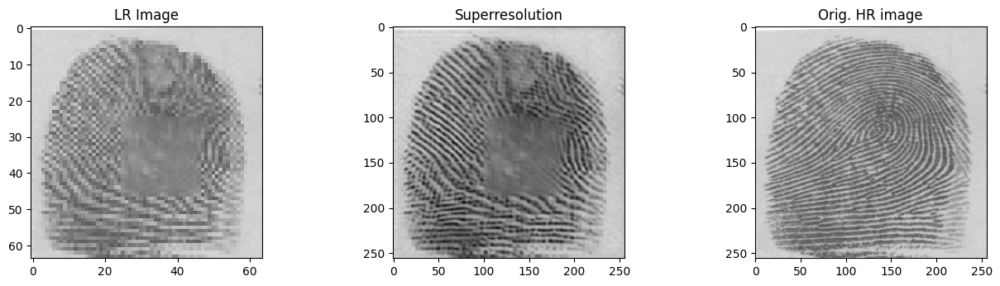

1/1 [==============================] - 1s 806ms/step


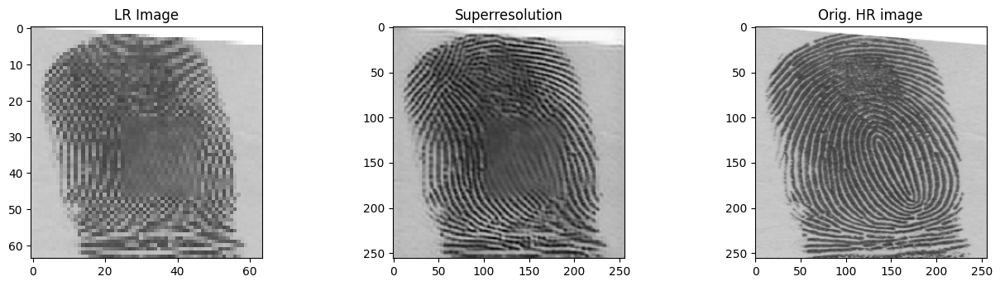

1/1 [==============================] - 1s 768ms/step


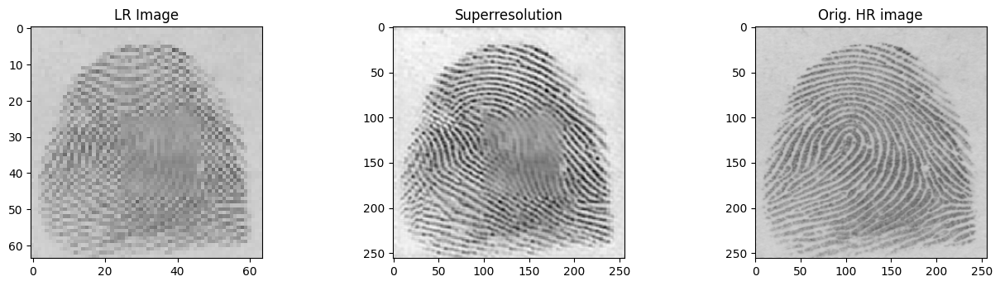

1/1 [==============================] - 1s 739ms/step


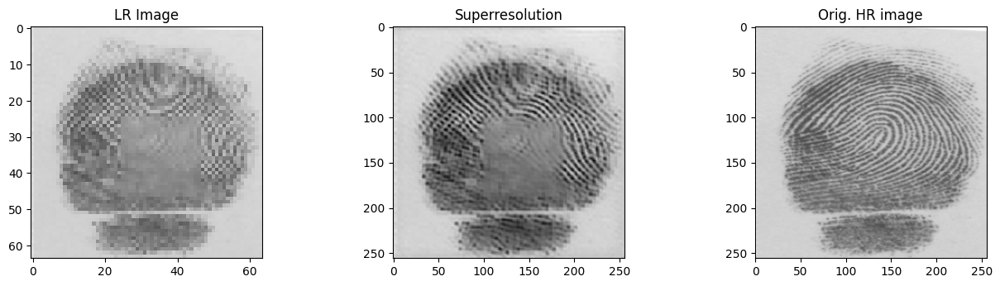

1/1 [==============================] - 1s 722ms/step


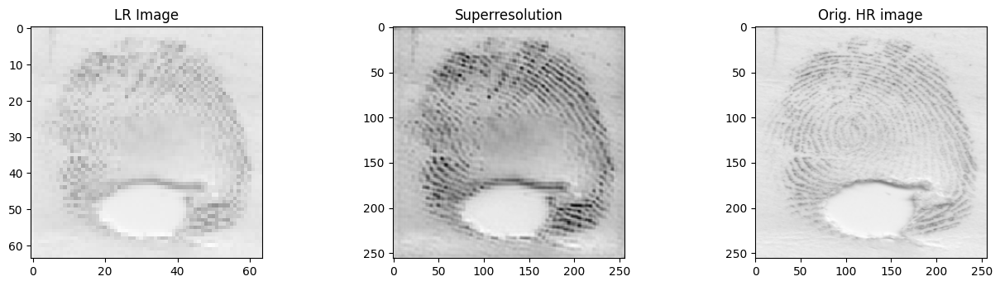

1/1 [==============================] - 1s 712ms/step


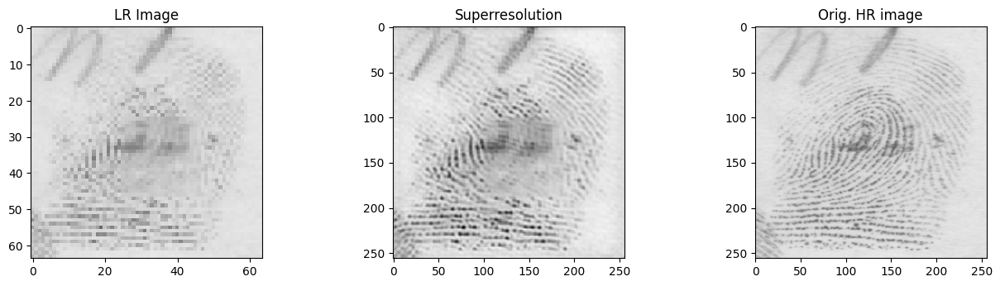

1/1 [==============================] - 1s 746ms/step


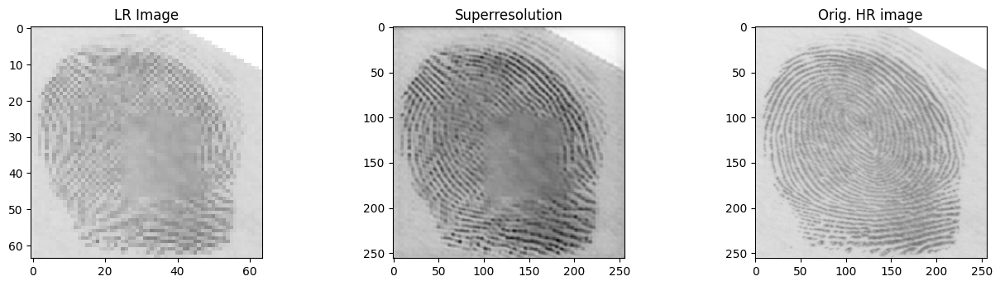

1/1 [==============================] - 1s 735ms/step


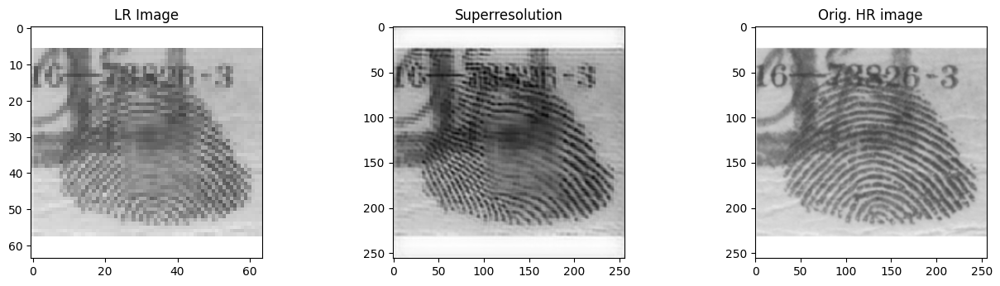

1/1 [==============================] - 1s 812ms/step


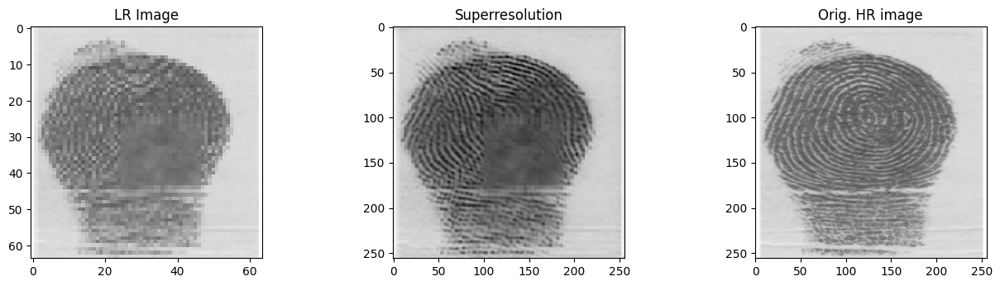

1/1 [==============================] - 1s 777ms/step


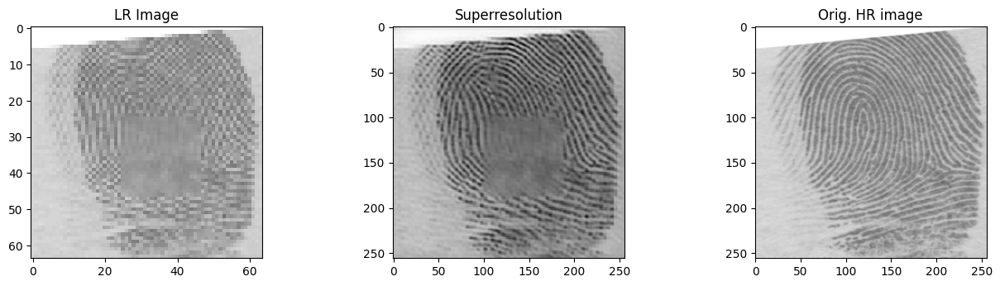

1/1 [==============================] - 1s 727ms/step


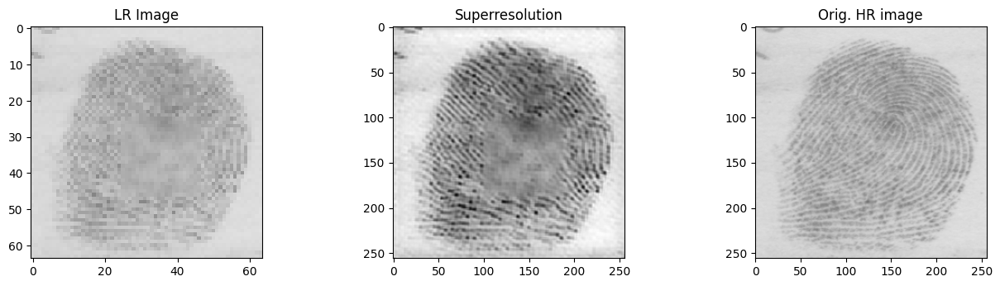

1/1 [==============================] - 1s 712ms/step


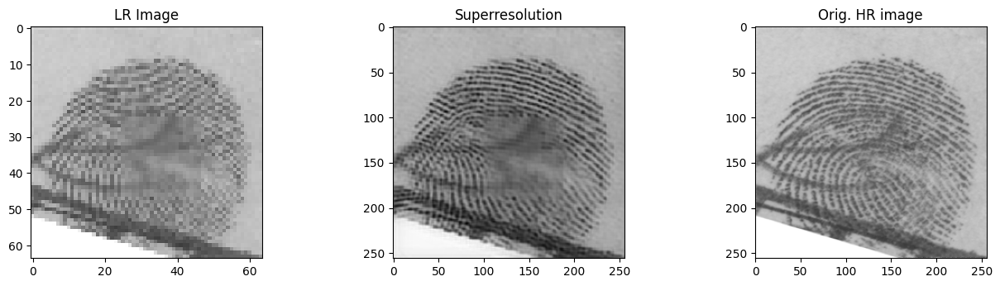

1/1 [==============================] - 1s 695ms/step


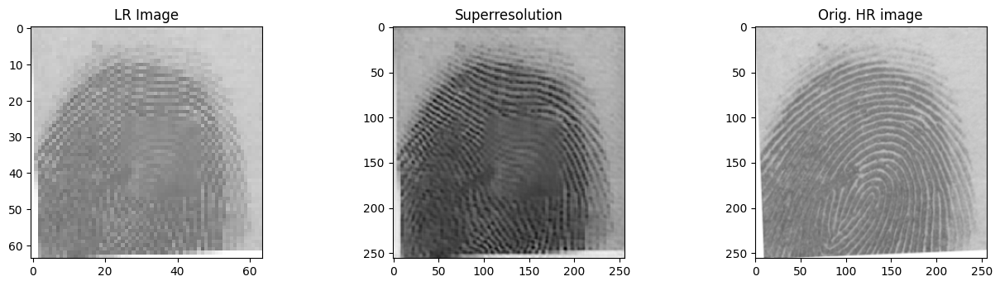

1/1 [==============================] - 1s 682ms/step


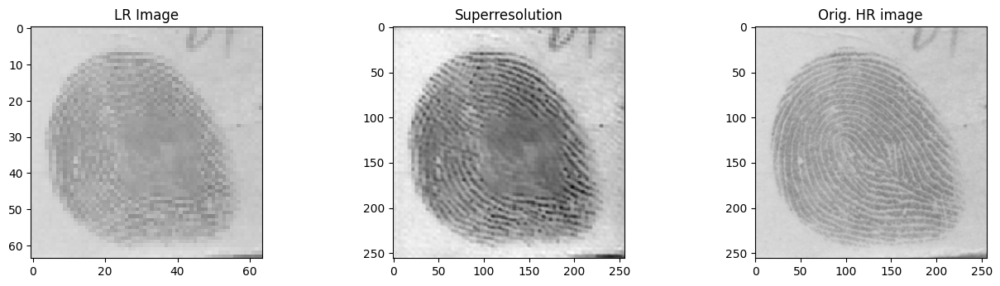

1/1 [==============================] - 1s 672ms/step


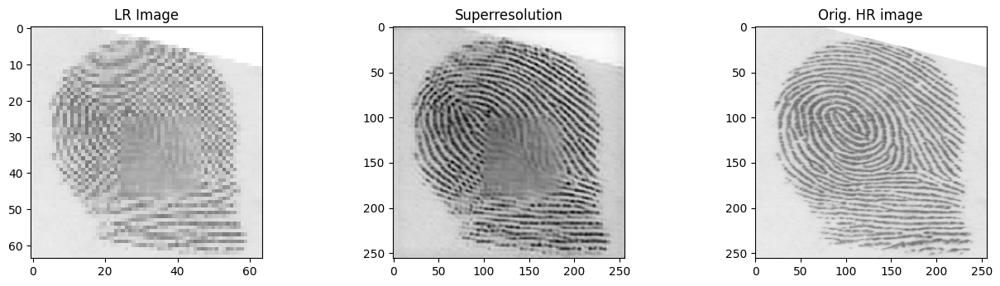

1/1 [==============================] - 1s 772ms/step


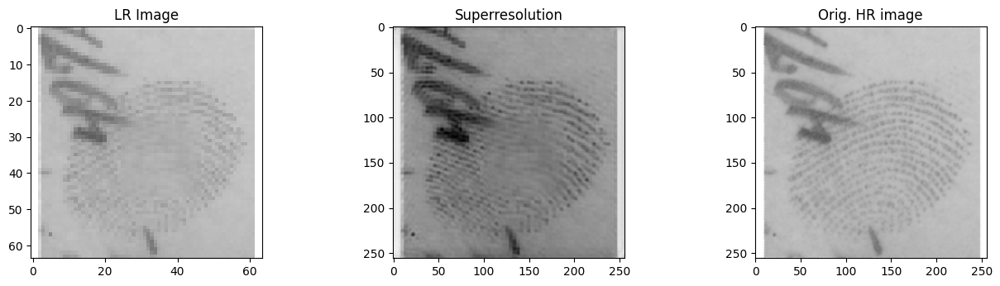

1/1 [==============================] - 1s 756ms/step


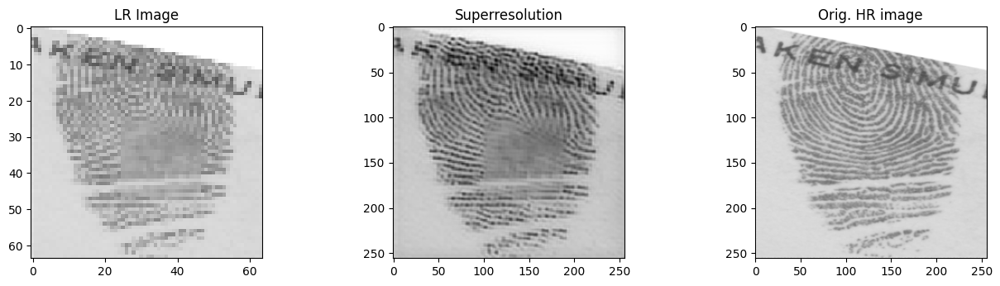

1/1 [==============================] - 1s 749ms/step


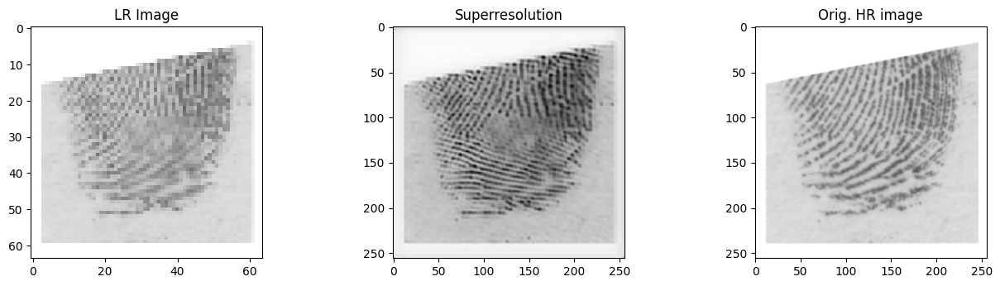

1/1 [==============================] - 1s 732ms/step


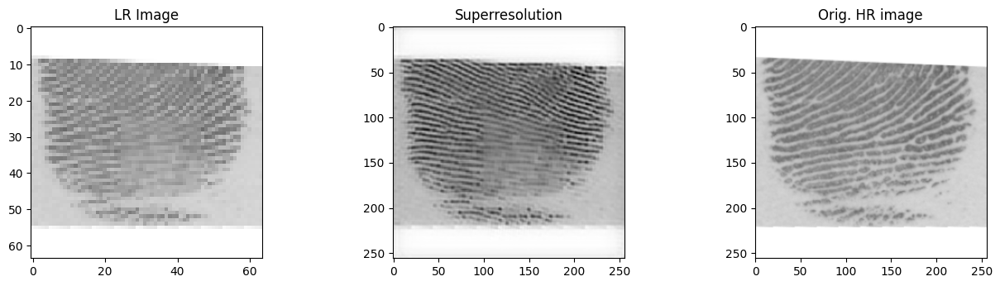

1/1 [==============================] - 1s 708ms/step


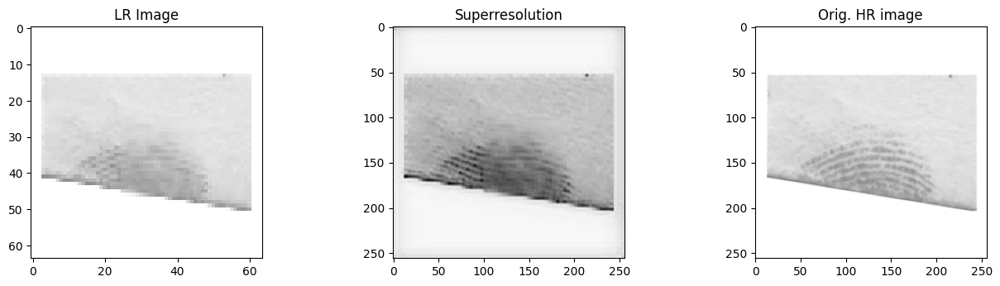

1/1 [==============================] - 1s 729ms/step


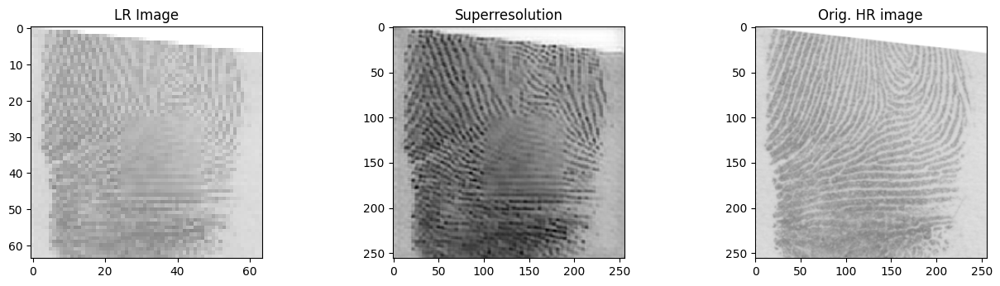

1/1 [==============================] - 1s 677ms/step


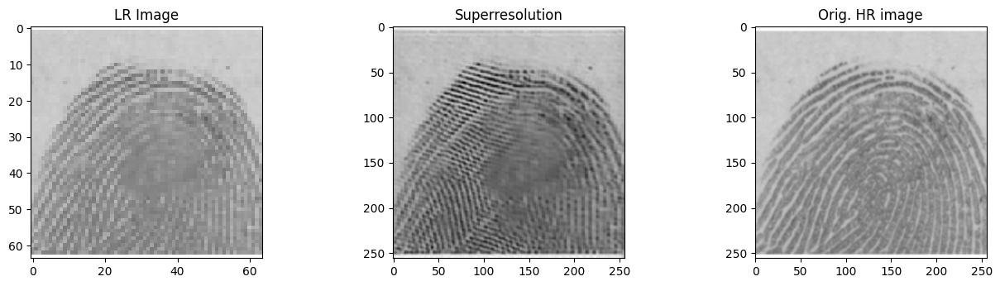

1/1 [==============================] - 1s 809ms/step


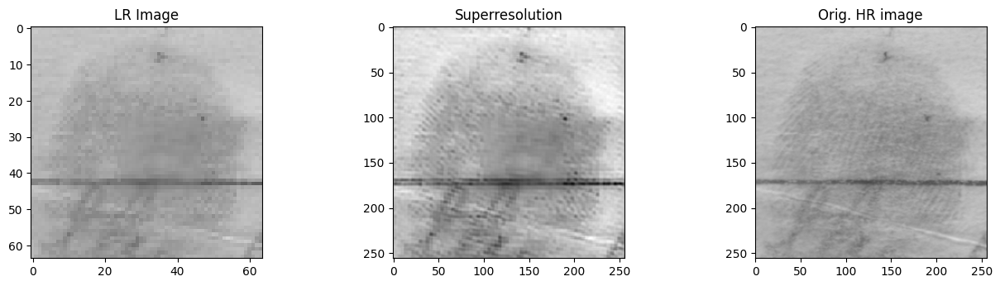

1/1 [==============================] - 1s 766ms/step


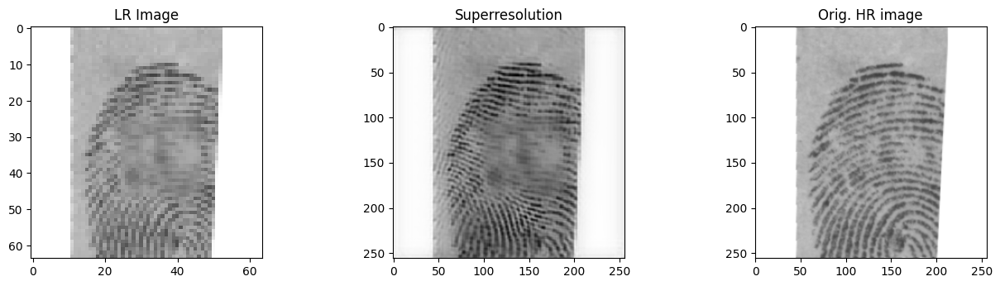

1/1 [==============================] - 1s 726ms/step


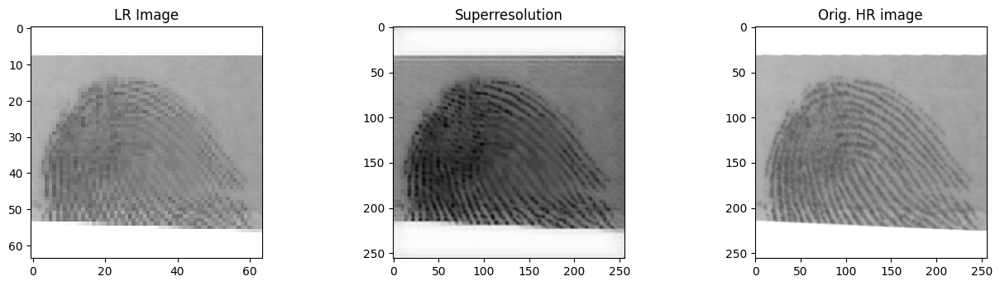

1/1 [==============================] - 1s 724ms/step


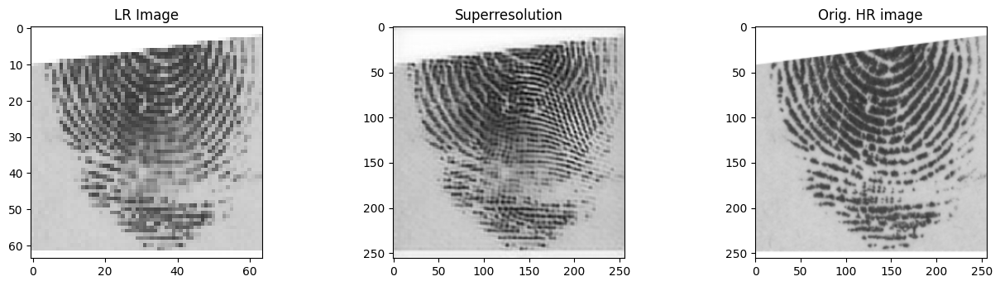

1/1 [==============================] - 1s 705ms/step


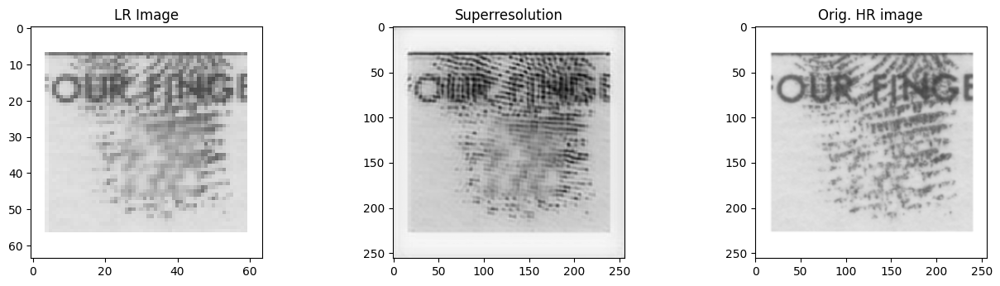

1/1 [==============================] - 1s 692ms/step


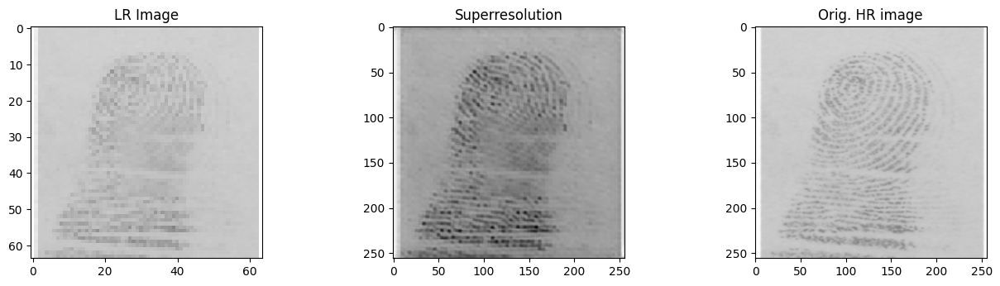

1/1 [==============================] - 1s 688ms/step


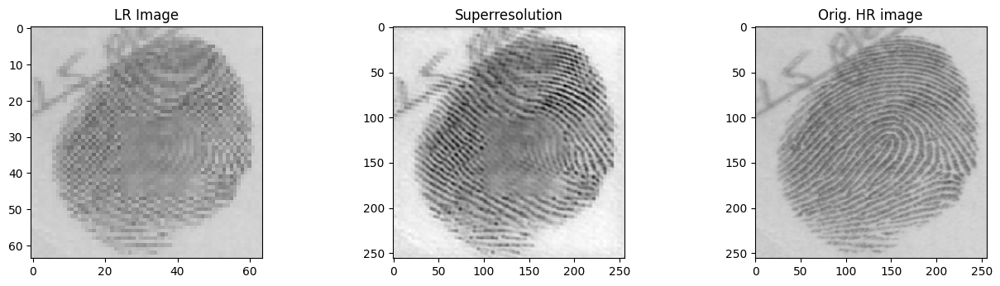

1/1 [==============================] - 1s 813ms/step


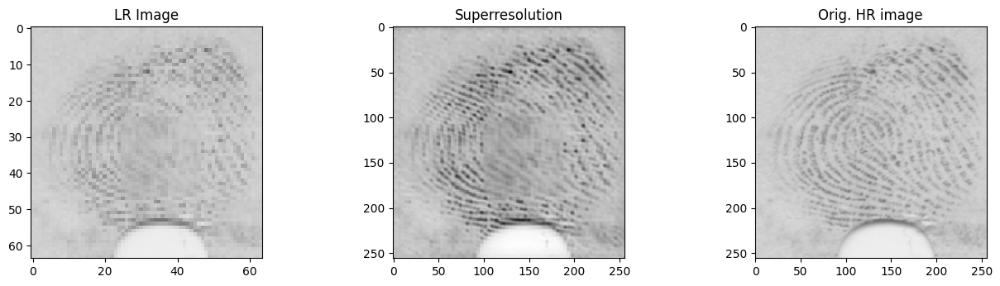

1/1 [==============================] - 1s 775ms/step


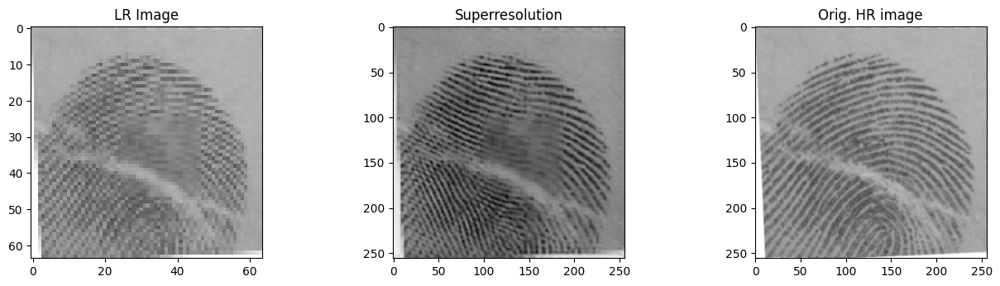

1/1 [==============================] - 1s 736ms/step


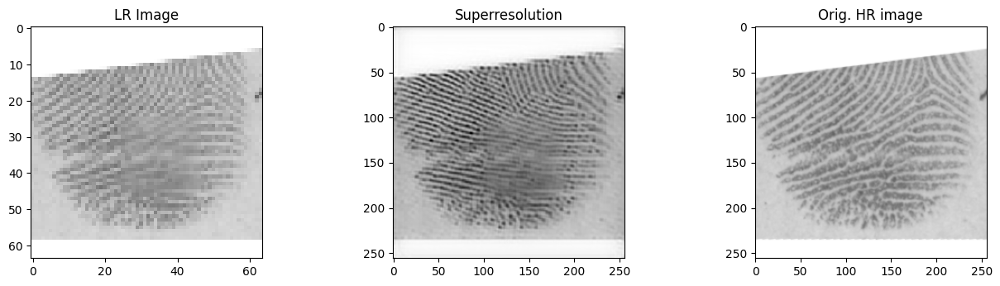

1/1 [==============================] - 1s 749ms/step


KeyboardInterrupt: ignored

In [ ]:
from keras.models import load_model
from numpy.random import randint

[X1, X2] = [X_test, y_test]
#ix = randint(0, len(X1), 1)
#print(ix)
for ix in range(len(X1)):
    src_image, tar_image = X1[[ix]], X2[[ix]]
    generatorNew = load_model('/content/drive/MyDrive/Model/SRGANmodel149.h5')
    gen_image = generatorNew.predict(src_image)
    gen_image_gray = cv2.cvtColor(gen_image[0], cv2.COLOR_BGR2GRAY)
    src_image_gray = cv2.cvtColor(src_image[0], cv2.COLOR_BGR2GRAY)
    output_path = '/content/sample_data/generated2.png'
    output_path2 = '/content/sample_data/src_image.png'
    cv2.imwrite(output_path, gen_image_gray)
    cv2.imwrite(output_path2, src_image_gray)

    plt.figure(figsize=(16, 8))
    plt.subplot(231)
    plt.title('LR Image')
    plt.imshow(src_image[0,:,:,:], cmap = 'gray')
    plt.subplot(232)
    plt.title('Superresolution')
    plt.imshow(cv2.cvtColor(gen_image[0,:,:,:], cv2.COLOR_BGR2GRAY),cmap = 'gray')
    plt.subplot(233)
    plt.title('Orig. HR image')
    plt.imshow(tar_image[0,:,:,:], cmap = 'gray')

    plt.show()


In [ ]:
tempFiles=files[900:]

In [ ]:
from keras.models import load_model
from numpy.random import randint

[X1, X2] = [X_test, y_test]
#ix = randint(0, len(X1), 1)
#print(ix)
for ix in range(len(X1)):
    src_image, tar_image = X1[[ix]], X2[[ix]]
    generator = load_model('/content/drive/MyDrive/Model/SRGAN_NIST_Roll_Without_THR.h5')
    gen_image = generator.predict(src_image)
    gen_image_gray = cv2.cvtColor(gen_image[0], cv2.COLOR_BGR2GRAY)
    src_image_gray = cv2.cvtColor(src_image[0], cv2.COLOR_BGR2GRAY)
    tar_image_gray = cv2.cvtColor(tar_image[0], cv2.COLOR_BGR2GRAY)
    output_path = '/content/drive/MyDrive/Testing_Without_THR_SRGAN/Pred/'+tempFiles[ix].split('/')[-1]
    output_path2 = '/content/drive/MyDrive/Testing_Without_THR_SRGAN/Low/'+tempFiles[ix].split('/')[-1]
    output_path3 = '/content/drive/MyDrive/Testing_Without_THR_SRGAN/High/'+tempFiles[ix].split('/')[-1]
    cv2.imwrite(output_path, gen_image_gray)
    cv2.imwrite(output_path2, src_image_gray)
    cv2.imwrite(output_path3, tar_image_gray)

    '''pred_save_path = os.path.join("/content/drive/MyDrive/Testing_Without_THR_SRGAN/Pred",tempFiles[ix].split('/')[-1])
    cv2.imwrite(pred_save_path, (gen_image * 255).astype(np.uint8))  # Convert to 8-bit before saving
    high_save_path = os.path.join("/content/drive/MyDrive/Testing_Without_THR_SRGAN/High", tempFiles[ix].split('/')[-1])
    cv2.imwrite(high_save_path, (tar_image * 255).astype(np.uint8))  # Convert to 8-bit before saving
    low_save_path = os.path.join("/content/drive/MyDrive/Testing_Without_THR_SRGAN/Low", tempFiles[ix].split('/')[-1])
    cv2.imwrite(low_save_path, (src_image* 255).astype(np.uint8))  # Convert to 8-bit before saving'''

    '''plt.figure(figsize=(16, 8))
    plt.subplot(231)
    plt.title('LR Image')
    plt.imshow(src_image[0,:,:,:], cmap = 'gray')
    plt.subplot(232)
    plt.title('Superresolution')
    plt.imshow(cv2.cvtColor(gen_image[0,:,:,:], cv2.COLOR_BGR2GRAY),cmap = 'gray')
    plt.subplot(233)
    plt.title('Orig. HR image')
    plt.imshow(tar_image[0,:,:,:], cmap = 'gray')

    plt.show()'''


1/1 [==============================] - 1s 736ms/step


1/1 [==============================] - 1s 712ms/step


1/1 [==============================] - 1s 737ms/step


1/1 [==============================] - 1s 740ms/step


1/1 [==============================] - 1s 717ms/step


1/1 [==============================] - 1s 863ms/step


1/1 [==============================] - 1s 782ms/step


1/1 [==============================] - 1s 745ms/step


1/1 [==============================] - 1s 757ms/step


1/1 [==============================] - 1s 730ms/step


1/1 [==============================] - 1s 732ms/step


1/1 [==============================] - 1s 748ms/step


1/1 [==============================] - 1s 738ms/step


1/1 [==============================] - 1s 710ms/step


1/1 [==============================] - 1s 693ms/step


1/1 [==============================] - 1s 848ms/step


1/1 [==============================] - 1s 784ms/step


1/1 [==============================] - 1s 788ms/step


1/1 [==============================] - 1s 740ms/step


1/1 [==============================] - 1s 736ms/step


1/1 [==============================] - 1s 728ms/step


1/1 [==============================] - 1s 717ms/step


1/1 [==============================] - 1s 835ms/step


1/1 [==============================] - 1s 730ms/step


1/1 [==============================] - 1s 693ms/step


1/1 [==============================] - 1s 864ms/step


1/1 [==============================] - 1s 819ms/step


1/1 [==============================] - 1s 775ms/step


1/1 [==============================] - 1s 749ms/step


1/1 [==============================] - 1s 745ms/step


1/1 [==============================] - 1s 729ms/step


1/1 [==============================] - 1s 720ms/step


1/1 [==============================] - 1s 743ms/step


1/1 [==============================] - 1s 736ms/step


1/1 [==============================] - 1s 717ms/step


1/1 [==============================] - 1s 870ms/step


1/1 [==============================] - 1s 790ms/step


1/1 [==============================] - 1s 757ms/step


1/1 [==============================] - 1s 750ms/step


1/1 [==============================] - 1s 758ms/step


1/1 [==============================] - 1s 733ms/step


1/1 [==============================] - 1s 710ms/step


1/1 [==============================] - 1s 720ms/step


1/1 [==============================] - 1s 705ms/step


1/1 [==============================] - 1s 712ms/step


1/1 [==============================] - 1s 837ms/step


1/1 [==============================] - 1s 793ms/step


1/1 [==============================] - 1s 799ms/step


1/1 [==============================] - 1s 760ms/step


1/1 [==============================] - 1s 714ms/step


1/1 [==============================] - 1s 730ms/step


1/1 [==============================] - 1s 721ms/step


1/1 [==============================] - 1s 721ms/step


1/1 [==============================] - 1s 734ms/step


1/1 [==============================] - 1s 729ms/step


1/1 [==============================] - 1s 852ms/step


1/1 [==============================] - 1s 821ms/step


1/1 [==============================] - 1s 771ms/step


1/1 [==============================] - 1s 725ms/step


1/1 [==============================] - 1s 727ms/step


1/1 [==============================] - 1s 773ms/step


1/1 [==============================] - 1s 772ms/step


1/1 [==============================] - 1s 721ms/step


1/1 [==============================] - 1s 724ms/step


1/1 [==============================] - 1s 720ms/step


1/1 [==============================] - 1s 891ms/step


1/1 [==============================] - 1s 797ms/step


1/1 [==============================] - 1s 822ms/step


1/1 [==============================] - 1s 797ms/step


1/1 [==============================] - 1s 757ms/step


1/1 [==============================] - 1s 728ms/step


1/1 [==============================] - 1s 724ms/step


1/1 [==============================] - 1s 704ms/step


1/1 [==============================] - 1s 711ms/step


1/1 [==============================] - 1s 711ms/step


1/1 [==============================] - 1s 872ms/step


1/1 [==============================] - 1s 816ms/step


1/1 [==============================] - 1s 762ms/step


1/1 [==============================] - 1s 742ms/step


1/1 [==============================] - 1s 755ms/step


1/1 [==============================] - 1s 726ms/step


1/1 [==============================] - 1s 734ms/step


1/1 [==============================] - 1s 748ms/step


1/1 [==============================] - 1s 707ms/step


1/1 [==============================] - 1s 697ms/step


1/1 [==============================] - 1s 842ms/step


1/1 [==============================] - 1s 787ms/step


1/1 [==============================] - 1s 825ms/step


1/1 [==============================] - 1s 776ms/step


1/1 [==============================] - 1s 749ms/step


1/1 [==============================] - 1s 738ms/step


1/1 [==============================] - 1s 718ms/step


1/1 [==============================] - 1s 725ms/step


1/1 [==============================] - 1s 731ms/step


1/1 [==============================] - 1s 700ms/step


1/1 [==============================] - 1s 886ms/step


1/1 [==============================] - 1s 810ms/step


1/1 [==============================] - 1s 766ms/step


1/1 [==============================] - 1s 747ms/step


1/1 [==============================] - 1s 760ms/step


1/1 [==============================] - 1s 735ms/step


IndexError: ignored

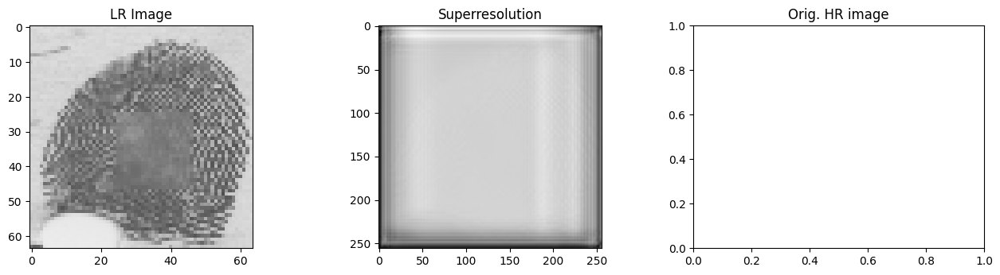

In [ ]:
from keras.models import load_model
from numpy.random import randint
from tensorflow.keras.preprocessing import image
#[X1, X2] = [X_test, y_test]
#ix = randint(0, len(X1), 1)
#print(ix)
src_image, tar_image = X1[[ix]], X2[[ix]]
src_image_path='/content/drive/MyDrive/Plain_image_256_damaged/00001880_plain_500_02.png'
src_image = image.load_img(src_image_path, target_size=(64, 64))  # Resize to the input size
src_image = image.img_to_array(src_image)
src_image = np.expand_dims(src_image, axis=0)  # Add batch dimension
src_image = src_image / 255.0  # Normalize pixel values (assuming 0-255 range)
tar_image=cv2.imread('/content/drive/MyDrive/Plain_image_512/00001880_plain_500_02.png')
generatorNew = load_model('/content/drive/MyDrive/Model/SRGANmodel149.h5')
gen_image = generatorNew.predict(src_image)
gen_image_gray = cv2.cvtColor(gen_image[0], cv2.COLOR_BGR2GRAY)
src_image_gray = cv2.cvtColor(src_image[0], cv2.COLOR_BGR2GRAY)
output_path = '/content/sample_data/generated2.png'
output_path2 = '/content/sample_data/src_image.png'
cv2.imwrite(output_path, gen_image_gray)
cv2.imwrite(output_path2, src_image_gray)

plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('LR Image')
plt.imshow(src_image[0,:,:,:], cmap = 'gray')
plt.subplot(232)
plt.title('Superresolution')
plt.imshow(cv2.cvtColor(gen_image[0,:,:,:], cv2.COLOR_BGR2GRAY),cmap = 'gray')
plt.subplot(233)
plt.title('Orig. HR image')
plt.imshow(tar_image[0,:,:,:], cmap = 'gray')

plt.show()



ValueError: ignored

In [ ]:
from PIL import Image
from keras.models import load_model

# Load the .bmp image
array_small=[]
generatorNew = load_model('/content/drive/MyDrive/Model/SRGAN_NIST_Data_new_256_toCompare.h5')
bmp_image_path = '/content/drive/MyDrive/Plain_image_256_damaged/00001880_plain_500_02.png'
img_array = cv2.imread(bmp_image_path ,cv2.IMREAD_COLOR)

array_small.append([cv2.resize(img_array, (64,64),
                               interpolation=cv2.INTER_AREA)])
img_array_mod = np.array(array_small).reshape(-1, 64, 64, 3)
gen_image = generatorNew.predict(img_array_mod)

gen_image_gray = cv2.cvtColor(gen_image[0], cv2.COLOR_BGR2GRAY)

# Save the grayscale image as a .tif file
output_path = '/content/sample_data/generated2.bmp'
cv2.imwrite(output_path, gen_image_gray)

1/1 [==============================] - 1s 1s/step


True

In [ ]:
imshow(gen_image)

NameError: ignored

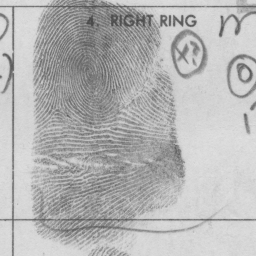

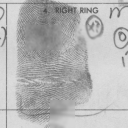

good_matches 65


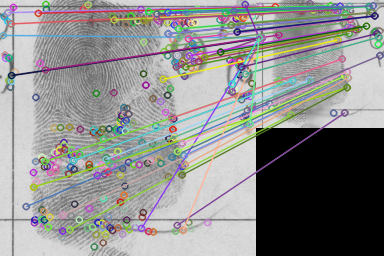

In [ ]:

from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.preprocessing.image import img_to_array

# Load the SRCNN model
#model = load_model('/content/drive/MyDrive/Model/SRCNN_NIST_Without_THR.h5', custom_objects={'pixel_mse_loss': pixel_mse_loss, 'PSNR': PSNR})

keypoint1List=[]
keypoint2List=[]
good_matchesList=[]
best_score=0
filename=None
image =None
kp1,kp2, mp= None, None, None

#file_list_high = os.listdir('/content/drive/MyDrive/Testing_Without_THR_SRCNN/High/')
#file_list_low = os.listdir('/content/drive/MyDrive/Roll_256_damage_final')



filepath='/content/drive/MyDrive/Testing_Without_THR_SRGAN/High/00001856_roll_500_04.png'
#cv2_imshow(filepath)
filepath_sample='/content/drive/MyDrive/Testing_Without_THR_SRGAN/128SizeImage/00001856_roll_500_04.png'
#cv2_imshow(filepath_sample)
sample_1=cv2.imread(filepath)
sample=cv2.imread(filepath_sample)
cv2_imshow(sample_1)
cv2_imshow(sample)
    #sample.resize(256,256)
    #print(filepath)
sift = cv2.SIFT_create()
keypoint1, descriptor1 = sift.detectAndCompute(sample_1, None)
keypoint2, descriptor2 = sift.detectAndCompute(sample, None)
    #print(f"keypoint1=>{len(keypoint1)}")
    #print(f"keypoint2=>{len(keypoint2)}")
            # FLANN parameters
flann_params = {
                'algorithm': 1,  # FLANN_INDEX_KDTREE
                'trees': 10
            }

            # Create FLANN matcher
flann = cv2.FlannBasedMatcher(flann_params, {})
            # Perform KNN matching
matches = flann.knnMatch(descriptor1, descriptor2, k=2)

                    # Filter good matches
good_matches = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
      good_matches.append(m)

            # Draw the matches
result_image = cv2.drawMatches(sample_1, keypoint1, sample, keypoint2, good_matches, None)
print("good_matches",len(good_matches))

            # Show the result
cv2_imshow(result_image)

In [ ]:

from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.preprocessing.image import img_to_array

# Load the SRCNN model
#model = load_model('/content/drive/MyDrive/Model/SRCNN_NIST_Without_THR.h5', custom_objects={'pixel_mse_loss': pixel_mse_loss, 'PSNR': PSNR})

keypoint1List=[]
keypoint2List=[]
good_matchesList=[]
best_score=0
filename=None
image =None
kp1,kp2, mp= None, None, None

file_list_high = os.listdir('/content/drive/MyDrive/Testing_Without_THR_SRGAN/High/')
file_list_low = os.listdir('/content/drive/MyDrive/Testing_Without_THR_SRGAN/128SizeImage/')


for i in tqdm(range(len(file_list_high)-1)[:50]):
    filepath='/content/drive/MyDrive/Testing_Without_THR_SRGAN/High/'+file_list_high[i]
    filepath_sample='/content/drive/MyDrive/Testing_Without_THR_SRGAN/128SizeImage/'+file_list_high[i]
    sample_1=cv2.imread(filepath)
    sample=cv2.imread(filepath_sample)
    #cv2_imshow(sample_1)
    #cv2_imshow(sample)
    #sample.resize(256,256)
    #print(filepath)
    sift = cv2.SIFT_create()
    keypoint1, descriptor1 = sift.detectAndCompute(sample_1, None)
    keypoint2, descriptor2 = sift.detectAndCompute(sample, None)
    #print(f"keypoint1=>{len(keypoint1)}")
    #print(f"keypoint2=>{len(keypoint2)}")
            # FLANN parameters
    flann_params = {
                'algorithm': 1,  # FLANN_INDEX_KDTREE
                'trees': 10
            }

            # Create FLANN matcher
    flann = cv2.FlannBasedMatcher(flann_params, {})
            # Perform KNN matching
    matches = flann.knnMatch(descriptor1, descriptor2, k=2)

                    # Filter good matches
    good_matches = []
    for m, n in matches:
        if m.distance < 0.7 * n.distance:
            good_matches.append(m)

            # Draw the matches
    result_image = cv2.drawMatches(sample_1, keypoint1, sample, keypoint2, good_matches, None)
    print("good_matches",len(good_matches))

            # Show the result
    #cv2_imshow(result_image)

    #keypoint1List.append(keypoint1)
    #keypoint2List.append(keypoint2)
    good_matchesList.append(good_matches)

  6%|▌         | 3/50 [00:00<00:01, 29.96it/s]

good_matches 45
good_matches 93
good_matches 50
good_matches 96
good_matches 48


 12%|█▏        | 6/50 [00:00<00:08,  5.28it/s]

good_matches 55
good_matches 59


 16%|█▌        | 8/50 [00:03<00:20,  2.02it/s]

good_matches 52


 18%|█▊        | 9/50 [00:03<00:23,  1.77it/s]

good_matches 54


 20%|██        | 10/50 [00:04<00:26,  1.49it/s]

good_matches 47


 22%|██▏       | 11/50 [00:05<00:27,  1.43it/s]

good_matches 54


 24%|██▍       | 12/50 [00:06<00:27,  1.36it/s]

good_matches 31


 26%|██▌       | 13/50 [00:07<00:27,  1.33it/s]

good_matches 49


 28%|██▊       | 14/50 [00:08<00:27,  1.30it/s]

good_matches 45


 30%|███       | 15/50 [00:09<00:30,  1.14it/s]

good_matches 63


 32%|███▏      | 16/50 [00:10<00:31,  1.08it/s]

good_matches 83


 34%|███▍      | 17/50 [00:11<00:31,  1.05it/s]

good_matches 53


 36%|███▌      | 18/50 [00:12<00:29,  1.07it/s]

good_matches 36


 38%|███▊      | 19/50 [00:13<00:28,  1.09it/s]

good_matches 48


 40%|████      | 20/50 [00:13<00:26,  1.12it/s]

good_matches 41


 42%|████▏     | 21/50 [00:14<00:26,  1.08it/s]

good_matches 40


 44%|████▍     | 22/50 [00:15<00:25,  1.10it/s]

good_matches 43


 46%|████▌     | 23/50 [00:16<00:24,  1.12it/s]

good_matches 55


 48%|████▊     | 24/50 [00:17<00:22,  1.14it/s]

good_matches 22


 50%|█████     | 25/50 [00:18<00:24,  1.02it/s]

good_matches 49


 52%|█████▏    | 26/50 [00:19<00:23,  1.04it/s]

good_matches 50


 54%|█████▍    | 27/50 [00:20<00:20,  1.12it/s]

good_matches 59


 56%|█████▌    | 28/50 [00:21<00:18,  1.17it/s]

good_matches 69


 58%|█████▊    | 29/50 [00:22<00:17,  1.18it/s]

good_matches 50


 60%|██████    | 30/50 [00:22<00:15,  1.29it/s]

good_matches 43


 62%|██████▏   | 31/50 [00:23<00:13,  1.36it/s]

good_matches 58


 64%|██████▍   | 32/50 [00:24<00:13,  1.31it/s]

good_matches 53


 66%|██████▌   | 33/50 [00:24<00:12,  1.35it/s]

good_matches 52


 68%|██████▊   | 34/50 [00:25<00:11,  1.41it/s]

good_matches 38


 70%|███████   | 35/50 [00:26<00:10,  1.42it/s]

good_matches 93


 72%|███████▏  | 36/50 [00:26<00:09,  1.40it/s]

good_matches 49


 74%|███████▍  | 37/50 [00:27<00:09,  1.41it/s]

good_matches 65
good_matches 65


 78%|███████▊  | 39/50 [00:28<00:06,  1.67it/s]

good_matches 42


 80%|████████  | 40/50 [00:29<00:07,  1.39it/s]

good_matches 32


 82%|████████▏ | 41/50 [00:30<00:06,  1.31it/s]

good_matches 63


 84%|████████▍ | 42/50 [00:31<00:06,  1.16it/s]

good_matches 36


 86%|████████▌ | 43/50 [00:32<00:06,  1.16it/s]

good_matches 56


 88%|████████▊ | 44/50 [00:33<00:05,  1.18it/s]

good_matches 36


 90%|█████████ | 45/50 [00:34<00:04,  1.12it/s]

good_matches 43


 92%|█████████▏| 46/50 [00:35<00:03,  1.07it/s]

good_matches 43


 94%|█████████▍| 47/50 [00:36<00:02,  1.08it/s]

good_matches 57


 96%|█████████▌| 48/50 [00:37<00:01,  1.05it/s]

good_matches 37


 98%|█████████▊| 49/50 [00:38<00:00,  1.03it/s]

good_matches 76


100%|██████████| 50/50 [00:38<00:00,  1.28it/s]

good_matches 56


In [ ]:
High_low_list=[]
for i in range(len(good_matchesList)):
    High_low_list.append(len(good_matchesList[i]))

In [ ]:
High_low_list

[45,
 93,
 50,
 96,
 48,
 55,
 59,
 52,
 54,
 47,
 54,
 31,
 49,
 45,
 63,
 83,
 53,
 36,
 48,
 41,
 40,
 43,
 55,
 22,
 49,
 50,
 59,
 69,
 50,
 43,
 58,
 53,
 52,
 38,
 93,
 49,
 65,
 65,
 42,
 32,
 63,
 36,
 56,
 36,
 43,
 43,
 57,
 37,
 76,
 56]

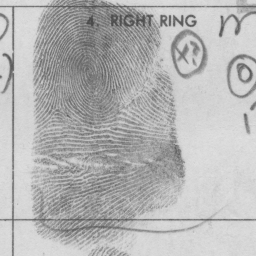

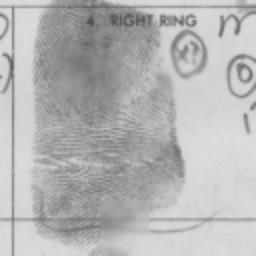

good_matches 92


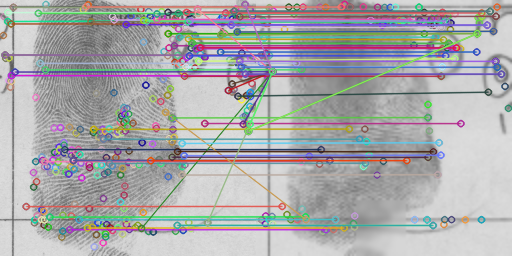

In [ ]:

from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.preprocessing.image import img_to_array

# Load the SRCNN model
#model = load_model('/content/drive/MyDrive/Model/SRCNN_NIST_Without_THR.h5', custom_objects={'pixel_mse_loss': pixel_mse_loss, 'PSNR': PSNR})

keypoint1List=[]
keypoint2List=[]
good_matchesList=[]
best_score=0
filename=None
image =None
kp1,kp2, mp= None, None, None

#file_list_high = os.listdir('/content/drive/MyDrive/Testing_Without_THR_SRCNN/High/')
#file_list_low = os.listdir('/content/drive/MyDrive/Roll_256_damage_final')



filepath='/content/drive/MyDrive/Testing_Without_THR_SRGAN/High/00001856_roll_500_04.png'
#cv2_imshow(filepath)
filepath_sample='/content/drive/MyDrive/Testing_Without_THR_SRGAN/Low/00001856_roll_500_04.png'
#cv2_imshow(filepath_sample)
sample_1=cv2.imread(filepath)
sample=cv2.imread(filepath_sample)
sample = cv2.resize(sample, (256,256))
cv2_imshow(sample_1)
cv2_imshow(sample)
    #sample.resize(256,256)
    #print(filepath)
sift = cv2.SIFT_create()
keypoint1, descriptor1 = sift.detectAndCompute(sample_1, None)
keypoint2, descriptor2 = sift.detectAndCompute(sample, None)
    #print(f"keypoint1=>{len(keypoint1)}")
    #print(f"keypoint2=>{len(keypoint2)}")
            # FLANN parameters
flann_params = {
                'algorithm': 1,  # FLANN_INDEX_KDTREE
                'trees': 10
            }

            # Create FLANN matcher
flann = cv2.FlannBasedMatcher(flann_params, {})
            # Perform KNN matching
matches = flann.knnMatch(descriptor1, descriptor2, k=2)

                    # Filter good matches
good_matches = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
      good_matches.append(m)

            # Draw the matches
result_image = cv2.drawMatches(sample_1, keypoint1, sample, keypoint2, good_matches, None)
print("good_matches",len(good_matches))

            # Show the result
cv2_imshow(result_image)

In [ ]:

from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.preprocessing.image import img_to_array

# Load the SRCNN model
#model = load_model('/content/drive/MyDrive/Model/SRCNN_NIST_Without_THR.h5', custom_objects={'pixel_mse_loss': pixel_mse_loss, 'PSNR': PSNR})

keypoint1List=[]
keypoint2List=[]
good_matchesList=[]
best_score=0
filename=None
image =None
kp1,kp2, mp= None, None, None

file_list_high = os.listdir('/content/drive/MyDrive/Testing_Without_THR_SRGAN/High/')
file_list_low = os.listdir('/content/drive/MyDrive/Testing_Without_THR_SRGAN/Low/')


for i in tqdm(range(len(file_list_high)-1)[:50]):
    filepath='/content/drive/MyDrive/Testing_Without_THR_SRGAN/High/'+file_list_high[i]
    filepath_sample='/content/drive/MyDrive/Testing_Without_THR_SRGAN/Low/'+file_list_high[i]
    sample_1=cv2.imread(filepath)
    sample=cv2.imread(filepath_sample)
    sample = cv2.resize(sample, (256,256))
    #cv2_imshow(sample_1)
    #cv2_imshow(sample)
    #sample.resize(256,256)
    #print(filepath)
    sift = cv2.SIFT_create()
    keypoint1, descriptor1 = sift.detectAndCompute(sample_1, None)
    keypoint2, descriptor2 = sift.detectAndCompute(sample, None)
    #print(f"keypoint1=>{len(keypoint1)}")
    #print(f"keypoint2=>{len(keypoint2)}")
            # FLANN parameters
    flann_params = {
                'algorithm': 1,  # FLANN_INDEX_KDTREE
                'trees': 10
            }

            # Create FLANN matcher
    flann = cv2.FlannBasedMatcher(flann_params, {})
            # Perform KNN matching
    matches = flann.knnMatch(descriptor1, descriptor2, k=2)

                    # Filter good matches
    good_matches = []
    for m, n in matches:
        if m.distance < 0.7 * n.distance:
            good_matches.append(m)

            # Draw the matches
    result_image = cv2.drawMatches(sample_1, keypoint1, sample, keypoint2, good_matches, None)
    print("good_matches",len(good_matches))

            # Show the result
    #cv2_imshow(result_image)

    #keypoint1List.append(keypoint1)
    #keypoint2List.append(keypoint2)
    good_matchesList.append(good_matches)

  6%|▌         | 3/50 [00:00<00:01, 24.19it/s]

good_matches 53
good_matches 101
good_matches 63
good_matches 62
good_matches 87


 12%|█▏        | 6/50 [00:01<00:08,  5.04it/s]

good_matches 67
good_matches 73


 16%|█▌        | 8/50 [00:02<00:18,  2.26it/s]

good_matches 68


 18%|█▊        | 9/50 [00:03<00:22,  1.85it/s]

good_matches 89


 20%|██        | 10/50 [00:04<00:22,  1.75it/s]

good_matches 72


 22%|██▏       | 11/50 [00:05<00:23,  1.68it/s]

good_matches 121


 24%|██▍       | 12/50 [00:05<00:25,  1.50it/s]

good_matches 61


 26%|██▌       | 13/50 [00:06<00:24,  1.49it/s]

good_matches 79


 28%|██▊       | 14/50 [00:07<00:24,  1.48it/s]

good_matches 48


 30%|███       | 15/50 [00:08<00:23,  1.46it/s]

good_matches 114


 32%|███▏      | 16/50 [00:08<00:24,  1.36it/s]

good_matches 52


 34%|███▍      | 17/50 [00:09<00:24,  1.34it/s]

good_matches 96


 36%|███▌      | 18/50 [00:10<00:23,  1.36it/s]

good_matches 58


 38%|███▊      | 19/50 [00:11<00:22,  1.40it/s]

good_matches 52


 40%|████      | 20/50 [00:11<00:20,  1.44it/s]

good_matches 77


 42%|████▏     | 21/50 [00:12<00:20,  1.42it/s]

good_matches 78


 44%|████▍     | 22/50 [00:13<00:20,  1.35it/s]

good_matches 82


 46%|████▌     | 23/50 [00:13<00:19,  1.40it/s]

good_matches 111


 48%|████▊     | 24/50 [00:14<00:18,  1.42it/s]

good_matches 54


 50%|█████     | 25/50 [00:15<00:20,  1.19it/s]

good_matches 85


 52%|█████▏    | 26/50 [00:16<00:21,  1.14it/s]

good_matches 97


 54%|█████▍    | 27/50 [00:17<00:20,  1.14it/s]

good_matches 89


 56%|█████▌    | 28/50 [00:18<00:18,  1.16it/s]

good_matches 78


 58%|█████▊    | 29/50 [00:19<00:17,  1.17it/s]

good_matches 101


 60%|██████    | 30/50 [00:20<00:16,  1.19it/s]

good_matches 72


 62%|██████▏   | 31/50 [00:21<00:17,  1.09it/s]

good_matches 104


 64%|██████▍   | 32/50 [00:22<00:16,  1.06it/s]

good_matches 79


 66%|██████▌   | 33/50 [00:22<00:15,  1.10it/s]

good_matches 81


 68%|██████▊   | 34/50 [00:23<00:14,  1.11it/s]

good_matches 78


 70%|███████   | 35/50 [00:24<00:13,  1.14it/s]

good_matches 141


 72%|███████▏  | 36/50 [00:25<00:11,  1.17it/s]

good_matches 116


 74%|███████▍  | 37/50 [00:26<00:10,  1.18it/s]

good_matches 56
good_matches 91


 78%|███████▊  | 39/50 [00:27<00:07,  1.50it/s]

good_matches 67


 80%|████████  | 40/50 [00:28<00:07,  1.31it/s]

good_matches 60


 82%|████████▏ | 41/50 [00:29<00:07,  1.17it/s]

good_matches 51


 84%|████████▍ | 42/50 [00:30<00:06,  1.18it/s]

good_matches 67


 86%|████████▌ | 43/50 [00:31<00:05,  1.18it/s]

good_matches 67


 88%|████████▊ | 44/50 [00:31<00:05,  1.19it/s]

good_matches 54


 90%|█████████ | 45/50 [00:32<00:04,  1.11it/s]

good_matches 84


 92%|█████████▏| 46/50 [00:33<00:03,  1.06it/s]

good_matches 113


 94%|█████████▍| 47/50 [00:34<00:02,  1.09it/s]

good_matches 96


 96%|█████████▌| 48/50 [00:35<00:01,  1.10it/s]

good_matches 69


 98%|█████████▊| 49/50 [00:36<00:00,  1.05it/s]

good_matches 132


100%|██████████| 50/50 [00:37<00:00,  1.33it/s]

good_matches 98


In [ ]:
High_low256_list=[]
for i in range(len(good_matchesList)):
    High_low256_list.append(len(good_matchesList[i]))

In [ ]:
High_low256_list

[53,
 101,
 63,
 62,
 87,
 67,
 73,
 68,
 89,
 72,
 121,
 61,
 79,
 48,
 114,
 52,
 96,
 58,
 52,
 77,
 78,
 82,
 111,
 54,
 85,
 97,
 89,
 78,
 101,
 72,
 104,
 79,
 81,
 78,
 141,
 116,
 56,
 91,
 67,
 60,
 51,
 67,
 67,
 54,
 84,
 113,
 96,
 69,
 132,
 98]

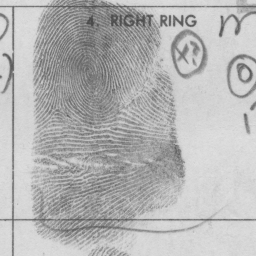

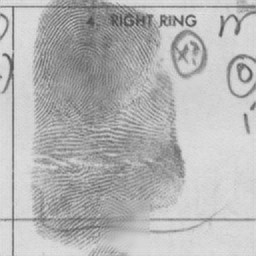

good_matches 167


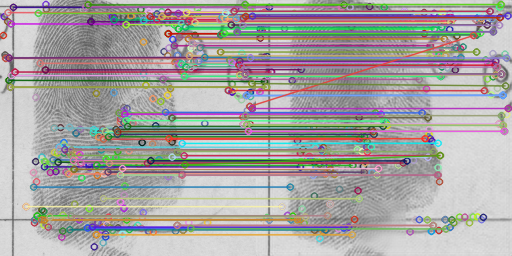

In [ ]:

from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.preprocessing.image import img_to_array

# Load the SRCNN model
#model = load_model('/content/drive/MyDrive/Model/SRCNN_NIST_Without_THR.h5', custom_objects={'pixel_mse_loss': pixel_mse_loss, 'PSNR': PSNR})

keypoint1List=[]
keypoint2List=[]
good_matchesList=[]
best_score=0
filename=None
image =None
kp1,kp2, mp= None, None, None

#file_list_high = os.listdir('/content/drive/MyDrive/Testing_Without_THR_SRCNN/High/')
#file_list_low = os.listdir('/content/drive/MyDrive/Roll_256_damage_final')



filepath='/content/drive/MyDrive/Testing_Without_THR_SRGAN/High/00001856_roll_500_04.png'
#cv2_imshow(filepath)
filepath_sample='/content/drive/MyDrive/Testing_Without_THR_SRGAN/Pred/00001856_roll_500_04.png'
#cv2_imshow(filepath_sample)
sample_1=cv2.imread(filepath)
sample=cv2.imread(filepath_sample)
#sample = cv2.resize(sample, (256,256))
cv2_imshow(sample_1)
cv2_imshow(sample)
    #sample.resize(256,256)
    #print(filepath)
sift = cv2.SIFT_create()
keypoint1, descriptor1 = sift.detectAndCompute(sample_1, None)
keypoint2, descriptor2 = sift.detectAndCompute(sample, None)
    #print(f"keypoint1=>{len(keypoint1)}")
    #print(f"keypoint2=>{len(keypoint2)}")
            # FLANN parameters
flann_params = {
                'algorithm': 1,  # FLANN_INDEX_KDTREE
                'trees': 10
            }

            # Create FLANN matcher
flann = cv2.FlannBasedMatcher(flann_params, {})
            # Perform KNN matching
matches = flann.knnMatch(descriptor1, descriptor2, k=2)

                    # Filter good matches
good_matches = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
      good_matches.append(m)

            # Draw the matches
result_image = cv2.drawMatches(sample_1, keypoint1, sample, keypoint2, good_matches, None)
print("good_matches",len(good_matches))

            # Show the result
cv2_imshow(result_image)

In [ ]:

from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.preprocessing.image import img_to_array

# Load the SRCNN model
#model = load_model('/content/drive/MyDrive/Model/SRCNN_NIST_Without_THR.h5', custom_objects={'pixel_mse_loss': pixel_mse_loss, 'PSNR': PSNR})

keypoint1List=[]
keypoint2List=[]
good_matchesList=[]
best_score=0
filename=None
image =None
kp1,kp2, mp= None, None, None

file_list_high = os.listdir('/content/drive/MyDrive/Testing_Without_THR_SRGAN/High/')
file_list_low = os.listdir('/content/drive/MyDrive/Testing_Without_THR_SRGAN/Pred/')


for i in tqdm(range(len(file_list_high)-1)[:50]):
    filepath='/content/drive/MyDrive/Testing_Without_THR_SRGAN/High/'+file_list_high[i]
    filepath_sample='/content/drive/MyDrive/Testing_Without_THR_SRGAN/Pred/'+file_list_high[i]
    sample_1=cv2.imread(filepath)
    sample=cv2.imread(filepath_sample)

    #sample = cv2.resize(sample, (256,256))
    #cv2_imshow(sample_1)
    #cv2_imshow(sample)
    #sample.resize(256,256)
    #print(filepath)
    sift = cv2.SIFT_create()
    keypoint1, descriptor1 = sift.detectAndCompute(sample_1, None)
    keypoint2, descriptor2 = sift.detectAndCompute(sample, None)
    #print(f"keypoint1=>{len(keypoint1)}")
    #print(f"keypoint2=>{len(keypoint2)}")
            # FLANN parameters
    flann_params = {
                'algorithm': 1,  # FLANN_INDEX_KDTREE
                'trees': 10
            }

            # Create FLANN matcher
    flann = cv2.FlannBasedMatcher(flann_params, {})
            # Perform KNN matching
    matches = flann.knnMatch(descriptor1, descriptor2, k=2)

                    # Filter good matches
    good_matches = []
    for m, n in matches:
        if m.distance < 0.7 * n.distance:
            good_matches.append(m)

            # Draw the matches
    result_image = cv2.drawMatches(sample_1, keypoint1, sample, keypoint2, good_matches, None)
    print("good_matches",len(good_matches))

            # Show the result
    #cv2_imshow(result_image)

    #keypoint1List.append(keypoint1)
    #keypoint2List.append(keypoint2)
    good_matchesList.append(good_matches)

  0%|          | 0/50 [00:00<?, ?it/s]

good_matches 1


  8%|▊         | 4/50 [00:00<00:08,  5.75it/s]

good_matches 7
good_matches 13
good_matches 4
good_matches 2


 16%|█▌        | 8/50 [00:01<00:03, 10.70it/s]

good_matches 5
good_matches 11
good_matches 14
good_matches 10
good_matches 2


 26%|██▌       | 13/50 [00:01<00:02, 14.83it/s]

good_matches 7
good_matches 4
good_matches 12
good_matches 17


 34%|███▍      | 17/50 [00:01<00:02, 16.09it/s]

good_matches 6
good_matches 3
good_matches 2
good_matches 1


 44%|████▍     | 22/50 [00:01<00:01, 17.65it/s]

good_matches 4
good_matches 4
good_matches 3
good_matches 12


 52%|█████▏    | 26/50 [00:01<00:01, 18.25it/s]

good_matches 9
good_matches 4
good_matches 3
good_matches 6


 60%|██████    | 30/50 [00:02<00:01, 18.37it/s]

good_matches 8
good_matches 8
good_matches 31
good_matches 11


 68%|██████▊   | 34/50 [00:02<00:00, 18.42it/s]

good_matches 10
good_matches 30
good_matches 8
good_matches 6


 76%|███████▌  | 38/50 [00:02<00:00, 18.62it/s]

good_matches 14
good_matches 12
good_matches 12
good_matches 2


 82%|████████▏ | 41/50 [00:02<00:00, 19.27it/s]

good_matches 14
good_matches 1
good_matches 6
good_matches 5


 92%|█████████▏| 46/50 [00:03<00:00, 19.04it/s]

good_matches 6
good_matches 4
good_matches 2
good_matches 6


100%|██████████| 50/50 [00:03<00:00, 15.36it/s]

good_matches 9
good_matches 3
good_matches 7
good_matches 6


In [ ]:
High_Pred_list=[]
for i in range(len(good_matchesList)):
    High_Pred_list.append(len(good_matchesList[i]))

In [ ]:
High_Pred_list

[102,
 159,
 132,
 132,
 174,
 114,
 132,
 112,
 154,
 79,
 211,
 111,
 118,
 80,
 252,
 206,
 234,
 129,
 88,
 128,
 157,
 200,
 220,
 95,
 155,
 189,
 190,
 154,
 154,
 139,
 193,
 131,
 173,
 131,
 212,
 192,
 129,
 168,
 113,
 137,
 127,
 138,
 154,
 107,
 189,
 230,
 191,
 120,
 300,
 225]

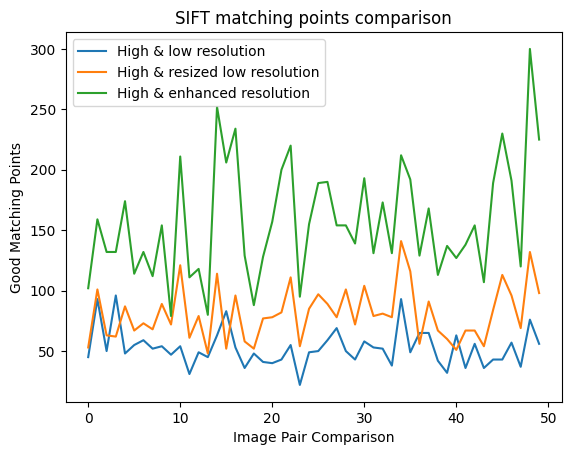

In [ ]:
import matplotlib.pyplot as plt

# Sample data for x-axis
x_values = list(range(50))


# Plotting the data
plt.plot(x_values, High_low_list, label='High & low resolution')
plt.plot(x_values, High_low256_list, label='High & resized low resolution')
plt.plot(x_values, High_Pred_list, label='High & enhanced resolution')

# Adding labels and title
plt.xlabel('Image Pair Comparison')
plt.ylabel('Good Matching Points')
plt.title('SIFT matching points comparison')

# Adding a legend
plt.legend()

# Display the plot
plt.show()

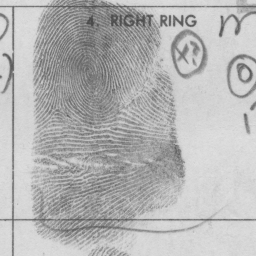

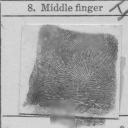

good_matches 8


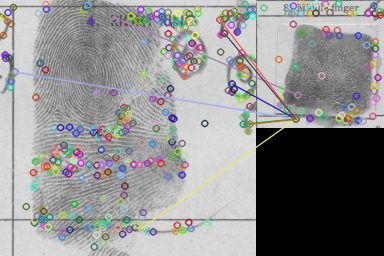

In [ ]:

from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.preprocessing.image import img_to_array

# Load the SRCNN model
#model = load_model('/content/drive/MyDrive/Model/SRCNN_NIST_Without_THR.h5', custom_objects={'pixel_mse_loss': pixel_mse_loss, 'PSNR': PSNR})

keypoint1List=[]
keypoint2List=[]
good_matchesList=[]
best_score=0
filename=None
image =None
kp1,kp2, mp= None, None, None

#file_list_high = os.listdir('/content/drive/MyDrive/Testing_Without_THR_SRCNN/High/')
#file_list_low = os.listdir('/content/drive/MyDrive/Roll_256_damage_final')



filepath='/content/drive/MyDrive/Testing_Without_THR_SRGAN/High/00001856_roll_500_04.png'
#cv2_imshow(filepath)
filepath_sample='/content/drive/MyDrive/Testing_Without_THR_SRGAN/128SizeImage/00001620_roll_500_08.png'
#cv2_imshow(filepath_sample)
sample_1=cv2.imread(filepath)
sample=cv2.imread(filepath_sample)
cv2_imshow(sample_1)
cv2_imshow(sample)
    #sample.resize(256,256)
    #print(filepath)
sift = cv2.SIFT_create()
keypoint1, descriptor1 = sift.detectAndCompute(sample_1, None)
keypoint2, descriptor2 = sift.detectAndCompute(sample, None)
    #print(f"keypoint1=>{len(keypoint1)}")
    #print(f"keypoint2=>{len(keypoint2)}")
            # FLANN parameters
flann_params = {
                'algorithm': 1,  # FLANN_INDEX_KDTREE
                'trees': 10
            }

            # Create FLANN matcher
flann = cv2.FlannBasedMatcher(flann_params, {})
            # Perform KNN matching
matches = flann.knnMatch(descriptor1, descriptor2, k=2)

                    # Filter good matches
good_matches = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
      good_matches.append(m)

            # Draw the matches
result_image = cv2.drawMatches(sample_1, keypoint1, sample, keypoint2, good_matches, None)
print("good_matches",len(good_matches))

            # Show the result
cv2_imshow(result_image)

  0%|          | 0/50 [00:00<?, ?it/s]

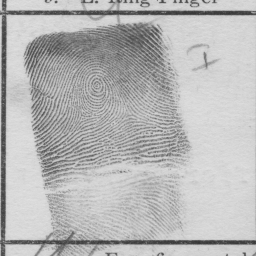

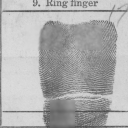

good_matches 5


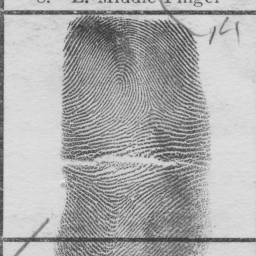

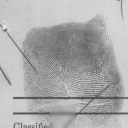

  4%|▍         | 2/50 [00:00<00:03, 15.57it/s]

good_matches 4


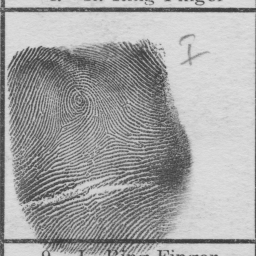

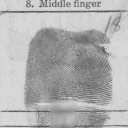

good_matches 1


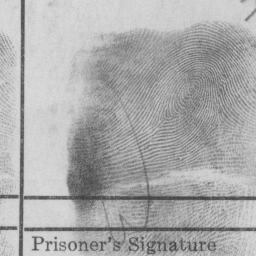

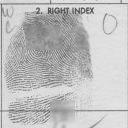

  8%|▊         | 4/50 [00:00<00:03, 14.95it/s]

good_matches 6


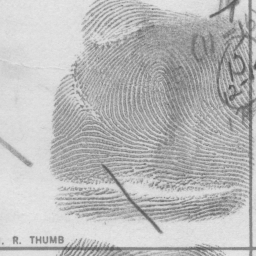

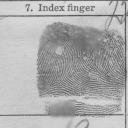

good_matches 8


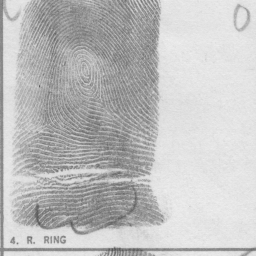

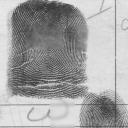

 12%|█▏        | 6/50 [00:00<00:03, 14.43it/s]

good_matches 4


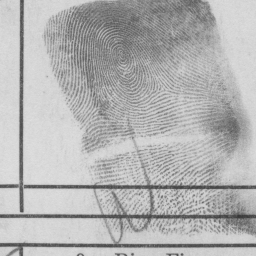

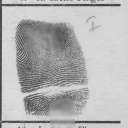

good_matches 41


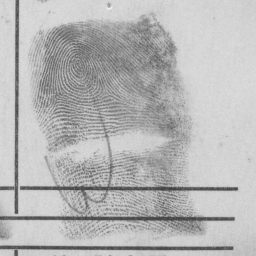

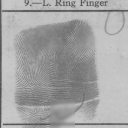

 16%|█▌        | 8/50 [00:00<00:02, 14.59it/s]

good_matches 6


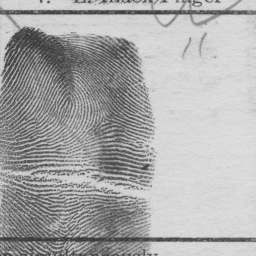

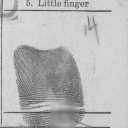

good_matches 14


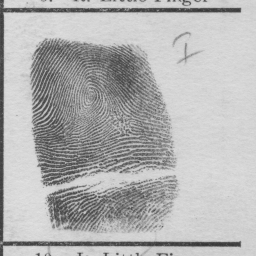

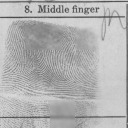

 20%|██        | 10/50 [00:00<00:02, 14.33it/s]

good_matches 7


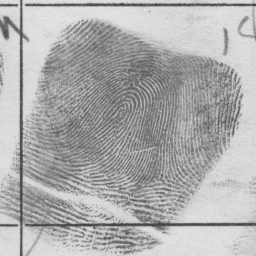

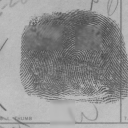

good_matches 5


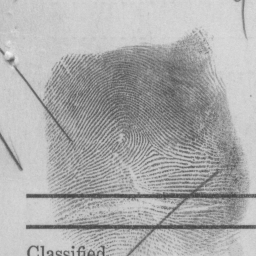

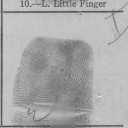

 24%|██▍       | 12/50 [00:00<00:02, 14.00it/s]

good_matches 59


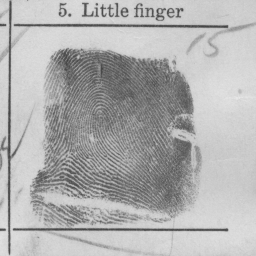

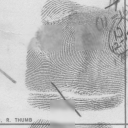

good_matches 18


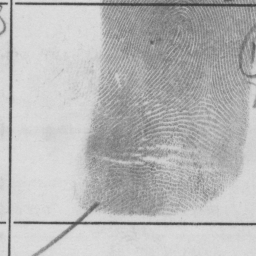

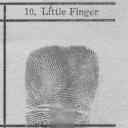

 28%|██▊       | 14/50 [00:00<00:02, 14.10it/s]

good_matches 3


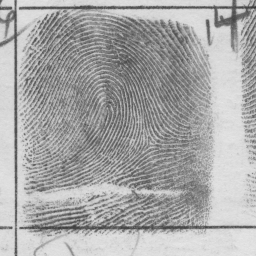

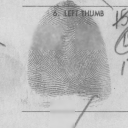

good_matches 28


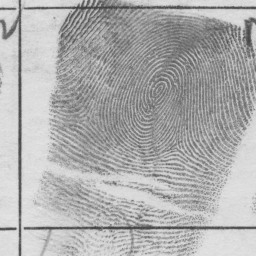

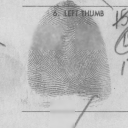

 32%|███▏      | 16/50 [00:01<00:02, 13.32it/s]

good_matches 55


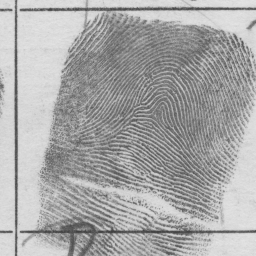

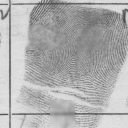

good_matches 59


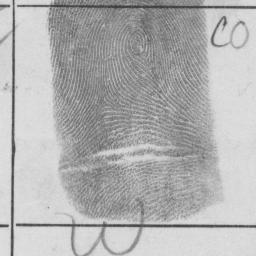

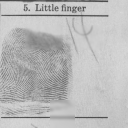

 36%|███▌      | 18/50 [00:01<00:02, 13.14it/s]

good_matches 12


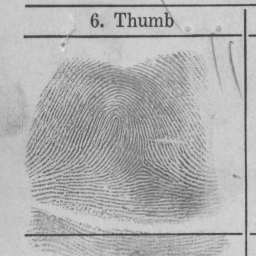

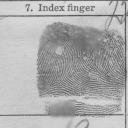

good_matches 2


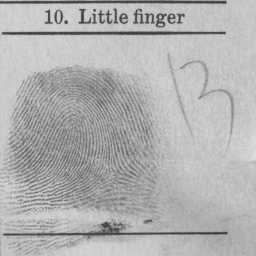

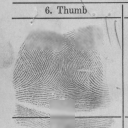

 40%|████      | 20/50 [00:01<00:02, 13.48it/s]

good_matches 15


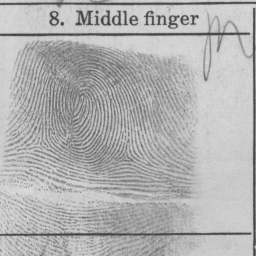

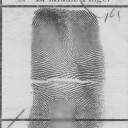

good_matches 16


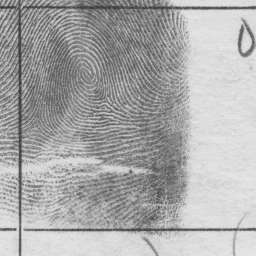

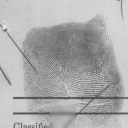

 44%|████▍     | 22/50 [00:01<00:02, 13.34it/s]

good_matches 5


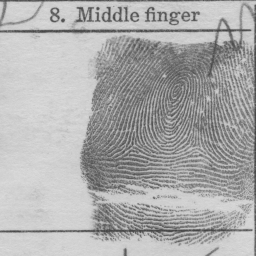

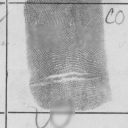

good_matches 2


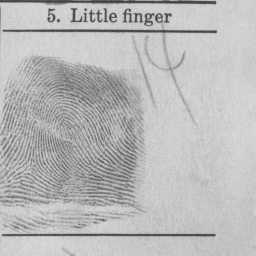

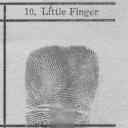

 48%|████▊     | 24/50 [00:01<00:01, 13.21it/s]

good_matches 9


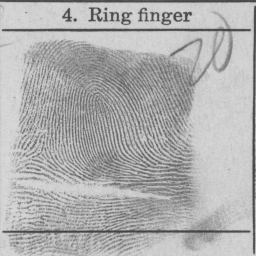

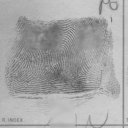

good_matches 2


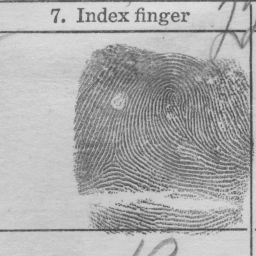

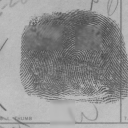

 52%|█████▏    | 26/50 [00:01<00:01, 13.00it/s]

good_matches 6


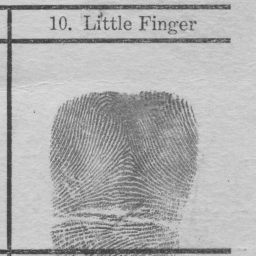

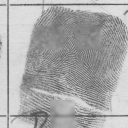

good_matches 3


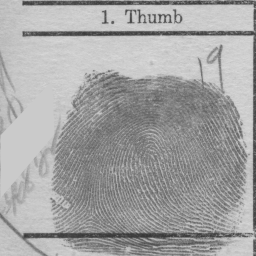

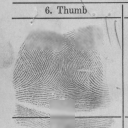

 56%|█████▌    | 28/50 [00:02<00:01, 13.30it/s]

good_matches 29


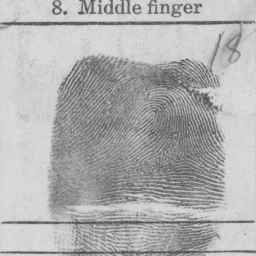

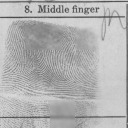

good_matches 12


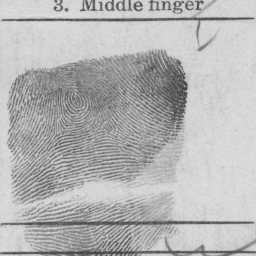

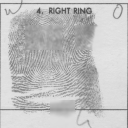

 60%|██████    | 30/50 [00:02<00:01, 13.38it/s]

good_matches 4


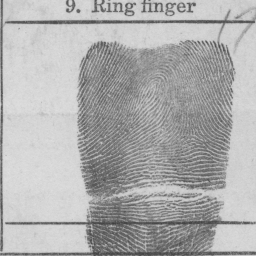

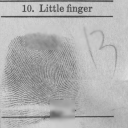

good_matches 12


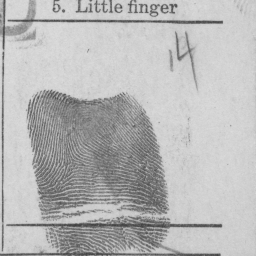

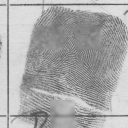

 64%|██████▍   | 32/50 [00:02<00:01, 13.69it/s]

good_matches 4


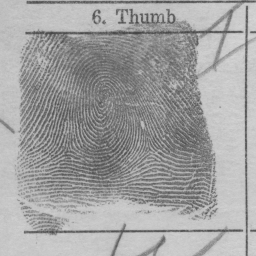

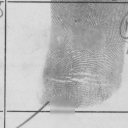

good_matches 27


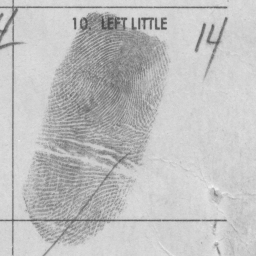

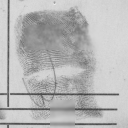

 68%|██████▊   | 34/50 [00:02<00:01, 13.81it/s]

good_matches 3


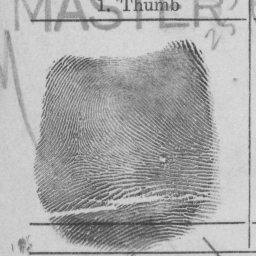

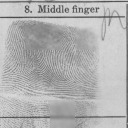

good_matches 4


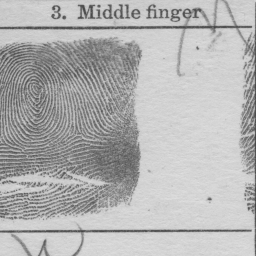

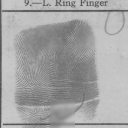

 72%|███████▏  | 36/50 [00:02<00:01, 13.90it/s]

good_matches 7


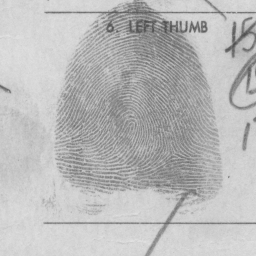

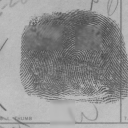

good_matches 2


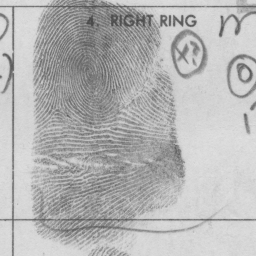

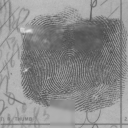

 76%|███████▌  | 38/50 [00:02<00:00, 14.29it/s]

good_matches 4


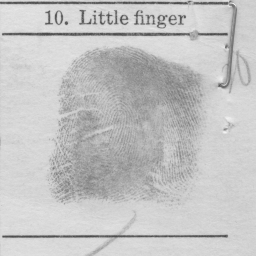

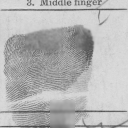

good_matches 5


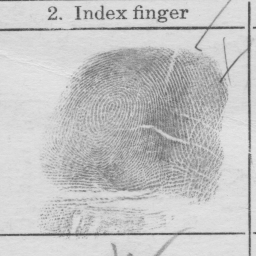

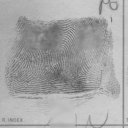

 80%|████████  | 40/50 [00:02<00:00, 14.46it/s]

good_matches 1


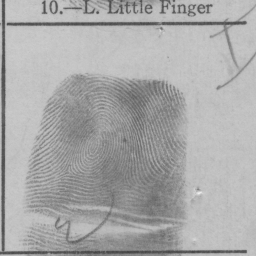

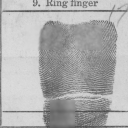

good_matches 0


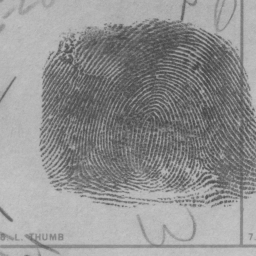

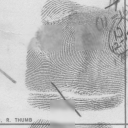

 84%|████████▍ | 42/50 [00:03<00:00, 14.10it/s]

good_matches 7


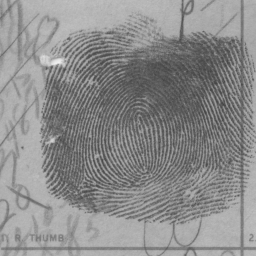

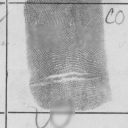

good_matches 7


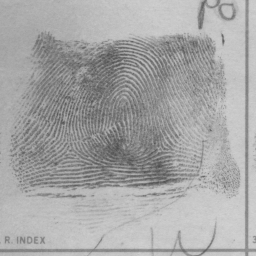

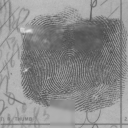

 88%|████████▊ | 44/50 [00:03<00:00, 13.44it/s]

good_matches 4


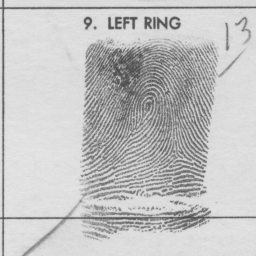

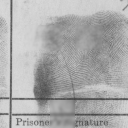

good_matches 9


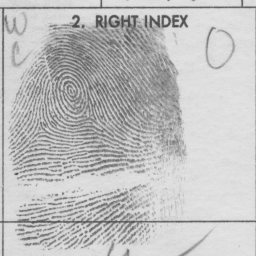

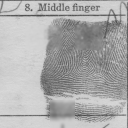

 92%|█████████▏| 46/50 [00:03<00:00, 13.08it/s]

good_matches 3


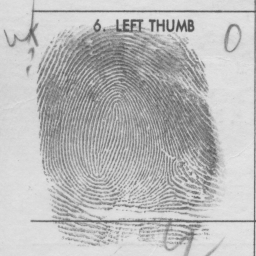

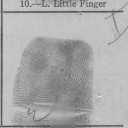

good_matches 15


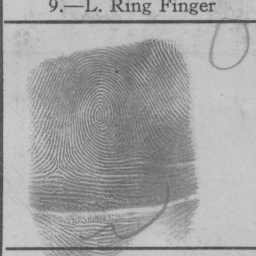

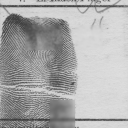

 96%|█████████▌| 48/50 [00:03<00:00, 13.35it/s]

good_matches 18


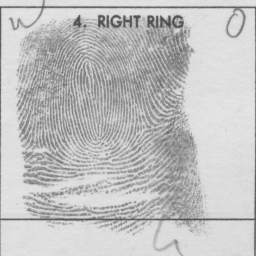

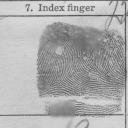

good_matches 2


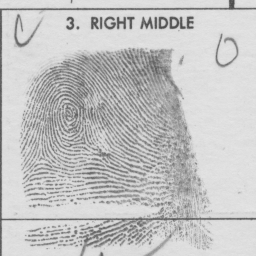

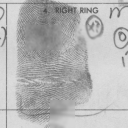

100%|██████████| 50/50 [00:03<00:00, 13.64it/s]

good_matches 7


In [ ]:

from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.preprocessing.image import img_to_array
import random
# Load the SRCNN model
#model = load_model('/content/drive/MyDrive/Model/SRCNN_NIST_Without_THR.h5', custom_objects={'pixel_mse_loss': pixel_mse_loss, 'PSNR': PSNR})

keypoint1List=[]
keypoint2List=[]
good_matchesList=[]
best_score=0
filename=None
image =None
kp1,kp2, mp= None, None, None

file_list_high = os.listdir('/content/drive/MyDrive/Testing_Without_THR_SRGAN/High/')
file_list_low = os.listdir('/content/drive/MyDrive/Testing_Without_THR_SRGAN/128SizeImage/')


for i in tqdm(range(len(file_list_high)-1)[:50]):
    filepath='/content/drive/MyDrive/Testing_Without_THR_SRGAN/High/'+file_list_high[i]
    random_number=i
    while random_number==i:
          random_number = random.randint(0,50)
    filepath_sample='/content/drive/MyDrive/Testing_Without_THR_SRGAN/128SizeImage/'+file_list_high[random_number]
    sample_1=cv2.imread(filepath)
    sample=cv2.imread(filepath_sample)
    cv2_imshow(sample_1)
    cv2_imshow(sample)
    #sample.resize(256,256)
    #print(filepath)
    sift = cv2.SIFT_create()
    keypoint1, descriptor1 = sift.detectAndCompute(sample_1, None)
    keypoint2, descriptor2 = sift.detectAndCompute(sample, None)
    #print(f"keypoint1=>{len(keypoint1)}")
    #print(f"keypoint2=>{len(keypoint2)}")
            # FLANN parameters
    flann_params = {
                'algorithm': 1,  # FLANN_INDEX_KDTREE
                'trees': 10
            }

            # Create FLANN matcher
    flann = cv2.FlannBasedMatcher(flann_params, {})
            # Perform KNN matching
    matches = flann.knnMatch(descriptor1, descriptor2, k=2)

                    # Filter good matches
    good_matches = []
    for m, n in matches:
        if m.distance < 0.7 * n.distance:
            good_matches.append(m)

            # Draw the matches
    result_image = cv2.drawMatches(sample_1, keypoint1, sample, keypoint2, good_matches, None)
    print("good_matches",len(good_matches))

            # Show the result
    #cv2_imshow(result_image)

    #keypoint1List.append(keypoint1)
    #keypoint2List.append(keypoint2)
    good_matchesList.append(good_matches)

In [ ]:
High_low_list_1=[]
for i in range(len(good_matchesList)):
    High_low_list_1.append(len(good_matchesList[i]))

In [ ]:
High_low_list_1

[5,
 4,
 1,
 6,
 8,
 4,
 41,
 6,
 14,
 7,
 5,
 59,
 18,
 3,
 28,
 55,
 59,
 12,
 2,
 15,
 16,
 5,
 2,
 9,
 2,
 6,
 3,
 29,
 12,
 4,
 12,
 4,
 27,
 3,
 4,
 7,
 2,
 4,
 5,
 1,
 0,
 7,
 7,
 4,
 9,
 3,
 15,
 18,
 2,
 7]

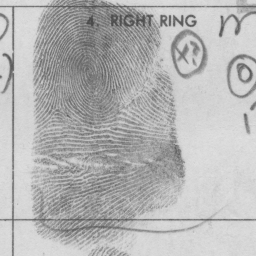

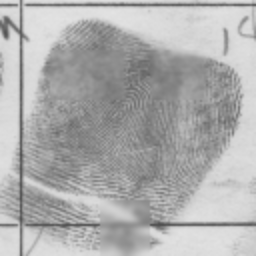

good_matches 13


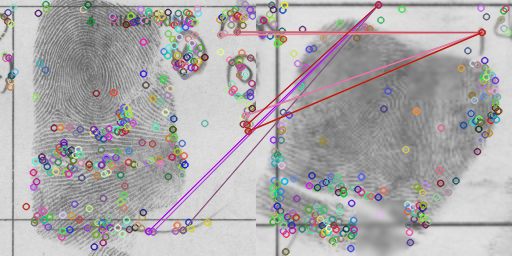

In [ ]:

from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.preprocessing.image import img_to_array

# Load the SRCNN model
#model = load_model('/content/drive/MyDrive/Model/SRCNN_NIST_Without_THR.h5', custom_objects={'pixel_mse_loss': pixel_mse_loss, 'PSNR': PSNR})

keypoint1List=[]
keypoint2List=[]
good_matchesList=[]
best_score=0
filename=None
image =None
kp1,kp2, mp= None, None, None

#file_list_high = os.listdir('/content/drive/MyDrive/Testing_Without_THR_SRCNN/High/')
#file_list_low = os.listdir('/content/drive/MyDrive/Roll_256_damage_final')



filepath='/content/drive/MyDrive/Testing_Without_THR_SRGAN/High/00001856_roll_500_04.png'
#cv2_imshow(filepath)
filepath_sample='/content/drive/MyDrive/Testing_Without_THR_SRGAN/Low/00001862_roll_500_09.png'
#cv2_imshow(filepath_sample)
sample_1=cv2.imread(filepath)
sample=cv2.imread(filepath_sample)
sample = cv2.resize(sample, (256,256))
cv2_imshow(sample_1)
cv2_imshow(sample)
    #sample.resize(256,256)
    #print(filepath)
sift = cv2.SIFT_create()
keypoint1, descriptor1 = sift.detectAndCompute(sample_1, None)
keypoint2, descriptor2 = sift.detectAndCompute(sample, None)
    #print(f"keypoint1=>{len(keypoint1)}")
    #print(f"keypoint2=>{len(keypoint2)}")
            # FLANN parameters
flann_params = {
                'algorithm': 1,  # FLANN_INDEX_KDTREE
                'trees': 10
            }

            # Create FLANN matcher
flann = cv2.FlannBasedMatcher(flann_params, {})
            # Perform KNN matching
matches = flann.knnMatch(descriptor1, descriptor2, k=2)

                    # Filter good matches
good_matches = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
      good_matches.append(m)

            # Draw the matches
result_image = cv2.drawMatches(sample_1, keypoint1, sample, keypoint2, good_matches, None)
print("good_matches",len(good_matches))

            # Show the result
cv2_imshow(result_image)

In [ ]:

from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.preprocessing.image import img_to_array
import random
# Load the SRCNN model
#model = load_model('/content/drive/MyDrive/Model/SRCNN_NIST_Without_THR.h5', custom_objects={'pixel_mse_loss': pixel_mse_loss, 'PSNR': PSNR})

keypoint1List=[]
keypoint2List=[]
good_matchesList=[]
best_score=0
filename=None
image =None
kp1,kp2, mp= None, None, None

file_list_high = os.listdir('/content/drive/MyDrive/Testing_Without_THR_SRGAN/High/')
file_list_low = os.listdir('/content/drive/MyDrive/Testing_Without_THR_SRGAN/Low/')


for i in tqdm(range(len(file_list_high)-1)[:50]):
    filepath='/content/drive/MyDrive/Testing_Without_THR_SRGAN/High/'+file_list_high[i]
    random_number=i
    while random_number==i:
          random_number = random.randint(0,50)
    filepath_sample='/content/drive/MyDrive/Testing_Without_THR_SRGAN/Low/'+file_list_high[random_number]
    sample_1=cv2.imread(filepath)
    sample=cv2.imread(filepath_sample)
    sample = cv2.resize(sample, (256,256))
    #cv2_imshow(sample_1)
    #cv2_imshow(sample)
    #sample.resize(256,256)
    #print(filepath)
    sift = cv2.SIFT_create()
    keypoint1, descriptor1 = sift.detectAndCompute(sample_1, None)
    keypoint2, descriptor2 = sift.detectAndCompute(sample, None)
    #print(f"keypoint1=>{len(keypoint1)}")
    #print(f"keypoint2=>{len(keypoint2)}")
            # FLANN parameters
    flann_params = {
                'algorithm': 1,  # FLANN_INDEX_KDTREE
                'trees': 10
            }

            # Create FLANN matcher
    flann = cv2.FlannBasedMatcher(flann_params, {})
            # Perform KNN matching
    matches = flann.knnMatch(descriptor1, descriptor2, k=2)

                    # Filter good matches
    good_matches = []
    for m, n in matches:
        if m.distance < 0.7 * n.distance:
            good_matches.append(m)

            # Draw the matches
    result_image = cv2.drawMatches(sample_1, keypoint1, sample, keypoint2, good_matches, None)
    print("good_matches",len(good_matches))

            # Show the result
    #cv2_imshow(result_image)

    #keypoint1List.append(keypoint1)
    #keypoint2List.append(keypoint2)
    good_matchesList.append(good_matches)

  4%|▍         | 2/50 [00:00<00:02, 19.12it/s]

good_matches 13
good_matches 7
good_matches 2
good_matches 11


 16%|█▌        | 8/50 [00:00<00:02, 20.18it/s]

good_matches 4
good_matches 8
good_matches 11
good_matches 17
good_matches 6


 28%|██▊       | 14/50 [00:00<00:01, 20.89it/s]

good_matches 13
good_matches 17
good_matches 4
good_matches 10
good_matches 37


 34%|███▍      | 17/50 [00:00<00:01, 19.85it/s]

good_matches 12
good_matches 8
good_matches 3
good_matches 12
good_matches 2


 46%|████▌     | 23/50 [00:01<00:01, 19.74it/s]

good_matches 16
good_matches 5
good_matches 34
good_matches 23


 52%|█████▏    | 26/50 [00:01<00:01, 19.96it/s]

good_matches 2
good_matches 21
good_matches 8
good_matches 37
good_matches 8


 64%|██████▍   | 32/50 [00:01<00:00, 20.62it/s]

good_matches 23
good_matches 6
good_matches 44
good_matches 8
good_matches 30


 76%|███████▌  | 38/50 [00:01<00:00, 20.97it/s]

good_matches 2
good_matches 12
good_matches 17
good_matches 5
good_matches 5


 82%|████████▏ | 41/50 [00:02<00:00, 21.05it/s]

good_matches 4
good_matches 4
good_matches 13
good_matches 4
good_matches 4


 94%|█████████▍| 47/50 [00:02<00:00, 20.64it/s]

good_matches 11
good_matches 3
good_matches 8
good_matches 3
good_matches 7


100%|██████████| 50/50 [00:02<00:00, 20.35it/s]

good_matches 5
good_matches 3


In [ ]:
High_low256_list_1=[]
for i in range(len(good_matchesList)):
    High_low256_list_1.append(len(good_matchesList[i]))

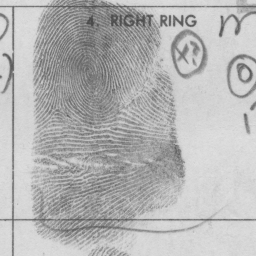

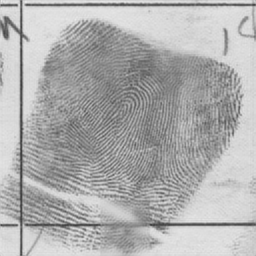

good_matches 8


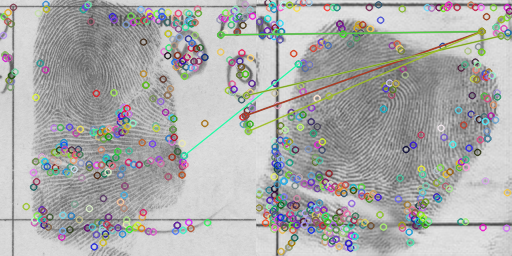

In [ ]:

from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.preprocessing.image import img_to_array

# Load the SRCNN model
#model = load_model('/content/drive/MyDrive/Model/SRCNN_NIST_Without_THR.h5', custom_objects={'pixel_mse_loss': pixel_mse_loss, 'PSNR': PSNR})

keypoint1List=[]
keypoint2List=[]
good_matchesList=[]
best_score=0
filename=None
image =None
kp1,kp2, mp= None, None, None

#file_list_high = os.listdir('/content/drive/MyDrive/Testing_Without_THR_SRCNN/High/')
#file_list_low = os.listdir('/content/drive/MyDrive/Roll_256_damage_final')



filepath='/content/drive/MyDrive/Testing_Without_THR_SRGAN/High/00001856_roll_500_04.png'
#cv2_imshow(filepath)
filepath_sample='/content/drive/MyDrive/Testing_Without_THR_SRGAN/Pred/00001862_roll_500_09.png'
#cv2_imshow(filepath_sample)
sample_1=cv2.imread(filepath)
sample=cv2.imread(filepath_sample)
#sample = cv2.resize(sample, (256,256))
cv2_imshow(sample_1)
cv2_imshow(sample)
    #sample.resize(256,256)
    #print(filepath)
sift = cv2.SIFT_create()
keypoint1, descriptor1 = sift.detectAndCompute(sample_1, None)
keypoint2, descriptor2 = sift.detectAndCompute(sample, None)
    #print(f"keypoint1=>{len(keypoint1)}")
    #print(f"keypoint2=>{len(keypoint2)}")
            # FLANN parameters
flann_params = {
                'algorithm': 1,  # FLANN_INDEX_KDTREE
                'trees': 10
            }

            # Create FLANN matcher
flann = cv2.FlannBasedMatcher(flann_params, {})
            # Perform KNN matching
matches = flann.knnMatch(descriptor1, descriptor2, k=2)

                    # Filter good matches
good_matches = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
      good_matches.append(m)

            # Draw the matches
result_image = cv2.drawMatches(sample_1, keypoint1, sample, keypoint2, good_matches, None)
print("good_matches",len(good_matches))

            # Show the result
cv2_imshow(result_image)

In [ ]:
from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.preprocessing.image import img_to_array
import random
# Load the SRCNN model
#model = load_model('/content/drive/MyDrive/Model/SRCNN_NIST_Without_THR.h5', custom_objects={'pixel_mse_loss': pixel_mse_loss, 'PSNR': PSNR})

keypoint1List=[]
keypoint2List=[]
good_matchesList=[]
best_score=0
filename=None
image =None
kp1,kp2, mp= None, None, None

file_list_high = os.listdir('/content/drive/MyDrive/Testing_Without_THR_SRGAN/High/')
file_list_low = os.listdir('/content/drive/MyDrive/Testing_Without_THR_SRGAN/Pred/')


for i in tqdm(range(len(file_list_high)-1)[:50]):
    filepath='/content/drive/MyDrive/Testing_Without_THR_SRGAN/High/'+file_list_high[i]
    random_number=i
    while random_number==i:
          random_number = random.randint(0,50)
    filepath_sample='/content/drive/MyDrive/Testing_Without_THR_SRGAN/Pred/'+file_list_high[random_number]
    sample_1=cv2.imread(filepath)
    sample=cv2.imread(filepath_sample)
    #sample = cv2.resize(sample, (256,256))
    #cv2_imshow(sample_1)
    #cv2_imshow(sample)
    #sample.resize(256,256)
    #print(filepath)
    sift = cv2.SIFT_create()
    keypoint1, descriptor1 = sift.detectAndCompute(sample_1, None)
    keypoint2, descriptor2 = sift.detectAndCompute(sample, None)
    #print(f"keypoint1=>{len(keypoint1)}")
    #print(f"keypoint2=>{len(keypoint2)}")
            # FLANN parameters
    flann_params = {
                'algorithm': 1,  # FLANN_INDEX_KDTREE
                'trees': 10
            }

            # Create FLANN matcher
    flann = cv2.FlannBasedMatcher(flann_params, {})
            # Perform KNN matching
    matches = flann.knnMatch(descriptor1, descriptor2, k=2)

                    # Filter good matches
    good_matches = []
    for m, n in matches:
        if m.distance < 0.7 * n.distance:
            good_matches.append(m)

            # Draw the matches
    result_image = cv2.drawMatches(sample_1, keypoint1, sample, keypoint2, good_matches, None)
    print("good_matches",len(good_matches))

            # Show the result
    #cv2_imshow(result_image)

    #keypoint1List.append(keypoint1)
    #keypoint2List.append(keypoint2)
    good_matchesList.append(good_matches)

  8%|▊         | 4/50 [00:00<00:02, 18.12it/s]

good_matches 1
good_matches 2
good_matches 1
good_matches 9


 16%|█▌        | 8/50 [00:00<00:02, 18.22it/s]

good_matches 4
good_matches 5
good_matches 4
good_matches 15


 22%|██▏       | 11/50 [00:00<00:02, 18.48it/s]

good_matches 3
good_matches 3
good_matches 8
good_matches 2


 30%|███       | 15/50 [00:00<00:01, 18.84it/s]

good_matches 12
good_matches 7
good_matches 8
good_matches 20


 38%|███▊      | 19/50 [00:01<00:01, 18.40it/s]

good_matches 9
good_matches 5
good_matches 17
good_matches 21


 46%|████▌     | 23/50 [00:01<00:01, 17.99it/s]

good_matches 7
good_matches 5
good_matches 18
good_matches 6


 54%|█████▍    | 27/50 [00:01<00:01, 18.04it/s]

good_matches 2
good_matches 4
good_matches 4
good_matches 9


 64%|██████▍   | 32/50 [00:01<00:00, 19.23it/s]

good_matches 35
good_matches 1
good_matches 7
good_matches 22


 72%|███████▏  | 36/50 [00:01<00:00, 19.07it/s]

good_matches 7
good_matches 8
good_matches 2
good_matches 7
good_matches 4


 84%|████████▍ | 42/50 [00:02<00:00, 19.88it/s]

good_matches 4
good_matches 11
good_matches 5
good_matches 9
good_matches 0


 92%|█████████▏| 46/50 [00:02<00:00, 19.57it/s]

good_matches 4
good_matches 7
good_matches 6
good_matches 5


100%|██████████| 50/50 [00:02<00:00, 18.89it/s]

good_matches 3
good_matches 2
good_matches 8
good_matches 3


In [ ]:
High_Pred_list_1=[]
for i in range(len(good_matchesList)):
    High_Pred_list_1.append(len(good_matchesList[i]))

In [ ]:
High_Pred_list_1

[1,
 2,
 1,
 9,
 4,
 5,
 4,
 15,
 3,
 3,
 8,
 2,
 12,
 7,
 8,
 20,
 9,
 5,
 17,
 21,
 7,
 5,
 18,
 6,
 2,
 4,
 4,
 9,
 35,
 1,
 7,
 22,
 7,
 8,
 2,
 7,
 4,
 4,
 11,
 5,
 9,
 0,
 4,
 7,
 6,
 5,
 3,
 2,
 8,
 3]

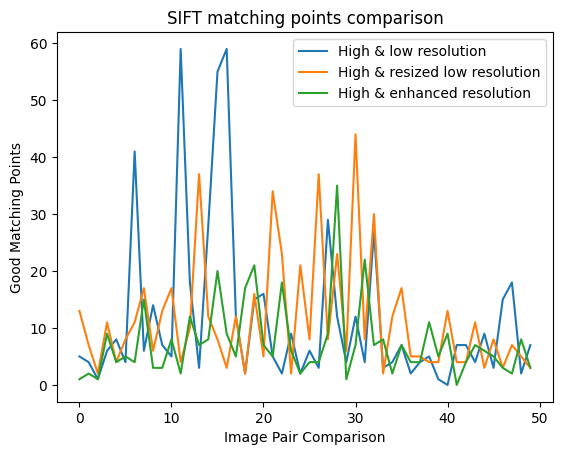

In [ ]:
import matplotlib.pyplot as plt

# Sample data for x-axis
x_values = list(range(50))


# Plotting the data
plt.plot(x_values, High_low_list_1, label='High & low resolution')
plt.plot(x_values, High_low256_list_1, label='High & resized low resolution')
plt.plot(x_values, High_Pred_list_1, label='High & enhanced resolution')

# Adding labels and title
plt.xlabel('Image Pair Comparison')
plt.ylabel('Good Matching Points')
plt.title('SIFT matching points comparison')

# Adding a legend
plt.legend()

# Display the plot
plt.show()